In [4]:
!pip install datasets

In [5]:
import datasets

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from datasets import load_dataset
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tqdm import tqdm
from collections import Counter

# Check device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device} 🎉")

# Check library versions
print(f"Torch version: {torch.__version__}")
print(f"Datasets version: {datasets.__version__}")

Using device: cuda 🎉
Torch version: 2.7.0+cu126
Datasets version: 3.6.0


Training set size: 25000
Test set size: 25000
Sample training example: {'text': 'I rented I AM CURIOUS-YELLOW from my video store because of all the controversy that surrounded it when it was first released in 1967. I also heard that at first it was seized by U.S. customs if it ever tried to enter this country, therefore being a fan of films considered "controversial" I really had to see this for myself.<br /><br />The plot is centered around a young Swedish drama student named Lena who wants to learn everything she can about life. In particular she wants to focus her attentions to making some sort of documentary on what the average Swede thought about certain political issues such as the Vietnam War and race issues in the United States. In between asking politicians and ordinary denizens of Stockholm about their opinions on politics, she has sex with her drama teacher, classmates, and married men.<br /><br />What kills me about I AM CURIOUS-YELLOW is that 40 years ago, this was consid

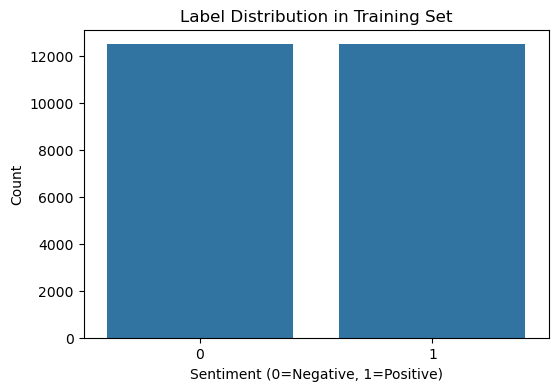

Vocabulary size: 251639 🧠


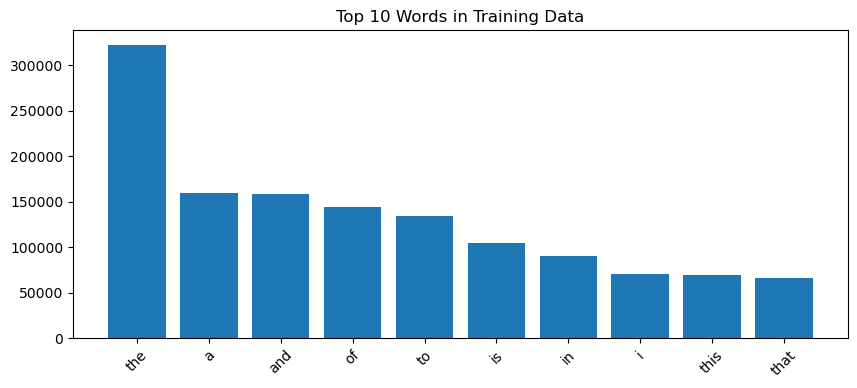

Train X shape: torch.Size([25000, 500]) (expected: [25000, 500])
Train Y shape: torch.Size([25000]) (expected: [25000])
Test X shape: torch.Size([25000, 500]) (expected: [25000, 500])
Test Y shape: torch.Size([25000]) (expected: [25000])


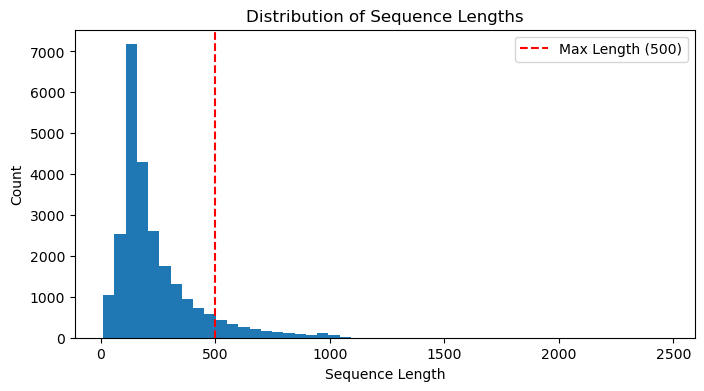

Sample batch - X shape: torch.Size([32, 500]), Y shape: torch.Size([32])


In [8]:
# Load dataset
dataset = load_dataset("stanfordnlp/imdb")
train_data = dataset["train"]
test_data = dataset["test"]

# Check: Dataset sizes
print(f"Training set size: {len(train_data)}")
print(f"Test set size: {len(test_data)}")
print("Sample training example:", train_data[0])

# Visualization: Label distribution
train_labels = [example["label"] for example in train_data]
plt.figure(figsize=(6, 4))
sns.countplot(x=train_labels)
plt.title("Label Distribution in Training Set")
plt.xlabel("Sentiment (0=Negative, 1=Positive)")
plt.ylabel("Count")
plt.show()

# Tokenization function
def tokenize(text):
    return text.lower().split()  # Simple whitespace tokenization

# Build vocabulary
special_tokens = ["<PAD>", "<UNK>"]
vocabulary = set(special_tokens)
for example in train_data:
    vocabulary.update(tokenize(example["text"]))
vocabulary = list(vocabulary)
word_to_index = {word: idx for idx, word in enumerate(vocabulary)}
index_to_word = {idx: word for word, idx in word_to_index.items()}
vocab_size = len(vocabulary)

# Visualization: Vocabulary size and top words
print(f"Vocabulary size: {vocab_size} 🧠")
all_words = []
for example in train_data:
    all_words.extend(tokenize(example["text"]))
word_counts = Counter(all_words)
top_words = word_counts.most_common(10)
words, counts = zip(*top_words)
plt.figure(figsize=(10, 4))
plt.bar(words, counts)
plt.title("Top 10 Words in Training Data")
plt.xticks(rotation=45)
plt.show()

# Convert text to sequences and pad
max_length = 500
def text_to_sequence(text):
    return [word_to_index.get(token, word_to_index["<UNK>"]) for token in tokenize(text)]

def pad_sequence(seq, max_len):
    return seq[:max_len] + [word_to_index["<PAD>"]] * (max_len - len(seq)) if len(seq) < max_len else seq[:max_len]

train_sequences = [text_to_sequence(example["text"]) for example in train_data]
test_sequences = [text_to_sequence(example["text"]) for example in test_data]
train_padded = [pad_sequence(seq, max_length) for seq in train_sequences]
test_padded = [pad_sequence(seq, max_length) for seq in test_sequences]
train_labels = [example["label"] for example in train_data]
test_labels = [example["label"] for example in test_data]

# Convert to tensors
train_x = torch.tensor(train_padded, dtype=torch.long).to(device)
train_y = torch.tensor(train_labels, dtype=torch.long).to(device)
test_x = torch.tensor(test_padded, dtype=torch.long).to(device)
test_y = torch.tensor(test_labels, dtype=torch.long).to(device)

# Check: Tensor shapes
print(f"Train X shape: {train_x.shape} (expected: [25000, 500])")
print(f"Train Y shape: {train_y.shape} (expected: [25000])")
print(f"Test X shape: {test_x.shape} (expected: [25000, 500])")
print(f"Test Y shape: {test_y.shape} (expected: [25000])")

# Visualization: Sequence length distribution
seq_lengths = [len(text_to_sequence(example["text"])) for example in train_data]
plt.figure(figsize=(8, 4))
plt.hist(seq_lengths, bins=50)
plt.title("Distribution of Sequence Lengths")
plt.xlabel("Sequence Length")
plt.ylabel("Count")
plt.axvline(max_length, color="red", linestyle="--", label="Max Length (500)")
plt.legend()
plt.show()

# Create DataLoaders
batch_size = 32
train_dataset = TensorDataset(train_x, train_y)
test_dataset = TensorDataset(test_x, test_y)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Check: Sample batch
for x, y in train_loader:
    print(f"Sample batch - X shape: {x.shape}, Y shape: {y.shape}")
    break

Bahdanau - Context shape: torch.Size([2, 128]), Weights shape: torch.Size([2, 10])


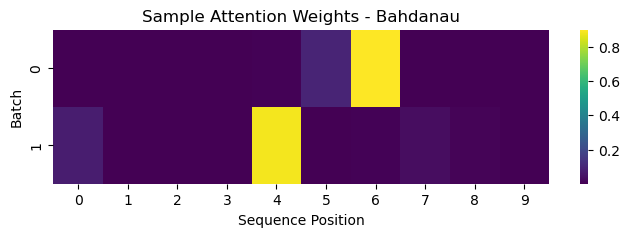

Luong Dot - Context shape: torch.Size([2, 128]), Weights shape: torch.Size([2, 10])


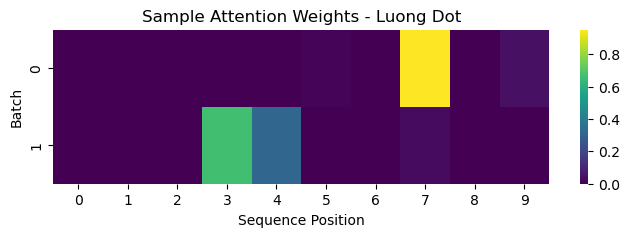

Luong General - Context shape: torch.Size([2, 128]), Weights shape: torch.Size([2, 10])


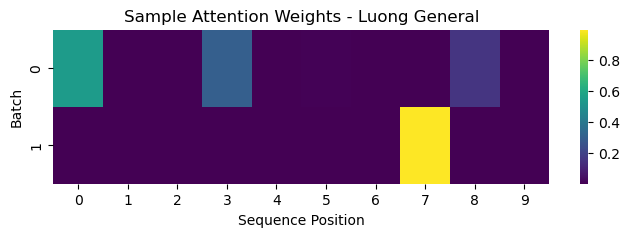

Luong Concat - Context shape: torch.Size([2, 128]), Weights shape: torch.Size([2, 10])


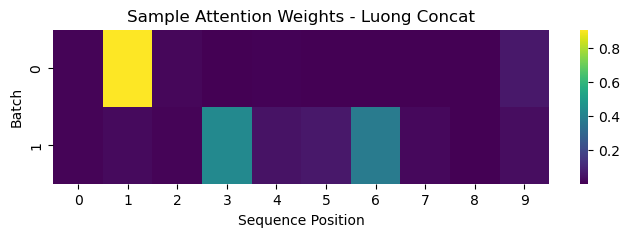

In [9]:
class BahdanauAttention(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.W_a = nn.Linear(2 * hidden_dim, hidden_dim)
        self.v_a = nn.Parameter(torch.randn(hidden_dim))

    def forward(self, encoder_outputs, query):
        batch_size, seq_len, enc_dim = encoder_outputs.size()
        query_dim = query.size(-1)
        assert enc_dim == query_dim, f"Encoder dim {enc_dim} must match query dim {query_dim}"
        query_expanded = query.unsqueeze(1).expand(batch_size, seq_len, query_dim)
        combined = torch.cat((encoder_outputs, query_expanded), dim=2)
        scores = torch.tanh(self.W_a(combined))
        attention_scores = torch.matmul(scores, self.v_a)
        attention_weights = F.softmax(attention_scores, dim=1)
        context = torch.bmm(attention_weights.unsqueeze(1), encoder_outputs).squeeze(1)
        return context, attention_weights

class LuongDotAttention(nn.Module):
    def forward(self, encoder_outputs, query):
        batch_size, seq_len, enc_dim = encoder_outputs.size()
        scores = torch.bmm(query.unsqueeze(1), encoder_outputs.transpose(1, 2)).squeeze(1)
        attention_weights = F.softmax(scores, dim=1)
        context = torch.bmm(attention_weights.unsqueeze(1), encoder_outputs).squeeze(1)
        return context, attention_weights

class LuongGeneralAttention(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.W_a = nn.Linear(hidden_dim, hidden_dim, bias=False)

    def forward(self, encoder_outputs, query):
        batch_size, seq_len, enc_dim = encoder_outputs.size()
        transformed = self.W_a(encoder_outputs)
        scores = torch.bmm(query.unsqueeze(1), transformed.transpose(1, 2)).squeeze(1)
        attention_weights = F.softmax(scores, dim=1)
        context = torch.bmm(attention_weights.unsqueeze(1), encoder_outputs).squeeze(1)
        return context, attention_weights

class LuongConcatAttention(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.W_a = nn.Linear(2 * hidden_dim, hidden_dim)
        self.v_a = nn.Parameter(torch.randn(hidden_dim))

    def forward(self, encoder_outputs, query):
        batch_size, seq_len, enc_dim = encoder_outputs.size()
        query_expanded = query.unsqueeze(1).expand(batch_size, seq_len, enc_dim)
        combined = torch.cat((encoder_outputs, query_expanded), dim=2)
        scores = torch.tanh(self.W_a(combined))
        attention_scores = torch.matmul(scores, self.v_a)
        attention_weights = F.softmax(attention_scores, dim=1)
        context = torch.bmm(attention_weights.unsqueeze(1), encoder_outputs).squeeze(1)
        return context, attention_weights

# Test attention mechanisms
dummy_encoder = torch.randn(2, 10, 128).to(device)
dummy_query = torch.randn(2, 128).to(device)
for attn_name, attn in [
    ("Bahdanau", BahdanauAttention(128)),
    ("Luong Dot", LuongDotAttention()),
    ("Luong General", LuongGeneralAttention(128)),
    ("Luong Concat", LuongConcatAttention(128))
]:
    attn = attn.to(device)
    context, weights = attn(dummy_encoder, dummy_query)
    print(f"{attn_name} - Context shape: {context.shape}, Weights shape: {weights.shape}")
    plt.figure(figsize=(8, 2))
    sns.heatmap(weights.cpu().detach().numpy(), cmap="viridis")
    plt.title(f"Sample Attention Weights - {attn_name}")
    plt.xlabel("Sequence Position")
    plt.ylabel("Batch")
    plt.show()

In [10]:
class RNNModel(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.rnn = nn.RNN(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        _, hidden = self.rnn(embedded)
        return self.fc(hidden[-1])

class RNNWithAttention(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, attention_type="bahdanau"):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.rnn = nn.RNN(embedding_dim, hidden_dim, batch_first=True)
        if attention_type == "bahdanau":
            self.attention = BahdanauAttention(hidden_dim)
        elif attention_type == "luong_dot":
            self.attention = LuongDotAttention()
        elif attention_type == "luong_general":
            self.attention = LuongGeneralAttention(hidden_dim)
        elif attention_type == "luong_concat":
            self.attention = LuongConcatAttention(hidden_dim)
        else:
            raise ValueError("Unknown attention type")
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        output, hidden = self.rnn(embedded)
        context, attention_weights = self.attention(output, hidden[-1])
        return self.fc(context), attention_weights

class LSTMModel(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        _, (hidden, _) = self.lstm(embedded)
        return self.fc(hidden[-1])

class LSTMWithAttention(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, attention_type="bahdanau"):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        if attention_type == "bahdanau":
            self.attention = BahdanauAttention(hidden_dim)
        elif attention_type == "luong_dot":
            self.attention = LuongDotAttention()
        elif attention_type == "luong_general":
            self.attention = LuongGeneralAttention(hidden_dim)
        elif attention_type == "luong_concat":
            self.attention = LuongConcatAttention(hidden_dim)
        else:
            raise ValueError("Unknown attention type")
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        output, (hidden, _) = self.lstm(embedded)
        context, attention_weights = self.attention(output, hidden[-1])
        return self.fc(context), attention_weights

class BidirectionalRNNModel(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.rnn = nn.RNN(embedding_dim, hidden_dim, batch_first=True, bidirectional=True)
        self.fc = nn.Linear(2 * hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        output, _ = self.rnn(embedded)
        forward_last = output[:, -1, :self.hidden_dim]
        backward_first = output[:, 0, self.hidden_dim:]
        hidden = torch.cat((forward_last, backward_first), dim=1)
        return self.fc(hidden)

class BidirectionalRNNWithAttention(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, attention_type="bahdanau"):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.rnn = nn.RNN(embedding_dim, hidden_dim, batch_first=True, bidirectional=True)
        if attention_type == "bahdanau":
            self.attention = BahdanauAttention(2 * hidden_dim)
        elif attention_type == "luong_dot":
            self.attention = LuongDotAttention()
        elif attention_type == "luong_general":
            self.attention = LuongGeneralAttention(2 * hidden_dim)
        elif attention_type == "luong_concat":
            self.attention = LuongConcatAttention(2 * hidden_dim)
        else:
            raise ValueError("Unknown attention type")
        self.fc = nn.Linear(2 * hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        output, _ = self.rnn(embedded)
        forward_last = output[:, -1, :self.hidden_dim]
        backward_first = output[:, 0, self.hidden_dim:]
        query = torch.cat((forward_last, backward_first), dim=1)
        context, attention_weights = self.attention(output, query)
        return self.fc(context), attention_weights

class BidirectionalLSTMModel(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True, bidirectional=True)
        self.fc = nn.Linear(2 * hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        output, _ = self.lstm(embedded)
        forward_last = output[:, -1, :self.hidden_dim]
        backward_first = output[:, 0, self.hidden_dim:]
        hidden = torch.cat((forward_last, backward_first), dim=1)
        return self.fc(hidden)

class BidirectionalLSTMWithAttention(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, attention_type="bahdanau"):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True, bidirectional=True)
        if attention_type == "bahdanau":
            self.attention = BahdanauAttention(2 * hidden_dim)
        elif attention_type == "luong_dot":
            self.attention = LuongDotAttention()
        elif attention_type == "luong_general":
            self.attention = LuongGeneralAttention(2 * hidden_dim)
        elif attention_type == "luong_concat":
            self.attention = LuongConcatAttention(2 * hidden_dim)
        else:
            raise ValueError("Unknown attention type")
        self.fc = nn.Linear(2 * hidden_dim, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        output, _ = self.lstm(embedded)
        forward_last = output[:, -1, :self.hidden_dim]
        backward_first = output[:, 0, self.hidden_dim:]
        query = torch.cat((forward_last, backward_first), dim=1)
        context, attention_weights = self.attention(output, query)
        return self.fc(context), attention_weights

# Check: Model parameter counts
for name, model in [
    ("RNN", RNNModel(vocab_size, 100, 128, 1)),
    ("LSTM", LSTMModel(vocab_size, 100, 128, 1)),
    ("BiRNN", BidirectionalRNNModel(vocab_size, 100, 128, 1)),
    ("BiLSTM", BidirectionalLSTMModel(vocab_size, 100, 128, 1))
]:
    print(f"{name} parameters: {sum(p.numel() for p in model.parameters())}")

RNN parameters: 25193469
LSTM parameters: 25281789
BiRNN parameters: 25223037
BiLSTM parameters: 25399677


In [26]:
def train_evaluate(model, name, epochs=5, lr=0.001):
    model = model.to(device)
    loss_fn = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    train_losses = []
    grad_norms = []

    # Check if model is attention-based
    is_attention_model = any(suffix in name for suffix in ["Bahdanau", "Dot", "General", "Concat"])

    # Training
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for x, y in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            output = model(x)
            print(f"Model: {name}, Raw output type: {type(output)}")
            attention_weights = None
            if is_attention_model:
                if not isinstance(output, tuple):
                    raise ValueError(f"Expected tuple output for {name}, got {type(output)}")
                output_tensor, attention_weights = output
            else:
                if isinstance(output, tuple):
                    raise ValueError(f"Expected tensor output for {name}, got tuple")
                output_tensor = output
            print(f"Model: {name}, Output tensor type: {type(output_tensor)}, shape: {output_tensor.shape}")
            loss = loss_fn(output_tensor.squeeze(-1), y.float())
            loss.backward()
            grad_norm = sum(p.grad.norm().item() for p in model.parameters() if p.grad is not None)
            grad_norms.append(grad_norm)
            optimizer.step()
            epoch_loss += loss.item()
        train_losses.append(epoch_loss / len(train_loader))

    # Plot loss and gradient norms
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses)
    plt.title(f"Training Loss - {name}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.subplot(1, 2, 2)
    plt.plot(grad_norms)
    plt.title(f"Gradient Norms - {name}")
    plt.xlabel("Batch")
    plt.ylabel("Norm")
    plt.tight_layout()
    plt.show()

    # Evaluation
    model.eval()
    preds, trues, attn_samples = [], [], []
    with torch.no_grad():
        for i, (x, y) in enumerate(test_loader):
            x, y = x.to(device), y.to(device)
            output = model(x)
            if is_attention_model:
                if not isinstance(output, tuple):
                    raise ValueError(f"Expected tuple output for {name}, got {type(output)}")
                output_tensor, attn = output
                if i == 0:
                    attn_samples.append((x[0], attn[0], y[0]))
            else:
                if isinstance(output, tuple):
                    raise ValueError(f"Expected tensor output for {name}, got tuple")
                output_tensor = output
            pred = (output_tensor.squeeze(-1) > 0).float()
            preds.extend(pred.cpu().numpy())
            trues.extend(y.cpu().numpy())

    # Metrics
    acc = accuracy_score(trues, preds)
    prec_macro, rec_macro, f1_macro, _ = precision_recall_fscore_support(trues, preds, average="macro")
    prec_micro, rec_micro, f1_micro, _ = precision_recall_fscore_support(trues, preds, average="micro")
    cm = confusion_matrix(trues, preds)

    # Plot confusion matrix
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # Plot attention weights
    if attn_samples:
        seq, attn, label = attn_samples[0]
        words = [index_to_word[idx.item()] for idx in seq if idx != 0][:20]
        attn = attn[:len(words)].cpu().numpy()
        plt.figure(figsize=(10, 2))
        sns.heatmap([attn], xticklabels=words, cmap="viridis")
        plt.title(f"Attention Weights - {name} (Label: {label.item()})")
        plt.show()
        plt.figure(figsize=(6, 4))
        plt.hist(attn, bins=20)
        plt.title(f"Attention Weight Distribution - {name}")
        plt.xlabel("Weight")
        plt.ylabel("Frequency")
        plt.show()

    # Check: Sample predictions
    print(f"\nSample Predictions for {name}:")
    for i in range(3):
        text = " ".join([index_to_word[idx.item()] for idx in test_x[i] if idx != 0][:50])
        print(f"Sample {i+1}: {text[:100]}...\nTrue: {test_y[i].item()}, Pred: {preds[i]}")

    return {
        "name": name,
        "accuracy": acc,
        "precision_macro": prec_macro,
        "recall_macro": rec_macro,
        "f1_macro": f1_macro,
        "precision_micro": prec_micro,
        "recall_micro": rec_micro,
        "f1_micro": f1_micro
    }


Debugging model outputs:
Model: RNN, Output type: <class 'torch.Tensor'>
Model: RNN_Bahdanau, Output type: <class 'tuple'>
Model: RNN_Dot, Output type: <class 'tuple'>
Model: RNN_General, Output type: <class 'tuple'>
Model: RNN_Concat, Output type: <class 'tuple'>
Model: LSTM, Output type: <class 'torch.Tensor'>
Model: LSTM_Bahdanau, Output type: <class 'tuple'>
Model: LSTM_Dot, Output type: <class 'tuple'>
Model: LSTM_General, Output type: <class 'tuple'>
Model: LSTM_Concat, Output type: <class 'tuple'>
Model: BiRNN, Output type: <class 'torch.Tensor'>
Model: BiRNN_Bahdanau, Output type: <class 'tuple'>
Model: BiRNN_Dot, Output type: <class 'tuple'>
Model: BiRNN_General, Output type: <class 'tuple'>
Model: BiRNN_Concat, Output type: <class 'tuple'>
Model: BiLSTM, Output type: <class 'torch.Tensor'>
Model: BiLSTM_Bahdanau, Output type: <class 'tuple'>
Model: BiLSTM_Dot, Output type: <class 'tuple'>
Model: BiLSTM_General, Output type: <class 'tuple'>
Model: BiLSTM_Concat, Output type: 

Epoch 1:   2%|█▏                                                  | 17/782 [00:00<00:04, 162.80it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:   7%|███▌                                                | 53/782 [00:00<00:04, 171.67it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  11%|█████▉                                              | 89/782 [00:00<00:04, 173.21it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  16%|████████▏                                          | 126/782 [00:00<00:03, 178.44it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  19%|█████████▍                                         | 145/782 [00:00<00:03, 181.86it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  21%|██████████▋                                        | 164/782 [00:00<00:03, 183.64it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  26%|█████████████▏                                     | 202/782 [00:01<00:03, 185.22it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  31%|███████████████▋                                   | 240/782 [00:01<00:02, 185.73it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  36%|██████████████████▏                                | 278/782 [00:01<00:02, 187.04it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  38%|███████████████████▎                               | 297/782 [00:01<00:02, 187.61it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  40%|████████████████████▌                              | 316/782 [00:01<00:02, 188.09it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  43%|█████████████████████▊                             | 335/782 [00:01<00:02, 188.12it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  45%|███████████████████████                            | 354/782 [00:01<00:02, 187.83it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  50%|█████████████████████████▌                         | 392/782 [00:02<00:02, 186.87it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  55%|████████████████████████████                       | 430/782 [00:02<00:01, 186.77it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 187.47it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  62%|███████████████████████████████▊                   | 487/782 [00:02<00:01, 187.83it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  65%|█████████████████████████████████                  | 506/782 [00:02<00:01, 188.11it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  70%|███████████████████████████████████▍               | 544/782 [00:02<00:01, 186.94it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  74%|█████████████████████████████████████▉             | 582/782 [00:03<00:01, 186.75it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  79%|████████████████████████████████████████▍          | 620/782 [00:03<00:00, 186.80it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  84%|██████████████████████████████████████████▉        | 658/782 [00:03<00:00, 187.26it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  89%|█████████████████████████████████████████████▍     | 696/782 [00:03<00:00, 187.45it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  94%|███████████████████████████████████████████████▊   | 734/782 [00:03<00:00, 187.20it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1:  99%|██████████████████████████████████████████████████▎| 772/782 [00:04<00:00, 186.71it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 185.05it/s]


Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:   2%|█▎                                                  | 19/782 [00:00<00:04, 187.38it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:   5%|██▌                                                 | 38/782 [00:00<00:03, 187.39it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:   7%|███▊                                                | 57/782 [00:00<00:03, 187.69it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  10%|█████                                               | 76/782 [00:00<00:03, 187.79it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  12%|██████▎                                             | 95/782 [00:00<00:03, 187.78it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  15%|███████▍                                           | 114/782 [00:00<00:03, 187.54it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  17%|████████▋                                          | 133/782 [00:00<00:03, 187.44it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  19%|█████████▉                                         | 152/782 [00:00<00:03, 187.02it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  22%|███████████▏                                       | 171/782 [00:00<00:03, 186.53it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  24%|████████████▍                                      | 190/782 [00:01<00:03, 186.17it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  27%|█████████████▋                                     | 209/782 [00:01<00:03, 185.63it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  29%|██████████████▊                                    | 228/782 [00:01<00:02, 185.67it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  32%|████████████████                                   | 247/782 [00:01<00:02, 186.02it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  34%|█████████████████▎                                 | 266/782 [00:01<00:02, 186.37it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  36%|██████████████████▌                                | 285/782 [00:01<00:02, 186.28it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  39%|███████████████████▊                               | 304/782 [00:01<00:02, 186.00it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  41%|█████████████████████                              | 323/782 [00:01<00:02, 185.96it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 185.69it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  46%|███████████████████████▌                           | 361/782 [00:01<00:02, 185.68it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  49%|████████████████████████▊                          | 380/782 [00:02<00:02, 185.50it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  51%|██████████████████████████                         | 399/782 [00:02<00:02, 185.30it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  53%|███████████████████████████▎                       | 418/782 [00:02<00:01, 185.33it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  56%|████████████████████████████▌                      | 437/782 [00:02<00:01, 185.36it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  58%|█████████████████████████████▋                     | 456/782 [00:02<00:01, 185.56it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  61%|██████████████████████████████▉                    | 475/782 [00:02<00:01, 185.94it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  63%|████████████████████████████████▏                  | 494/782 [00:02<00:01, 185.78it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  66%|█████████████████████████████████▍                 | 513/782 [00:02<00:01, 185.88it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  68%|██████████████████████████████████▋                | 532/782 [00:02<00:01, 186.02it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  70%|███████████████████████████████████▉               | 551/782 [00:02<00:01, 185.68it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  73%|█████████████████████████████████████▏             | 570/782 [00:03<00:01, 185.65it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  75%|██████████████████████████████████████▍            | 589/782 [00:03<00:01, 185.62it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  78%|███████████████████████████████████████▋           | 608/782 [00:03<00:00, 185.72it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  80%|████████████████████████████████████████▉          | 627/782 [00:03<00:00, 185.76it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  83%|██████████████████████████████████████████▏        | 646/782 [00:03<00:00, 185.91it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  85%|███████████████████████████████████████████▎       | 665/782 [00:03<00:00, 185.53it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 185.55it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  90%|█████████████████████████████████████████████▊     | 703/782 [00:03<00:00, 185.41it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  92%|███████████████████████████████████████████████    | 722/782 [00:03<00:00, 185.35it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  95%|████████████████████████████████████████████████▎  | 741/782 [00:03<00:00, 184.95it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2:  97%|█████████████████████████████████████████████████▌ | 760/782 [00:04<00:00, 185.09it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 185.85it/s]


Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:   2%|█▎                                                  | 19/782 [00:00<00:04, 185.16it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:   5%|██▌                                                 | 38/782 [00:00<00:04, 185.37it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:   7%|███▊                                                | 57/782 [00:00<00:03, 185.27it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  10%|█████                                               | 76/782 [00:00<00:03, 185.43it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  12%|██████▎                                             | 95/782 [00:00<00:03, 185.13it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  15%|███████▍                                           | 114/782 [00:00<00:03, 184.95it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  17%|████████▋                                          | 133/782 [00:00<00:03, 184.88it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  19%|█████████▉                                         | 152/782 [00:00<00:03, 184.81it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  22%|███████████▏                                       | 171/782 [00:00<00:03, 184.94it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  24%|████████████▍                                      | 190/782 [00:01<00:03, 185.15it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  27%|█████████████▋                                     | 209/782 [00:01<00:03, 182.63it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  29%|██████████████▊                                    | 228/782 [00:01<00:03, 183.04it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  32%|████████████████                                   | 247/782 [00:01<00:02, 183.44it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  34%|█████████████████▎                                 | 266/782 [00:01<00:02, 183.71it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  36%|██████████████████▌                                | 285/782 [00:01<00:02, 183.59it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  39%|███████████████████▊                               | 304/782 [00:01<00:02, 183.82it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  41%|█████████████████████                              | 323/782 [00:01<00:02, 183.62it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 183.57it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  46%|███████████████████████▌                           | 361/782 [00:01<00:02, 183.29it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  49%|████████████████████████▊                          | 380/782 [00:02<00:02, 183.56it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  51%|██████████████████████████                         | 399/782 [00:02<00:02, 183.86it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  53%|███████████████████████████▎                       | 418/782 [00:02<00:01, 184.16it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  56%|████████████████████████████▌                      | 437/782 [00:02<00:01, 183.99it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  58%|█████████████████████████████▋                     | 456/782 [00:02<00:01, 184.13it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  61%|██████████████████████████████▉                    | 475/782 [00:02<00:01, 183.88it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  63%|████████████████████████████████▏                  | 494/782 [00:02<00:01, 184.13it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  66%|█████████████████████████████████▍                 | 513/782 [00:02<00:01, 184.01it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  68%|██████████████████████████████████▋                | 532/782 [00:02<00:01, 183.87it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  70%|███████████████████████████████████▉               | 551/782 [00:02<00:01, 183.79it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  73%|█████████████████████████████████████▏             | 570/782 [00:03<00:01, 184.07it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  75%|██████████████████████████████████████▍            | 589/782 [00:03<00:01, 184.10it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  78%|███████████████████████████████████████▋           | 608/782 [00:03<00:00, 183.91it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  80%|████████████████████████████████████████▉          | 627/782 [00:03<00:00, 183.42it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  83%|██████████████████████████████████████████▏        | 646/782 [00:03<00:00, 183.50it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  85%|███████████████████████████████████████████▎       | 665/782 [00:03<00:00, 183.51it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 183.66it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  90%|█████████████████████████████████████████████▊     | 703/782 [00:03<00:00, 183.41it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  92%|███████████████████████████████████████████████    | 722/782 [00:03<00:00, 183.38it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  95%|████████████████████████████████████████████████▎  | 741/782 [00:04<00:00, 183.49it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3:  97%|█████████████████████████████████████████████████▌ | 760/782 [00:04<00:00, 183.57it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 183.87it/s]


Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:   2%|█▎                                                  | 19/782 [00:00<00:04, 183.63it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:   5%|██▌                                                 | 38/782 [00:00<00:04, 184.04it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:   7%|███▊                                                | 57/782 [00:00<00:03, 183.62it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  10%|█████                                               | 76/782 [00:00<00:03, 183.47it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  12%|██████▎                                             | 95/782 [00:00<00:03, 183.13it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  15%|███████▍                                           | 114/782 [00:00<00:03, 183.34it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  17%|████████▋                                          | 133/782 [00:00<00:03, 183.18it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  19%|█████████▉                                         | 152/782 [00:00<00:03, 183.50it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  22%|███████████▏                                       | 171/782 [00:00<00:03, 183.20it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  24%|████████████▍                                      | 190/782 [00:01<00:03, 181.42it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  27%|█████████████▋                                     | 209/782 [00:01<00:03, 182.08it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  29%|██████████████▊                                    | 228/782 [00:01<00:03, 182.83it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  32%|████████████████                                   | 247/782 [00:01<00:02, 183.43it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  34%|█████████████████▎                                 | 266/782 [00:01<00:02, 183.49it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  36%|██████████████████▌                                | 285/782 [00:01<00:02, 183.03it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  39%|███████████████████▊                               | 304/782 [00:01<00:02, 183.07it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  41%|█████████████████████                              | 323/782 [00:01<00:02, 183.47it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 183.59it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  46%|███████████████████████▌                           | 361/782 [00:01<00:02, 183.55it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  49%|████████████████████████▊                          | 380/782 [00:02<00:02, 183.88it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  51%|██████████████████████████                         | 399/782 [00:02<00:02, 183.65it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  53%|███████████████████████████▎                       | 418/782 [00:02<00:01, 183.36it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  56%|████████████████████████████▌                      | 437/782 [00:02<00:01, 183.38it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  58%|█████████████████████████████▋                     | 456/782 [00:02<00:01, 183.58it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  61%|██████████████████████████████▉                    | 475/782 [00:02<00:01, 183.34it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  63%|████████████████████████████████▏                  | 494/782 [00:02<00:01, 183.35it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  66%|█████████████████████████████████▍                 | 513/782 [00:02<00:01, 183.67it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  68%|██████████████████████████████████▋                | 532/782 [00:02<00:01, 182.71it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  70%|███████████████████████████████████▉               | 551/782 [00:03<00:01, 183.38it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  73%|█████████████████████████████████████▏             | 570/782 [00:03<00:01, 182.80it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  75%|██████████████████████████████████████▍            | 589/782 [00:03<00:01, 183.12it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  78%|███████████████████████████████████████▋           | 608/782 [00:03<00:00, 183.51it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  80%|████████████████████████████████████████▉          | 627/782 [00:03<00:00, 183.35it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  83%|██████████████████████████████████████████▏        | 646/782 [00:03<00:00, 182.93it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  85%|███████████████████████████████████████████▎       | 665/782 [00:03<00:00, 183.12it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 183.30it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  90%|█████████████████████████████████████████████▊     | 703/782 [00:03<00:00, 183.41it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  92%|███████████████████████████████████████████████    | 722/782 [00:03<00:00, 183.78it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  95%|████████████████████████████████████████████████▎  | 741/782 [00:04<00:00, 183.65it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4:  97%|█████████████████████████████████████████████████▌ | 760/782 [00:04<00:00, 183.65it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 183.27it/s]


Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:   2%|█▎                                                  | 19/782 [00:00<00:04, 185.46it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:   5%|██▌                                                 | 38/782 [00:00<00:04, 184.30it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:   7%|███▊                                                | 57/782 [00:00<00:03, 184.15it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  10%|█████                                               | 76/782 [00:00<00:03, 183.65it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  12%|██████▎                                             | 95/782 [00:00<00:03, 183.88it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  15%|███████▍                                           | 114/782 [00:00<00:03, 183.93it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  17%|████████▋                                          | 133/782 [00:00<00:03, 183.96it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  19%|█████████▉                                         | 152/782 [00:00<00:03, 183.92it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  22%|███████████▏                                       | 171/782 [00:00<00:03, 183.68it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  24%|████████████▍                                      | 190/782 [00:01<00:03, 183.27it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  27%|█████████████▋                                     | 209/782 [00:01<00:03, 183.57it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  29%|██████████████▊                                    | 228/782 [00:01<00:03, 183.15it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  32%|████████████████                                   | 247/782 [00:01<00:02, 183.09it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  34%|█████████████████▎                                 | 266/782 [00:01<00:02, 182.84it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  36%|██████████████████▌                                | 285/782 [00:01<00:02, 183.30it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  39%|███████████████████▊                               | 304/782 [00:01<00:02, 183.25it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  41%|█████████████████████                              | 323/782 [00:01<00:02, 183.61it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 183.42it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  46%|███████████████████████▌                           | 361/782 [00:01<00:02, 183.68it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  49%|████████████████████████▊                          | 380/782 [00:02<00:02, 183.96it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  51%|██████████████████████████                         | 399/782 [00:02<00:02, 184.05it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  53%|███████████████████████████▎                       | 418/782 [00:02<00:01, 184.30it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  56%|████████████████████████████▌                      | 437/782 [00:02<00:01, 183.75it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  58%|█████████████████████████████▋                     | 456/782 [00:02<00:01, 183.77it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  61%|██████████████████████████████▉                    | 475/782 [00:02<00:01, 183.96it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  63%|████████████████████████████████▏                  | 494/782 [00:02<00:01, 183.77it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  66%|█████████████████████████████████▍                 | 513/782 [00:02<00:01, 183.83it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  68%|██████████████████████████████████▋                | 532/782 [00:02<00:01, 183.88it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  70%|███████████████████████████████████▉               | 551/782 [00:02<00:01, 183.88it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  73%|█████████████████████████████████████▏             | 570/782 [00:03<00:01, 183.75it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  75%|██████████████████████████████████████▍            | 589/782 [00:03<00:01, 183.90it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  78%|███████████████████████████████████████▋           | 608/782 [00:03<00:00, 183.71it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  80%|████████████████████████████████████████▉          | 627/782 [00:03<00:00, 183.31it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  83%|██████████████████████████████████████████▏        | 646/782 [00:03<00:00, 183.41it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  85%|███████████████████████████████████████████▎       | 665/782 [00:03<00:00, 183.58it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 183.86it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  90%|█████████████████████████████████████████████▊     | 703/782 [00:03<00:00, 183.46it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  92%|███████████████████████████████████████████████    | 722/782 [00:03<00:00, 183.46it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  95%|████████████████████████████████████████████████▎  | 741/782 [00:04<00:00, 182.94it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5:  97%|█████████████████████████████████████████████████▌ | 760/782 [00:04<00:00, 183.38it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Mod

Epoch 5: 100%|██████████████████████████████████████████████████▊| 779/782 [00:04<00:00, 183.42it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 183.61it/s]

Model: RNN, Raw output type: <class 'torch.Tensor'>
Model: RNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


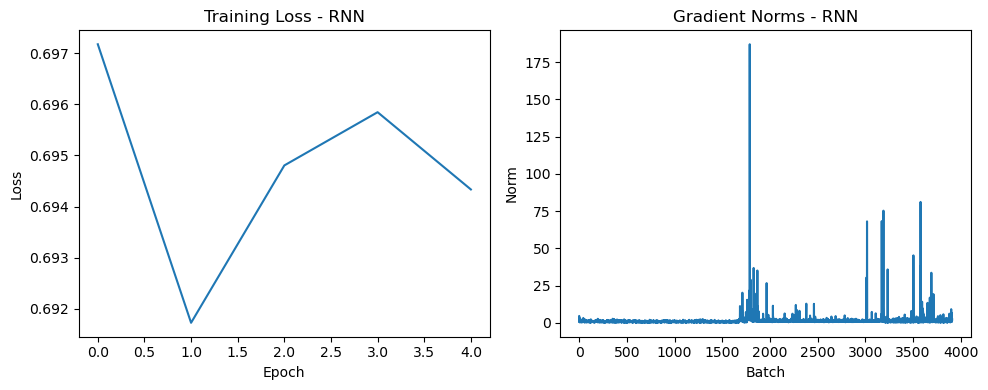

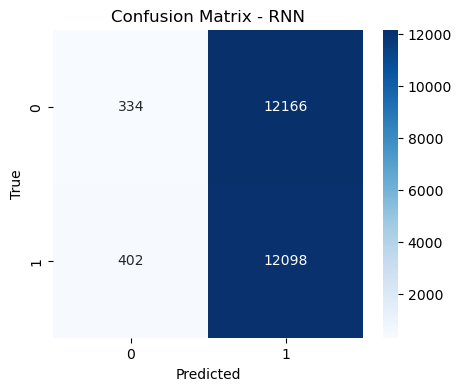


Sample Predictions for RNN:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 1.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 1.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 1.0

Training RNN_Bahdanau...


Epoch 1:   2%|▉                                                   | 15/782 [00:00<00:05, 146.77it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:   6%|███▎                                                | 49/782 [00:00<00:04, 163.66it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  11%|█████▌                                              | 83/782 [00:00<00:04, 166.51it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  15%|███████▋                                           | 117/782 [00:00<00:03, 166.96it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  19%|█████████▊                                         | 151/782 [00:00<00:03, 166.43it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  24%|████████████                                       | 185/782 [00:01<00:03, 165.06it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  28%|██████████████▎                                    | 219/782 [00:01<00:03, 164.75it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  32%|████████████████▌                                  | 253/782 [00:01<00:03, 165.62it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  37%|██████████████████▋                                | 287/782 [00:01<00:02, 166.15it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  41%|████████████████████▉                              | 321/782 [00:01<00:02, 165.32it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  45%|███████████████████████▏                           | 355/782 [00:02<00:02, 164.04it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  50%|█████████████████████████▎                         | 389/782 [00:02<00:02, 164.16it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  54%|███████████████████████████▌                       | 423/782 [00:02<00:02, 164.71it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  58%|█████████████████████████████▊                     | 457/782 [00:02<00:01, 164.82it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  63%|████████████████████████████████                   | 491/782 [00:02<00:01, 163.61it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  67%|██████████████████████████████████▏                | 525/782 [00:03<00:01, 162.88it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  71%|████████████████████████████████████▍              | 559/782 [00:03<00:01, 163.03it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  76%|██████████████████████████████████████▋            | 593/782 [00:03<00:01, 163.70it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  80%|████████████████████████████████████████▉          | 627/782 [00:03<00:00, 163.50it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  85%|███████████████████████████████████████████        | 661/782 [00:04<00:00, 162.35it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  89%|█████████████████████████████████████████████▎     | 695/782 [00:04<00:00, 162.04it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  93%|███████████████████████████████████████████████▌   | 729/782 [00:04<00:00, 162.47it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  98%|█████████████████████████████████████████████████▊ | 763/782 [00:04<00:00, 162.66it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 163.64it/s]


Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   2%|█▏                                                  | 17/782 [00:00<00:04, 166.55it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   4%|██▎                                                 | 34/782 [00:00<00:04, 163.28it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   7%|███▍                                                | 51/782 [00:00<00:04, 162.22it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   9%|████▌                                               | 68/782 [00:00<00:04, 161.66it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  11%|█████▋                                              | 85/782 [00:00<00:04, 161.65it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  13%|██████▋                                            | 102/782 [00:00<00:04, 161.53it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  15%|███████▊                                           | 119/782 [00:00<00:04, 162.12it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  17%|████████▊                                          | 136/782 [00:00<00:03, 162.45it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  20%|█████████▉                                         | 153/782 [00:00<00:03, 162.10it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  22%|███████████                                        | 170/782 [00:01<00:03, 161.89it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  24%|████████████▏                                      | 187/782 [00:01<00:03, 162.05it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  26%|█████████████▎                                     | 204/782 [00:01<00:03, 161.95it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  28%|██████████████▍                                    | 221/782 [00:01<00:03, 161.52it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  30%|███████████████▌                                   | 238/782 [00:01<00:03, 161.56it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  33%|████████████████▋                                  | 255/782 [00:01<00:03, 161.85it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  35%|█████████████████▋                                 | 272/782 [00:01<00:03, 162.07it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  37%|██████████████████▊                                | 289/782 [00:01<00:03, 162.33it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 162.16it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  41%|█████████████████████                              | 323/782 [00:01<00:02, 162.15it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  43%|██████████████████████▏                            | 340/782 [00:02<00:02, 162.19it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  46%|███████████████████████▎                           | 357/782 [00:02<00:02, 161.96it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  48%|████████████████████████▍                          | 374/782 [00:02<00:02, 161.67it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  50%|█████████████████████████▌                         | 391/782 [00:02<00:02, 161.60it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  52%|██████████████████████████▌                        | 408/782 [00:02<00:02, 161.90it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  54%|███████████████████████████▋                       | 425/782 [00:02<00:02, 162.16it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  57%|████████████████████████████▊                      | 442/782 [00:02<00:02, 162.24it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  59%|█████████████████████████████▉                     | 459/782 [00:02<00:01, 162.03it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  61%|███████████████████████████████                    | 476/782 [00:02<00:01, 161.67it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  63%|████████████████████████████████▏                  | 493/782 [00:03<00:01, 161.67it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 161.53it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  67%|██████████████████████████████████▎                | 527/782 [00:03<00:01, 161.11it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  70%|███████████████████████████████████▍               | 544/782 [00:03<00:01, 161.04it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  72%|████████████████████████████████████▌              | 561/782 [00:03<00:01, 161.03it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  74%|█████████████████████████████████████▋             | 578/782 [00:03<00:01, 161.21it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  76%|██████████████████████████████████████▊            | 595/782 [00:03<00:01, 161.37it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:01, 161.40it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  80%|█████████████████████████████████████████          | 629/782 [00:03<00:00, 161.45it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  83%|██████████████████████████████████████████▏        | 646/782 [00:03<00:00, 161.65it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  85%|███████████████████████████████████████████▏       | 663/782 [00:04<00:00, 161.59it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  87%|████████████████████████████████████████████▎      | 680/782 [00:04<00:00, 161.43it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  89%|█████████████████████████████████████████████▍     | 697/782 [00:04<00:00, 161.32it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  91%|██████████████████████████████████████████████▌    | 714/782 [00:04<00:00, 160.61it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  93%|███████████████████████████████████████████████▋   | 731/782 [00:04<00:00, 161.13it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  96%|████████████████████████████████████████████████▊  | 748/782 [00:04<00:00, 161.30it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  98%|█████████████████████████████████████████████████▉ | 765/782 [00:04<00:00, 161.41it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 161.71it/s]


Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   2%|█▏                                                  | 17/782 [00:00<00:04, 163.51it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   4%|██▎                                                 | 34/782 [00:00<00:04, 162.68it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   7%|███▍                                                | 51/782 [00:00<00:04, 162.14it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   9%|████▌                                               | 68/782 [00:00<00:04, 161.57it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  11%|█████▋                                              | 85/782 [00:00<00:04, 161.14it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  13%|██████▋                                            | 102/782 [00:00<00:04, 161.34it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  15%|███████▊                                           | 119/782 [00:00<00:04, 161.75it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  17%|████████▊                                          | 136/782 [00:00<00:03, 161.76it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  20%|█████████▉                                         | 153/782 [00:00<00:03, 161.83it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  22%|███████████                                        | 170/782 [00:01<00:03, 161.79it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  24%|████████████▏                                      | 187/782 [00:01<00:03, 162.11it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  26%|█████████████▎                                     | 204/782 [00:01<00:03, 162.08it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  28%|██████████████▍                                    | 221/782 [00:01<00:03, 161.86it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  30%|███████████████▌                                   | 238/782 [00:01<00:03, 161.30it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  33%|████████████████▋                                  | 255/782 [00:01<00:03, 161.49it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  35%|█████████████████▋                                 | 272/782 [00:01<00:03, 161.47it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  37%|██████████████████▊                                | 289/782 [00:01<00:03, 161.75it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 161.69it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  41%|█████████████████████                              | 323/782 [00:01<00:02, 161.34it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  43%|██████████████████████▏                            | 340/782 [00:02<00:02, 161.69it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  46%|███████████████████████▎                           | 357/782 [00:02<00:02, 161.74it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  48%|████████████████████████▍                          | 374/782 [00:02<00:02, 161.66it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  50%|█████████████████████████▌                         | 391/782 [00:02<00:02, 161.24it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  52%|██████████████████████████▌                        | 408/782 [00:02<00:02, 161.05it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  54%|███████████████████████████▋                       | 425/782 [00:02<00:02, 161.24it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  57%|████████████████████████████▊                      | 442/782 [00:02<00:02, 161.32it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  59%|█████████████████████████████▉                     | 459/782 [00:02<00:01, 161.55it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  61%|███████████████████████████████                    | 476/782 [00:02<00:01, 161.62it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  63%|████████████████████████████████▏                  | 493/782 [00:03<00:01, 161.44it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 161.75it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  67%|██████████████████████████████████▎                | 527/782 [00:03<00:01, 161.83it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  70%|███████████████████████████████████▍               | 544/782 [00:03<00:01, 161.58it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  72%|████████████████████████████████████▌              | 561/782 [00:03<00:01, 161.28it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  74%|█████████████████████████████████████▋             | 578/782 [00:03<00:01, 161.27it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  76%|██████████████████████████████████████▊            | 595/782 [00:03<00:01, 161.59it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:01, 161.73it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  80%|█████████████████████████████████████████          | 629/782 [00:03<00:00, 161.77it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  83%|██████████████████████████████████████████▏        | 646/782 [00:03<00:00, 161.64it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  85%|███████████████████████████████████████████▏       | 663/782 [00:04<00:00, 161.75it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  87%|████████████████████████████████████████████▎      | 680/782 [00:04<00:00, 161.77it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  89%|█████████████████████████████████████████████▍     | 697/782 [00:04<00:00, 161.61it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  91%|██████████████████████████████████████████████▌    | 714/782 [00:04<00:00, 161.41it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  93%|███████████████████████████████████████████████▋   | 731/782 [00:04<00:00, 161.33it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  96%|████████████████████████████████████████████████▊  | 748/782 [00:04<00:00, 161.39it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  98%|█████████████████████████████████████████████████▉ | 765/782 [00:04<00:00, 161.31it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 161.58it/s]


Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   2%|█▏                                                  | 17/782 [00:00<00:04, 161.95it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   4%|██▎                                                 | 34/782 [00:00<00:04, 161.84it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   7%|███▍                                                | 51/782 [00:00<00:04, 161.87it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   9%|████▌                                               | 68/782 [00:00<00:04, 161.77it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  11%|█████▋                                              | 85/782 [00:00<00:04, 161.42it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  13%|██████▋                                            | 102/782 [00:00<00:04, 161.01it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  15%|███████▊                                           | 119/782 [00:00<00:04, 161.12it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  17%|████████▊                                          | 136/782 [00:00<00:04, 161.04it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  20%|█████████▉                                         | 153/782 [00:00<00:03, 160.98it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  22%|███████████                                        | 170/782 [00:01<00:03, 160.99it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  24%|████████████▏                                      | 187/782 [00:01<00:03, 161.04it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  26%|█████████████▎                                     | 204/782 [00:01<00:03, 161.18it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  28%|██████████████▍                                    | 221/782 [00:01<00:03, 161.39it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  30%|███████████████▌                                   | 238/782 [00:01<00:03, 161.52it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  33%|████████████████▋                                  | 255/782 [00:01<00:03, 161.00it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  35%|█████████████████▋                                 | 272/782 [00:01<00:03, 161.09it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  37%|██████████████████▊                                | 289/782 [00:01<00:03, 161.07it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 161.04it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  41%|█████████████████████                              | 323/782 [00:02<00:02, 161.07it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  43%|██████████████████████▏                            | 340/782 [00:02<00:02, 161.18it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  46%|███████████████████████▎                           | 357/782 [00:02<00:02, 161.36it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  48%|████████████████████████▍                          | 374/782 [00:02<00:02, 161.56it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  50%|█████████████████████████▌                         | 391/782 [00:02<00:02, 161.49it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  52%|██████████████████████████▌                        | 408/782 [00:02<00:02, 161.26it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  54%|███████████████████████████▋                       | 425/782 [00:02<00:02, 161.16it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  57%|████████████████████████████▊                      | 442/782 [00:02<00:02, 160.75it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  59%|█████████████████████████████▉                     | 459/782 [00:02<00:02, 160.96it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  61%|███████████████████████████████                    | 476/782 [00:02<00:01, 161.30it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  63%|████████████████████████████████▏                  | 493/782 [00:03<00:01, 161.51it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 161.50it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  67%|██████████████████████████████████▎                | 527/782 [00:03<00:01, 161.77it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  70%|███████████████████████████████████▍               | 544/782 [00:03<00:01, 161.62it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  72%|████████████████████████████████████▌              | 561/782 [00:03<00:01, 161.54it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  74%|█████████████████████████████████████▋             | 578/782 [00:03<00:01, 161.12it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  76%|██████████████████████████████████████▊            | 595/782 [00:03<00:01, 160.78it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:01, 161.02it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  80%|█████████████████████████████████████████          | 629/782 [00:03<00:00, 161.13it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  83%|██████████████████████████████████████████▏        | 646/782 [00:04<00:00, 161.45it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  85%|███████████████████████████████████████████▏       | 663/782 [00:04<00:00, 161.71it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  87%|████████████████████████████████████████████▎      | 680/782 [00:04<00:00, 161.68it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  89%|█████████████████████████████████████████████▍     | 697/782 [00:04<00:00, 161.60it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  91%|██████████████████████████████████████████████▌    | 714/782 [00:04<00:00, 161.81it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  93%|███████████████████████████████████████████████▋   | 731/782 [00:04<00:00, 161.55it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  96%|████████████████████████████████████████████████▊  | 748/782 [00:04<00:00, 160.84it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  98%|█████████████████████████████████████████████████▉ | 765/782 [00:04<00:00, 160.72it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 161.25it/s]


Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   2%|█▏                                                  | 17/782 [00:00<00:04, 163.13it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   4%|██▎                                                 | 34/782 [00:00<00:04, 162.36it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   7%|███▍                                                | 51/782 [00:00<00:04, 162.14it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   9%|████▌                                               | 68/782 [00:00<00:04, 162.31it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  11%|█████▋                                              | 85/782 [00:00<00:04, 162.24it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  13%|██████▋                                            | 102/782 [00:00<00:04, 162.04it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  15%|███████▊                                           | 119/782 [00:00<00:04, 161.58it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  17%|████████▊                                          | 136/782 [00:00<00:04, 161.12it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  20%|█████████▉                                         | 153/782 [00:00<00:03, 160.35it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  22%|███████████                                        | 170/782 [00:01<00:03, 160.39it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  24%|████████████▏                                      | 187/782 [00:01<00:03, 160.15it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  26%|█████████████▎                                     | 204/782 [00:01<00:03, 159.58it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  28%|██████████████▎                                    | 220/782 [00:01<00:03, 159.57it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  30%|███████████████▍                                   | 237/782 [00:01<00:03, 160.08it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  32%|████████████████▌                                  | 254/782 [00:01<00:03, 160.28it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  35%|█████████████████▋                                 | 271/782 [00:01<00:03, 160.24it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  37%|██████████████████▊                                | 288/782 [00:01<00:03, 160.12it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  39%|███████████████████▉                               | 305/782 [00:01<00:02, 160.20it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  41%|█████████████████████                              | 322/782 [00:02<00:02, 160.48it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  43%|██████████████████████                             | 339/782 [00:02<00:02, 160.51it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  46%|███████████████████████▏                           | 356/782 [00:02<00:02, 160.87it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  48%|████████████████████████▎                          | 373/782 [00:02<00:02, 161.33it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  50%|█████████████████████████▍                         | 390/782 [00:02<00:02, 161.81it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  52%|██████████████████████████▌                        | 407/782 [00:02<00:02, 161.63it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  54%|███████████████████████████▋                       | 424/782 [00:02<00:02, 161.20it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  56%|████████████████████████████▊                      | 441/782 [00:02<00:02, 161.10it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  59%|█████████████████████████████▊                     | 458/782 [00:02<00:02, 161.10it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  61%|██████████████████████████████▉                    | 475/782 [00:02<00:01, 161.06it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  63%|████████████████████████████████                   | 492/782 [00:03<00:01, 161.08it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  65%|█████████████████████████████████▏                 | 509/782 [00:03<00:01, 161.19it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  67%|██████████████████████████████████▎                | 526/782 [00:03<00:01, 161.31it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  69%|███████████████████████████████████▍               | 543/782 [00:03<00:01, 161.32it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  72%|████████████████████████████████████▌              | 560/782 [00:03<00:01, 161.42it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  74%|█████████████████████████████████████▋             | 577/782 [00:03<00:01, 161.07it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 161.05it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  78%|███████████████████████████████████████▊           | 611/782 [00:03<00:01, 160.98it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  80%|████████████████████████████████████████▉          | 628/782 [00:03<00:00, 160.81it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  82%|██████████████████████████████████████████         | 645/782 [00:04<00:00, 160.78it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  85%|███████████████████████████████████████████▏       | 662/782 [00:04<00:00, 160.90it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  87%|████████████████████████████████████████████▎      | 679/782 [00:04<00:00, 161.15it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  89%|█████████████████████████████████████████████▍     | 696/782 [00:04<00:00, 161.49it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  91%|██████████████████████████████████████████████▌    | 713/782 [00:04<00:00, 161.32it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  93%|███████████████████████████████████████████████▌   | 730/782 [00:04<00:00, 161.14it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  96%|████████████████████████████████████████████████▋  | 747/782 [00:04<00:00, 161.29it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  98%|█████████████████████████████████████████████████▊ | 764/782 [00:04<00:00, 161.26it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 160.99it/s]

Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Bahdanau, Raw output type: <class 'tuple'>
Model: RNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


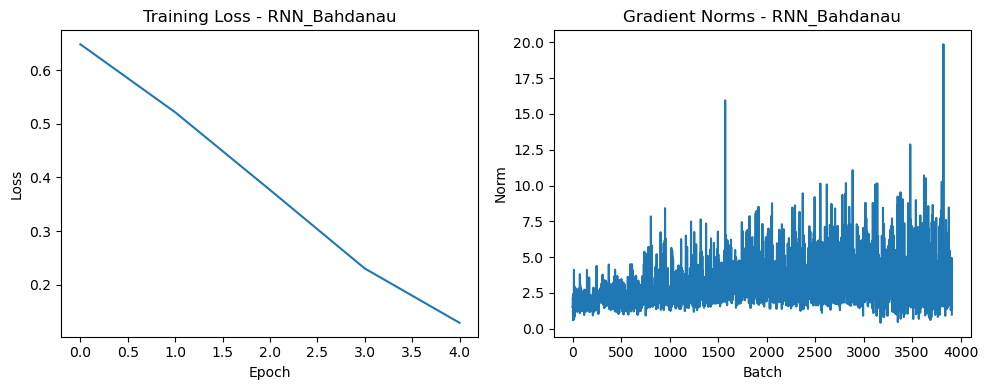

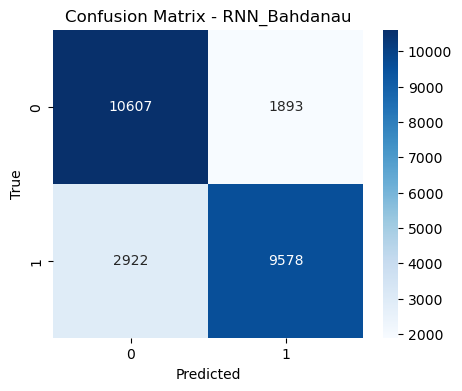

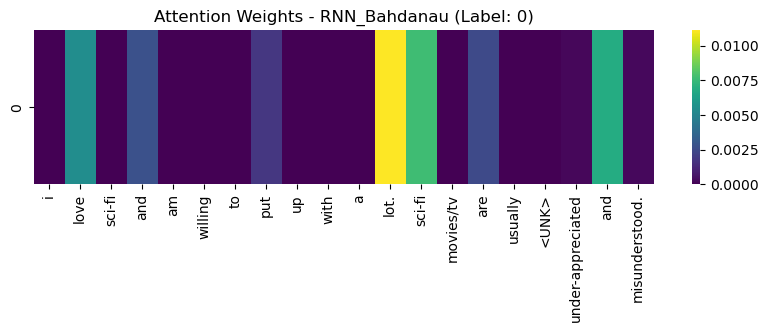

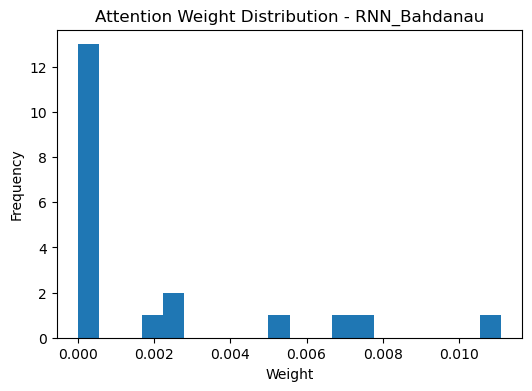


Sample Predictions for RNN_Bahdanau:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training RNN_Dot...


Epoch 1:   2%|█▏                                                  | 18/782 [00:00<00:04, 179.94it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:   7%|███▋                                                | 56/782 [00:00<00:03, 183.00it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  12%|██████▎                                             | 94/782 [00:00<00:03, 182.69it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  17%|████████▌                                          | 132/782 [00:00<00:03, 181.99it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  22%|███████████                                        | 170/782 [00:00<00:03, 181.63it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  27%|█████████████▌                                     | 208/782 [00:01<00:03, 180.40it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  31%|████████████████                                   | 246/782 [00:01<00:02, 180.51it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  36%|██████████████████▌                                | 284/782 [00:01<00:02, 181.29it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  41%|█████████████████████                              | 322/782 [00:01<00:02, 181.48it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  46%|███████████████████████▍                           | 360/782 [00:01<00:02, 180.31it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  51%|█████████████████████████▉                         | 397/782 [00:02<00:02, 179.19it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  55%|████████████████████████████▎                      | 434/782 [00:02<00:01, 179.84it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  60%|██████████████████████████████▊                    | 472/782 [00:02<00:01, 180.33it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  65%|█████████████████████████████████▎                 | 510/782 [00:02<00:01, 179.90it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  70%|███████████████████████████████████▌               | 546/782 [00:03<00:01, 178.56it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  74%|█████████████████████████████████████▉             | 582/782 [00:03<00:01, 177.72it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  79%|████████████████████████████████████████▎          | 618/782 [00:03<00:00, 178.19it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  84%|██████████████████████████████████████████▋        | 654/782 [00:03<00:00, 178.63it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  88%|█████████████████████████████████████████████      | 690/782 [00:03<00:00, 178.44it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  93%|███████████████████████████████████████████████▎   | 726/782 [00:04<00:00, 177.59it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1:  97%|█████████████████████████████████████████████████▋ | 762/782 [00:04<00:00, 177.02it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 179.64it/s]


Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:   2%|█▏                                                  | 18/782 [00:00<00:04, 178.46it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:   5%|██▍                                                 | 36/782 [00:00<00:04, 178.58it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:   7%|███▌                                                | 54/782 [00:00<00:04, 178.59it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   9%|████▊                                               | 72/782 [00:00<00:03, 178.58it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  12%|█████▉                                              | 90/782 [00:00<00:03, 177.98it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  14%|███████                                            | 108/782 [00:00<00:03, 177.13it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  16%|████████▏                                          | 126/782 [00:00<00:03, 176.64it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  18%|█████████▍                                         | 144/782 [00:00<00:03, 176.42it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  21%|██████████▌                                        | 162/782 [00:00<00:03, 176.81it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  23%|███████████▋                                       | 180/782 [00:01<00:03, 177.14it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  25%|████████████▉                                      | 198/782 [00:01<00:03, 177.39it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  28%|██████████████                                     | 216/782 [00:01<00:03, 177.71it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 178.13it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  32%|████████████████▍                                  | 252/782 [00:01<00:02, 177.63it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 177.64it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  37%|██████████████████▊                                | 288/782 [00:01<00:02, 177.12it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 176.79it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  41%|█████████████████████▏                             | 324/782 [00:01<00:02, 176.91it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 176.81it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 176.90it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 177.10it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 177.41it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 177.74it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  55%|████████████████████████████▏                      | 432/782 [00:02<00:01, 177.54it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 177.12it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 176.76it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 176.90it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  64%|████████████████████████████████▊                  | 504/782 [00:02<00:01, 176.70it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  67%|██████████████████████████████████                 | 522/782 [00:02<00:01, 176.85it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 176.57it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 176.42it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 177.25it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 176.82it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  81%|█████████████████████████████████████████          | 630/782 [00:03<00:00, 176.97it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 177.04it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  85%|███████████████████████████████████████████▍       | 666/782 [00:03<00:00, 177.33it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 177.18it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  90%|█████████████████████████████████████████████▊     | 702/782 [00:03<00:00, 177.37it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 177.19it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 177.44it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 177.78it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 2:  99%|██████████████████████████████████████████████████▍| 774/782 [00:04<00:00, 177.74it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 177.26it/s]


Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:   2%|█▏                                                  | 18/782 [00:00<00:04, 179.46it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:   5%|██▍                                                 | 36/782 [00:00<00:04, 178.58it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:   7%|███▌                                                | 54/782 [00:00<00:04, 178.20it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:   9%|████▊                                               | 72/782 [00:00<00:03, 177.56it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  12%|█████▉                                              | 90/782 [00:00<00:03, 177.73it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  14%|███████                                            | 108/782 [00:00<00:03, 177.59it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  16%|████████▏                                          | 126/782 [00:00<00:03, 177.84it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  18%|█████████▍                                         | 144/782 [00:00<00:03, 177.92it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  21%|██████████▌                                        | 162/782 [00:00<00:03, 177.66it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  23%|███████████▋                                       | 180/782 [00:01<00:03, 177.59it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  25%|████████████▉                                      | 198/782 [00:01<00:03, 177.63it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  28%|██████████████                                     | 216/782 [00:01<00:03, 177.56it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 177.54it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  32%|████████████████▍                                  | 252/782 [00:01<00:02, 177.60it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 177.29it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  37%|██████████████████▊                                | 288/782 [00:01<00:02, 177.23it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 177.53it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  41%|█████████████████████▏                             | 324/782 [00:01<00:02, 177.76it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 177.70it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 177.73it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 177.58it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 177.70it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 177.11it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  55%|████████████████████████████▏                      | 432/782 [00:02<00:01, 177.32it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 177.44it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 177.41it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 177.48it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  64%|████████████████████████████████▊                  | 504/782 [00:02<00:01, 177.68it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  67%|██████████████████████████████████                 | 522/782 [00:02<00:01, 177.77it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 177.68it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 177.39it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  74%|█████████████████████████████████████▌             | 576/782 [00:03<00:01, 177.45it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 177.54it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 177.52it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  81%|█████████████████████████████████████████          | 630/782 [00:03<00:00, 177.33it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 177.18it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  85%|███████████████████████████████████████████▍       | 666/782 [00:03<00:00, 177.44it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 177.58it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  90%|█████████████████████████████████████████████▊     | 702/782 [00:03<00:00, 177.27it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 177.32it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 177.45it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 177.33it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 177.50it/s]


Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:   2%|█▏                                                  | 18/782 [00:00<00:04, 177.47it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:   5%|██▍                                                 | 36/782 [00:00<00:04, 176.83it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:   7%|███▌                                                | 54/782 [00:00<00:04, 177.03it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:   9%|████▊                                               | 72/782 [00:00<00:04, 177.46it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  12%|█████▉                                              | 90/782 [00:00<00:03, 177.60it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  14%|███████                                            | 108/782 [00:00<00:03, 177.02it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  16%|████████▏                                          | 126/782 [00:00<00:03, 176.72it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  18%|█████████▍                                         | 144/782 [00:00<00:03, 176.78it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  21%|██████████▌                                        | 162/782 [00:00<00:03, 176.79it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  23%|███████████▋                                       | 180/782 [00:01<00:03, 176.80it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  25%|████████████▉                                      | 198/782 [00:01<00:03, 176.07it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  28%|██████████████                                     | 216/782 [00:01<00:03, 176.45it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 176.41it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  32%|████████████████▍                                  | 252/782 [00:01<00:03, 176.64it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 176.88it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  37%|██████████████████▊                                | 288/782 [00:01<00:02, 176.76it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 176.98it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  41%|█████████████████████▏                             | 324/782 [00:01<00:02, 177.22it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 177.40it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 177.33it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 177.27it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 177.20it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 176.97it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  55%|████████████████████████████▏                      | 432/782 [00:02<00:01, 177.42it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 176.87it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 177.01it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 176.93it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  64%|████████████████████████████████▊                  | 504/782 [00:02<00:01, 177.29it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  67%|██████████████████████████████████                 | 522/782 [00:02<00:01, 177.28it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 177.23it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 177.29it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  74%|█████████████████████████████████████▌             | 576/782 [00:03<00:01, 177.29it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 177.57it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 177.39it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  81%|█████████████████████████████████████████          | 630/782 [00:03<00:00, 177.13it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 177.08it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  85%|███████████████████████████████████████████▍       | 666/782 [00:03<00:00, 177.20it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 177.22it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  90%|█████████████████████████████████████████████▊     | 702/782 [00:03<00:00, 177.42it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 177.27it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 177.15it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 177.09it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4:  99%|██████████████████████████████████████████████████▍| 774/782 [00:04<00:00, 177.21it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 177.05it/s]


Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:   2%|█▏                                                  | 18/782 [00:00<00:04, 177.05it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:   5%|██▍                                                 | 36/782 [00:00<00:04, 176.75it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:   7%|███▌                                                | 54/782 [00:00<00:04, 176.82it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:   9%|████▊                                               | 72/782 [00:00<00:04, 177.15it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  12%|█████▉                                              | 90/782 [00:00<00:03, 177.38it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  14%|███████                                            | 108/782 [00:00<00:03, 177.32it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  16%|████████▏                                          | 126/782 [00:00<00:03, 177.24it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  18%|█████████▍                                         | 144/782 [00:00<00:03, 177.24it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  21%|██████████▌                                        | 162/782 [00:00<00:03, 177.48it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  23%|███████████▋                                       | 180/782 [00:01<00:03, 177.00it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  25%|████████████▉                                      | 198/782 [00:01<00:03, 177.00it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  28%|██████████████                                     | 216/782 [00:01<00:03, 176.76it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 176.68it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  32%|████████████████▍                                  | 252/782 [00:01<00:02, 177.24it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 177.42it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  37%|██████████████████▊                                | 288/782 [00:01<00:02, 177.44it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 177.09it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  41%|█████████████████████▏                             | 324/782 [00:01<00:02, 177.39it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 177.48it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 177.67it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 177.26it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 177.01it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 176.93it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  55%|████████████████████████████▏                      | 432/782 [00:02<00:01, 176.80it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 177.19it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 177.12it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 177.35it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  64%|████████████████████████████████▊                  | 504/782 [00:02<00:01, 176.91it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  67%|██████████████████████████████████                 | 522/782 [00:02<00:01, 177.28it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 177.10it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 176.92it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  74%|█████████████████████████████████████▌             | 576/782 [00:03<00:01, 176.94it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 177.26it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 177.30it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  81%|█████████████████████████████████████████          | 630/782 [00:03<00:00, 177.46it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 177.33it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  85%|███████████████████████████████████████████▍       | 666/782 [00:03<00:00, 177.36it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 177.39it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  90%|█████████████████████████████████████████████▊     | 702/782 [00:03<00:00, 177.03it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 176.54it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 176.81it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 176.94it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>

Epoch 5:  99%|██████████████████████████████████████████████████▍| 774/782 [00:04<00:00, 177.05it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 177.13it/s]

Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Dot, Raw output type: <class 'tuple'>
Model: RNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


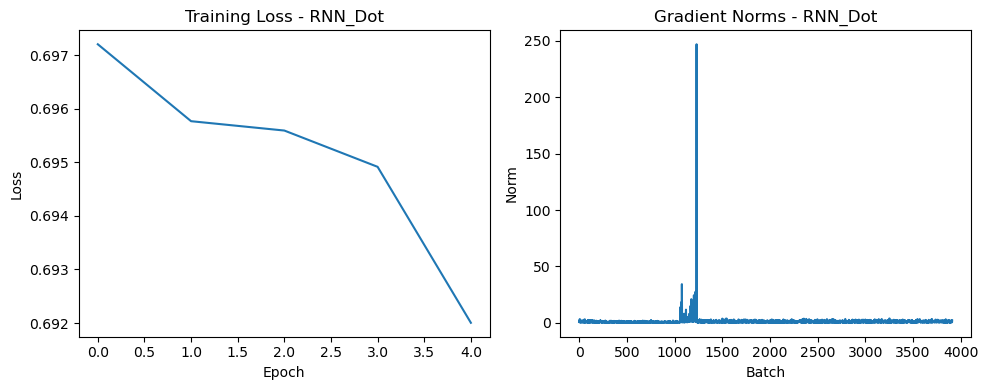

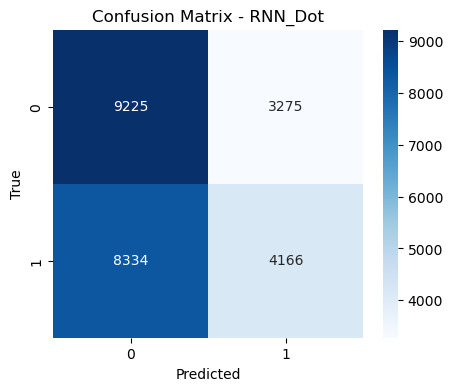

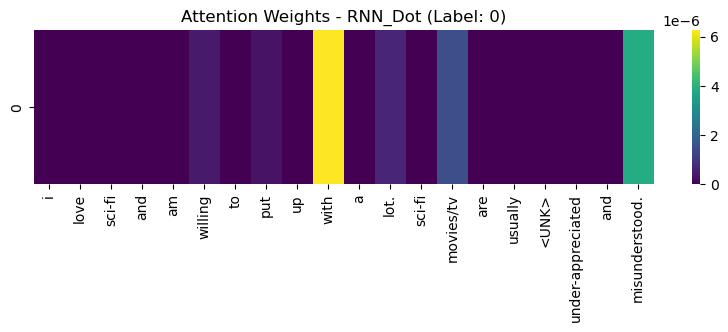

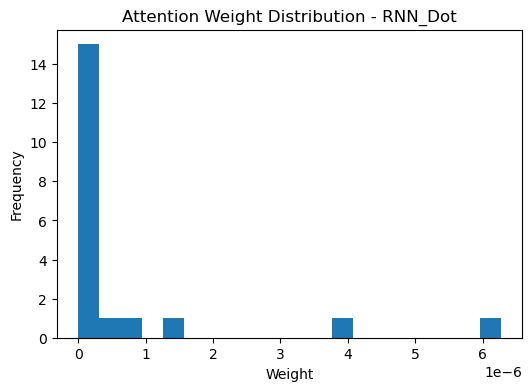


Sample Predictions for RNN_Dot:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training RNN_General...


Epoch 1:   2%|█▏                                                  | 18/782 [00:00<00:04, 169.54it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:   7%|███▌                                                | 54/782 [00:00<00:04, 173.64it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  12%|█████▉                                              | 90/782 [00:00<00:03, 175.11it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  16%|████████▏                                          | 126/782 [00:00<00:03, 175.44it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  21%|██████████▌                                        | 162/782 [00:00<00:03, 174.21it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  25%|████████████▉                                      | 198/782 [00:01<00:03, 172.80it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 172.91it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 173.59it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 173.96it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 172.29it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 171.16it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 171.68it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 172.61it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 172.77it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  67%|██████████████████████████████████                 | 522/782 [00:03<00:01, 171.32it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 170.81it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 171.35it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 171.72it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  81%|█████████████████████████████████████████          | 630/782 [00:03<00:00, 172.17it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 172.33it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  85%|███████████████████████████████████████████▍       | 666/782 [00:03<00:00, 172.19it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 171.49it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  90%|█████████████████████████████████████████████▊     | 702/782 [00:04<00:00, 170.98it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 170.75it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 170.76it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 170.72it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 172.34it/s]


Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   2%|█▏                                                  | 18/782 [00:00<00:04, 172.59it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   7%|███▌                                                | 54/782 [00:00<00:04, 171.55it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  12%|█████▉                                              | 90/782 [00:00<00:04, 170.48it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  16%|████████▏                                          | 126/782 [00:00<00:03, 170.56it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  21%|██████████▌                                        | 162/782 [00:00<00:03, 171.42it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  23%|███████████▋                                       | 180/782 [00:01<00:03, 171.76it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  25%|████████████▉                                      | 198/782 [00:01<00:03, 171.83it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  28%|██████████████                                     | 216/782 [00:01<00:03, 171.12it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 171.30it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  32%|████████████████▍                                  | 252/782 [00:01<00:03, 171.27it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 171.16it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  37%|██████████████████▊                                | 288/782 [00:01<00:02, 171.06it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 171.21it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  41%|█████████████████████▏                             | 324/782 [00:01<00:02, 171.46it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 171.74it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 172.00it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 171.97it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 171.73it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 171.62it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  55%|████████████████████████████▏                      | 432/782 [00:02<00:02, 171.35it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 171.13it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 171.32it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 171.34it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  64%|████████████████████████████████▊                  | 504/782 [00:02<00:01, 171.71it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  67%|██████████████████████████████████                 | 522/782 [00:03<00:01, 171.80it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 171.74it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 171.74it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  74%|█████████████████████████████████████▌             | 576/782 [00:03<00:01, 171.52it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 171.27it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 171.23it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 171.64it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 172.05it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 172.04it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 171.38it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 171.41it/s]


Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   2%|█▏                                                  | 18/782 [00:00<00:04, 171.83it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   5%|██▍                                                 | 36/782 [00:00<00:04, 171.71it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   7%|███▌                                                | 54/782 [00:00<00:04, 171.67it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   9%|████▊                                               | 72/782 [00:00<00:04, 171.28it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  12%|█████▉                                              | 90/782 [00:00<00:04, 171.19it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  14%|███████                                            | 108/782 [00:00<00:03, 171.15it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  16%|████████▏                                          | 126/782 [00:00<00:03, 170.81it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  18%|█████████▍                                         | 144/782 [00:00<00:03, 170.71it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  21%|██████████▌                                        | 162/782 [00:00<00:03, 170.62it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  23%|███████████▋                                       | 180/782 [00:01<00:03, 170.87it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  25%|████████████▉                                      | 198/782 [00:01<00:03, 171.04it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  28%|██████████████                                     | 216/782 [00:01<00:03, 170.91it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 170.80it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  32%|████████████████▍                                  | 252/782 [00:01<00:03, 170.83it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 170.93it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  37%|██████████████████▊                                | 288/782 [00:01<00:02, 170.82it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 170.64it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  41%|█████████████████████▏                             | 324/782 [00:01<00:02, 170.49it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  44%|██████████████████████▎                            | 342/782 [00:02<00:02, 170.61it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 170.71it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 170.85it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 170.91it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 170.82it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  55%|████████████████████████████▏                      | 432/782 [00:02<00:02, 170.77it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 170.81it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 170.53it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 170.11it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  64%|████████████████████████████████▊                  | 504/782 [00:02<00:01, 170.51it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  67%|██████████████████████████████████                 | 522/782 [00:03<00:01, 170.67it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 170.81it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 171.03it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  74%|█████████████████████████████████████▌             | 576/782 [00:03<00:01, 171.28it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 171.36it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 171.43it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  81%|█████████████████████████████████████████          | 630/782 [00:03<00:00, 171.17it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 171.24it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  85%|███████████████████████████████████████████▍       | 666/782 [00:03<00:00, 171.36it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  87%|████████████████████████████████████████████▌      | 684/782 [00:04<00:00, 171.01it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  90%|█████████████████████████████████████████████▊     | 702/782 [00:04<00:00, 171.20it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 171.33it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 171.32it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 171.65it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  99%|██████████████████████████████████████████████████▍| 774/782 [00:04<00:00, 171.65it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 171.01it/s]


Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   2%|█▏                                                  | 18/782 [00:00<00:04, 172.71it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   5%|██▍                                                 | 36/782 [00:00<00:04, 172.25it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   7%|███▌                                                | 54/782 [00:00<00:04, 171.65it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   9%|████▊                                               | 72/782 [00:00<00:04, 171.24it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  12%|█████▉                                              | 90/782 [00:00<00:04, 171.29it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  14%|███████                                            | 108/782 [00:00<00:03, 171.57it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  16%|████████▏                                          | 126/782 [00:00<00:03, 171.59it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  18%|█████████▍                                         | 144/782 [00:00<00:03, 171.69it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  21%|██████████▌                                        | 162/782 [00:00<00:03, 171.45it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  23%|███████████▋                                       | 180/782 [00:01<00:03, 171.62it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  25%|████████████▉                                      | 198/782 [00:01<00:03, 171.61it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  28%|██████████████                                     | 216/782 [00:01<00:03, 171.55it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 171.48it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  32%|████████████████▍                                  | 252/782 [00:01<00:03, 171.26it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 171.24it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  37%|██████████████████▊                                | 288/782 [00:01<00:02, 171.20it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 171.28it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  41%|█████████████████████▏                             | 324/782 [00:01<00:02, 171.31it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  44%|██████████████████████▎                            | 342/782 [00:01<00:02, 171.52it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 171.46it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 171.34it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 170.27it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 170.40it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  55%|████████████████████████████▏                      | 432/782 [00:02<00:02, 170.32it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 170.42it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 170.25it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 170.50it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  64%|████████████████████████████████▊                  | 504/782 [00:02<00:01, 170.86it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  67%|██████████████████████████████████                 | 522/782 [00:03<00:01, 170.90it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 170.72it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 170.84it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  74%|█████████████████████████████████████▌             | 576/782 [00:03<00:01, 170.76it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 170.81it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 170.96it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  81%|█████████████████████████████████████████          | 630/782 [00:03<00:00, 171.12it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 170.86it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  85%|███████████████████████████████████████████▍       | 666/782 [00:03<00:00, 170.90it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 170.83it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  90%|█████████████████████████████████████████████▊     | 702/782 [00:04<00:00, 170.71it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 170.62it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 170.42it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 170.66it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  99%|██████████████████████████████████████████████████▍| 774/782 [00:04<00:00, 170.40it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 170.98it/s]


Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   2%|█▏                                                  | 18/782 [00:00<00:04, 171.95it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   5%|██▍                                                 | 36/782 [00:00<00:04, 171.19it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   7%|███▌                                                | 54/782 [00:00<00:04, 171.24it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   9%|████▊                                               | 72/782 [00:00<00:04, 171.15it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  12%|█████▉                                              | 90/782 [00:00<00:04, 170.93it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  14%|███████                                            | 108/782 [00:00<00:03, 170.70it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  16%|████████▏                                          | 126/782 [00:00<00:03, 170.54it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  18%|█████████▍                                         | 144/782 [00:00<00:03, 170.65it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  21%|██████████▌                                        | 162/782 [00:00<00:03, 170.47it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  23%|███████████▋                                       | 180/782 [00:01<00:03, 170.61it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  25%|████████████▉                                      | 198/782 [00:01<00:03, 170.71it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  28%|██████████████                                     | 216/782 [00:01<00:03, 170.85it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 171.09it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  32%|████████████████▍                                  | 252/782 [00:01<00:03, 171.10it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  35%|█████████████████▌                                 | 270/782 [00:01<00:02, 171.13it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  37%|██████████████████▊                                | 288/782 [00:01<00:02, 170.81it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  39%|███████████████████▉                               | 306/782 [00:01<00:02, 170.89it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  41%|█████████████████████▏                             | 324/782 [00:01<00:02, 171.11it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  44%|██████████████████████▎                            | 342/782 [00:02<00:02, 171.25it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 171.25it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  48%|████████████████████████▋                          | 378/782 [00:02<00:02, 171.29it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 171.36it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 171.23it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  55%|████████████████████████████▏                      | 432/782 [00:02<00:02, 171.06it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  58%|█████████████████████████████▎                     | 450/782 [00:02<00:01, 171.22it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:02<00:01, 170.96it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  62%|███████████████████████████████▋                   | 486/782 [00:02<00:01, 170.94it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  64%|████████████████████████████████▊                  | 504/782 [00:02<00:01, 171.15it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  67%|██████████████████████████████████                 | 522/782 [00:03<00:01, 171.41it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 171.33it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  71%|████████████████████████████████████▍              | 558/782 [00:03<00:01, 171.34it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  74%|█████████████████████████████████████▌             | 576/782 [00:03<00:01, 171.37it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  76%|██████████████████████████████████████▋            | 594/782 [00:03<00:01, 171.43it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:00, 171.43it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  81%|█████████████████████████████████████████          | 630/782 [00:03<00:00, 171.44it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  83%|██████████████████████████████████████████▎        | 648/782 [00:03<00:00, 171.24it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  85%|███████████████████████████████████████████▍       | 666/782 [00:03<00:00, 171.47it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  87%|████████████████████████████████████████████▌      | 684/782 [00:03<00:00, 171.35it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  90%|█████████████████████████████████████████████▊     | 702/782 [00:04<00:00, 171.18it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 171.38it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 170.95it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:04<00:00, 171.13it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  99%|██████████████████████████████████████████████████▍| 774/782 [00:04<00:00, 170.77it/s]

Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 171.09it/s]


Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_General, Raw output type: <class 'tuple'>
Model: RNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


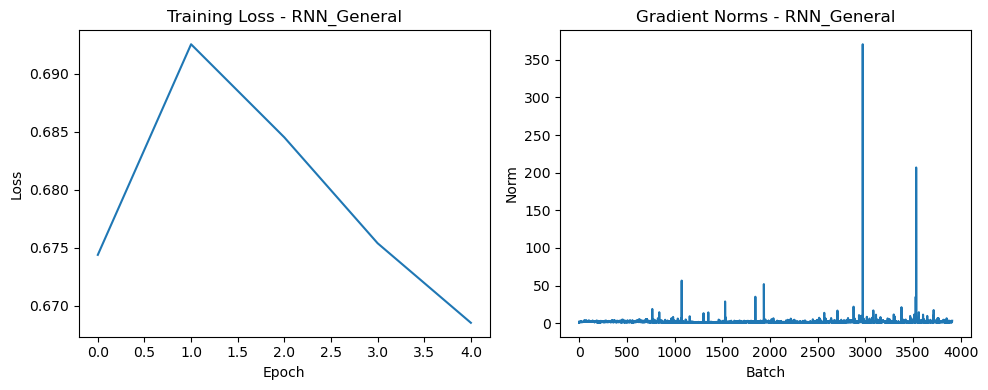

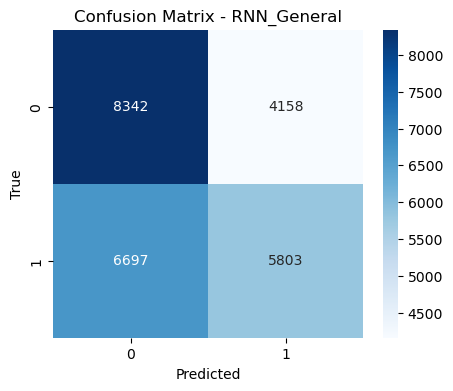

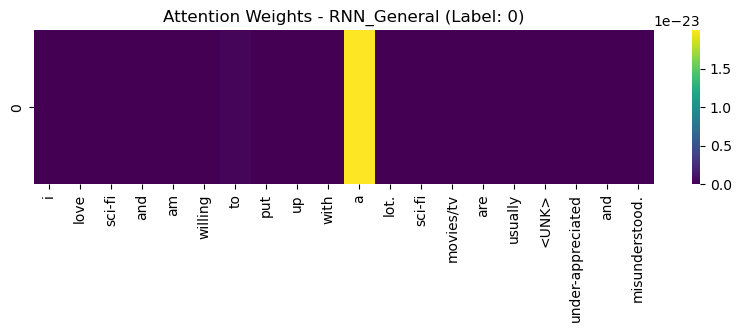

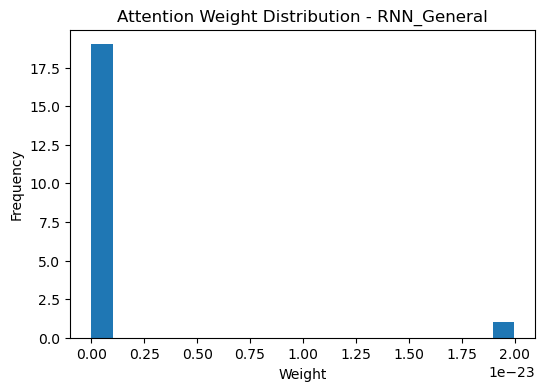


Sample Predictions for RNN_General:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 1.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 1.0

Training RNN_Concat...


Epoch 1:   2%|█▏                                                  | 17/782 [00:00<00:04, 161.79it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:   7%|███▍                                                | 51/782 [00:00<00:04, 164.51it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  11%|█████▋                                              | 85/782 [00:00<00:04, 163.93it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  15%|███████▊                                           | 119/782 [00:00<00:04, 163.65it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  20%|█████████▉                                         | 153/782 [00:00<00:03, 163.31it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  24%|████████████▏                                      | 187/782 [00:01<00:03, 161.08it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  28%|██████████████▍                                    | 221/782 [00:01<00:03, 162.50it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  33%|████████████████▋                                  | 255/782 [00:01<00:03, 163.16it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  37%|██████████████████▊                                | 289/782 [00:01<00:03, 163.91it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  41%|█████████████████████                              | 323/782 [00:01<00:02, 162.87it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  46%|███████████████████████▎                           | 357/782 [00:02<00:02, 161.92it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  50%|█████████████████████████▌                         | 391/782 [00:02<00:02, 162.29it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  54%|███████████████████████████▋                       | 425/782 [00:02<00:02, 162.78it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  59%|█████████████████████████████▉                     | 459/782 [00:02<00:01, 163.08it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  63%|████████████████████████████████▏                  | 493/782 [00:03<00:01, 161.65it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 161.10it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  67%|██████████████████████████████████▎                | 527/782 [00:03<00:01, 160.90it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  70%|███████████████████████████████████▍               | 544/782 [00:03<00:01, 161.07it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  72%|████████████████████████████████████▌              | 561/782 [00:03<00:01, 161.44it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  74%|█████████████████████████████████████▋             | 578/782 [00:03<00:01, 161.52it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  76%|██████████████████████████████████████▊            | 595/782 [00:03<00:01, 161.42it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  78%|███████████████████████████████████████▉           | 612/782 [00:03<00:01, 161.58it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  80%|█████████████████████████████████████████          | 629/782 [00:03<00:00, 161.08it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  83%|██████████████████████████████████████████▏        | 646/782 [00:03<00:00, 160.76it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  87%|████████████████████████████████████████████▎      | 680/782 [00:04<00:00, 159.86it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  91%|██████████████████████████████████████████████▌    | 714/782 [00:04<00:00, 159.71it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  96%|████████████████████████████████████████████████▊  | 748/782 [00:04<00:00, 160.67it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 161.95it/s]


Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   2%|█▏                                                  | 17/782 [00:00<00:04, 160.59it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   4%|██▎                                                 | 34/782 [00:00<00:04, 159.89it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   6%|███▎                                                | 50/782 [00:00<00:04, 159.68it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   8%|████▍                                               | 66/782 [00:00<00:04, 159.67it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  10%|█████▍                                              | 82/782 [00:00<00:04, 159.72it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  13%|██████▌                                             | 99/782 [00:00<00:04, 160.00it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  15%|███████▌                                           | 116/782 [00:00<00:04, 160.23it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  17%|████████▋                                          | 133/782 [00:00<00:04, 160.18it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  19%|█████████▊                                         | 150/782 [00:00<00:03, 160.34it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  21%|██████████▉                                        | 167/782 [00:01<00:03, 160.24it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  24%|████████████                                       | 184/782 [00:01<00:03, 160.12it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  26%|█████████████                                      | 201/782 [00:01<00:03, 159.86it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  28%|██████████████▏                                    | 217/782 [00:01<00:03, 159.58it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  30%|███████████████▎                                   | 234/782 [00:01<00:03, 159.80it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  32%|████████████████▎                                  | 251/782 [00:01<00:03, 159.93it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  34%|█████████████████▍                                 | 268/782 [00:01<00:03, 160.18it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  36%|██████████████████▌                                | 285/782 [00:01<00:03, 160.17it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  39%|███████████████████▋                               | 302/782 [00:01<00:02, 160.34it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  41%|████████████████████▊                              | 319/782 [00:01<00:02, 160.33it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  43%|█████████████████████▉                             | 336/782 [00:02<00:02, 160.23it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  45%|███████████████████████                            | 353/782 [00:02<00:02, 160.11it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  47%|████████████████████████▏                          | 370/782 [00:02<00:02, 160.12it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  49%|█████████████████████████▏                         | 387/782 [00:02<00:02, 159.98it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  52%|██████████████████████████▎                        | 404/782 [00:02<00:02, 160.03it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  54%|███████████████████████████▍                       | 421/782 [00:02<00:02, 160.31it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  56%|████████████████████████████▌                      | 438/782 [00:02<00:02, 160.31it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  58%|█████████████████████████████▋                     | 455/782 [00:02<00:02, 160.67it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  60%|██████████████████████████████▊                    | 472/782 [00:02<00:01, 160.29it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  63%|███████████████████████████████▉                   | 489/782 [00:03<00:01, 160.19it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  67%|██████████████████████████████████                 | 523/782 [00:03<00:01, 160.17it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  71%|████████████████████████████████████▎              | 557/782 [00:03<00:01, 160.19it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  76%|██████████████████████████████████████▌            | 591/782 [00:03<00:01, 160.06it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  80%|████████████████████████████████████████▊          | 625/782 [00:03<00:00, 160.09it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  84%|██████████████████████████████████████████▉        | 659/782 [00:04<00:00, 159.99it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  88%|█████████████████████████████████████████████      | 691/782 [00:04<00:00, 159.82it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  93%|███████████████████████████████████████████████▏   | 724/782 [00:04<00:00, 159.60it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  97%|█████████████████████████████████████████████████▎ | 757/782 [00:04<00:00, 160.16it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 160.06it/s]


Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   2%|█▏                                                  | 17/782 [00:00<00:04, 161.40it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   4%|██▎                                                 | 34/782 [00:00<00:04, 160.24it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   7%|███▍                                                | 51/782 [00:00<00:04, 160.30it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   9%|████▌                                               | 68/782 [00:00<00:04, 160.13it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  11%|█████▋                                              | 85/782 [00:00<00:04, 159.71it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  13%|██████▌                                            | 101/782 [00:00<00:04, 159.49it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  15%|███████▋                                           | 117/782 [00:00<00:04, 159.65it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  17%|████████▋                                          | 134/782 [00:00<00:04, 159.80it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  19%|█████████▊                                         | 151/782 [00:00<00:03, 159.86it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  21%|██████████▉                                        | 167/782 [00:01<00:03, 159.69it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  24%|████████████                                       | 184/782 [00:01<00:03, 159.88it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  26%|█████████████                                      | 201/782 [00:01<00:03, 159.97it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  28%|██████████████▏                                    | 218/782 [00:01<00:03, 160.05it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  30%|███████████████▎                                   | 235/782 [00:01<00:03, 160.12it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  32%|████████████████▍                                  | 252/782 [00:01<00:03, 159.84it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  34%|█████████████████▍                                 | 268/782 [00:01<00:03, 159.55it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  36%|██████████████████▌                                | 284/782 [00:01<00:03, 159.58it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  38%|███████████████████▌                               | 300/782 [00:01<00:03, 159.49it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  41%|████████████████████▋                              | 317/782 [00:01<00:02, 159.73it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  43%|█████████████████████▋                             | 333/782 [00:02<00:02, 159.62it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  45%|██████████████████████▊                            | 350/782 [00:02<00:02, 159.80it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  47%|███████████████████████▉                           | 367/782 [00:02<00:02, 159.98it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  49%|████████████████████████▉                          | 383/782 [00:02<00:02, 159.96it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  51%|██████████████████████████                         | 399/782 [00:02<00:02, 159.71it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  53%|███████████████████████████                        | 415/782 [00:02<00:02, 159.43it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  55%|████████████████████████████                       | 431/782 [00:02<00:02, 159.58it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  57%|█████████████████████████████▏                     | 447/782 [00:02<00:02, 159.48it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  59%|██████████████████████████████▏                    | 463/782 [00:02<00:02, 159.50it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  61%|███████████████████████████████▏                   | 479/782 [00:02<00:01, 159.41it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  63%|████████████████████████████████▎                  | 496/782 [00:03<00:01, 159.73it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  66%|█████████████████████████████████▍                 | 513/782 [00:03<00:01, 160.07it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  68%|██████████████████████████████████▌                | 530/782 [00:03<00:01, 160.15it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  70%|███████████████████████████████████▋               | 547/782 [00:03<00:01, 159.84it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  72%|████████████████████████████████████▋              | 563/782 [00:03<00:01, 159.74it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  74%|█████████████████████████████████████▊             | 579/782 [00:03<00:01, 159.73it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  76%|██████████████████████████████████████▊            | 595/782 [00:03<00:01, 159.68it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  78%|███████████████████████████████████████▊           | 611/782 [00:03<00:01, 159.28it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  80%|████████████████████████████████████████▉          | 627/782 [00:03<00:00, 159.31it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  82%|█████████████████████████████████████████▉         | 643/782 [00:04<00:00, 159.47it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  84%|███████████████████████████████████████████        | 660/782 [00:04<00:00, 159.71it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  87%|████████████████████████████████████████████▏      | 677/782 [00:04<00:00, 159.92it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  89%|█████████████████████████████████████████████▏     | 693/782 [00:04<00:00, 159.88it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  91%|██████████████████████████████████████████████▏    | 709/782 [00:04<00:00, 159.74it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  93%|███████████████████████████████████████████████▎   | 725/782 [00:04<00:00, 159.61it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  95%|████████████████████████████████████████████████▍  | 742/782 [00:04<00:00, 159.84it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  97%|█████████████████████████████████████████████████▍ | 758/782 [00:04<00:00, 159.67it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 159.74it/s]


Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   2%|█▏                                                  | 17/782 [00:00<00:04, 160.17it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   4%|██▎                                                 | 34/782 [00:00<00:04, 160.29it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   7%|███▍                                                | 51/782 [00:00<00:04, 160.28it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   9%|████▌                                               | 68/782 [00:00<00:04, 160.16it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  11%|█████▋                                              | 85/782 [00:00<00:04, 159.77it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  13%|██████▌                                            | 101/782 [00:00<00:04, 159.57it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  15%|███████▋                                           | 117/782 [00:00<00:04, 159.56it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  17%|████████▋                                          | 133/782 [00:00<00:04, 159.35it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  19%|█████████▋                                         | 149/782 [00:00<00:03, 158.92it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  21%|██████████▊                                        | 165/782 [00:01<00:03, 158.98it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  23%|███████████▊                                       | 181/782 [00:01<00:03, 159.22it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  25%|████████████▉                                      | 198/782 [00:01<00:03, 159.48it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  27%|█████████████▉                                     | 214/782 [00:01<00:03, 159.47it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  29%|███████████████                                    | 230/782 [00:01<00:03, 159.53it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  31%|████████████████                                   | 246/782 [00:01<00:03, 159.44it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  34%|█████████████████                                  | 262/782 [00:01<00:03, 159.42it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  36%|██████████████████▏                                | 278/782 [00:01<00:03, 159.49it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  38%|███████████████████▏                               | 294/782 [00:01<00:03, 159.42it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  40%|████████████████████▏                              | 310/782 [00:01<00:02, 159.33it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  42%|█████████████████████▎                             | 326/782 [00:02<00:02, 159.36it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  44%|██████████████████████▎                            | 343/782 [00:02<00:02, 159.57it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  46%|███████████████████████▍                           | 359/782 [00:02<00:02, 159.68it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  48%|████████████████████████▍                          | 375/782 [00:02<00:02, 159.69it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  50%|█████████████████████████▌                         | 391/782 [00:02<00:02, 159.61it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  52%|██████████████████████████▌                        | 407/782 [00:02<00:02, 159.60it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  54%|███████████████████████████▌                       | 423/782 [00:02<00:02, 159.61it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  56%|████████████████████████████▋                      | 439/782 [00:02<00:02, 159.42it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  58%|█████████████████████████████▋                     | 455/782 [00:02<00:02, 159.06it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  60%|██████████████████████████████▋                    | 471/782 [00:02<00:01, 159.04it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  62%|███████████████████████████████▊                   | 487/782 [00:03<00:01, 159.20it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  64%|████████████████████████████████▊                  | 503/782 [00:03<00:01, 159.37it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  66%|█████████████████████████████████▊                 | 519/782 [00:03<00:01, 159.51it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  68%|██████████████████████████████████▉                | 535/782 [00:03<00:01, 159.59it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  70%|███████████████████████████████████▉               | 551/782 [00:03<00:01, 159.66it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  73%|████████████████████████████████████▉              | 567/782 [00:03<00:01, 159.59it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  75%|██████████████████████████████████████             | 583/782 [00:03<00:01, 159.57it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  77%|███████████████████████████████████████            | 599/782 [00:03<00:01, 159.48it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  79%|████████████████████████████████████████           | 615/782 [00:03<00:01, 159.62it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  81%|█████████████████████████████████████████▏         | 631/782 [00:03<00:00, 159.31it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  83%|██████████████████████████████████████████▏        | 647/782 [00:04<00:00, 159.41it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  85%|███████████████████████████████████████████▏       | 663/782 [00:04<00:00, 159.57it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  87%|████████████████████████████████████████████▎      | 680/782 [00:04<00:00, 159.78it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  89%|█████████████████████████████████████████████▍     | 697/782 [00:04<00:00, 159.91it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  91%|██████████████████████████████████████████████▌    | 713/782 [00:04<00:00, 159.76it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  93%|███████████████████████████████████████████████▌   | 729/782 [00:04<00:00, 159.51it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  95%|████████████████████████████████████████████████▌  | 745/782 [00:04<00:00, 159.51it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  97%|█████████████████████████████████████████████████▋ | 761/782 [00:04<00:00, 159.57it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 159.49it/s]


Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:   2%|█▏                                                  | 17/782 [00:00<00:04, 160.54it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:   4%|██▎                                                 | 34/782 [00:00<00:04, 160.71it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:   7%|███▍                                                | 51/782 [00:00<00:04, 160.34it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:   9%|████▌                                               | 68/782 [00:00<00:04, 160.21it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  11%|█████▋                                              | 85/782 [00:00<00:04, 159.95it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  13%|██████▋                                            | 102/782 [00:00<00:04, 160.17it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  15%|███████▊                                           | 119/782 [00:00<00:04, 160.22it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  17%|████████▊                                          | 136/782 [00:00<00:04, 160.06it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  20%|█████████▉                                         | 153/782 [00:00<00:03, 159.41it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  22%|███████████                                        | 169/782 [00:01<00:03, 159.44it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  24%|████████████▏                                      | 186/782 [00:01<00:03, 159.66it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  26%|█████████████▏                                     | 203/782 [00:01<00:03, 159.86it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  28%|██████████████▎                                    | 220/782 [00:01<00:03, 159.93it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  30%|███████████████▍                                   | 236/782 [00:01<00:03, 159.64it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  32%|████████████████▍                                  | 252/782 [00:01<00:03, 159.70it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  34%|█████████████████▍                                 | 268/782 [00:01<00:03, 159.54it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  36%|██████████████████▌                                | 284/782 [00:01<00:03, 159.49it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  38%|███████████████████▌                               | 300/782 [00:01<00:03, 159.63it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  40%|████████████████████▌                              | 316/782 [00:01<00:02, 159.72it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  42%|█████████████████████▋                             | 332/782 [00:02<00:02, 159.40it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  45%|██████████████████████▊                            | 349/782 [00:02<00:02, 159.63it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  47%|███████████████████████▊                           | 365/782 [00:02<00:02, 159.56it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  49%|████████████████████████▊                          | 381/782 [00:02<00:02, 159.62it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  51%|█████████████████████████▉                         | 398/782 [00:02<00:02, 159.76it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 159.75it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  55%|████████████████████████████                       | 430/782 [00:02<00:02, 159.73it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  57%|█████████████████████████████                      | 446/782 [00:02<00:02, 159.81it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  59%|██████████████████████████████▏                    | 462/782 [00:02<00:02, 159.84it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  61%|███████████████████████████████▏                   | 478/782 [00:02<00:01, 159.70it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  63%|████████████████████████████████▏                  | 494/782 [00:03<00:01, 159.44it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 159.47it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  67%|██████████████████████████████████▎                | 527/782 [00:03<00:01, 159.84it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  69%|███████████████████████████████████▍               | 543/782 [00:03<00:01, 159.71it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  71%|████████████████████████████████████▍              | 559/782 [00:03<00:01, 159.79it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  74%|█████████████████████████████████████▌             | 575/782 [00:03<00:01, 159.61it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  76%|██████████████████████████████████████▌            | 591/782 [00:03<00:01, 159.48it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  78%|███████████████████████████████████████▋           | 608/782 [00:03<00:01, 159.71it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  80%|████████████████████████████████████████▋          | 624/782 [00:03<00:00, 159.50it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  82%|█████████████████████████████████████████▋         | 640/782 [00:04<00:00, 159.59it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  84%|██████████████████████████████████████████▊        | 656/782 [00:04<00:00, 159.32it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  86%|███████████████████████████████████████████▉       | 673/782 [00:04<00:00, 159.78it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  88%|████████████████████████████████████████████▉      | 689/782 [00:04<00:00, 159.75it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  90%|██████████████████████████████████████████████     | 706/782 [00:04<00:00, 160.03it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  92%|███████████████████████████████████████████████▏   | 723/782 [00:04<00:00, 159.97it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  95%|████████████████████████████████████████████████▏  | 739/782 [00:04<00:00, 159.67it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  97%|█████████████████████████████████████████████████▏ | 755/782 [00:04<00:00, 159.74it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  99%|██████████████████████████████████████████████████▎| 771/782 [00:04<00:00, 159.61it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:04<00:00, 159.73it/s]

Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: RNN_Concat, Raw output type: <class 'tuple'>
Model: RNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


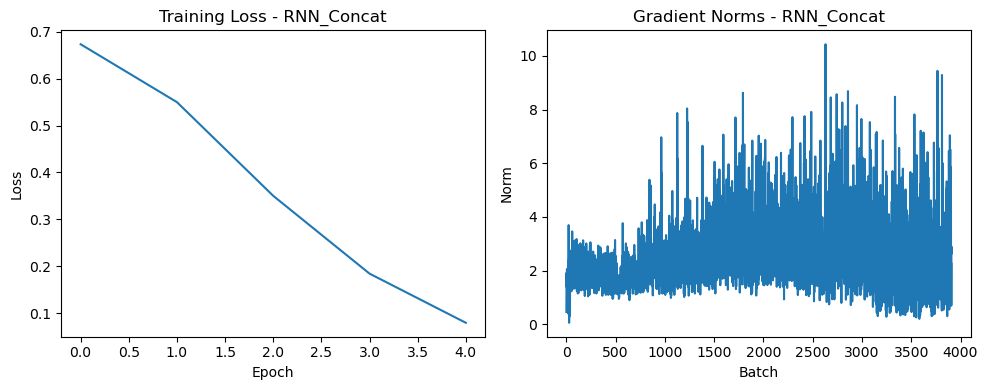

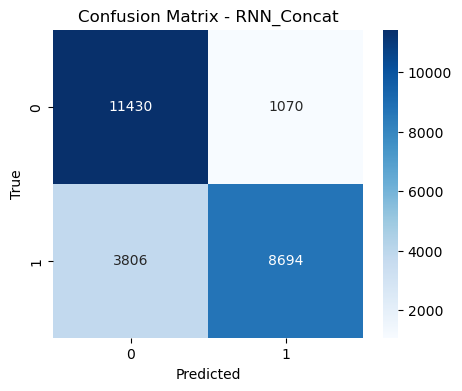

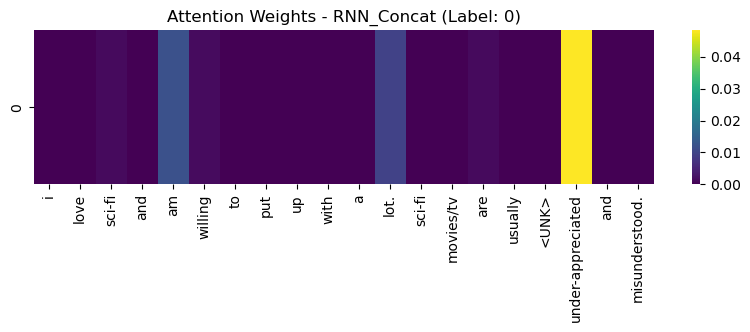

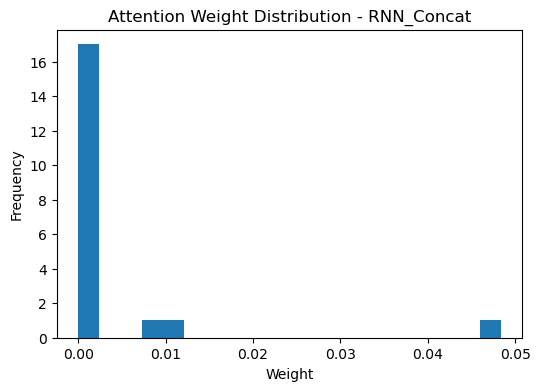


Sample Predictions for RNN_Concat:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 1.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training LSTM...


Epoch 1:   2%|▊                                                   | 13/782 [00:00<00:06, 122.93it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:   5%|██▌                                                 | 39/782 [00:00<00:05, 127.40it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:   8%|████▎                                               | 65/782 [00:00<00:05, 128.17it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  12%|██████                                              | 91/782 [00:00<00:05, 128.66it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  15%|███████▋                                           | 117/782 [00:00<00:05, 127.65it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  18%|█████████▎                                         | 143/782 [00:01<00:05, 126.32it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  22%|███████████                                        | 169/782 [00:01<00:04, 126.57it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  25%|████████████▋                                      | 195/782 [00:01<00:04, 127.56it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 127.77it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  32%|████████████████                                   | 247/782 [00:01<00:04, 127.17it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 126.13it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 126.76it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 127.15it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 127.28it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  48%|████████████████████████▌                          | 377/782 [00:02<00:03, 126.47it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  52%|██████████████████████████▎                        | 403/782 [00:03<00:03, 125.48it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 126.20it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 126.61it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 126.93it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  65%|█████████████████████████████████                  | 507/782 [00:03<00:02, 125.95it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:01, 125.76it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 126.20it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 126.77it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 126.59it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 125.50it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 125.90it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 125.89it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 126.24it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 126.04it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 125.58it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 126.36it/s]


Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 2:   2%|▊                                                   | 13/782 [00:00<00:06, 127.55it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:   5%|██▌                                                 | 39/782 [00:00<00:05, 126.85it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:   8%|████▎                                               | 65/782 [00:00<00:05, 126.52it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  12%|██████                                              | 91/782 [00:00<00:05, 125.50it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  15%|███████▋                                           | 117/782 [00:00<00:05, 125.02it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  18%|█████████▎                                         | 143/782 [00:01<00:05, 125.35it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  22%|███████████                                        | 169/782 [00:01<00:04, 125.89it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  25%|████████████▋                                      | 195/782 [00:01<00:04, 125.84it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 125.19it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  32%|████████████████                                   | 247/782 [00:01<00:04, 125.03it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 125.34it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 125.61it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 125.55it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 124.38it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  48%|████████████████████████▌                          | 377/782 [00:03<00:03, 124.65it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  52%|██████████████████████████▎                        | 403/782 [00:03<00:03, 125.04it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 124.68it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 124.07it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 124.45it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 124.97it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:01, 125.32it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 125.45it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 125.15it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 125.10it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 125.23it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 125.21it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 125.09it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 125.18it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 125.28it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 125.13it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 125.21it/s]


Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:   2%|▊                                                   | 13/782 [00:00<00:06, 126.70it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:   3%|█▋                                                  | 26/782 [00:00<00:06, 125.30it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:   5%|██▌                                                 | 39/782 [00:00<00:05, 125.03it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:   7%|███▍                                                | 52/782 [00:00<00:05, 125.11it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:   8%|████▎                                               | 65/782 [00:00<00:05, 125.01it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  10%|█████▏                                              | 78/782 [00:00<00:05, 125.14it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  12%|██████                                              | 91/782 [00:00<00:05, 124.83it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  13%|██████▊                                            | 104/782 [00:00<00:05, 124.83it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  15%|███████▋                                           | 117/782 [00:00<00:05, 125.06it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  17%|████████▍                                          | 130/782 [00:01<00:05, 125.10it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  18%|█████████▎                                         | 143/782 [00:01<00:05, 125.14it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  20%|██████████▏                                        | 156/782 [00:01<00:05, 124.98it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  22%|███████████                                        | 169/782 [00:01<00:04, 124.86it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  23%|███████████▊                                       | 182/782 [00:01<00:04, 125.02it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  25%|████████████▋                                      | 195/782 [00:01<00:04, 124.98it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  27%|█████████████▌                                     | 208/782 [00:01<00:04, 124.89it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 125.03it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 125.15it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  32%|████████████████                                   | 247/782 [00:01<00:04, 124.89it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 124.98it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 124.95it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  37%|██████████████████▋                                | 286/782 [00:02<00:03, 125.08it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 125.09it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  40%|████████████████████▎                              | 312/782 [00:02<00:03, 125.08it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 124.98it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  43%|██████████████████████                             | 338/782 [00:02<00:03, 125.17it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 124.97it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  47%|███████████████████████▋                           | 364/782 [00:02<00:03, 124.77it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  48%|████████████████████████▌                          | 377/782 [00:03<00:03, 124.85it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  50%|█████████████████████████▍                         | 390/782 [00:03<00:03, 124.66it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  52%|██████████████████████████▎                        | 403/782 [00:03<00:03, 124.90it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  53%|███████████████████████████▏                       | 416/782 [00:03<00:02, 124.95it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 124.91it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  57%|████████████████████████████▊                      | 442/782 [00:03<00:02, 124.84it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 124.84it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:03<00:02, 124.91it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 124.85it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  63%|████████████████████████████████▏                  | 494/782 [00:03<00:02, 124.88it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 124.66it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  66%|█████████████████████████████████▉                 | 520/782 [00:04<00:02, 124.66it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:01, 124.68it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  70%|███████████████████████████████████▌               | 546/782 [00:04<00:01, 124.59it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 124.62it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  73%|█████████████████████████████████████▎             | 572/782 [00:04<00:01, 124.67it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 124.76it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  76%|███████████████████████████████████████            | 598/782 [00:04<00:01, 124.84it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 124.78it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  80%|████████████████████████████████████████▋          | 624/782 [00:04<00:01, 124.71it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 124.74it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 124.73it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 124.84it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  86%|████████████████████████████████████████████       | 676/782 [00:05<00:00, 124.84it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 124.75it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  90%|█████████████████████████████████████████████▊     | 702/782 [00:05<00:00, 124.86it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 124.92it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  93%|███████████████████████████████████████████████▍   | 728/782 [00:05<00:00, 124.78it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 124.54it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  96%|█████████████████████████████████████████████████▏ | 754/782 [00:06<00:00, 124.54it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 124.46it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 124.84it/s]


Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:   2%|▊                                                   | 13/782 [00:00<00:06, 126.23it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:   3%|█▋                                                  | 26/782 [00:00<00:06, 125.59it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:   5%|██▌                                                 | 39/782 [00:00<00:05, 125.13it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:   7%|███▍                                                | 52/782 [00:00<00:05, 125.07it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:   8%|████▎                                               | 65/782 [00:00<00:05, 125.05it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  10%|█████▏                                              | 78/782 [00:00<00:05, 124.94it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  12%|██████                                              | 91/782 [00:00<00:05, 124.92it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  13%|██████▊                                            | 104/782 [00:00<00:05, 124.78it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  15%|███████▋                                           | 117/782 [00:00<00:05, 124.57it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  17%|████████▍                                          | 130/782 [00:01<00:05, 124.45it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  18%|█████████▎                                         | 143/782 [00:01<00:05, 124.68it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  20%|██████████▏                                        | 156/782 [00:01<00:05, 124.61it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  22%|███████████                                        | 169/782 [00:01<00:04, 124.47it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  23%|███████████▊                                       | 182/782 [00:01<00:04, 124.62it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  25%|████████████▋                                      | 195/782 [00:01<00:04, 124.69it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  27%|█████████████▌                                     | 208/782 [00:01<00:04, 124.64it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 124.59it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 124.38it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  32%|████████████████                                   | 247/782 [00:01<00:04, 124.25it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 124.30it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 124.45it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  37%|██████████████████▋                                | 286/782 [00:02<00:03, 124.50it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 124.67it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  40%|████████████████████▎                              | 312/782 [00:02<00:03, 124.70it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 124.76it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  43%|██████████████████████                             | 338/782 [00:02<00:03, 124.52it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 124.45it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  47%|███████████████████████▋                           | 364/782 [00:02<00:03, 124.27it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  48%|████████████████████████▌                          | 377/782 [00:03<00:03, 124.15it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  50%|█████████████████████████▍                         | 390/782 [00:03<00:03, 124.30it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  52%|██████████████████████████▎                        | 403/782 [00:03<00:03, 124.41it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  53%|███████████████████████████▏                       | 416/782 [00:03<00:02, 124.70it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 124.60it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  57%|████████████████████████████▊                      | 442/782 [00:03<00:02, 124.62it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 124.74it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:03<00:02, 124.80it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 124.70it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  63%|████████████████████████████████▏                  | 494/782 [00:03<00:02, 124.48it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 124.42it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  66%|█████████████████████████████████▉                 | 520/782 [00:04<00:02, 124.09it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:02, 124.33it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  70%|███████████████████████████████████▌               | 546/782 [00:04<00:01, 124.32it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 124.46it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  73%|█████████████████████████████████████▎             | 572/782 [00:04<00:01, 124.63it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 124.66it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  76%|███████████████████████████████████████            | 598/782 [00:04<00:01, 124.59it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 124.55it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 124.30it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 124.27it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 124.26it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 124.21it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  86%|████████████████████████████████████████████       | 676/782 [00:05<00:00, 124.45it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 124.68it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  90%|█████████████████████████████████████████████▊     | 702/782 [00:05<00:00, 124.76it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 124.77it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  93%|███████████████████████████████████████████████▍   | 728/782 [00:05<00:00, 124.63it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 124.38it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  96%|█████████████████████████████████████████████████▏ | 754/782 [00:06<00:00, 124.17it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 124.29it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 124.53it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])



Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:   2%|▊                                                   | 13/782 [00:00<00:06, 125.64it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:   3%|█▋                                                  | 26/782 [00:00<00:06, 125.10it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:   5%|██▌                                                 | 39/782 [00:00<00:05, 125.03it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:   7%|███▍                                                | 52/782 [00:00<00:05, 124.97it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:   8%|████▎                                               | 65/782 [00:00<00:05, 124.81it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  10%|█████▏                                              | 78/782 [00:00<00:05, 124.49it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  12%|██████                                              | 91/782 [00:00<00:05, 124.37it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  13%|██████▊                                            | 104/782 [00:00<00:05, 124.17it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  15%|███████▋                                           | 117/782 [00:00<00:05, 124.00it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  17%|████████▍                                          | 130/782 [00:01<00:05, 124.19it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  18%|█████████▎                                         | 143/782 [00:01<00:05, 124.51it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  20%|██████████▏                                        | 156/782 [00:01<00:05, 124.53it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  22%|███████████                                        | 169/782 [00:01<00:04, 124.52it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  23%|███████████▊                                       | 182/782 [00:01<00:04, 124.48it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  25%|████████████▋                                      | 195/782 [00:01<00:04, 124.32it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  27%|█████████████▌                                     | 208/782 [00:01<00:04, 124.28it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 124.24it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 124.09it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  32%|████████████████                                   | 247/782 [00:01<00:04, 123.83it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 124.03it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 124.19it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  37%|██████████████████▋                                | 286/782 [00:02<00:03, 124.08it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 124.00it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  40%|████████████████████▎                              | 312/782 [00:02<00:03, 124.09it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 124.10it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  43%|██████████████████████                             | 338/782 [00:02<00:03, 124.16it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 124.02it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  47%|███████████████████████▋                           | 364/782 [00:02<00:03, 123.77it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  48%|████████████████████████▌                          | 377/782 [00:03<00:03, 123.88it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  50%|█████████████████████████▍                         | 390/782 [00:03<00:03, 123.98it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  52%|██████████████████████████▎                        | 403/782 [00:03<00:03, 123.64it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  53%|███████████████████████████▏                       | 416/782 [00:03<00:02, 123.79it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 123.69it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  57%|████████████████████████████▊                      | 442/782 [00:03<00:02, 123.76it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 123.76it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:03<00:02, 123.34it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 123.19it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  63%|████████████████████████████████▏                  | 494/782 [00:03<00:02, 123.09it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 123.41it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  66%|█████████████████████████████████▉                 | 520/782 [00:04<00:02, 122.97it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:02, 123.08it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  70%|███████████████████████████████████▌               | 546/782 [00:04<00:01, 123.19it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 123.33it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  73%|█████████████████████████████████████▎             | 572/782 [00:04<00:01, 123.35it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 123.17it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  76%|███████████████████████████████████████            | 598/782 [00:04<00:01, 123.16it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 123.46it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 123.38it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 123.25it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 123.37it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 123.19it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  86%|████████████████████████████████████████████       | 676/782 [00:05<00:00, 123.33it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 123.46it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  90%|█████████████████████████████████████████████▊     | 702/782 [00:05<00:00, 123.04it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 122.86it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  93%|███████████████████████████████████████████████▍   | 728/782 [00:05<00:00, 122.82it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 122.93it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  96%|█████████████████████████████████████████████████▏ | 754/782 [00:06<00:00, 122.80it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 122.92it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'tor

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 123.69it/s]

Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM, Raw output type: <class 'torch.Tensor'>
Model: LSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


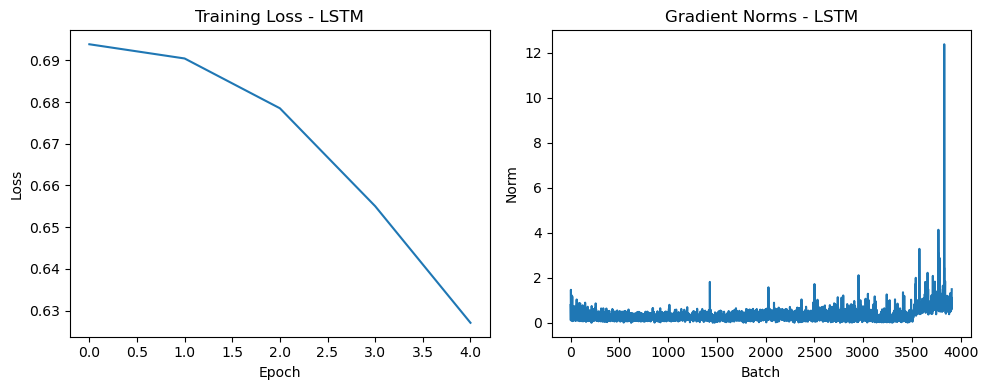

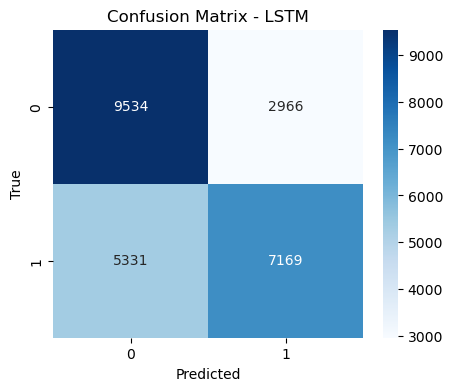


Sample Predictions for LSTM:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 1.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training LSTM_Bahdanau...


Epoch 1:   2%|▊                                                   | 13/782 [00:00<00:06, 123.37it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:   5%|██▌                                                 | 39/782 [00:00<00:06, 119.52it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:   8%|████▏                                               | 63/782 [00:00<00:06, 118.41it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  11%|█████▊                                              | 87/782 [00:00<00:05, 117.88it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  14%|███████▏                                           | 111/782 [00:00<00:05, 116.48it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  17%|████████▊                                          | 135/782 [00:01<00:05, 115.12it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  20%|██████████▎                                        | 159/782 [00:01<00:05, 115.37it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  23%|███████████▉                                       | 183/782 [00:01<00:05, 116.01it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  26%|█████████████▌                                     | 207/782 [00:01<00:04, 116.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  30%|███████████████                                    | 231/782 [00:01<00:04, 115.09it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  33%|████████████████▋                                  | 255/782 [00:02<00:04, 114.54it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  36%|██████████████████▏                                | 279/782 [00:02<00:04, 114.68it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  39%|███████████████████▊                               | 303/782 [00:02<00:04, 115.27it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  42%|█████████████████████▎                             | 327/782 [00:02<00:03, 115.31it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  45%|██████████████████████▉                            | 351/782 [00:03<00:03, 114.17it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  48%|████████████████████████▍                          | 375/782 [00:03<00:03, 114.17it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  51%|██████████████████████████                         | 399/782 [00:03<00:03, 114.31it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  54%|███████████████████████████▌                       | 423/782 [00:03<00:03, 114.96it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  57%|█████████████████████████████▏                     | 447/782 [00:03<00:02, 114.54it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  59%|█████████████████████████████▉                     | 459/782 [00:03<00:02, 114.15it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  60%|██████████████████████████████▋                    | 471/782 [00:04<00:02, 113.93it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  62%|███████████████████████████████▌                   | 483/782 [00:04<00:02, 113.82it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 113.66it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  68%|██████████████████████████████████▋                | 531/782 [00:04<00:02, 114.17it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  71%|████████████████████████████████████▏              | 555/782 [00:04<00:01, 114.04it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  74%|█████████████████████████████████████▊             | 579/782 [00:05<00:01, 113.65it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  77%|███████████████████████████████████████▎           | 603/782 [00:05<00:01, 113.51it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  80%|████████████████████████████████████████▉          | 627/782 [00:05<00:01, 113.38it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  83%|██████████████████████████████████████████▍        | 651/782 [00:05<00:01, 113.62it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  86%|████████████████████████████████████████████       | 675/782 [00:05<00:00, 113.24it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  89%|█████████████████████████████████████████████▌     | 699/782 [00:06<00:00, 113.36it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  91%|██████████████████████████████████████████████▎    | 711/782 [00:06<00:00, 113.18it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  92%|███████████████████████████████████████████████▏   | 723/782 [00:06<00:00, 113.30it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  94%|███████████████████████████████████████████████▉   | 735/782 [00:06<00:00, 113.31it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1:  96%|████████████████████████████████████████████████▋  | 747/782 [00:06<00:00, 113.34it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  97%|█████████████████████████████████████████████████▌ | 759/782 [00:06<00:00, 113.46it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 114.68it/s]


Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:   2%|▊                                                   | 12/782 [00:00<00:06, 114.82it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:   3%|█▌                                                  | 24/782 [00:00<00:06, 114.14it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:   5%|██▍                                                 | 36/782 [00:00<00:06, 113.73it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:   6%|███▏                                                | 48/782 [00:00<00:06, 113.47it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:   8%|███▉                                                | 60/782 [00:00<00:06, 113.39it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:   9%|████▊                                               | 72/782 [00:00<00:06, 113.36it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  11%|█████▌                                              | 84/782 [00:00<00:06, 113.43it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  12%|██████▍                                             | 96/782 [00:00<00:06, 113.51it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  14%|███████                                            | 108/782 [00:00<00:05, 113.08it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  15%|███████▊                                           | 120/782 [00:01<00:05, 113.30it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  17%|████████▌                                          | 132/782 [00:01<00:05, 113.42it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  18%|█████████▍                                         | 144/782 [00:01<00:05, 113.62it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  20%|██████████▏                                        | 156/782 [00:01<00:05, 113.42it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  21%|██████████▉                                        | 168/782 [00:01<00:05, 113.22it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  23%|███████████▋                                       | 180/782 [00:01<00:05, 113.19it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  25%|████████████▌                                      | 192/782 [00:01<00:05, 113.35it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  26%|█████████████▎                                     | 204/782 [00:01<00:05, 113.30it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  28%|██████████████                                     | 216/782 [00:01<00:04, 113.32it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  29%|██████████████▊                                    | 228/782 [00:02<00:04, 113.22it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 113.38it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 113.43it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 113.32it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  35%|██████████████████                                 | 276/782 [00:02<00:04, 113.53it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 113.39it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 113.43it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 113.26it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  41%|█████████████████████▏                             | 324/782 [00:02<00:04, 113.33it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 113.17it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  45%|██████████████████████▋                            | 348/782 [00:03<00:03, 113.21it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 113.24it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 113.22it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 113.20it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 113.35it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 113.10it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 113.04it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 112.85it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 112.68it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  58%|█████████████████████████████▋                     | 456/782 [00:04<00:02, 112.95it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 112.96it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 113.40it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 113.32it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 113.56it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 113.17it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 113.26it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 113.09it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  71%|████████████████████████████████████               | 552/782 [00:04<00:02, 113.15it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 113.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  74%|█████████████████████████████████████▌             | 576/782 [00:05<00:01, 113.26it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 113.30it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 113.55it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 113.40it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 113.30it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 113.04it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 113.19it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 113.14it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  87%|████████████████████████████████████████████▌      | 684/782 [00:06<00:00, 113.26it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  89%|█████████████████████████████████████████████▍     | 696/782 [00:06<00:00, 113.14it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 113.32it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 113.43it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 113.31it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 113.31it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 113.24it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 113.28it/s]


Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:   2%|▊                                                   | 12/782 [00:00<00:06, 114.18it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:   3%|█▌                                                  | 24/782 [00:00<00:06, 113.90it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:   5%|██▍                                                 | 36/782 [00:00<00:06, 113.72it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:   6%|███▏                                                | 48/782 [00:00<00:06, 113.10it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:   8%|███▉                                                | 60/782 [00:00<00:06, 113.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:   9%|████▊                                               | 72/782 [00:00<00:06, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  11%|█████▌                                              | 84/782 [00:00<00:06, 113.19it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  12%|██████▍                                             | 96/782 [00:00<00:06, 112.97it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  14%|███████                                            | 108/782 [00:00<00:05, 112.89it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  15%|███████▊                                           | 120/782 [00:01<00:05, 112.85it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  17%|████████▌                                          | 132/782 [00:01<00:05, 113.07it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  18%|█████████▍                                         | 144/782 [00:01<00:05, 113.29it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  20%|██████████▏                                        | 156/782 [00:01<00:05, 112.97it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  21%|██████████▉                                        | 168/782 [00:01<00:05, 112.90it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  23%|███████████▋                                       | 180/782 [00:01<00:05, 113.10it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  25%|████████████▌                                      | 192/782 [00:01<00:05, 113.02it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  26%|█████████████▎                                     | 204/782 [00:01<00:05, 112.98it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  28%|██████████████                                     | 216/782 [00:01<00:05, 112.86it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  29%|██████████████▊                                    | 228/782 [00:02<00:04, 113.04it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 113.18it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 113.27it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 113.43it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  35%|██████████████████                                 | 276/782 [00:02<00:04, 113.27it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 113.29it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 113.52it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 113.16it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  41%|█████████████████████▏                             | 324/782 [00:02<00:04, 113.12it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  45%|██████████████████████▋                            | 348/782 [00:03<00:03, 113.18it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 113.54it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 113.39it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 113.51it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 113.41it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 113.39it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 113.08it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 113.24it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 113.26it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  58%|█████████████████████████████▋                     | 456/782 [00:04<00:02, 113.11it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 113.25it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 113.28it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 113.39it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 113.46it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 113.50it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 113.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 113.15it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  71%|████████████████████████████████████               | 552/782 [00:04<00:02, 113.23it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 113.20it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  74%|█████████████████████████████████████▌             | 576/782 [00:05<00:01, 113.28it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 113.14it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 113.02it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 113.45it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 113.52it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 113.15it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 113.20it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  87%|████████████████████████████████████████████▌      | 684/782 [00:06<00:00, 113.16it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  89%|█████████████████████████████████████████████▍     | 696/782 [00:06<00:00, 113.22it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 113.10it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 113.09it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 112.96it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 113.20it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 3: 100%|██████████████████████████████████████████████████▊| 780/782 [00:06<00:00, 113.16it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:   2%|▊                                                   | 12/782 [00:00<00:06, 114.47it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:   3%|█▌                                                  | 24/782 [00:00<00:06, 113.69it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:   5%|██▍                                                 | 36/782 [00:00<00:06, 113.82it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:   6%|███▏                                                | 48/782 [00:00<00:06, 113.87it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:   8%|███▉                                                | 60/782 [00:00<00:06, 113.72it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:   9%|████▊                                               | 72/782 [00:00<00:06, 113.58it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  11%|█████▌                                              | 84/782 [00:00<00:06, 113.30it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  12%|██████▍                                             | 96/782 [00:00<00:06, 113.28it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  14%|███████                                            | 108/782 [00:00<00:05, 113.04it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  15%|███████▊                                           | 120/782 [00:01<00:05, 112.94it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  17%|████████▌                                          | 132/782 [00:01<00:05, 113.10it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  18%|█████████▍                                         | 144/782 [00:01<00:05, 113.00it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  20%|██████████▏                                        | 156/782 [00:01<00:05, 113.11it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  21%|██████████▉                                        | 168/782 [00:01<00:05, 113.12it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  23%|███████████▋                                       | 180/782 [00:01<00:05, 113.19it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  25%|████████████▌                                      | 192/782 [00:01<00:05, 113.06it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  26%|█████████████▎                                     | 204/782 [00:01<00:05, 113.02it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  28%|██████████████                                     | 216/782 [00:01<00:05, 113.03it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  29%|██████████████▊                                    | 228/782 [00:02<00:04, 113.21it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 113.15it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 113.42it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 113.36it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  35%|██████████████████                                 | 276/782 [00:02<00:04, 113.34it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 113.53it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 113.51it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 113.25it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  41%|█████████████████████▏                             | 324/782 [00:02<00:04, 113.26it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 112.96it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  45%|██████████████████████▋                            | 348/782 [00:03<00:03, 113.07it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 113.41it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 113.39it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 113.25it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 113.44it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 113.34it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 113.06it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 113.09it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 112.81it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  58%|█████████████████████████████▋                     | 456/782 [00:04<00:02, 112.59it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 113.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 113.15it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 113.01it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 113.29it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 113.38it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 112.97it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 113.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  71%|████████████████████████████████████               | 552/782 [00:04<00:02, 112.92it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 112.66it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  74%|█████████████████████████████████████▌             | 576/782 [00:05<00:01, 112.77it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 113.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 112.89it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 113.12it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 113.11it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 113.18it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 113.19it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 113.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 113.26it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  87%|████████████████████████████████████████████▌      | 684/782 [00:06<00:00, 113.22it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  89%|█████████████████████████████████████████████▍     | 696/782 [00:06<00:00, 113.43it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 113.38it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 113.14it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 113.36it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 113.47it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 113.18it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 112.98it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 113.18it/s]


Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:   2%|▊                                                   | 12/782 [00:00<00:06, 115.33it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:   3%|█▌                                                  | 24/782 [00:00<00:06, 113.44it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:   5%|██▍                                                 | 36/782 [00:00<00:06, 113.29it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:   6%|███▏                                                | 48/782 [00:00<00:06, 113.17it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:   8%|███▉                                                | 60/782 [00:00<00:06, 113.12it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:   9%|████▊                                               | 72/782 [00:00<00:06, 113.25it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  11%|█████▌                                              | 84/782 [00:00<00:06, 113.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  12%|██████▍                                             | 96/782 [00:00<00:06, 112.87it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  14%|███████                                            | 108/782 [00:00<00:05, 112.93it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  15%|███████▊                                           | 120/782 [00:01<00:05, 112.95it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  17%|████████▌                                          | 132/782 [00:01<00:05, 112.84it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  18%|█████████▍                                         | 144/782 [00:01<00:05, 113.01it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  20%|██████████▏                                        | 156/782 [00:01<00:05, 113.04it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  21%|██████████▉                                        | 168/782 [00:01<00:05, 113.09it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  23%|███████████▋                                       | 180/782 [00:01<00:05, 113.22it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  25%|████████████▌                                      | 192/782 [00:01<00:05, 112.98it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  26%|█████████████▎                                     | 204/782 [00:01<00:05, 112.96it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  28%|██████████████                                     | 216/782 [00:01<00:05, 112.65it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  29%|██████████████▊                                    | 228/782 [00:02<00:04, 112.67it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 112.91it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 112.84it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 112.60it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  35%|██████████████████                                 | 276/782 [00:02<00:04, 112.52it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 112.26it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 112.58it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 112.69it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  41%|█████████████████████▏                             | 324/782 [00:02<00:04, 112.87it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 112.72it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  45%|██████████████████████▋                            | 348/782 [00:03<00:03, 112.43it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 112.71it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 112.43it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 112.13it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 112.49it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 112.36it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 112.82it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 112.87it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  57%|████████████████████████████▉                      | 444/782 [00:03<00:03, 112.59it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  58%|█████████████████████████████▋                     | 456/782 [00:04<00:02, 112.82it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 112.77it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 112.72it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 112.81it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 112.96it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 112.94it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 112.81it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 112.93it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  71%|████████████████████████████████████               | 552/782 [00:04<00:02, 113.07it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 113.15it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  74%|█████████████████████████████████████▌             | 576/782 [00:05<00:01, 113.00it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 113.14it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 112.89it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 113.05it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 113.07it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 112.86it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 112.63it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 112.79it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 112.88it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  87%|████████████████████████████████████████████▌      | 684/782 [00:06<00:00, 112.90it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  89%|█████████████████████████████████████████████▍     | 696/782 [00:06<00:00, 113.01it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 113.02it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 113.10it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 113.01it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 112.85it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 112.83it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 112.81it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5: 100%|██████████████████████████████████████████████████▊| 780/782 [00:06<00:00, 112.81it/s]

Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: LSTM_Bahdanau, Output tensor type: <class 'torch.T

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 112.86it/s]


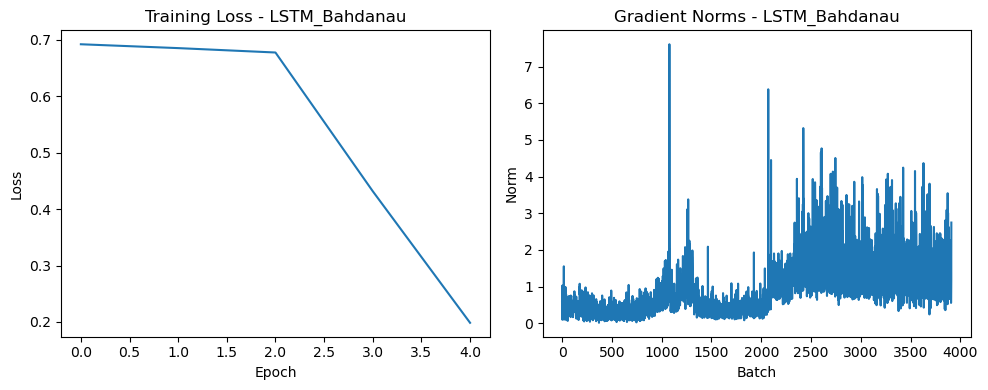

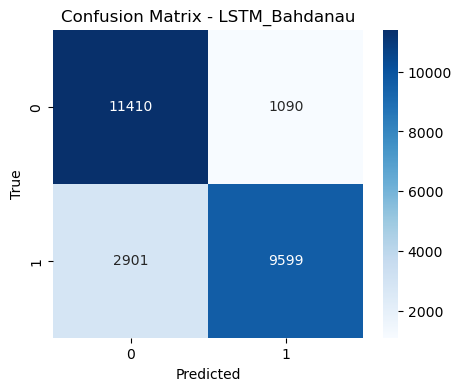

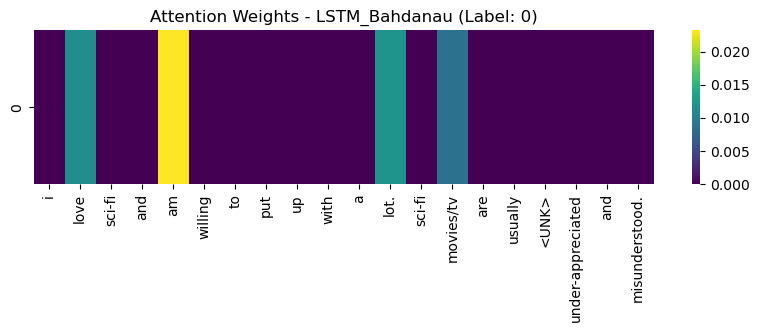

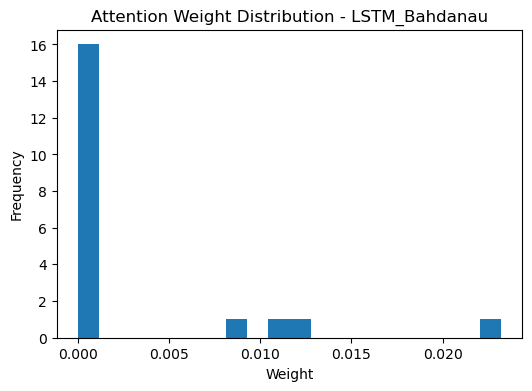


Sample Predictions for LSTM_Bahdanau:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training LSTM_Dot...


Epoch 1:   2%|▉                                                   | 14/782 [00:00<00:05, 130.21it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:   5%|██▋                                                 | 41/782 [00:00<00:05, 126.06it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:   9%|████▍                                               | 67/782 [00:00<00:05, 125.10it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  12%|██████▏                                             | 93/782 [00:00<00:05, 124.74it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  15%|███████▊                                           | 119/782 [00:00<00:05, 123.23it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  19%|█████████▍                                         | 145/782 [00:01<00:05, 122.36it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  22%|███████████▏                                       | 171/782 [00:01<00:04, 122.96it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  25%|████████████▊                                      | 197/782 [00:01<00:04, 123.26it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  29%|██████████████▌                                    | 223/782 [00:01<00:04, 123.10it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  32%|████████████████▏                                  | 249/782 [00:02<00:04, 121.87it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  34%|█████████████████                                  | 262/782 [00:02<00:04, 121.55it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  35%|█████████████████▉                                 | 275/782 [00:02<00:04, 121.49it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 121.93it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  38%|███████████████████▋                               | 301/782 [00:02<00:03, 122.05it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  40%|████████████████████▍                              | 314/782 [00:02<00:03, 122.35it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  42%|█████████████████████▎                             | 327/782 [00:02<00:03, 122.52it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  43%|██████████████████████▏                            | 340/782 [00:02<00:03, 122.59it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  47%|███████████████████████▊                           | 366/782 [00:02<00:03, 121.89it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  50%|█████████████████████████▌                         | 392/782 [00:03<00:03, 121.62it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  53%|███████████████████████████▎                       | 418/782 [00:03<00:02, 121.99it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 122.25it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  60%|██████████████████████████████▋                    | 470/782 [00:03<00:02, 121.78it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  63%|████████████████████████████████▎                  | 496/782 [00:04<00:02, 121.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  67%|██████████████████████████████████                 | 522/782 [00:04<00:02, 121.30it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  70%|███████████████████████████████████▋               | 548/782 [00:04<00:01, 121.72it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  73%|█████████████████████████████████████▍             | 574/782 [00:04<00:01, 121.52it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  75%|██████████████████████████████████████▎            | 587/782 [00:04<00:01, 120.88it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  77%|███████████████████████████████████████▏           | 600/782 [00:04<00:01, 120.66it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  78%|███████████████████████████████████████▉           | 613/782 [00:05<00:01, 120.57it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  80%|████████████████████████████████████████▊          | 626/782 [00:05<00:01, 120.55it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  82%|█████████████████████████████████████████▋         | 639/782 [00:05<00:01, 120.69it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  83%|██████████████████████████████████████████▌        | 652/782 [00:05<00:01, 120.68it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  85%|███████████████████████████████████████████▎       | 665/782 [00:05<00:00, 121.14it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  88%|█████████████████████████████████████████████      | 691/782 [00:05<00:00, 121.38it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  92%|██████████████████████████████████████████████▊    | 717/782 [00:05<00:00, 120.74it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  95%|████████████████████████████████████████████████▍  | 743/782 [00:06<00:00, 120.54it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1:  98%|██████████████████████████████████████████████████▏| 769/782 [00:06<00:00, 120.52it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 122.02it/s]


Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 2:   2%|▊                                                   | 13/782 [00:00<00:06, 123.28it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:   5%|██▌                                                 | 39/782 [00:00<00:06, 120.80it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:   8%|████▎                                               | 65/782 [00:00<00:05, 120.28it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  12%|██████                                              | 91/782 [00:00<00:05, 120.38it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  15%|███████▋                                           | 117/782 [00:00<00:05, 120.23it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  17%|████████▍                                          | 130/782 [00:01<00:05, 120.57it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  18%|█████████▎                                         | 143/782 [00:01<00:05, 120.58it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  20%|██████████▏                                        | 156/782 [00:01<00:05, 120.63it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  22%|███████████                                        | 169/782 [00:01<00:05, 120.54it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  23%|███████████▊                                       | 182/782 [00:01<00:04, 120.26it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  25%|████████████▋                                      | 195/782 [00:01<00:04, 120.40it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  27%|█████████████▌                                     | 208/782 [00:01<00:04, 120.30it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 120.02it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 120.21it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  32%|████████████████                                   | 247/782 [00:02<00:04, 120.48it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 120.62it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 120.39it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  37%|██████████████████▋                                | 286/782 [00:02<00:04, 120.42it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  38%|███████████████████▌                               | 299/782 [00:02<00:04, 120.22it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  40%|████████████████████▎                              | 312/782 [00:02<00:03, 120.37it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  43%|██████████████████████                             | 338/782 [00:02<00:03, 120.04it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  47%|███████████████████████▋                           | 364/782 [00:03<00:03, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  50%|█████████████████████████▍                         | 390/782 [00:03<00:03, 120.51it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  53%|███████████████████████████▏                       | 416/782 [00:03<00:03, 120.53it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 120.60it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  57%|████████████████████████████▊                      | 442/782 [00:03<00:02, 120.67it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 120.49it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  60%|██████████████████████████████▌                    | 468/782 [00:03<00:02, 120.34it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 120.38it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  63%|████████████████████████████████▏                  | 494/782 [00:04<00:02, 120.47it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 120.31it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  66%|█████████████████████████████████▉                 | 520/782 [00:04<00:02, 120.24it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:02, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  70%|███████████████████████████████████▌               | 546/782 [00:04<00:01, 120.18it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 120.22it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  73%|█████████████████████████████████████▎             | 572/782 [00:04<00:01, 120.04it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 120.16it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  76%|███████████████████████████████████████            | 598/782 [00:04<00:01, 120.23it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  78%|███████████████████████████████████████▊           | 611/782 [00:05<00:01, 120.52it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 120.59it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 120.73it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 120.60it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 120.39it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 120.22it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  95%|████████████████████████████████████████████████▎  | 741/782 [00:06<00:00, 120.43it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  96%|█████████████████████████████████████████████████▏ | 754/782 [00:06<00:00, 120.46it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 120.59it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 120.44it/s]


Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:   2%|▊                                                   | 13/782 [00:00<00:06, 120.66it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:   3%|█▋                                                  | 26/782 [00:00<00:06, 120.75it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:   5%|██▌                                                 | 39/782 [00:00<00:06, 120.30it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:   7%|███▍                                                | 52/782 [00:00<00:06, 120.42it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:   8%|████▎                                               | 65/782 [00:00<00:05, 120.60it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  10%|█████▏                                              | 78/782 [00:00<00:05, 120.56it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  12%|██████                                              | 91/782 [00:00<00:05, 120.62it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  13%|██████▊                                            | 104/782 [00:00<00:05, 120.56it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  15%|███████▋                                           | 117/782 [00:00<00:05, 120.44it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  17%|████████▍                                          | 130/782 [00:01<00:05, 120.38it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  18%|█████████▎                                         | 143/782 [00:01<00:05, 120.31it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  20%|██████████▏                                        | 156/782 [00:01<00:05, 120.30it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  22%|███████████                                        | 169/782 [00:01<00:05, 120.29it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  23%|███████████▊                                       | 182/782 [00:01<00:05, 119.78it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  25%|████████████▋                                      | 194/782 [00:01<00:04, 119.58it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  26%|█████████████▍                                     | 206/782 [00:01<00:04, 119.48it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  28%|██████████████▎                                    | 219/782 [00:01<00:04, 119.98it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  30%|███████████████▏                                   | 232/782 [00:01<00:04, 120.09it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  31%|███████████████▉                                   | 245/782 [00:02<00:04, 120.22it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  33%|████████████████▊                                  | 258/782 [00:02<00:04, 120.28it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  35%|█████████████████▋                                 | 271/782 [00:02<00:04, 120.42it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  36%|██████████████████▌                                | 284/782 [00:02<00:04, 120.42it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  38%|███████████████████▎                               | 297/782 [00:02<00:04, 120.34it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  40%|████████████████████▏                              | 310/782 [00:02<00:03, 120.31it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  41%|█████████████████████                              | 323/782 [00:02<00:03, 120.35it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 120.43it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  45%|██████████████████████▊                            | 349/782 [00:02<00:03, 120.49it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  46%|███████████████████████▌                           | 362/782 [00:03<00:03, 120.44it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  48%|████████████████████████▍                          | 375/782 [00:03<00:03, 120.53it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  50%|█████████████████████████▎                         | 388/782 [00:03<00:03, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  51%|██████████████████████████▏                        | 401/782 [00:03<00:03, 120.57it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  53%|███████████████████████████                        | 414/782 [00:03<00:03, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  55%|███████████████████████████▊                       | 427/782 [00:03<00:02, 120.36it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  56%|████████████████████████████▋                      | 440/782 [00:03<00:02, 120.40it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  58%|█████████████████████████████▌                     | 453/782 [00:03<00:02, 120.32it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  60%|██████████████████████████████▍                    | 466/782 [00:03<00:02, 120.51it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  61%|███████████████████████████████▏                   | 479/782 [00:03<00:02, 120.43it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 120.61it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  65%|████████████████████████████████▉                  | 505/782 [00:04<00:02, 120.65it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  66%|█████████████████████████████████▊                 | 518/782 [00:04<00:02, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  68%|██████████████████████████████████▋                | 531/782 [00:04<00:02, 120.55it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  70%|███████████████████████████████████▍               | 544/782 [00:04<00:01, 120.43it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  71%|████████████████████████████████████▎              | 557/782 [00:04<00:01, 120.36it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  73%|█████████████████████████████████████▏             | 570/782 [00:04<00:01, 120.42it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  75%|██████████████████████████████████████             | 583/782 [00:04<00:01, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  76%|██████████████████████████████████████▊            | 596/782 [00:04<00:01, 120.53it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  78%|███████████████████████████████████████▋           | 609/782 [00:05<00:01, 120.71it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  80%|████████████████████████████████████████▌          | 622/782 [00:05<00:01, 120.59it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  81%|█████████████████████████████████████████▍         | 635/782 [00:05<00:01, 120.52it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 120.49it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  85%|███████████████████████████████████████████        | 661/782 [00:05<00:01, 120.47it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  86%|███████████████████████████████████████████▉       | 674/782 [00:05<00:00, 120.33it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  88%|████████████████████████████████████████████▊      | 687/782 [00:05<00:00, 120.20it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  90%|█████████████████████████████████████████████▋     | 700/782 [00:05<00:00, 120.22it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  91%|██████████████████████████████████████████████▌    | 713/782 [00:05<00:00, 120.22it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  93%|███████████████████████████████████████████████▎   | 726/782 [00:06<00:00, 120.15it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  95%|████████████████████████████████████████████████▏  | 739/782 [00:06<00:00, 120.28it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  96%|█████████████████████████████████████████████████  | 752/782 [00:06<00:00, 120.28it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3:  98%|█████████████████████████████████████████████████▉ | 765/782 [00:06<00:00, 120.23it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 120.34it/s]


Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:   2%|▊                                                   | 13/782 [00:00<00:06, 121.17it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:   3%|█▋                                                  | 26/782 [00:00<00:06, 120.39it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:   5%|██▌                                                 | 39/782 [00:00<00:06, 119.96it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:   7%|███▍                                                | 52/782 [00:00<00:06, 120.07it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:   8%|████▎                                               | 65/782 [00:00<00:05, 120.10it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  10%|█████▏                                              | 78/782 [00:00<00:05, 120.24it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  12%|██████                                              | 91/782 [00:00<00:05, 120.15it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  13%|██████▊                                            | 104/782 [00:00<00:05, 120.20it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  15%|███████▋                                           | 117/782 [00:00<00:05, 120.02it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  17%|████████▍                                          | 130/782 [00:01<00:05, 120.02it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  18%|█████████▎                                         | 143/782 [00:01<00:05, 120.39it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  20%|██████████▏                                        | 156/782 [00:01<00:05, 120.12it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  22%|███████████                                        | 169/782 [00:01<00:05, 120.22it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  23%|███████████▊                                       | 182/782 [00:01<00:04, 120.11it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  25%|████████████▋                                      | 195/782 [00:01<00:04, 120.37it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  27%|█████████████▌                                     | 208/782 [00:01<00:04, 120.10it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 120.22it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 120.30it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  32%|████████████████                                   | 247/782 [00:02<00:04, 120.38it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 120.37it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  37%|██████████████████▋                                | 286/782 [00:02<00:04, 120.58it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  38%|███████████████████▌                               | 299/782 [00:02<00:04, 120.51it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  40%|████████████████████▎                              | 312/782 [00:02<00:03, 120.57it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 120.29it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  43%|██████████████████████                             | 338/782 [00:02<00:03, 120.10it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 120.00it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  47%|███████████████████████▋                           | 364/782 [00:03<00:03, 120.15it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  48%|████████████████████████▌                          | 377/782 [00:03<00:03, 120.17it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  50%|█████████████████████████▍                         | 390/782 [00:03<00:03, 120.18it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  52%|██████████████████████████▎                        | 403/782 [00:03<00:03, 120.23it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  53%|███████████████████████████▏                       | 416/782 [00:03<00:03, 120.12it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 120.16it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  57%|████████████████████████████▊                      | 442/782 [00:03<00:02, 120.33it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 120.17it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:03<00:02, 120.18it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  62%|███████████████████████████████▎                   | 481/782 [00:04<00:02, 120.35it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  63%|████████████████████████████████▏                  | 494/782 [00:04<00:02, 120.25it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 120.38it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  66%|█████████████████████████████████▉                 | 520/782 [00:04<00:02, 120.34it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:02, 120.17it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  70%|███████████████████████████████████▌               | 546/782 [00:04<00:01, 120.18it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 120.17it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  73%|█████████████████████████████████████▎             | 572/782 [00:04<00:01, 119.94it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 120.09it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  76%|███████████████████████████████████████            | 598/782 [00:04<00:01, 120.16it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  78%|███████████████████████████████████████▊           | 611/782 [00:05<00:01, 120.10it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 120.30it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 120.27it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 120.34it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 120.39it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  86%|████████████████████████████████████████████       | 676/782 [00:05<00:00, 120.31it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 120.43it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  90%|█████████████████████████████████████████████▊     | 702/782 [00:05<00:00, 120.44it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 120.59it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  93%|███████████████████████████████████████████████▍   | 728/782 [00:06<00:00, 120.35it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  95%|████████████████████████████████████████████████▎  | 741/782 [00:06<00:00, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  96%|█████████████████████████████████████████████████▏ | 754/782 [00:06<00:00, 120.53it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 120.42it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 120.26it/s]


Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:   2%|▊                                                   | 13/782 [00:00<00:06, 121.57it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:   3%|█▋                                                  | 26/782 [00:00<00:06, 120.85it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:   5%|██▌                                                 | 39/782 [00:00<00:06, 120.46it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:   7%|███▍                                                | 52/782 [00:00<00:06, 120.40it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:   8%|████▎                                               | 65/782 [00:00<00:05, 120.47it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  10%|█████▏                                              | 78/782 [00:00<00:05, 120.37it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  12%|██████                                              | 91/782 [00:00<00:05, 120.47it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  13%|██████▊                                            | 104/782 [00:00<00:05, 120.25it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  15%|███████▋                                           | 117/782 [00:00<00:05, 120.29it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  17%|████████▍                                          | 130/782 [00:01<00:05, 120.33it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  18%|█████████▎                                         | 143/782 [00:01<00:05, 120.36it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  20%|██████████▏                                        | 156/782 [00:01<00:05, 120.25it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  22%|███████████                                        | 169/782 [00:01<00:05, 120.15it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  23%|███████████▊                                       | 182/782 [00:01<00:04, 120.18it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  25%|████████████▋                                      | 195/782 [00:01<00:04, 120.03it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  27%|█████████████▌                                     | 208/782 [00:01<00:04, 120.30it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 120.38it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 120.32it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  32%|████████████████                                   | 247/782 [00:02<00:04, 119.85it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 119.93it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 120.02it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  37%|██████████████████▋                                | 286/782 [00:02<00:04, 120.18it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  38%|███████████████████▌                               | 299/782 [00:02<00:04, 120.14it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  40%|████████████████████▎                              | 312/782 [00:02<00:03, 120.07it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 120.05it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  43%|██████████████████████                             | 338/782 [00:02<00:03, 119.94it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 120.10it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  47%|███████████████████████▋                           | 364/782 [00:03<00:03, 120.32it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  48%|████████████████████████▌                          | 377/782 [00:03<00:03, 120.37it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  50%|█████████████████████████▍                         | 390/782 [00:03<00:03, 120.57it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  52%|██████████████████████████▎                        | 403/782 [00:03<00:03, 120.36it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  53%|███████████████████████████▏                       | 416/782 [00:03<00:03, 120.44it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 120.50it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  57%|████████████████████████████▊                      | 442/782 [00:03<00:02, 120.40it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 120.43it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:03<00:02, 120.49it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 120.47it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  63%|████████████████████████████████▏                  | 494/782 [00:04<00:02, 120.46it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 120.67it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  66%|█████████████████████████████████▉                 | 520/782 [00:04<00:02, 120.51it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:02, 120.56it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  70%|███████████████████████████████████▌               | 546/782 [00:04<00:01, 120.51it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 120.32it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  73%|█████████████████████████████████████▎             | 572/782 [00:04<00:01, 120.33it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 120.36it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  76%|███████████████████████████████████████            | 598/782 [00:04<00:01, 120.19it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  78%|███████████████████████████████████████▊           | 611/782 [00:05<00:01, 120.04it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 120.19it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 120.33it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 120.09it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 120.05it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  86%|████████████████████████████████████████████       | 676/782 [00:05<00:00, 119.94it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 120.15it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  90%|█████████████████████████████████████████████▊     | 702/782 [00:05<00:00, 120.19it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 120.09it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  93%|███████████████████████████████████████████████▍   | 728/782 [00:06<00:00, 120.09it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  95%|████████████████████████████████████████████████▎  | 741/782 [00:06<00:00, 120.26it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  96%|█████████████████████████████████████████████████▏ | 754/782 [00:06<00:00, 120.30it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 120.16it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: 

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 120.27it/s]

Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Dot, Raw output type: <class 'tuple'>
Model: LSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


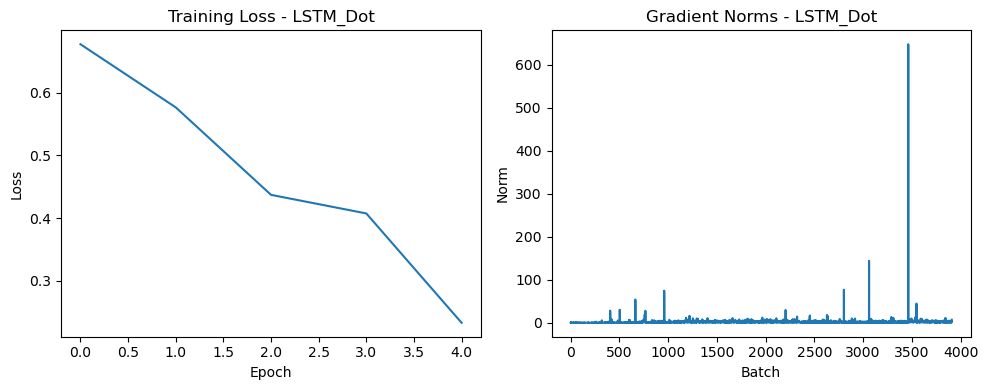

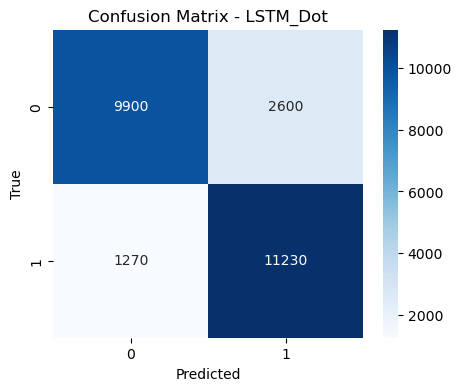

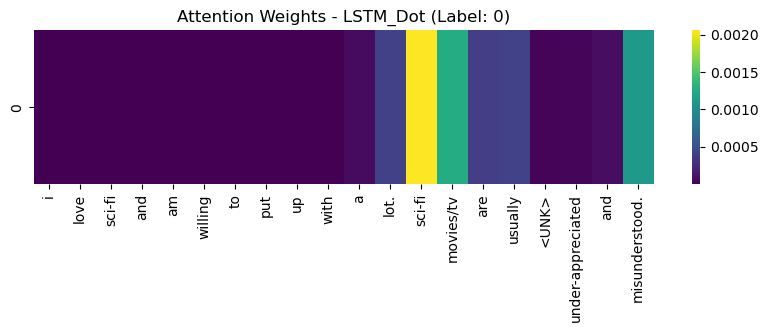

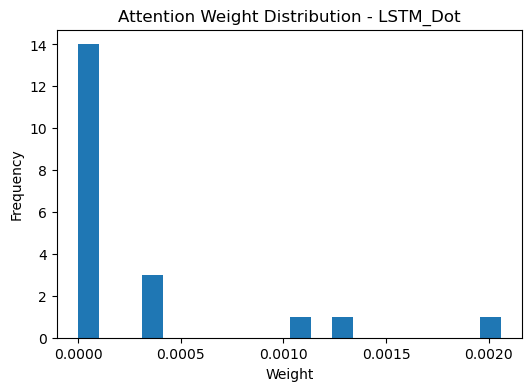


Sample Predictions for LSTM_Dot:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training LSTM_General...


Epoch 1:   2%|▊                                                   | 13/782 [00:00<00:05, 128.22it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:   5%|██▌                                                 | 39/782 [00:00<00:06, 122.73it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:   8%|████▎                                               | 65/782 [00:00<00:05, 121.19it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  12%|██████                                              | 91/782 [00:00<00:05, 120.86it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  15%|███████▋                                           | 117/782 [00:00<00:05, 119.48it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  18%|█████████▏                                         | 141/782 [00:01<00:05, 118.46it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  21%|██████████▊                                        | 166/782 [00:01<00:05, 119.40it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  25%|████████████▌                                      | 192/782 [00:01<00:04, 119.99it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  28%|██████████████▏                                    | 218/782 [00:01<00:04, 119.62it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  31%|███████████████▊                                   | 242/782 [00:02<00:04, 118.32it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  34%|█████████████████▎                                 | 266/782 [00:02<00:04, 118.03it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  37%|██████████████████▉                                | 290/782 [00:02<00:04, 118.60it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  40%|████████████████████▌                              | 315/782 [00:02<00:03, 119.31it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  43%|██████████████████████                             | 339/782 [00:02<00:03, 118.88it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  46%|███████████████████████▋                           | 363/782 [00:03<00:03, 117.89it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  49%|█████████████████████████▏                         | 387/782 [00:03<00:03, 117.46it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  53%|██████████████████████████▊                        | 411/782 [00:03<00:03, 118.19it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  56%|████████████████████████████▎                      | 435/782 [00:03<00:02, 118.65it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  59%|█████████████████████████████▉                     | 459/782 [00:03<00:02, 118.00it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  62%|███████████████████████████████▌                   | 483/782 [00:04<00:02, 117.74it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 117.50it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  68%|██████████████████████████████████▋                | 531/782 [00:04<00:02, 117.81it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  71%|████████████████████████████████████▏              | 555/782 [00:04<00:01, 117.91it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  74%|█████████████████████████████████████▊             | 579/782 [00:04<00:01, 117.44it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  77%|███████████████████████████████████████▎           | 603/782 [00:05<00:01, 117.17it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  80%|████████████████████████████████████████▉          | 627/782 [00:05<00:01, 117.11it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  83%|██████████████████████████████████████████▍        | 651/782 [00:05<00:01, 117.43it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  86%|████████████████████████████████████████████       | 675/782 [00:05<00:00, 117.43it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  89%|█████████████████████████████████████████████▌     | 699/782 [00:05<00:00, 117.12it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  92%|███████████████████████████████████████████████▏   | 723/782 [00:06<00:00, 116.58it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  96%|████████████████████████████████████████████████▋  | 747/782 [00:06<00:00, 116.86it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  99%|██████████████████████████████████████████████████▎| 771/782 [00:06<00:00, 116.95it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 118.36it/s]


Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 2:   2%|▊                                                   | 12/782 [00:00<00:06, 117.41it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   5%|██▍                                                 | 36/782 [00:00<00:06, 116.61it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   8%|███▉                                                | 60/782 [00:00<00:06, 116.53it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  11%|█████▌                                              | 84/782 [00:00<00:05, 116.83it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  14%|███████                                            | 108/782 [00:00<00:05, 116.91it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.99it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  20%|██████████▏                                        | 156/782 [00:01<00:05, 116.49it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  23%|███████████▋                                       | 180/782 [00:01<00:05, 116.40it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 116.53it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.72it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.43it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  35%|██████████████████                                 | 276/782 [00:02<00:04, 116.61it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 116.54it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.59it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.67it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.23it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 116.60it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.50it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.75it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.75it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.31it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.40it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 116.78it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.96it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.83it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 116.65it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 116.33it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 116.88it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 117.02it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 116.55it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 116.70it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 116.27it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.62it/s]


Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   2%|▊                                                   | 12/782 [00:00<00:06, 117.19it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   3%|█▌                                                  | 24/782 [00:00<00:06, 116.95it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   5%|██▍                                                 | 36/782 [00:00<00:06, 116.84it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   6%|███▏                                                | 48/782 [00:00<00:06, 116.59it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   8%|███▉                                                | 60/782 [00:00<00:06, 116.68it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   9%|████▊                                               | 72/782 [00:00<00:06, 116.61it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  11%|█████▌                                              | 84/782 [00:00<00:05, 116.47it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  12%|██████▍                                             | 96/782 [00:00<00:05, 116.38it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  14%|███████                                            | 108/782 [00:00<00:05, 116.35it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  15%|███████▊                                           | 120/782 [00:01<00:05, 116.39it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.44it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  18%|█████████▍                                         | 144/782 [00:01<00:05, 116.59it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  20%|██████████▏                                        | 156/782 [00:01<00:05, 116.32it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  21%|██████████▉                                        | 168/782 [00:01<00:05, 116.67it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  23%|███████████▋                                       | 180/782 [00:01<00:05, 116.75it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  25%|████████████▌                                      | 192/782 [00:01<00:05, 116.85it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 116.78it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  28%|██████████████                                     | 216/782 [00:01<00:04, 116.75it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.61it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.56it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.17it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 116.12it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  35%|██████████████████                                 | 276/782 [00:02<00:04, 116.38it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 116.15it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 116.29it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 116.41it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.27it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 116.35it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.48it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.54it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.48it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 116.57it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 116.62it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.61it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.66it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 116.64it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.73it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 116.77it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.77it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.28it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.38it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 116.54it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.60it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 116.66it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 116.83it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 116.53it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.77it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 117.03it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.41it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 116.27it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 116.48it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 116.69it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 116.62it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 116.53it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 116.54it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 116.87it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 116.70it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 116.37it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 116.38it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 116.28it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 116.41it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 116.35it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 116.19it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 116.48it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.54it/s]


Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   2%|▊                                                   | 12/782 [00:00<00:06, 117.62it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   3%|█▌                                                  | 24/782 [00:00<00:06, 116.75it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   5%|██▍                                                 | 36/782 [00:00<00:06, 116.34it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   6%|███▏                                                | 48/782 [00:00<00:06, 116.23it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   8%|███▉                                                | 60/782 [00:00<00:06, 116.32it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   9%|████▊                                               | 72/782 [00:00<00:06, 116.47it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  11%|█████▌                                              | 84/782 [00:00<00:06, 116.26it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  12%|██████▍                                             | 96/782 [00:00<00:05, 116.28it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  14%|███████                                            | 108/782 [00:00<00:05, 116.38it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  15%|███████▊                                           | 120/782 [00:01<00:05, 116.36it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.52it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  18%|█████████▍                                         | 144/782 [00:01<00:05, 116.31it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  20%|██████████▏                                        | 156/782 [00:01<00:05, 116.21it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  21%|██████████▉                                        | 168/782 [00:01<00:05, 116.50it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  23%|███████████▋                                       | 180/782 [00:01<00:05, 116.53it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  25%|████████████▌                                      | 192/782 [00:01<00:05, 116.61it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 116.66it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  28%|██████████████                                     | 216/782 [00:01<00:04, 116.81it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.51it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.66it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.49it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 116.44it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  35%|██████████████████                                 | 276/782 [00:02<00:04, 116.51it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 116.21it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 116.12it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 116.42it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.67it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 116.38it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.45it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.34it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.25it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 116.43it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 116.20it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.17it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.08it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 116.16it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.30it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 116.57it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.53it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.49it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.65it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 116.47it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.69it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 116.44it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 115.90it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 115.87it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.05it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 116.19it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.40it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 116.31it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 116.43it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 116.42it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 116.14it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 115.82it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 115.75it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 115.77it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 115.73it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 115.85it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 116.19it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 116.35it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 116.32it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 116.33it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 116.11it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 115.83it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.31it/s]


Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   2%|▊                                                   | 12/782 [00:00<00:06, 117.99it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   3%|█▌                                                  | 24/782 [00:00<00:06, 117.44it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   5%|██▍                                                 | 36/782 [00:00<00:06, 117.20it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   6%|███▏                                                | 48/782 [00:00<00:06, 117.16it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   8%|███▉                                                | 60/782 [00:00<00:06, 117.19it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   9%|████▊                                               | 72/782 [00:00<00:06, 116.91it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  11%|█████▌                                              | 84/782 [00:00<00:05, 116.39it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  12%|██████▍                                             | 96/782 [00:00<00:05, 116.33it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  14%|███████                                            | 108/782 [00:00<00:05, 116.31it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  15%|███████▊                                           | 120/782 [00:01<00:05, 116.57it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.68it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  18%|█████████▍                                         | 144/782 [00:01<00:05, 116.61it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  20%|██████████▏                                        | 156/782 [00:01<00:05, 116.61it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  21%|██████████▉                                        | 168/782 [00:01<00:05, 116.58it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  23%|███████████▋                                       | 180/782 [00:01<00:05, 116.27it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  25%|████████████▌                                      | 192/782 [00:01<00:05, 115.83it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 115.97it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  28%|██████████████                                     | 216/782 [00:01<00:04, 116.00it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.05it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.34it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.47it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 116.49it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  35%|██████████████████                                 | 276/782 [00:02<00:04, 116.70it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 116.86it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 116.40it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 116.21it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.00it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 115.99it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.35it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.53it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.56it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 116.82it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 116.80it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.49it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.50it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 116.11it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.03it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 116.05it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.37it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.58it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.34it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 116.48it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.38it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 116.23it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 116.23it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 116.23it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.19it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 116.60it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.73it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 116.68it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 116.46it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 116.66it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 116.48it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 116.41it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 116.20it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 116.37it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 116.52it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 116.74it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 116.88it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 116.82it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 116.64it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 116.83it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 116.56it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 116.12it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.45it/s]

Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_General, Raw output type: <class 'tuple'>
Model: LSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


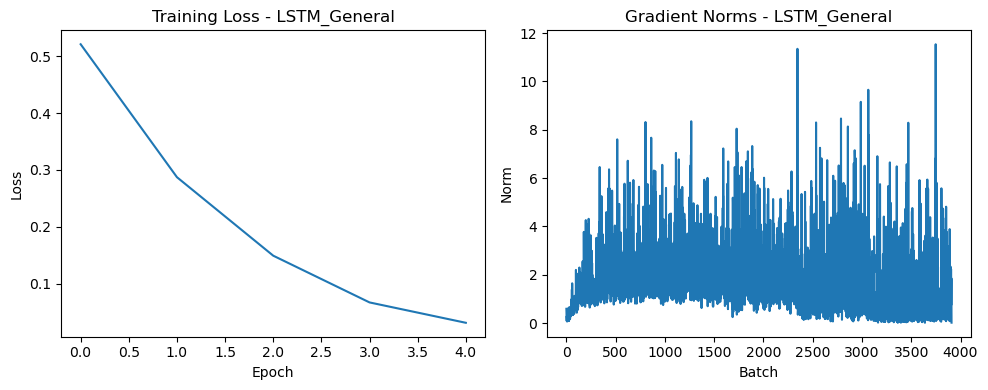

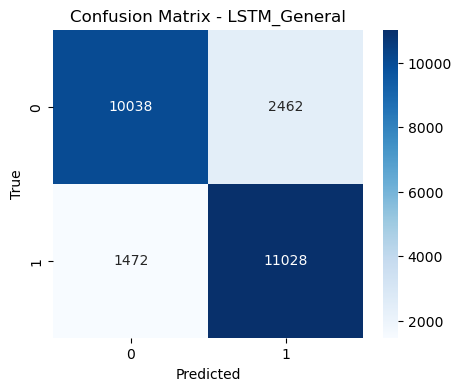

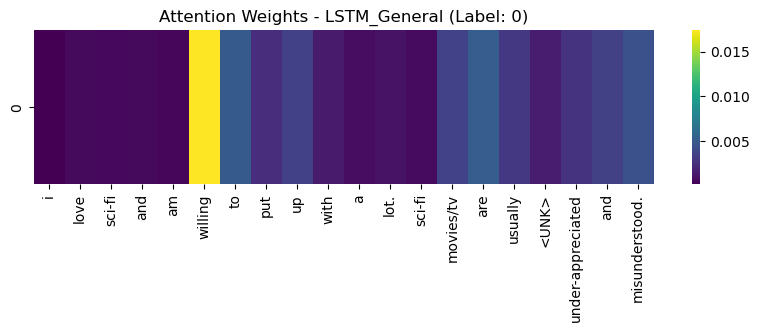

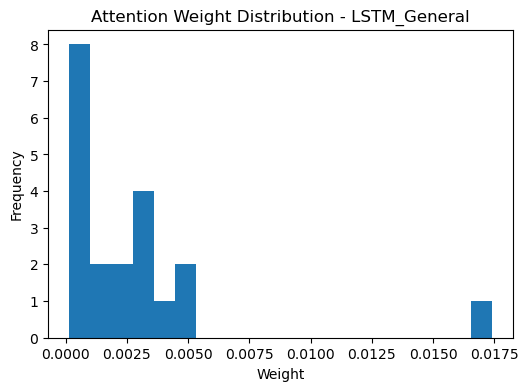


Sample Predictions for LSTM_General:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training LSTM_Concat...


Epoch 1:   2%|▊                                                   | 13/782 [00:00<00:06, 122.37it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:   5%|██▌                                                 | 38/782 [00:00<00:06, 118.50it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:   8%|████                                                | 62/782 [00:00<00:06, 117.54it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  11%|█████▋                                              | 86/782 [00:00<00:05, 117.20it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  14%|███████▏                                           | 110/782 [00:00<00:05, 115.75it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  17%|████████▋                                          | 134/782 [00:01<00:05, 114.47it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  20%|██████████▎                                        | 158/782 [00:01<00:05, 114.84it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  23%|███████████▊                                       | 182/782 [00:01<00:05, 115.78it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  26%|█████████████▍                                     | 206/782 [00:01<00:04, 115.96it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  29%|███████████████                                    | 230/782 [00:01<00:04, 114.62it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  32%|████████████████▌                                  | 254/782 [00:02<00:04, 113.71it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  36%|██████████████████▏                                | 278/782 [00:02<00:04, 114.33it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  39%|███████████████████▋                               | 302/782 [00:02<00:04, 114.90it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  42%|█████████████████████▎                             | 326/782 [00:02<00:03, 114.68it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  45%|██████████████████████▊                            | 350/782 [00:03<00:03, 113.59it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  48%|████████████████████████▍                          | 374/782 [00:03<00:03, 113.27it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  51%|█████████████████████████▉                         | 398/782 [00:03<00:03, 113.99it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  54%|███████████████████████████▌                       | 422/782 [00:03<00:03, 114.75it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  57%|█████████████████████████████                      | 446/782 [00:03<00:02, 114.12it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  59%|█████████████████████████████▊                     | 458/782 [00:03<00:02, 113.83it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  60%|██████████████████████████████▋                    | 470/782 [00:04<00:02, 113.46it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  62%|███████████████████████████████▍                   | 482/782 [00:04<00:02, 113.31it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  63%|████████████████████████████████▏                  | 494/782 [00:04<00:02, 113.55it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  65%|█████████████████████████████████                  | 506/782 [00:04<00:02, 113.75it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  66%|█████████████████████████████████▊                 | 518/782 [00:04<00:02, 113.98it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  68%|██████████████████████████████████▌                | 530/782 [00:04<00:02, 114.24it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  71%|████████████████████████████████████▏              | 554/782 [00:04<00:02, 113.97it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  74%|█████████████████████████████████████▋             | 578/782 [00:05<00:01, 113.01it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  77%|███████████████████████████████████████▎           | 602/782 [00:05<00:01, 112.84it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  80%|████████████████████████████████████████▊          | 626/782 [00:05<00:01, 113.31it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 113.54it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  86%|███████████████████████████████████████████▉       | 674/782 [00:05<00:00, 113.07it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  89%|█████████████████████████████████████████████▌     | 698/782 [00:06<00:00, 112.19it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  92%|███████████████████████████████████████████████    | 722/782 [00:06<00:00, 112.64it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  95%|████████████████████████████████████████████████▋  | 746/782 [00:06<00:00, 113.14it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1:  98%|██████████████████████████████████████████████████▏| 770/782 [00:06<00:00, 113.35it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 114.24it/s]


Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   2%|▊                                                   | 12/782 [00:00<00:06, 112.43it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   3%|█▌                                                  | 24/782 [00:00<00:06, 111.84it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   5%|██▍                                                 | 36/782 [00:00<00:06, 112.28it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   6%|███▏                                                | 48/782 [00:00<00:06, 112.52it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   8%|███▉                                                | 60/782 [00:00<00:06, 112.55it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:   9%|████▊                                               | 72/782 [00:00<00:06, 112.99it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  11%|█████▌                                              | 84/782 [00:00<00:06, 112.96it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  12%|██████▍                                             | 96/782 [00:00<00:06, 113.01it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  14%|███████                                            | 108/782 [00:00<00:05, 112.57it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  15%|███████▊                                           | 120/782 [00:01<00:05, 112.06it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  17%|████████▌                                          | 132/782 [00:01<00:05, 111.90it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  18%|█████████▍                                         | 144/782 [00:01<00:05, 112.38it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  20%|██████████▏                                        | 156/782 [00:01<00:05, 112.50it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  21%|██████████▉                                        | 168/782 [00:01<00:05, 112.80it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  23%|███████████▋                                       | 180/782 [00:01<00:05, 113.13it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  25%|████████████▌                                      | 192/782 [00:01<00:05, 113.26it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  26%|█████████████▎                                     | 204/782 [00:01<00:05, 113.29it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  28%|██████████████                                     | 216/782 [00:01<00:05, 112.96it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  29%|██████████████▊                                    | 228/782 [00:02<00:04, 112.52it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 112.24it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 112.01it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 112.04it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  35%|██████████████████                                 | 276/782 [00:02<00:04, 112.45it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 112.95it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 113.13it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 113.31it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  41%|█████████████████████▏                             | 324/782 [00:02<00:04, 113.07it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 112.74it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  45%|██████████████████████▋                            | 348/782 [00:03<00:03, 112.34it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 111.92it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 111.83it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 112.10it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 112.64it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 113.20it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 113.36it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 113.18it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 113.17it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  58%|█████████████████████████████▋                     | 456/782 [00:04<00:02, 112.90it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 112.57it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 112.31it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 112.15it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 112.30it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 112.67it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 113.19it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 113.11it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  71%|████████████████████████████████████               | 552/782 [00:04<00:02, 113.37it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  72%|████████████████████████████████████▊              | 564/782 [00:05<00:01, 113.23it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  74%|█████████████████████████████████████▌             | 576/782 [00:05<00:01, 113.02it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 112.66it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 112.48it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 112.84it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 112.97it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 113.27it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 113.35it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 113.26it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 113.18it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  87%|████████████████████████████████████████████▌      | 684/782 [00:06<00:00, 113.08it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  89%|█████████████████████████████████████████████▍     | 696/782 [00:06<00:00, 112.52it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 112.28it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 112.13it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 112.69it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 112.88it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 112.86it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 112.99it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 2: 100%|██████████████████████████████████████████████████▊| 780/782 [00:06<00:00, 113.18it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   2%|▊                                                   | 12/782 [00:00<00:06, 112.60it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   3%|█▌                                                  | 24/782 [00:00<00:06, 111.86it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   5%|██▍                                                 | 36/782 [00:00<00:06, 111.56it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   6%|███▏                                                | 48/782 [00:00<00:06, 111.90it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   8%|███▉                                                | 60/782 [00:00<00:06, 112.13it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:   9%|████▊                                               | 72/782 [00:00<00:06, 112.57it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  11%|█████▌                                              | 84/782 [00:00<00:06, 112.77it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  12%|██████▍                                             | 96/782 [00:00<00:06, 112.66it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  14%|███████                                            | 108/782 [00:00<00:05, 113.06it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  15%|███████▊                                           | 120/782 [00:01<00:05, 112.83it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  17%|████████▌                                          | 132/782 [00:01<00:05, 112.30it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  18%|█████████▍                                         | 144/782 [00:01<00:05, 112.38it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  20%|██████████▏                                        | 156/782 [00:01<00:05, 112.36it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  21%|██████████▉                                        | 168/782 [00:01<00:05, 112.14it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  23%|███████████▋                                       | 180/782 [00:01<00:05, 112.17it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  25%|████████████▌                                      | 192/782 [00:01<00:05, 112.57it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  26%|█████████████▎                                     | 204/782 [00:01<00:05, 112.37it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  28%|██████████████                                     | 216/782 [00:01<00:05, 112.38it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  29%|██████████████▊                                    | 228/782 [00:02<00:04, 112.77it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 112.28it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 112.05it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 112.25it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  35%|██████████████████                                 | 276/782 [00:02<00:04, 112.40it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 112.58it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 112.69it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 112.88it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  41%|█████████████████████▏                             | 324/782 [00:02<00:04, 112.79it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 112.84it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  45%|██████████████████████▋                            | 348/782 [00:03<00:03, 112.66it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 112.33it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 112.26it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 112.19it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 112.32it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 112.75it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 112.63it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 112.47it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  57%|████████████████████████████▉                      | 444/782 [00:03<00:03, 112.41it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  58%|█████████████████████████████▋                     | 456/782 [00:04<00:02, 112.39it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 111.90it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 111.81it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 111.97it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 112.36it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 112.80it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 112.96it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 112.96it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  71%|████████████████████████████████████               | 552/782 [00:04<00:02, 112.99it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  72%|████████████████████████████████████▊              | 564/782 [00:05<00:01, 112.54it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  74%|█████████████████████████████████████▌             | 576/782 [00:05<00:01, 112.55it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 112.60it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 112.39it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 112.30it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 112.67it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 112.96it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 112.87it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 112.89it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 112.57it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  87%|████████████████████████████████████████████▌      | 684/782 [00:06<00:00, 112.32it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  89%|█████████████████████████████████████████████▍     | 696/782 [00:06<00:00, 112.30it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 112.28it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 112.43it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 112.75it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 112.92it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 113.17it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 113.05it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 3: 100%|██████████████████████████████████████████████████▊| 780/782 [00:06<00:00, 112.72it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   2%|▊                                                   | 12/782 [00:00<00:06, 113.67it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   3%|█▌                                                  | 24/782 [00:00<00:06, 112.63it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   5%|██▍                                                 | 36/782 [00:00<00:06, 112.50it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   6%|███▏                                                | 48/782 [00:00<00:06, 112.60it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   8%|███▉                                                | 60/782 [00:00<00:06, 112.71it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:   9%|████▊                                               | 72/782 [00:00<00:06, 113.07it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  11%|█████▌                                              | 84/782 [00:00<00:06, 112.90it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  12%|██████▍                                             | 96/782 [00:00<00:06, 112.78it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  14%|███████                                            | 108/782 [00:00<00:05, 112.89it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  15%|███████▊                                           | 120/782 [00:01<00:05, 112.65it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  17%|████████▌                                          | 132/782 [00:01<00:05, 112.45it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  18%|█████████▍                                         | 144/782 [00:01<00:05, 112.26it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  20%|██████████▏                                        | 156/782 [00:01<00:05, 112.47it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  21%|██████████▉                                        | 168/782 [00:01<00:05, 112.48it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  23%|███████████▋                                       | 180/782 [00:01<00:05, 112.70it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  25%|████████████▌                                      | 192/782 [00:01<00:05, 112.61it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  26%|█████████████▎                                     | 204/782 [00:01<00:05, 112.67it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  28%|██████████████                                     | 216/782 [00:01<00:05, 112.48it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  29%|██████████████▊                                    | 228/782 [00:02<00:04, 112.33it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 112.20it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 112.11it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 112.23it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  35%|██████████████████                                 | 276/782 [00:02<00:04, 112.37it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 112.62it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 112.73it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 112.48it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  41%|█████████████████████▏                             | 324/782 [00:02<00:04, 112.21it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 112.46it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  45%|██████████████████████▋                            | 348/782 [00:03<00:03, 112.40it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 112.17it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 112.39it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 112.66it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 112.89it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 113.03it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 112.86it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 112.66it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  57%|████████████████████████████▉                      | 444/782 [00:03<00:03, 112.52it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  58%|█████████████████████████████▋                     | 456/782 [00:04<00:02, 112.42it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 112.49it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 112.71it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 112.70it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 112.92it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 113.05it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 112.82it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 112.58it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  71%|████████████████████████████████████               | 552/782 [00:04<00:02, 112.43it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  72%|████████████████████████████████████▊              | 564/782 [00:05<00:01, 112.30it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  74%|█████████████████████████████████████▌             | 576/782 [00:05<00:01, 112.29it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 112.50it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 112.73it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 113.03it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 112.89it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 112.96it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 112.70it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 112.32it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 112.06it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  87%|████████████████████████████████████████████▌      | 684/782 [00:06<00:00, 112.19it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  89%|█████████████████████████████████████████████▍     | 696/782 [00:06<00:00, 112.43it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 112.60it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 112.71it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 112.72it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 112.76it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 112.54it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 112.45it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 4: 100%|██████████████████████████████████████████████████▊| 780/782 [00:06<00:00, 112.44it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   2%|▊                                                   | 12/782 [00:00<00:06, 113.34it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   3%|█▌                                                  | 24/782 [00:00<00:06, 113.01it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   5%|██▍                                                 | 36/782 [00:00<00:06, 112.77it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   6%|███▏                                                | 48/782 [00:00<00:06, 112.92it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   8%|███▉                                                | 60/782 [00:00<00:06, 113.04it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:   9%|████▊                                               | 72/782 [00:00<00:06, 112.86it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  11%|█████▌                                              | 84/782 [00:00<00:06, 112.94it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  12%|██████▍                                             | 96/782 [00:00<00:06, 112.84it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  14%|███████                                            | 108/782 [00:00<00:05, 112.45it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  15%|███████▊                                           | 120/782 [00:01<00:05, 112.49it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  17%|████████▌                                          | 132/782 [00:01<00:05, 112.62it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  18%|█████████▍                                         | 144/782 [00:01<00:05, 112.46it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  20%|██████████▏                                        | 156/782 [00:01<00:05, 112.50it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  21%|██████████▉                                        | 168/782 [00:01<00:05, 112.45it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  23%|███████████▋                                       | 180/782 [00:01<00:05, 112.56it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  25%|████████████▌                                      | 192/782 [00:01<00:05, 112.76it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  26%|█████████████▎                                     | 204/782 [00:01<00:05, 112.68it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  28%|██████████████                                     | 216/782 [00:01<00:05, 112.39it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  29%|██████████████▊                                    | 228/782 [00:02<00:04, 112.44it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 112.27it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 112.21it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 112.16it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  35%|██████████████████                                 | 276/782 [00:02<00:04, 112.25it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 112.33it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 112.72it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 112.66it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  41%|█████████████████████▏                             | 324/782 [00:02<00:04, 112.38it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 112.39it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  45%|██████████████████████▋                            | 348/782 [00:03<00:03, 112.21it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 112.19it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 112.30it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 112.27it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 112.56it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 112.77it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 112.78it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 112.47it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  57%|████████████████████████████▉                      | 444/782 [00:03<00:03, 112.40it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  58%|█████████████████████████████▋                     | 456/782 [00:04<00:02, 112.34it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 112.33it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 112.19it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 112.26it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 112.39it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 112.75it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 112.62it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 112.36it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  71%|████████████████████████████████████               | 552/782 [00:04<00:02, 112.23it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  72%|████████████████████████████████████▊              | 564/782 [00:05<00:01, 112.24it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  74%|█████████████████████████████████████▌             | 576/782 [00:05<00:01, 112.03it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 111.78it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 111.83it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 112.14it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 112.48it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 112.48it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 112.48it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 112.41it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 112.39it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  87%|████████████████████████████████████████████▌      | 684/782 [00:06<00:00, 112.46it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  89%|█████████████████████████████████████████████▍     | 696/782 [00:06<00:00, 112.31it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 112.22it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 112.23it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 112.44it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 112.48it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 112.79it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 112.45it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5: 100%|██████████████████████████████████████████████████▊| 780/782 [00:06<00:00, 112.25it/s]

Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: LSTM_Concat, Raw output type: <class 'tuple'>
Model: LSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 112.43it/s]


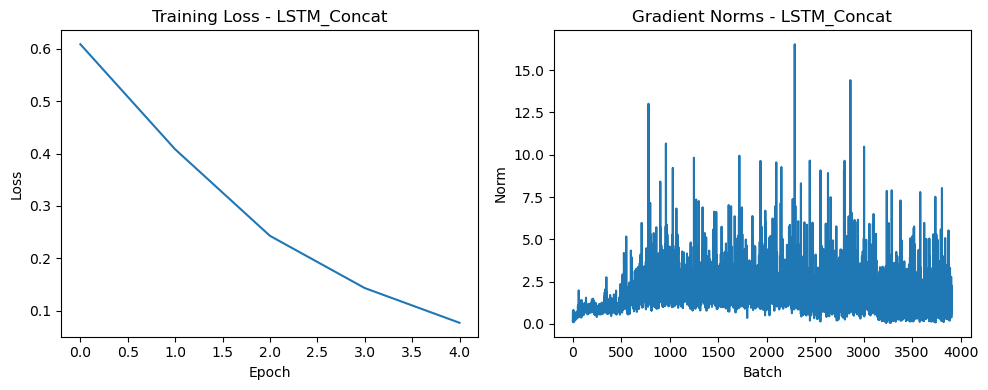

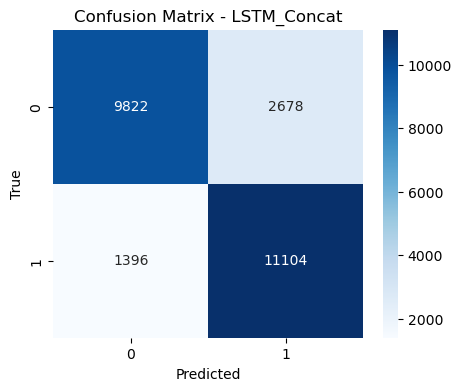

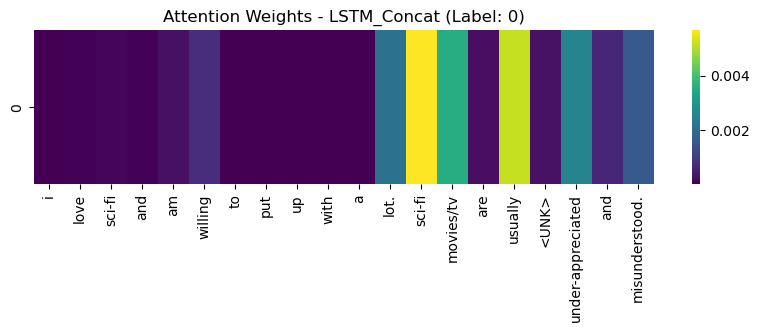

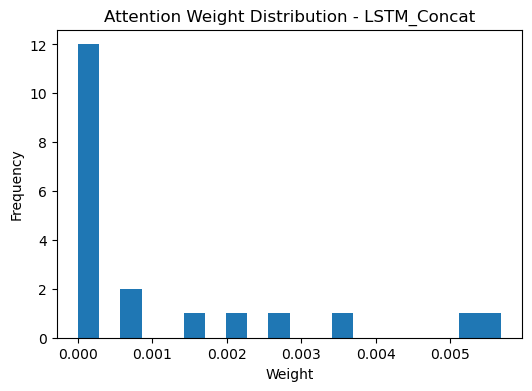


Sample Predictions for LSTM_Concat:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 1.0

Training BiRNN...


Epoch 1:   2%|▉                                                   | 15/782 [00:00<00:05, 144.69it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:   6%|███▏                                                | 47/782 [00:00<00:04, 153.13it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  10%|█████▎                                              | 79/782 [00:00<00:04, 154.53it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  14%|███████▏                                           | 111/782 [00:00<00:04, 154.97it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  18%|█████████▎                                         | 143/782 [00:00<00:04, 153.85it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  22%|███████████▍                                       | 175/782 [00:01<00:03, 152.51it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  26%|█████████████▌                                     | 207/782 [00:01<00:03, 152.44it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  31%|███████████████▌                                   | 239/782 [00:01<00:03, 153.22it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  35%|█████████████████▋                                 | 271/782 [00:01<00:03, 153.41it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  39%|███████████████████▊                               | 303/782 [00:01<00:03, 152.43it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  43%|█████████████████████▊                             | 335/782 [00:02<00:02, 151.36it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  47%|███████████████████████▉                           | 367/782 [00:02<00:02, 152.06it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  51%|██████████████████████████                         | 399/782 [00:02<00:02, 152.47it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  55%|████████████████████████████                       | 431/782 [00:02<00:02, 152.45it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  59%|██████████████████████████████▏                    | 463/782 [00:03<00:02, 151.43it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  61%|███████████████████████████████▏                   | 479/782 [00:03<00:02, 151.26it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  63%|████████████████████████████████▎                  | 495/782 [00:03<00:01, 151.19it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  65%|█████████████████████████████████▎                 | 511/782 [00:03<00:01, 151.46it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  67%|██████████████████████████████████▎                | 527/782 [00:03<00:01, 152.00it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  69%|███████████████████████████████████▍               | 543/782 [00:03<00:01, 152.33it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  71%|████████████████████████████████████▍              | 559/782 [00:03<00:01, 152.40it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  74%|█████████████████████████████████████▌             | 575/782 [00:03<00:01, 152.22it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  76%|██████████████████████████████████████▌            | 591/782 [00:03<00:01, 151.99it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  78%|███████████████████████████████████████▌           | 607/782 [00:03<00:01, 151.62it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  82%|█████████████████████████████████████████▋         | 639/782 [00:04<00:00, 151.25it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  86%|███████████████████████████████████████████▊       | 671/782 [00:04<00:00, 151.73it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  90%|█████████████████████████████████████████████▊     | 703/782 [00:04<00:00, 152.38it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  94%|███████████████████████████████████████████████▉   | 735/782 [00:04<00:00, 151.98it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1:  98%|██████████████████████████████████████████████████ | 767/782 [00:05<00:00, 151.22it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 152.24it/s]


Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 2:   2%|█                                                   | 16/782 [00:00<00:05, 151.34it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:   6%|███▏                                                | 48/782 [00:00<00:04, 152.01it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  10%|█████▎                                              | 80/782 [00:00<00:04, 152.06it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  14%|███████▎                                           | 112/782 [00:00<00:04, 151.88it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  18%|█████████▍                                         | 144/782 [00:00<00:04, 151.52it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  23%|███████████▍                                       | 176/782 [00:01<00:04, 151.38it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  27%|█████████████▌                                     | 208/782 [00:01<00:03, 151.59it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  29%|██████████████▌                                    | 224/782 [00:01<00:03, 151.66it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  31%|███████████████▋                                   | 240/782 [00:01<00:03, 151.60it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  33%|████████████████▋                                  | 256/782 [00:01<00:03, 151.38it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  35%|█████████████████▋                                 | 272/782 [00:01<00:03, 151.22it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  37%|██████████████████▊                                | 288/782 [00:01<00:03, 151.11it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  39%|███████████████████▊                               | 304/782 [00:02<00:03, 151.10it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  41%|████████████████████▊                              | 320/782 [00:02<00:03, 151.17it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  43%|█████████████████████▉                             | 336/782 [00:02<00:02, 151.12it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  45%|██████████████████████▉                            | 352/782 [00:02<00:02, 151.40it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  47%|████████████████████████                           | 368/782 [00:02<00:02, 151.50it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  49%|█████████████████████████                          | 384/782 [00:02<00:02, 151.44it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  51%|██████████████████████████                         | 400/782 [00:02<00:02, 151.19it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  53%|███████████████████████████▏                       | 416/782 [00:02<00:02, 150.61it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  55%|████████████████████████████▏                      | 432/782 [00:02<00:02, 150.72it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  57%|█████████████████████████████▏                     | 448/782 [00:02<00:02, 150.78it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  59%|██████████████████████████████▎                    | 464/782 [00:03<00:02, 150.78it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  61%|███████████████████████████████▎                   | 480/782 [00:03<00:02, 150.84it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  65%|█████████████████████████████████▍                 | 512/782 [00:03<00:01, 151.01it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  70%|███████████████████████████████████▍               | 544/782 [00:03<00:01, 151.00it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  74%|█████████████████████████████████████▌             | 576/782 [00:03<00:01, 150.79it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  78%|███████████████████████████████████████▋           | 608/782 [00:04<00:01, 150.50it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  82%|█████████████████████████████████████████▋         | 640/782 [00:04<00:00, 150.42it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  86%|███████████████████████████████████████████▊       | 672/782 [00:04<00:00, 150.64it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  90%|█████████████████████████████████████████████▉     | 704/782 [00:04<00:00, 150.51it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  92%|██████████████████████████████████████████████▉    | 720/782 [00:04<00:00, 150.46it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  94%|████████████████████████████████████████████████   | 736/782 [00:04<00:00, 150.42it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  96%|█████████████████████████████████████████████████  | 752/782 [00:04<00:00, 149.71it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2:  98%|██████████████████████████████████████████████████ | 768/782 [00:05<00:00, 149.97it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 150.98it/s]


Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:   2%|█                                                   | 16/782 [00:00<00:05, 150.65it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:   4%|██▏                                                 | 32/782 [00:00<00:04, 150.52it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:   6%|███▏                                                | 48/782 [00:00<00:04, 150.26it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:   8%|████▎                                               | 64/782 [00:00<00:04, 150.17it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  10%|█████▎                                              | 80/782 [00:00<00:04, 150.16it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  12%|██████▍                                             | 96/782 [00:00<00:04, 150.00it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  14%|███████▎                                           | 112/782 [00:00<00:04, 149.92it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  16%|████████▎                                          | 128/782 [00:00<00:04, 149.99it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  18%|█████████▎                                         | 143/782 [00:00<00:04, 149.98it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  20%|██████████▎                                        | 159/782 [00:01<00:04, 150.00it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  22%|███████████▎                                       | 174/782 [00:01<00:04, 149.99it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  24%|████████████▍                                      | 190/782 [00:01<00:03, 150.07it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  26%|█████████████▍                                     | 206/782 [00:01<00:03, 150.00it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  28%|██████████████▍                                    | 222/782 [00:01<00:03, 150.15it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  30%|███████████████▌                                   | 238/782 [00:01<00:03, 150.17it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  32%|████████████████▌                                  | 254/782 [00:01<00:03, 150.18it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  35%|█████████████████▌                                 | 270/782 [00:01<00:03, 150.21it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  37%|██████████████████▋                                | 286/782 [00:01<00:03, 150.10it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  39%|███████████████████▋                               | 302/782 [00:02<00:03, 150.00it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  41%|████████████████████▋                              | 318/782 [00:02<00:03, 150.14it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  43%|█████████████████████▊                             | 334/782 [00:02<00:02, 150.24it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  45%|██████████████████████▊                            | 350/782 [00:02<00:02, 150.20it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  47%|███████████████████████▊                           | 366/782 [00:02<00:02, 150.15it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  49%|████████████████████████▉                          | 382/782 [00:02<00:02, 150.19it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  51%|█████████████████████████▉                         | 398/782 [00:02<00:02, 150.14it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  53%|███████████████████████████                        | 414/782 [00:02<00:02, 150.06it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  55%|████████████████████████████                       | 430/782 [00:02<00:02, 149.92it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  57%|█████████████████████████████                      | 446/782 [00:02<00:02, 149.97it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  59%|██████████████████████████████                     | 461/782 [00:03<00:02, 149.64it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  61%|███████████████████████████████                    | 476/782 [00:03<00:02, 149.70it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  63%|████████████████████████████████                   | 492/782 [00:03<00:01, 149.84it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  65%|█████████████████████████████████▏                 | 508/782 [00:03<00:01, 149.99it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  67%|██████████████████████████████████▏                | 524/782 [00:03<00:01, 150.07it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 149.92it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  71%|████████████████████████████████████▏              | 555/782 [00:03<00:01, 149.86it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  73%|█████████████████████████████████████▏             | 571/782 [00:03<00:01, 149.92it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  75%|██████████████████████████████████████▏            | 586/782 [00:03<00:01, 149.90it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  77%|███████████████████████████████████████▏           | 601/782 [00:04<00:01, 149.88it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  79%|████████████████████████████████████████▏          | 616/782 [00:04<00:01, 149.82it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  81%|█████████████████████████████████████████▏         | 632/782 [00:04<00:01, 149.90it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  83%|██████████████████████████████████████████▏        | 647/782 [00:04<00:00, 149.89it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  85%|███████████████████████████████████████████▏       | 663/782 [00:04<00:00, 149.94it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  87%|████████████████████████████████████████████▏      | 678/782 [00:04<00:00, 149.92it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  89%|█████████████████████████████████████████████▏     | 693/782 [00:04<00:00, 149.94it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  91%|██████████████████████████████████████████████▏    | 708/782 [00:04<00:00, 149.74it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  92%|███████████████████████████████████████████████▏   | 723/782 [00:04<00:00, 149.81it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  94%|████████████████████████████████████████████████▏  | 738/782 [00:04<00:00, 149.66it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  96%|█████████████████████████████████████████████████  | 753/782 [00:05<00:00, 149.51it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 3:  98%|██████████████████████████████████████████████████ | 768/782 [00:05<00:00, 149.45it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 149.96it/s]


Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:   2%|▉                                                   | 15/782 [00:00<00:05, 149.67it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:   4%|██                                                  | 31/782 [00:00<00:05, 150.08it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:   6%|███▏                                                | 47/782 [00:00<00:04, 150.04it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:   8%|████▏                                               | 63/782 [00:00<00:04, 150.06it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  10%|█████▎                                              | 79/782 [00:00<00:04, 150.03it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  12%|██████▎                                             | 95/782 [00:00<00:04, 150.06it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  14%|███████▏                                           | 111/782 [00:00<00:04, 149.88it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  16%|████████▎                                          | 127/782 [00:00<00:04, 149.98it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  18%|█████████▎                                         | 142/782 [00:00<00:04, 149.73it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  20%|██████████▎                                        | 158/782 [00:01<00:04, 149.85it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  22%|███████████▎                                       | 174/782 [00:01<00:04, 149.94it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  24%|████████████▍                                      | 190/782 [00:01<00:03, 149.95it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  26%|█████████████▍                                     | 206/782 [00:01<00:03, 149.99it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  28%|██████████████▍                                    | 221/782 [00:01<00:03, 149.90it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  30%|███████████████▍                                   | 236/782 [00:01<00:03, 149.87it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  32%|████████████████▎                                  | 251/782 [00:01<00:03, 149.78it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  34%|█████████████████▎                                 | 266/782 [00:01<00:03, 149.70it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  36%|██████████████████▎                                | 281/782 [00:01<00:03, 149.57it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  38%|███████████████████▎                               | 296/782 [00:01<00:03, 149.58it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  40%|████████████████████▎                              | 311/782 [00:02<00:03, 149.38it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  42%|█████████████████████▎                             | 327/782 [00:02<00:03, 149.58it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  44%|██████████████████████▎                            | 342/782 [00:02<00:02, 149.58it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  46%|███████████████████████▎                           | 358/782 [00:02<00:02, 149.76it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  48%|████████████████████████▍                          | 374/782 [00:02<00:02, 149.92it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  50%|█████████████████████████▍                         | 390/782 [00:02<00:02, 150.02it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  52%|██████████████████████████▍                        | 406/782 [00:02<00:02, 150.00it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  54%|███████████████████████████▌                       | 422/782 [00:02<00:02, 150.08it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  56%|████████████████████████████▌                      | 438/782 [00:02<00:02, 150.07it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  58%|█████████████████████████████▌                     | 454/782 [00:03<00:02, 150.08it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  60%|██████████████████████████████▋                    | 470/782 [00:03<00:02, 150.02it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  62%|███████████████████████████████▋                   | 486/782 [00:03<00:01, 149.93it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  64%|████████████████████████████████▋                  | 501/782 [00:03<00:01, 149.91it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  66%|█████████████████████████████████▋                 | 517/782 [00:03<00:01, 149.94it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  68%|██████████████████████████████████▋                | 532/782 [00:03<00:01, 149.90it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  70%|███████████████████████████████████▋               | 547/782 [00:03<00:01, 149.89it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  72%|████████████████████████████████████▋              | 563/782 [00:03<00:01, 150.02it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  74%|█████████████████████████████████████▊             | 579/782 [00:03<00:01, 150.06it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  76%|██████████████████████████████████████▊            | 595/782 [00:03<00:01, 150.08it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 150.08it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  80%|████████████████████████████████████████▉          | 627/782 [00:04<00:01, 150.09it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  82%|█████████████████████████████████████████▉         | 643/782 [00:04<00:00, 150.17it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  84%|██████████████████████████████████████████▉        | 659/782 [00:04<00:00, 150.15it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  86%|████████████████████████████████████████████       | 675/782 [00:04<00:00, 150.02it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  88%|█████████████████████████████████████████████      | 691/782 [00:04<00:00, 150.01it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  90%|██████████████████████████████████████████████     | 707/782 [00:04<00:00, 149.94it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  92%|███████████████████████████████████████████████    | 722/782 [00:04<00:00, 149.91it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  94%|████████████████████████████████████████████████   | 737/782 [00:04<00:00, 149.91it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  96%|█████████████████████████████████████████████████  | 752/782 [00:05<00:00, 149.84it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4:  98%|██████████████████████████████████████████████████ | 767/782 [00:05<00:00, 149.82it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 149.92it/s]


Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:   2%|█                                                   | 16/782 [00:00<00:05, 150.82it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:   4%|██▏                                                 | 32/782 [00:00<00:04, 150.29it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:   6%|███▏                                                | 48/782 [00:00<00:04, 150.04it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:   8%|████▎                                               | 64/782 [00:00<00:04, 149.82it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  10%|█████▎                                              | 79/782 [00:00<00:04, 149.75it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  12%|██████▎                                             | 94/782 [00:00<00:04, 149.78it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  14%|███████                                            | 109/782 [00:00<00:04, 149.79it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  16%|████████                                           | 124/782 [00:00<00:04, 149.80it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  18%|█████████▏                                         | 140/782 [00:00<00:04, 149.89it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  20%|██████████▏                                        | 156/782 [00:01<00:04, 150.00it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  22%|███████████▏                                       | 172/782 [00:01<00:04, 150.03it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  24%|████████████▎                                      | 188/782 [00:01<00:03, 150.12it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  26%|█████████████▎                                     | 204/782 [00:01<00:03, 150.06it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  28%|██████████████▎                                    | 220/782 [00:01<00:03, 150.08it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  30%|███████████████▍                                   | 236/782 [00:01<00:03, 150.07it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  32%|████████████████▍                                  | 252/782 [00:01<00:03, 150.13it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  34%|█████████████████▍                                 | 268/782 [00:01<00:03, 150.24it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  36%|██████████████████▌                                | 284/782 [00:01<00:03, 150.22it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  38%|███████████████████▌                               | 300/782 [00:01<00:03, 150.24it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  40%|████████████████████▌                              | 316/782 [00:02<00:03, 150.17it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  42%|█████████████████████▋                             | 332/782 [00:02<00:02, 150.27it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  45%|██████████████████████▋                            | 348/782 [00:02<00:02, 150.16it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  47%|███████████████████████▋                           | 364/782 [00:02<00:02, 150.16it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  49%|████████████████████████▊                          | 380/782 [00:02<00:02, 150.18it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  51%|█████████████████████████▊                         | 396/782 [00:02<00:02, 150.18it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  53%|██████████████████████████▊                        | 412/782 [00:02<00:02, 150.31it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  55%|███████████████████████████▉                       | 428/782 [00:02<00:02, 150.14it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  57%|████████████████████████████▉                      | 444/782 [00:02<00:02, 150.18it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  59%|██████████████████████████████                     | 460/782 [00:03<00:02, 150.11it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  61%|███████████████████████████████                    | 476/782 [00:03<00:02, 149.98it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  63%|████████████████████████████████                   | 492/782 [00:03<00:01, 150.06it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  65%|█████████████████████████████████▏                 | 508/782 [00:03<00:01, 150.23it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  67%|██████████████████████████████████▏                | 524/782 [00:03<00:01, 150.23it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 150.25it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  71%|████████████████████████████████████▎              | 556/782 [00:03<00:01, 150.30it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  73%|█████████████████████████████████████▎             | 572/782 [00:03<00:01, 150.36it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  75%|██████████████████████████████████████▎            | 588/782 [00:03<00:01, 150.35it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  77%|███████████████████████████████████████▍           | 604/782 [00:04<00:01, 150.21it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  79%|████████████████████████████████████████▍          | 620/782 [00:04<00:01, 150.21it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  81%|█████████████████████████████████████████▍         | 636/782 [00:04<00:00, 150.18it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  83%|██████████████████████████████████████████▌        | 652/782 [00:04<00:00, 150.13it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  85%|███████████████████████████████████████████▌       | 668/782 [00:04<00:00, 149.99it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  87%|████████████████████████████████████████████▌      | 683/782 [00:04<00:00, 149.88it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  89%|█████████████████████████████████████████████▌     | 698/782 [00:04<00:00, 149.81it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  91%|██████████████████████████████████████████████▌    | 714/782 [00:04<00:00, 149.93it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  93%|███████████████████████████████████████████████▌   | 730/782 [00:04<00:00, 150.05it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  95%|████████████████████████████████████████████████▋  | 746/782 [00:04<00:00, 150.10it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5:  97%|█████████████████████████████████████████████████▋ | 762/782 [00:05<00:00, 150.05it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output ty

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 150.10it/s]

Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN, Raw output type: <class 'torch.Tensor'>
Model: BiRNN, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


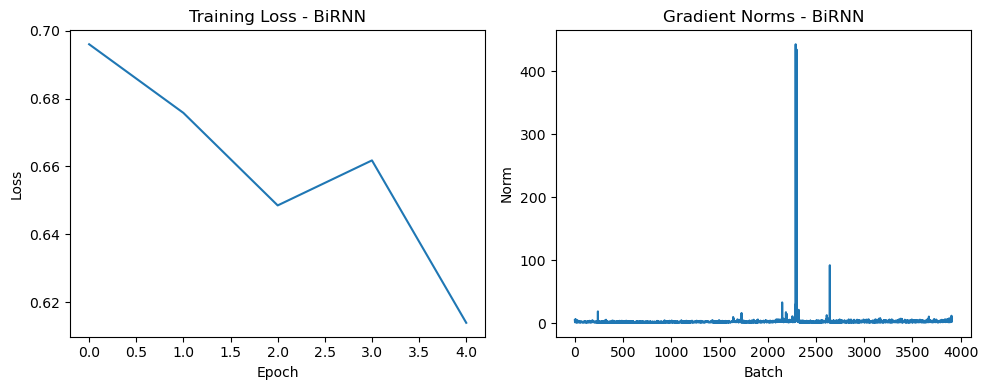

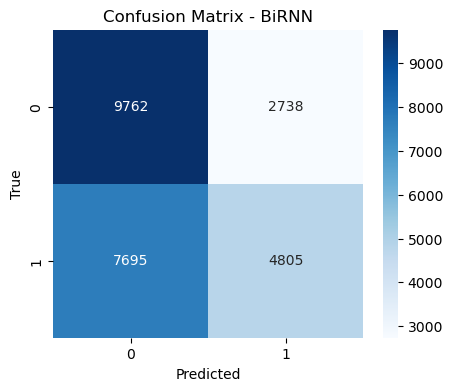


Sample Predictions for BiRNN:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 1.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 1.0

Training BiRNN_Bahdanau...


Epoch 1:   2%|▊                                                   | 13/782 [00:00<00:05, 128.59it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:   5%|██▌                                                 | 39/782 [00:00<00:05, 123.91it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:   8%|████▎                                               | 65/782 [00:00<00:05, 123.29it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  12%|██████                                              | 91/782 [00:00<00:05, 123.15it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  15%|███████▋                                           | 117/782 [00:00<00:05, 121.23it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  18%|█████████▎                                         | 143/782 [00:01<00:05, 119.75it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  21%|██████████▉                                        | 168/782 [00:01<00:05, 120.50it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  25%|████████████▋                                      | 194/782 [00:01<00:04, 121.56it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  28%|██████████████▎                                    | 220/782 [00:01<00:04, 121.67it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  30%|███████████████▏                                   | 233/782 [00:01<00:04, 120.89it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  31%|████████████████                                   | 246/782 [00:02<00:04, 120.09it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  33%|████████████████▉                                  | 259/782 [00:02<00:04, 119.78it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  35%|█████████████████▋                                 | 272/782 [00:02<00:04, 119.94it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  36%|██████████████████▌                                | 285/782 [00:02<00:04, 120.14it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  40%|████████████████████▎                              | 311/782 [00:02<00:03, 121.20it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  43%|█████████████████████▉                             | 337/782 [00:02<00:03, 121.28it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  46%|███████████████████████▋                           | 363/782 [00:02<00:03, 119.68it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  49%|█████████████████████████▏                         | 387/782 [00:03<00:03, 119.10it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  53%|██████████████████████████▊                        | 411/782 [00:03<00:03, 118.92it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  56%|████████████████████████████▍                      | 436/782 [00:03<00:02, 119.51it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  59%|██████████████████████████████                     | 461/782 [00:03<00:02, 119.89it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  62%|███████████████████████████████▋                   | 485/782 [00:04<00:02, 118.73it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  65%|█████████████████████████████████▏                 | 509/782 [00:04<00:02, 118.25it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:02, 119.01it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 119.79it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  75%|██████████████████████████████████████             | 584/782 [00:04<00:01, 119.50it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  78%|███████████████████████████████████████▋           | 608/782 [00:05<00:01, 118.25it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  81%|█████████████████████████████████████████▏         | 632/782 [00:05<00:01, 117.99it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  84%|██████████████████████████████████████████▊        | 656/782 [00:05<00:01, 118.44it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  87%|████████████████████████████████████████████▎      | 680/782 [00:05<00:00, 118.87it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  90%|█████████████████████████████████████████████▉     | 704/782 [00:05<00:00, 118.76it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  93%|███████████████████████████████████████████████▍   | 728/782 [00:06<00:00, 117.94it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  96%|█████████████████████████████████████████████████  | 752/782 [00:06<00:00, 117.58it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1:  99%|██████████████████████████████████████████████████▌| 776/782 [00:06<00:00, 118.00it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 119.82it/s]


Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   2%|▊                                                   | 13/782 [00:00<00:06, 120.12it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:   3%|█▋                                                  | 26/782 [00:00<00:06, 118.39it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   5%|██▌                                                 | 38/782 [00:00<00:06, 117.98it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:   6%|███▎                                                | 50/782 [00:00<00:06, 116.91it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   8%|████                                                | 62/782 [00:00<00:06, 116.99it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:   9%|████▉                                               | 74/782 [00:00<00:06, 116.54it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  11%|█████▋                                              | 86/782 [00:00<00:05, 116.57it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  13%|██████▌                                             | 98/782 [00:00<00:05, 116.70it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  14%|███████▏                                           | 110/782 [00:00<00:05, 116.86it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  16%|███████▉                                           | 122/782 [00:01<00:05, 117.19it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  17%|████████▋                                          | 134/782 [00:01<00:05, 117.35it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  19%|█████████▌                                         | 146/782 [00:01<00:05, 117.32it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  20%|██████████▎                                        | 158/782 [00:01<00:05, 117.19it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  22%|███████████                                        | 170/782 [00:01<00:05, 117.08it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  23%|███████████▊                                       | 182/782 [00:01<00:05, 116.92it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  25%|████████████▋                                      | 194/782 [00:01<00:05, 116.67it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  26%|█████████████▍                                     | 206/782 [00:01<00:04, 116.67it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  28%|██████████████▏                                    | 218/782 [00:01<00:04, 116.58it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  29%|███████████████                                    | 230/782 [00:01<00:04, 116.83it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  31%|███████████████▊                                   | 242/782 [00:02<00:04, 117.08it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  32%|████████████████▌                                  | 254/782 [00:02<00:04, 117.35it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  34%|█████████████████▎                                 | 266/782 [00:02<00:04, 117.08it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  36%|██████████████████▏                                | 278/782 [00:02<00:04, 117.03it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  37%|██████████████████▉                                | 290/782 [00:02<00:04, 116.80it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  39%|███████████████████▋                               | 302/782 [00:02<00:04, 116.62it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  40%|████████████████████▍                              | 314/782 [00:02<00:04, 116.26it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  42%|█████████████████████▎                             | 326/782 [00:02<00:03, 116.17it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  43%|██████████████████████                             | 338/782 [00:02<00:03, 116.34it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  45%|██████████████████████▊                            | 350/782 [00:02<00:03, 116.50it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  46%|███████████████████████▌                           | 362/782 [00:03<00:03, 116.98it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  48%|████████████████████████▍                          | 374/782 [00:03<00:03, 116.97it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  49%|█████████████████████████▏                         | 386/782 [00:03<00:03, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  51%|█████████████████████████▉                         | 398/782 [00:03<00:03, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  52%|██████████████████████████▋                        | 410/782 [00:03<00:03, 116.61it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  54%|███████████████████████████▌                       | 422/782 [00:03<00:03, 116.08it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  55%|████████████████████████████▎                      | 434/782 [00:03<00:02, 116.08it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  57%|█████████████████████████████                      | 446/782 [00:03<00:02, 116.32it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  59%|█████████████████████████████▊                     | 458/782 [00:03<00:02, 116.50it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  60%|██████████████████████████████▋                    | 470/782 [00:04<00:02, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  62%|███████████████████████████████▍                   | 482/782 [00:04<00:02, 117.11it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  63%|████████████████████████████████▏                  | 494/782 [00:04<00:02, 117.21it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  65%|█████████████████████████████████                  | 506/782 [00:04<00:02, 117.34it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  66%|█████████████████████████████████▊                 | 518/782 [00:04<00:02, 117.24it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  68%|██████████████████████████████████▌                | 530/782 [00:04<00:02, 116.68it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  69%|███████████████████████████████████▎               | 542/782 [00:04<00:02, 116.51it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  71%|████████████████████████████████████▏              | 554/782 [00:04<00:01, 116.47it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  72%|████████████████████████████████████▉              | 566/782 [00:04<00:01, 116.48it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  74%|█████████████████████████████████████▋             | 578/782 [00:04<00:01, 116.53it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  75%|██████████████████████████████████████▍            | 590/782 [00:05<00:01, 116.66it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  77%|███████████████████████████████████████▎           | 602/782 [00:05<00:01, 116.97it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  79%|████████████████████████████████████████           | 614/782 [00:05<00:01, 117.11it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  80%|████████████████████████████████████████▊          | 626/782 [00:05<00:01, 117.01it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  82%|█████████████████████████████████████████▌         | 638/782 [00:05<00:01, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 116.56it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  85%|███████████████████████████████████████████▏       | 662/782 [00:05<00:01, 116.60it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  86%|███████████████████████████████████████████▉       | 674/782 [00:05<00:00, 116.67it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  88%|████████████████████████████████████████████▋      | 686/782 [00:05<00:00, 116.68it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  89%|█████████████████████████████████████████████▌     | 698/782 [00:05<00:00, 116.70it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  91%|██████████████████████████████████████████████▎    | 710/782 [00:06<00:00, 116.87it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  92%|███████████████████████████████████████████████    | 722/782 [00:06<00:00, 116.96it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  94%|███████████████████████████████████████████████▊   | 734/782 [00:06<00:00, 116.80it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  95%|████████████████████████████████████████████████▋  | 746/782 [00:06<00:00, 116.77it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  97%|█████████████████████████████████████████████████▍ | 758/782 [00:06<00:00, 116.67it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 2:  98%|██████████████████████████████████████████████████▏| 770/782 [00:06<00:00, 116.55it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.83it/s]


Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:   2%|▊                                                   | 12/782 [00:00<00:06, 117.69it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:   3%|█▌                                                  | 24/782 [00:00<00:06, 116.67it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:   5%|██▍                                                 | 36/782 [00:00<00:06, 116.24it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:   6%|███▏                                                | 48/782 [00:00<00:06, 116.74it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:   8%|███▉                                                | 60/782 [00:00<00:06, 116.88it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:   9%|████▊                                               | 72/782 [00:00<00:06, 116.79it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  11%|█████▌                                              | 84/782 [00:00<00:05, 116.80it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  12%|██████▍                                             | 96/782 [00:00<00:05, 116.74it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  14%|███████                                            | 108/782 [00:00<00:05, 116.53it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  15%|███████▊                                           | 120/782 [00:01<00:05, 116.68it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.61it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  18%|█████████▍                                         | 144/782 [00:01<00:05, 116.41it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  20%|██████████▏                                        | 156/782 [00:01<00:05, 116.44it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  21%|██████████▉                                        | 168/782 [00:01<00:05, 116.65it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  23%|███████████▋                                       | 180/782 [00:01<00:05, 116.71it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  25%|████████████▌                                      | 192/782 [00:01<00:05, 116.75it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 116.76it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  28%|██████████████                                     | 216/782 [00:01<00:04, 116.67it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.72it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.57it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.43it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 116.31it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  35%|██████████████████                                 | 276/782 [00:02<00:04, 116.41it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 116.64it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 116.64it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 116.92it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 117.15it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 117.15it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.95it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.78it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.40it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 116.47it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 116.48it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.38it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.47it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  55%|████████████████████████████▏                      | 432/782 [00:03<00:02, 116.74it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.83it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 117.12it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.98it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.78it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.57it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 116.87it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.81it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 116.93it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 116.96it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 116.92it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 117.17it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 117.08it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 116.91it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 116.85it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 116.86it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 117.00it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 117.17it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 117.09it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 117.03it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 117.35it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 117.19it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 116.78it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 116.71it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 116.87it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 117.00it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 117.00it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 3: 100%|██████████████████████████████████████████████████▊| 780/782 [00:06<00:00, 116.81it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.80it/s]


Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:   2%|▊                                                   | 12/782 [00:00<00:06, 118.27it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:   3%|█▌                                                  | 24/782 [00:00<00:06, 117.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:   5%|██▍                                                 | 36/782 [00:00<00:06, 117.48it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:   6%|███▏                                                | 48/782 [00:00<00:06, 116.69it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:   8%|███▉                                                | 60/782 [00:00<00:06, 116.84it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:   9%|████▊                                               | 72/782 [00:00<00:06, 116.77it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  11%|█████▌                                              | 84/782 [00:00<00:05, 116.98it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  12%|██████▍                                             | 96/782 [00:00<00:05, 117.05it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  14%|███████                                            | 108/782 [00:00<00:05, 117.10it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  15%|███████▊                                           | 120/782 [00:01<00:05, 116.77it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.91it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  18%|█████████▍                                         | 144/782 [00:01<00:05, 116.73it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  20%|██████████▏                                        | 156/782 [00:01<00:05, 116.76it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  21%|██████████▉                                        | 168/782 [00:01<00:05, 116.68it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  23%|███████████▋                                       | 180/782 [00:01<00:05, 116.50it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  25%|████████████▌                                      | 192/782 [00:01<00:05, 116.59it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 116.77it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  28%|██████████████                                     | 216/782 [00:01<00:04, 116.56it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.70it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.80it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.98it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 117.17it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  35%|██████████████████                                 | 276/782 [00:02<00:04, 117.24it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 117.15it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 116.99it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 116.85it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.97it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 116.85it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.88it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 117.23it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 117.32it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 117.34it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.96it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.98it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  55%|████████████████████████████▏                      | 432/782 [00:03<00:02, 116.85it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.85it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 116.68it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.84it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.74it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.86it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 116.87it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.65it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 116.77it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 117.00it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 116.96it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 116.80it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.93it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 117.02it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 117.24it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 117.05it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 116.95it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 116.93it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 117.15it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 117.06it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 117.15it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 116.94it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 117.25it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 117.14it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 117.12it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 116.91it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 116.98it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 116.81it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.98it/s]


Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:   2%|▊                                                   | 12/782 [00:00<00:06, 118.74it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:   3%|█▌                                                  | 24/782 [00:00<00:06, 117.82it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:   5%|██▍                                                 | 36/782 [00:00<00:06, 117.32it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:   6%|███▏                                                | 48/782 [00:00<00:06, 117.41it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:   8%|███▉                                                | 60/782 [00:00<00:06, 117.52it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:   9%|████▊                                               | 72/782 [00:00<00:06, 117.15it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  11%|█████▌                                              | 84/782 [00:00<00:05, 117.05it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  12%|██████▍                                             | 96/782 [00:00<00:05, 116.91it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  14%|███████                                            | 108/782 [00:00<00:05, 116.65it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  15%|███████▊                                           | 120/782 [00:01<00:05, 116.61it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.92it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  18%|█████████▍                                         | 144/782 [00:01<00:05, 117.09it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  20%|██████████▏                                        | 156/782 [00:01<00:05, 117.13it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  21%|██████████▉                                        | 168/782 [00:01<00:05, 117.31it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  23%|███████████▋                                       | 180/782 [00:01<00:05, 117.31it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  25%|████████████▌                                      | 192/782 [00:01<00:05, 117.29it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 116.99it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  28%|██████████████                                     | 216/782 [00:01<00:04, 116.91it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.87it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.88it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.81it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 116.95it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  35%|██████████████████                                 | 276/782 [00:02<00:04, 116.95it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 116.84it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 116.89it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 116.87it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.71it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 116.67it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.76it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.82it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.82it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 117.08it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 117.09it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.80it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.92it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  55%|████████████████████████████▏                      | 432/782 [00:03<00:02, 116.73it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.58it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 116.49it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.39it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.53it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.70it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 117.07it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 117.25it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 117.43it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 117.12it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 116.74it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.48it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 116.59it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.63it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 116.65it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 116.71it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 116.92it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 116.69it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 116.77it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 116.64it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 116.42it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 116.37it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 116.61it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 116.64it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 116.90it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 117.07it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 117.30it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 117.36it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 117.52it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.92it/s]

Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Bahdanau, Raw output type: <class 'tuple'>
Model: BiRNN_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


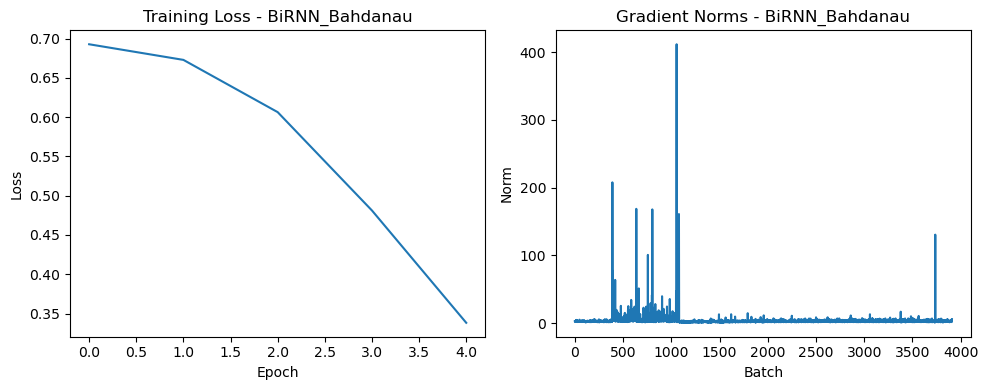

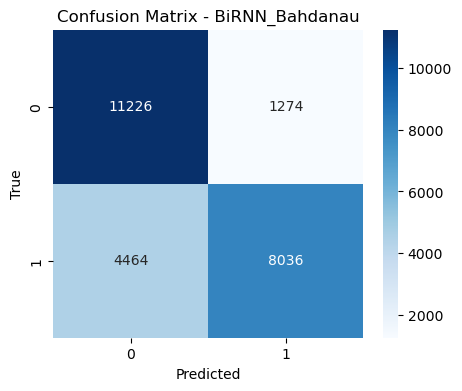

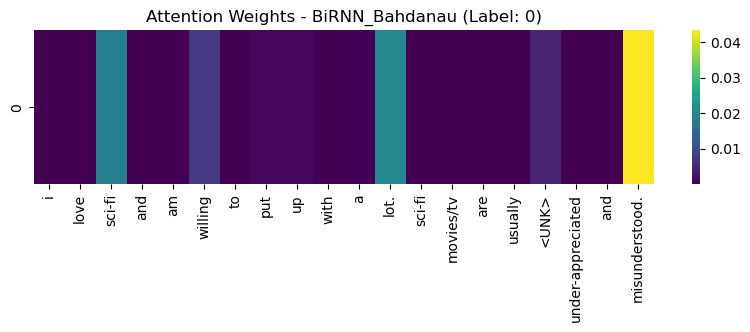

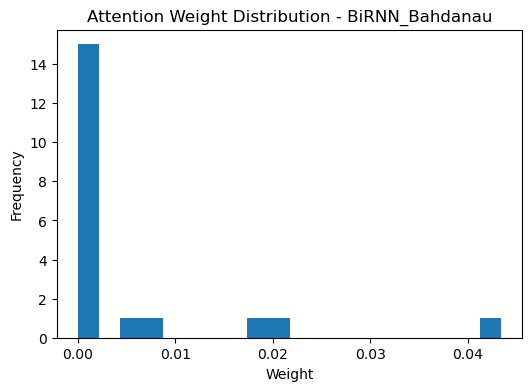


Sample Predictions for BiRNN_Bahdanau:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training BiRNN_Dot...


Epoch 1:   2%|█                                                   | 16/782 [00:00<00:05, 151.29it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:   6%|███▏                                                | 47/782 [00:00<00:04, 148.78it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  10%|█████                                               | 77/782 [00:00<00:04, 148.26it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  14%|██████▉                                            | 107/782 [00:00<00:04, 147.93it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  18%|████████▉                                          | 137/782 [00:00<00:04, 146.11it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  21%|██████████▉                                        | 167/782 [00:01<00:04, 144.65it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  25%|████████████▊                                      | 197/782 [00:01<00:04, 144.86it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  29%|██████████████▊                                    | 227/782 [00:01<00:03, 145.54it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  33%|████████████████▊                                  | 257/782 [00:01<00:03, 145.78it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  37%|██████████████████▋                                | 287/782 [00:01<00:03, 144.72it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  41%|████████████████████▋                              | 317/782 [00:02<00:03, 143.54it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  44%|██████████████████████▋                            | 347/782 [00:02<00:03, 144.09it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  48%|████████████████████████▌                          | 377/782 [00:02<00:02, 144.66it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  52%|██████████████████████████▌                        | 407/782 [00:02<00:02, 144.72it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  56%|████████████████████████████▌                      | 437/782 [00:03<00:02, 143.55it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  60%|██████████████████████████████▍                    | 467/782 [00:03<00:02, 142.77it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  64%|████████████████████████████████▍                  | 497/782 [00:03<00:01, 143.57it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  67%|██████████████████████████████████▎                | 527/782 [00:03<00:01, 143.81it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  71%|████████████████████████████████████▎              | 557/782 [00:03<00:01, 143.67it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  73%|█████████████████████████████████████▎             | 572/782 [00:03<00:01, 143.12it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  75%|██████████████████████████████████████▎            | 587/782 [00:04<00:01, 142.22it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  77%|███████████████████████████████████████▎           | 602/782 [00:04<00:01, 142.05it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  79%|████████████████████████████████████████▏          | 617/782 [00:04<00:01, 142.23it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  81%|█████████████████████████████████████████▏         | 632/782 [00:04<00:01, 142.51it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  83%|██████████████████████████████████████████▏        | 647/782 [00:04<00:00, 142.62it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  85%|███████████████████████████████████████████▏       | 662/782 [00:04<00:00, 142.93it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  87%|████████████████████████████████████████████▏      | 677/782 [00:04<00:00, 143.18it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  88%|█████████████████████████████████████████████▏     | 692/782 [00:04<00:00, 143.04it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  92%|███████████████████████████████████████████████    | 722/782 [00:05<00:00, 142.04it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1:  96%|█████████████████████████████████████████████████  | 752/782 [00:05<00:00, 141.76it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 144.14it/s]


Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:   2%|▉                                                   | 15/782 [00:00<00:05, 143.65it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:   4%|█▉                                                  | 30/782 [00:00<00:05, 143.21it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:   6%|██▉                                                 | 45/782 [00:00<00:05, 142.82it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:   8%|███▉                                                | 60/782 [00:00<00:05, 142.01it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  10%|████▉                                               | 75/782 [00:00<00:04, 141.64it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  12%|█████▉                                              | 90/782 [00:00<00:04, 141.35it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  13%|██████▊                                            | 105/782 [00:00<00:04, 141.53it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  15%|███████▊                                           | 120/782 [00:00<00:04, 141.87it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  17%|████████▊                                          | 135/782 [00:00<00:04, 142.03it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  19%|█████████▊                                         | 150/782 [00:01<00:04, 142.40it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  21%|██████████▊                                        | 165/782 [00:01<00:04, 142.74it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  23%|███████████▋                                       | 180/782 [00:01<00:04, 142.73it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  25%|████████████▋                                      | 195/782 [00:01<00:04, 142.59it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  27%|█████████████▋                                     | 210/782 [00:01<00:04, 142.17it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  29%|██████████████▋                                    | 225/782 [00:01<00:03, 141.68it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  31%|███████████████▋                                   | 240/782 [00:01<00:03, 141.46it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  33%|████████████████▋                                  | 255/782 [00:01<00:03, 141.44it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  35%|█████████████████▌                                 | 270/782 [00:01<00:03, 141.65it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  36%|██████████████████▌                                | 285/782 [00:02<00:03, 141.88it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  38%|███████████████████▌                               | 300/782 [00:02<00:03, 142.05it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  40%|████████████████████▌                              | 315/782 [00:02<00:03, 142.23it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  42%|█████████████████████▌                             | 330/782 [00:02<00:03, 142.14it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  44%|██████████████████████▌                            | 345/782 [00:02<00:03, 142.10it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  48%|████████████████████████▍                          | 375/782 [00:02<00:02, 141.56it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  52%|██████████████████████████▍                        | 405/782 [00:02<00:02, 141.97it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  54%|███████████████████████████▍                       | 420/782 [00:02<00:02, 142.22it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  56%|████████████████████████████▎                      | 435/782 [00:03<00:02, 142.42it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  58%|█████████████████████████████▎                     | 450/782 [00:03<00:02, 142.49it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  59%|██████████████████████████████▎                    | 465/782 [00:03<00:02, 142.44it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  61%|███████████████████████████████▎                   | 480/782 [00:03<00:02, 142.33it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  63%|████████████████████████████████▎                  | 495/782 [00:03<00:02, 142.11it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 141.61it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  67%|██████████████████████████████████▏                | 525/782 [00:03<00:01, 141.43it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 141.49it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  71%|████████████████████████████████████▏              | 555/782 [00:03<00:01, 141.58it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  73%|█████████████████████████████████████▏             | 570/782 [00:04<00:01, 141.82it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 142.07it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  77%|███████████████████████████████████████▏           | 600/782 [00:04<00:01, 142.26it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  79%|████████████████████████████████████████           | 615/782 [00:04<00:01, 142.18it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  81%|█████████████████████████████████████████          | 630/782 [00:04<00:01, 142.40it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  82%|██████████████████████████████████████████         | 645/782 [00:04<00:00, 142.27it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  84%|███████████████████████████████████████████        | 660/782 [00:04<00:00, 142.05it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  86%|████████████████████████████████████████████       | 675/782 [00:04<00:00, 142.17it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  88%|█████████████████████████████████████████████      | 690/782 [00:04<00:00, 142.13it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  90%|█████████████████████████████████████████████▉     | 705/782 [00:04<00:00, 142.20it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  92%|██████████████████████████████████████████████▉    | 720/782 [00:05<00:00, 142.43it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  94%|███████████████████████████████████████████████▉   | 735/782 [00:05<00:00, 142.30it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  96%|████████████████████████████████████████████████▉  | 750/782 [00:05<00:00, 142.34it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 2:  98%|█████████████████████████████████████████████████▉ | 765/782 [00:05<00:00, 142.36it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 142.09it/s]


Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:   2%|▉                                                   | 15/782 [00:00<00:05, 143.27it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:   4%|█▉                                                  | 30/782 [00:00<00:05, 142.26it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:   6%|██▉                                                 | 45/782 [00:00<00:05, 142.20it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:   8%|███▉                                                | 60/782 [00:00<00:05, 142.49it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  10%|████▉                                               | 75/782 [00:00<00:04, 142.65it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  12%|█████▉                                              | 90/782 [00:00<00:04, 142.30it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  13%|██████▊                                            | 105/782 [00:00<00:04, 142.20it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  15%|███████▊                                           | 120/782 [00:00<00:04, 142.18it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  17%|████████▊                                          | 135/782 [00:00<00:04, 141.93it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  19%|█████████▊                                         | 150/782 [00:01<00:04, 142.02it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  21%|██████████▊                                        | 165/782 [00:01<00:04, 142.10it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  23%|███████████▋                                       | 180/782 [00:01<00:04, 141.97it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  25%|████████████▋                                      | 195/782 [00:01<00:04, 141.88it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  27%|█████████████▋                                     | 210/782 [00:01<00:04, 142.15it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  29%|██████████████▋                                    | 225/782 [00:01<00:03, 142.08it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  31%|███████████████▋                                   | 240/782 [00:01<00:03, 141.96it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  33%|████████████████▋                                  | 255/782 [00:01<00:03, 141.84it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  35%|█████████████████▌                                 | 270/782 [00:01<00:03, 141.90it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  36%|██████████████████▌                                | 285/782 [00:02<00:03, 141.95it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  38%|███████████████████▌                               | 300/782 [00:02<00:03, 142.05it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  40%|████████████████████▌                              | 315/782 [00:02<00:03, 141.84it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  42%|█████████████████████▌                             | 330/782 [00:02<00:03, 141.78it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  44%|██████████████████████▌                            | 345/782 [00:02<00:03, 141.86it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 141.90it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  48%|████████████████████████▍                          | 375/782 [00:02<00:02, 141.81it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  52%|██████████████████████████▍                        | 405/782 [00:02<00:02, 141.85it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  54%|███████████████████████████▍                       | 420/782 [00:02<00:02, 141.09it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  56%|████████████████████████████▎                      | 435/782 [00:03<00:02, 141.38it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  58%|█████████████████████████████▎                     | 450/782 [00:03<00:02, 141.49it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  59%|██████████████████████████████▎                    | 465/782 [00:03<00:02, 141.68it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  61%|███████████████████████████████▎                   | 480/782 [00:03<00:02, 141.73it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  63%|████████████████████████████████▎                  | 495/782 [00:03<00:02, 141.79it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 141.71it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  67%|██████████████████████████████████▏                | 525/782 [00:03<00:01, 141.81it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 141.89it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  71%|████████████████████████████████████▏              | 555/782 [00:03<00:01, 141.94it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  73%|█████████████████████████████████████▏             | 570/782 [00:04<00:01, 141.83it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 141.97it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  77%|███████████████████████████████████████▏           | 600/782 [00:04<00:01, 142.09it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  79%|████████████████████████████████████████           | 615/782 [00:04<00:01, 142.22it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  81%|█████████████████████████████████████████          | 630/782 [00:04<00:01, 142.30it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  82%|██████████████████████████████████████████         | 645/782 [00:04<00:00, 141.68it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  84%|███████████████████████████████████████████        | 660/782 [00:04<00:00, 141.85it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  86%|████████████████████████████████████████████       | 675/782 [00:04<00:00, 141.87it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  88%|█████████████████████████████████████████████      | 690/782 [00:04<00:00, 141.94it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  90%|█████████████████████████████████████████████▉     | 705/782 [00:04<00:00, 141.93it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  92%|██████████████████████████████████████████████▉    | 720/782 [00:05<00:00, 141.97it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  94%|███████████████████████████████████████████████▉   | 735/782 [00:05<00:00, 142.01it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  96%|████████████████████████████████████████████████▉  | 750/782 [00:05<00:00, 142.21it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 3:  98%|█████████████████████████████████████████████████▉ | 765/782 [00:05<00:00, 142.10it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 141.92it/s]


Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:   2%|▉                                                   | 15/782 [00:00<00:05, 142.84it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:   4%|█▉                                                  | 30/782 [00:00<00:05, 142.46it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:   6%|██▉                                                 | 45/782 [00:00<00:05, 142.62it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:   8%|███▉                                                | 60/782 [00:00<00:05, 142.61it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  10%|████▉                                               | 75/782 [00:00<00:04, 142.54it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  12%|█████▉                                              | 90/782 [00:00<00:04, 142.26it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  13%|██████▊                                            | 105/782 [00:00<00:04, 142.13it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  15%|███████▊                                           | 120/782 [00:00<00:04, 142.30it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  17%|████████▊                                          | 135/782 [00:00<00:04, 141.51it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  19%|█████████▊                                         | 150/782 [00:01<00:04, 141.39it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  21%|██████████▊                                        | 165/782 [00:01<00:04, 141.44it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  23%|███████████▋                                       | 180/782 [00:01<00:04, 141.63it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  25%|████████████▋                                      | 195/782 [00:01<00:04, 141.66it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  27%|█████████████▋                                     | 210/782 [00:01<00:04, 141.93it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  29%|██████████████▋                                    | 225/782 [00:01<00:03, 141.73it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  31%|███████████████▋                                   | 240/782 [00:01<00:03, 141.76it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  33%|████████████████▋                                  | 255/782 [00:01<00:03, 141.78it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  35%|█████████████████▌                                 | 270/782 [00:01<00:03, 141.50it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  36%|██████████████████▌                                | 285/782 [00:02<00:03, 141.22it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  38%|███████████████████▌                               | 300/782 [00:02<00:03, 141.38it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  40%|████████████████████▌                              | 315/782 [00:02<00:03, 141.64it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  42%|█████████████████████▌                             | 330/782 [00:02<00:03, 142.03it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  44%|██████████████████████▌                            | 345/782 [00:02<00:03, 142.24it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 142.39it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  48%|████████████████████████▍                          | 375/782 [00:02<00:02, 142.34it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  50%|█████████████████████████▍                         | 390/782 [00:02<00:02, 142.12it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  52%|██████████████████████████▍                        | 405/782 [00:02<00:02, 142.17it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  54%|███████████████████████████▍                       | 420/782 [00:02<00:02, 141.81it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  56%|████████████████████████████▎                      | 435/782 [00:03<00:02, 141.49it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  58%|█████████████████████████████▎                     | 450/782 [00:03<00:02, 141.56it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  59%|██████████████████████████████▎                    | 465/782 [00:03<00:02, 141.80it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  61%|███████████████████████████████▎                   | 480/782 [00:03<00:02, 142.01it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  63%|████████████████████████████████▎                  | 495/782 [00:03<00:02, 142.16it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 142.36it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  67%|██████████████████████████████████▏                | 525/782 [00:03<00:01, 142.16it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 142.06it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  71%|████████████████████████████████████▏              | 555/782 [00:03<00:01, 141.88it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  73%|█████████████████████████████████████▏             | 570/782 [00:04<00:01, 141.60it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 141.77it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  77%|███████████████████████████████████████▏           | 600/782 [00:04<00:01, 142.00it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  79%|████████████████████████████████████████           | 615/782 [00:04<00:01, 142.18it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  81%|█████████████████████████████████████████          | 630/782 [00:04<00:01, 142.16it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  82%|██████████████████████████████████████████         | 645/782 [00:04<00:00, 142.29it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  84%|███████████████████████████████████████████        | 660/782 [00:04<00:00, 142.52it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  86%|████████████████████████████████████████████       | 675/782 [00:04<00:00, 142.41it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  88%|█████████████████████████████████████████████      | 690/782 [00:04<00:00, 142.06it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  90%|█████████████████████████████████████████████▉     | 705/782 [00:04<00:00, 141.80it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  92%|██████████████████████████████████████████████▉    | 720/782 [00:05<00:00, 141.61it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  94%|███████████████████████████████████████████████▉   | 735/782 [00:05<00:00, 141.78it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  96%|████████████████████████████████████████████████▉  | 750/782 [00:05<00:00, 141.73it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 4:  98%|█████████████████████████████████████████████████▉ | 765/782 [00:05<00:00, 141.72it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 141.87it/s]


Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:   2%|▉                                                   | 15/782 [00:00<00:05, 144.08it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:   4%|█▉                                                  | 30/782 [00:00<00:05, 142.20it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:   6%|██▉                                                 | 45/782 [00:00<00:05, 141.87it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:   8%|███▉                                                | 60/782 [00:00<00:05, 141.41it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  10%|████▉                                               | 75/782 [00:00<00:04, 141.54it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  12%|█████▉                                              | 90/782 [00:00<00:04, 141.73it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  13%|██████▊                                            | 105/782 [00:00<00:04, 141.96it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  15%|███████▊                                           | 120/782 [00:00<00:04, 142.04it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  17%|████████▊                                          | 135/782 [00:00<00:04, 142.01it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  19%|█████████▊                                         | 150/782 [00:01<00:04, 142.40it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  21%|██████████▊                                        | 165/782 [00:01<00:04, 142.57it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  23%|███████████▋                                       | 180/782 [00:01<00:04, 142.50it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  25%|████████████▋                                      | 195/782 [00:01<00:04, 142.20it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  27%|█████████████▋                                     | 210/782 [00:01<00:04, 142.05it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  29%|██████████████▋                                    | 225/782 [00:01<00:03, 141.86it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  31%|███████████████▋                                   | 240/782 [00:01<00:03, 141.88it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  33%|████████████████▋                                  | 255/782 [00:01<00:03, 141.84it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  35%|█████████████████▌                                 | 270/782 [00:01<00:03, 142.14it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  36%|██████████████████▌                                | 285/782 [00:02<00:03, 142.32it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  38%|███████████████████▌                               | 300/782 [00:02<00:03, 142.28it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  40%|████████████████████▌                              | 315/782 [00:02<00:03, 142.07it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  42%|█████████████████████▌                             | 330/782 [00:02<00:03, 142.11it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  44%|██████████████████████▌                            | 345/782 [00:02<00:03, 141.88it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  46%|███████████████████████▍                           | 360/782 [00:02<00:02, 141.91it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  48%|████████████████████████▍                          | 375/782 [00:02<00:02, 141.65it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  50%|█████████████████████████▍                         | 390/782 [00:02<00:02, 141.71it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  52%|██████████████████████████▍                        | 405/782 [00:02<00:02, 142.05it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  54%|███████████████████████████▍                       | 420/782 [00:02<00:02, 142.16it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  56%|████████████████████████████▎                      | 435/782 [00:03<00:02, 142.12it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  58%|█████████████████████████████▎                     | 450/782 [00:03<00:02, 142.26it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  59%|██████████████████████████████▎                    | 465/782 [00:03<00:02, 142.20it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  61%|███████████████████████████████▎                   | 480/782 [00:03<00:02, 141.93it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  63%|████████████████████████████████▎                  | 495/782 [00:03<00:02, 141.86it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  65%|█████████████████████████████████▎                 | 510/782 [00:03<00:01, 141.75it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  67%|██████████████████████████████████▏                | 525/782 [00:03<00:01, 141.62it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:03<00:01, 141.78it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  71%|████████████████████████████████████▏              | 555/782 [00:03<00:01, 142.16it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  73%|█████████████████████████████████████▏             | 570/782 [00:04<00:01, 142.31it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 142.36it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  77%|███████████████████████████████████████▏           | 600/782 [00:04<00:01, 142.33it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  79%|████████████████████████████████████████           | 615/782 [00:04<00:01, 142.16it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  81%|█████████████████████████████████████████          | 630/782 [00:04<00:01, 141.99it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  82%|██████████████████████████████████████████         | 645/782 [00:04<00:00, 141.76it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  84%|███████████████████████████████████████████        | 660/782 [00:04<00:00, 141.80it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  86%|████████████████████████████████████████████       | 675/782 [00:04<00:00, 141.80it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  88%|█████████████████████████████████████████████      | 690/782 [00:04<00:00, 142.16it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  90%|█████████████████████████████████████████████▉     | 705/782 [00:04<00:00, 142.21it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  92%|██████████████████████████████████████████████▉    | 720/782 [00:05<00:00, 142.26it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  94%|███████████████████████████████████████████████▉   | 735/782 [00:05<00:00, 142.29it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  96%|████████████████████████████████████████████████▉  | 750/782 [00:05<00:00, 142.36it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

Epoch 5:  98%|█████████████████████████████████████████████████▉ | 765/782 [00:05<00:00, 142.24it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:05<00:00, 142.06it/s]

Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Raw output type: <class 'tuple'>
Model: BiRNN_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Dot, Ra

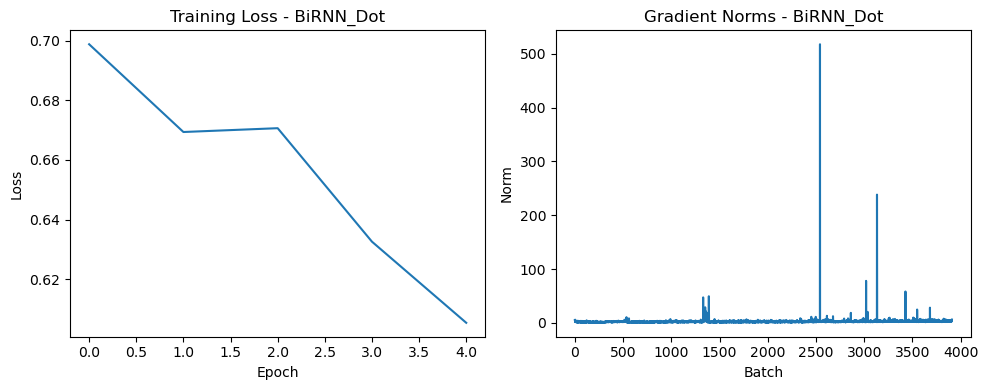

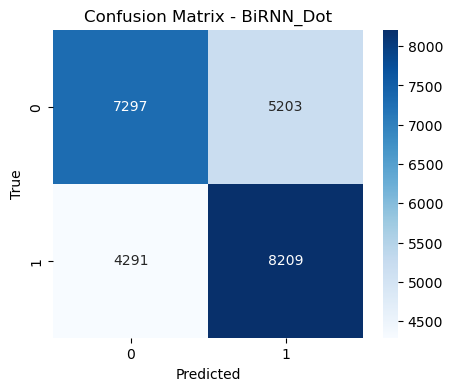

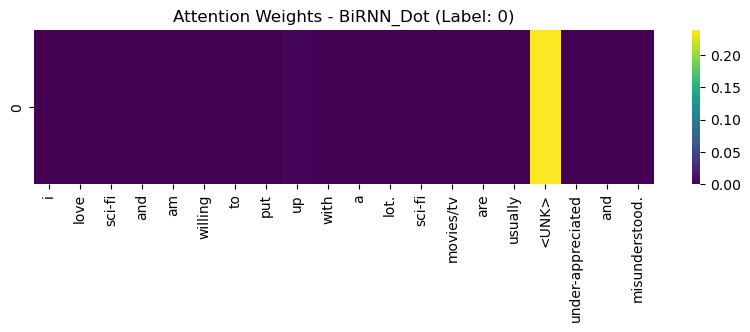

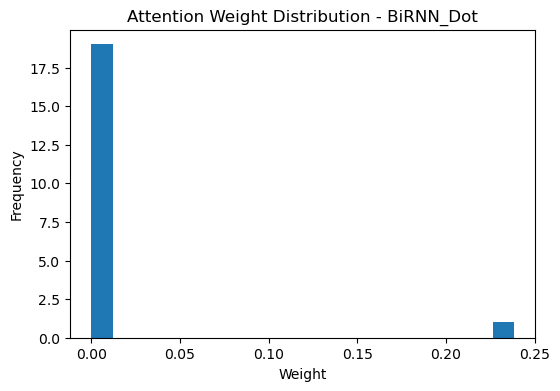


Sample Predictions for BiRNN_Dot:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 1.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training BiRNN_General...


Epoch 1:   2%|▉                                                   | 14/782 [00:00<00:05, 137.08it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:   5%|██▊                                                 | 42/782 [00:00<00:05, 131.82it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:   9%|████▋                                               | 70/782 [00:00<00:05, 131.41it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  13%|██████▌                                             | 98/782 [00:00<00:05, 130.92it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  16%|████████▏                                          | 126/782 [00:00<00:05, 128.83it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  19%|█████████▉                                         | 152/782 [00:01<00:04, 127.26it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  23%|███████████▋                                       | 179/782 [00:01<00:04, 128.47it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  26%|█████████████▌                                     | 207/782 [00:01<00:04, 129.47it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 129.73it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 128.61it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  37%|██████████████████▋                                | 286/782 [00:02<00:03, 127.90it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  40%|████████████████████▍                              | 313/782 [00:02<00:03, 128.12it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  43%|██████████████████████                             | 339/782 [00:02<00:03, 128.76it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  47%|███████████████████████▊                           | 365/782 [00:02<00:03, 128.93it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  50%|█████████████████████████▌                         | 391/782 [00:03<00:03, 128.06it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  53%|███████████████████████████▏                       | 417/782 [00:03<00:02, 127.43it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  57%|████████████████████████████▉                      | 443/782 [00:03<00:02, 128.02it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  60%|██████████████████████████████▌                    | 469/782 [00:03<00:02, 128.42it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  63%|████████████████████████████████▎                  | 495/782 [00:03<00:02, 128.25it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  67%|█████████████████████████████████▉                 | 521/782 [00:04<00:02, 127.20it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  70%|███████████████████████████████████▋               | 547/782 [00:04<00:01, 126.98it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  73%|█████████████████████████████████████▎             | 573/782 [00:04<00:01, 127.62it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  77%|███████████████████████████████████████            | 599/782 [00:04<00:01, 127.87it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  80%|████████████████████████████████████████▊          | 625/782 [00:04<00:01, 127.52it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  83%|██████████████████████████████████████████▍        | 651/782 [00:05<00:01, 126.52it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  87%|████████████████████████████████████████████▏      | 677/782 [00:05<00:00, 126.39it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  90%|█████████████████████████████████████████████▊     | 703/782 [00:05<00:00, 126.75it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  93%|███████████████████████████████████████████████▌   | 729/782 [00:05<00:00, 127.29it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1:  97%|█████████████████████████████████████████████████▏ | 755/782 [00:05<00:00, 126.68it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 1: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 128.13it/s]


Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   2%|▊                                                   | 13/782 [00:00<00:06, 127.23it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:   3%|█▋                                                  | 26/782 [00:00<00:05, 127.13it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   5%|██▌                                                 | 39/782 [00:00<00:05, 127.00it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:   7%|███▍                                                | 52/782 [00:00<00:05, 127.24it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   8%|████▎                                               | 65/782 [00:00<00:05, 127.30it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  10%|█████▏                                              | 78/782 [00:00<00:05, 127.14it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  12%|██████                                              | 91/782 [00:00<00:05, 127.00it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  13%|██████▊                                            | 104/782 [00:00<00:05, 126.76it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  15%|███████▋                                           | 117/782 [00:00<00:05, 126.24it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  17%|████████▍                                          | 130/782 [00:01<00:05, 125.89it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  18%|█████████▎                                         | 143/782 [00:01<00:05, 126.38it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  20%|██████████▏                                        | 156/782 [00:01<00:04, 126.34it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  22%|███████████                                        | 169/782 [00:01<00:04, 126.57it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  23%|███████████▊                                       | 182/782 [00:01<00:04, 126.97it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  25%|████████████▋                                      | 195/782 [00:01<00:04, 127.10it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  27%|█████████████▌                                     | 208/782 [00:01<00:04, 127.04it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 126.89it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 126.60it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  32%|████████████████                                   | 247/782 [00:01<00:04, 126.33it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 126.36it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 126.46it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  37%|██████████████████▋                                | 286/782 [00:02<00:03, 126.42it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 126.51it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  40%|████████████████████▎                              | 312/782 [00:02<00:03, 126.66it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 126.72it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  43%|██████████████████████                             | 338/782 [00:02<00:03, 126.76it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 126.71it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  47%|███████████████████████▋                           | 364/782 [00:02<00:03, 126.30it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  48%|████████████████████████▌                          | 377/782 [00:02<00:03, 126.14it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  50%|█████████████████████████▍                         | 390/782 [00:03<00:03, 126.30it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  52%|██████████████████████████▎                        | 403/782 [00:03<00:02, 126.69it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  53%|███████████████████████████▏                       | 416/782 [00:03<00:02, 126.52it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 126.74it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  57%|████████████████████████████▊                      | 442/782 [00:03<00:02, 126.82it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 126.79it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  60%|██████████████████████████████▌                    | 468/782 [00:03<00:02, 126.90it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 126.80it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  63%|████████████████████████████████▏                  | 494/782 [00:03<00:02, 126.39it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 126.30it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  66%|█████████████████████████████████▉                 | 520/782 [00:04<00:02, 126.62it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:01, 126.93it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  70%|███████████████████████████████████▌               | 546/782 [00:04<00:01, 127.06it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 127.06it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  73%|█████████████████████████████████████▎             | 572/782 [00:04<00:01, 127.10it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 127.12it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  76%|███████████████████████████████████████            | 598/782 [00:04<00:01, 127.01it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 126.69it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  80%|████████████████████████████████████████▋          | 624/782 [00:04<00:01, 126.28it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 126.36it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 126.36it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 126.65it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  86%|████████████████████████████████████████████       | 676/782 [00:05<00:00, 126.73it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 126.57it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  90%|█████████████████████████████████████████████▊     | 702/782 [00:05<00:00, 127.01it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 127.26it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  93%|███████████████████████████████████████████████▍   | 728/782 [00:05<00:00, 127.01it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 126.53it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2:  96%|█████████████████████████████████████████████████▏ | 754/782 [00:05<00:00, 126.39it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 126.63it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 126.71it/s]


Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   2%|▊                                                   | 13/782 [00:00<00:06, 127.51it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:   3%|█▋                                                  | 26/782 [00:00<00:05, 126.67it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   5%|██▌                                                 | 39/782 [00:00<00:05, 127.12it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:   7%|███▍                                                | 52/782 [00:00<00:05, 127.40it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   8%|████▎                                               | 65/782 [00:00<00:05, 127.21it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  10%|█████▏                                              | 78/782 [00:00<00:05, 126.91it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  12%|██████                                              | 91/782 [00:00<00:05, 126.56it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  13%|██████▊                                            | 104/782 [00:00<00:05, 126.36it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  15%|███████▋                                           | 117/782 [00:00<00:05, 126.49it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  17%|████████▍                                          | 130/782 [00:01<00:05, 126.52it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  18%|█████████▎                                         | 143/782 [00:01<00:05, 126.47it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  20%|██████████▏                                        | 156/782 [00:01<00:04, 126.29it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  22%|███████████                                        | 169/782 [00:01<00:04, 126.63it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  23%|███████████▊                                       | 182/782 [00:01<00:04, 126.88it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  25%|████████████▋                                      | 195/782 [00:01<00:04, 126.61it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  27%|█████████████▌                                     | 208/782 [00:01<00:04, 126.52it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 126.46it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  30%|███████████████▎                                   | 234/782 [00:01<00:04, 126.48it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  32%|████████████████                                   | 247/782 [00:01<00:04, 126.40it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  33%|████████████████▉                                  | 260/782 [00:02<00:04, 126.40it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 126.53it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  37%|██████████████████▋                                | 286/782 [00:02<00:03, 126.50it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 126.82it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  40%|████████████████████▎                              | 312/782 [00:02<00:03, 126.76it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 126.55it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  43%|██████████████████████                             | 338/782 [00:02<00:03, 126.57it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 126.80it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  47%|███████████████████████▋                           | 364/782 [00:02<00:03, 126.45it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  48%|████████████████████████▌                          | 377/782 [00:02<00:03, 126.45it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  50%|█████████████████████████▍                         | 390/782 [00:03<00:03, 126.39it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  52%|██████████████████████████▎                        | 403/782 [00:03<00:03, 126.21it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  53%|███████████████████████████▏                       | 416/782 [00:03<00:02, 126.32it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 126.59it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  57%|████████████████████████████▊                      | 442/782 [00:03<00:02, 126.32it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 126.17it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:03<00:02, 126.40it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 126.54it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  63%|████████████████████████████████▏                  | 494/782 [00:03<00:02, 126.60it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 126.50it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  66%|█████████████████████████████████▉                 | 520/782 [00:04<00:02, 126.40it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:01, 126.46it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  70%|███████████████████████████████████▌               | 546/782 [00:04<00:01, 126.63it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 126.56it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  73%|█████████████████████████████████████▎             | 572/782 [00:04<00:01, 126.38it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 126.48it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  76%|███████████████████████████████████████            | 598/782 [00:04<00:01, 126.55it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 126.78it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  80%|████████████████████████████████████████▋          | 624/782 [00:04<00:01, 126.46it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 126.55it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 126.57it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 126.62it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  86%|████████████████████████████████████████████       | 676/782 [00:05<00:00, 126.53it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 126.74it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  90%|█████████████████████████████████████████████▊     | 702/782 [00:05<00:00, 126.43it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 126.56it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  93%|███████████████████████████████████████████████▍   | 728/782 [00:05<00:00, 126.68it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 126.64it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3:  96%|█████████████████████████████████████████████████▏ | 754/782 [00:05<00:00, 126.33it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 126.60it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 3: 100%|██████████████████████████████████████████████████▊| 780/782 [00:06<00:00, 126.75it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   2%|▊                                                   | 13/782 [00:00<00:06, 127.38it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:   5%|██▌                                                 | 39/782 [00:00<00:05, 126.71it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:   8%|████▎                                               | 65/782 [00:00<00:05, 126.80it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  12%|██████                                              | 91/782 [00:00<00:05, 126.27it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  15%|███████▋                                           | 117/782 [00:00<00:05, 126.15it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  18%|█████████▎                                         | 143/782 [00:01<00:05, 126.58it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  22%|███████████                                        | 169/782 [00:01<00:04, 126.59it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  25%|████████████▋                                      | 195/782 [00:01<00:04, 126.43it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 126.36it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  32%|████████████████                                   | 247/782 [00:01<00:04, 126.62it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 126.74it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 126.79it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 126.62it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 126.01it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  48%|████████████████████████▌                          | 377/782 [00:02<00:03, 126.40it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  52%|██████████████████████████▎                        | 403/782 [00:03<00:02, 126.55it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 126.71it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 126.24it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 126.15it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 126.38it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:01, 126.51it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 126.39it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 126.23it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 126.19it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 126.23it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 126.34it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 126.19it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 125.96it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 126.30it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 126.31it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 126.40it/s]


Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   2%|▊                                                   | 13/782 [00:00<00:06, 127.58it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:   5%|██▌                                                 | 39/782 [00:00<00:05, 126.55it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:   8%|████▎                                               | 65/782 [00:00<00:05, 126.11it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  12%|██████                                              | 91/782 [00:00<00:05, 126.00it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  15%|███████▋                                           | 117/782 [00:00<00:05, 126.42it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  18%|█████████▎                                         | 143/782 [00:01<00:05, 126.52it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  22%|███████████                                        | 169/782 [00:01<00:04, 126.16it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  25%|████████████▋                                      | 195/782 [00:01<00:04, 125.89it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  28%|██████████████▍                                    | 221/782 [00:01<00:04, 126.43it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  32%|████████████████                                   | 247/782 [00:01<00:04, 126.70it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  35%|█████████████████▊                                 | 273/782 [00:02<00:04, 126.68it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  38%|███████████████████▌                               | 299/782 [00:02<00:03, 126.28it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  42%|█████████████████████▏                             | 325/782 [00:02<00:03, 125.84it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  45%|██████████████████████▉                            | 351/782 [00:02<00:03, 126.42it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  48%|████████████████████████▌                          | 377/782 [00:02<00:03, 126.56it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  52%|██████████████████████████▎                        | 403/782 [00:03<00:02, 126.54it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  55%|███████████████████████████▉                       | 429/782 [00:03<00:02, 126.38it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  58%|█████████████████████████████▋                     | 455/782 [00:03<00:02, 126.26it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  62%|███████████████████████████████▎                   | 481/782 [00:03<00:02, 126.63it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  65%|█████████████████████████████████                  | 507/782 [00:04<00:02, 126.56it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  68%|██████████████████████████████████▊                | 533/782 [00:04<00:01, 126.50it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  71%|████████████████████████████████████▍              | 559/782 [00:04<00:01, 126.11it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  75%|██████████████████████████████████████▏            | 585/782 [00:04<00:01, 126.27it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  78%|███████████████████████████████████████▊           | 611/782 [00:04<00:01, 126.19it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  81%|█████████████████████████████████████████▌         | 637/782 [00:05<00:01, 126.45it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  85%|███████████████████████████████████████████▏       | 663/782 [00:05<00:00, 126.51it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  88%|████████████████████████████████████████████▉      | 689/782 [00:05<00:00, 126.28it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  91%|██████████████████████████████████████████████▋    | 715/782 [00:05<00:00, 126.63it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  95%|████████████████████████████████████████████████▎  | 741/782 [00:05<00:00, 126.69it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5:  98%|██████████████████████████████████████████████████ | 767/782 [00:06<00:00, 126.78it/s]

Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.T

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 126.41it/s]


Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_General, Raw output type: <class 'tuple'>
Model: BiRNN_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


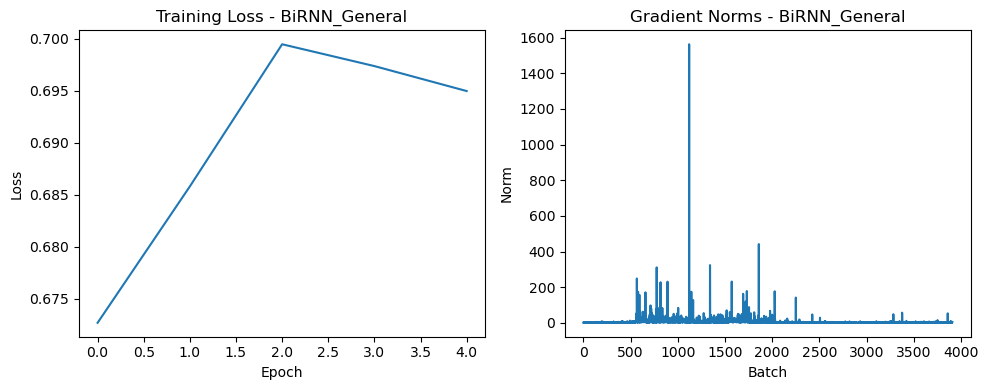

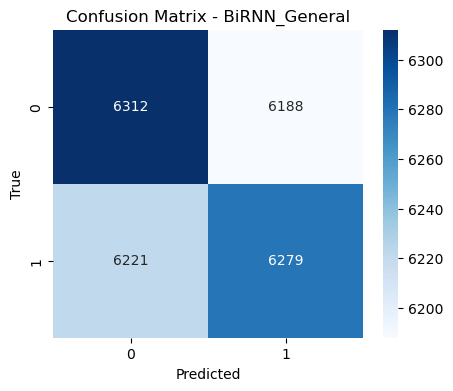

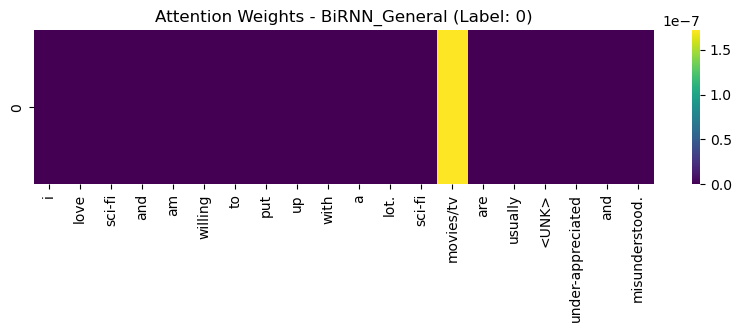

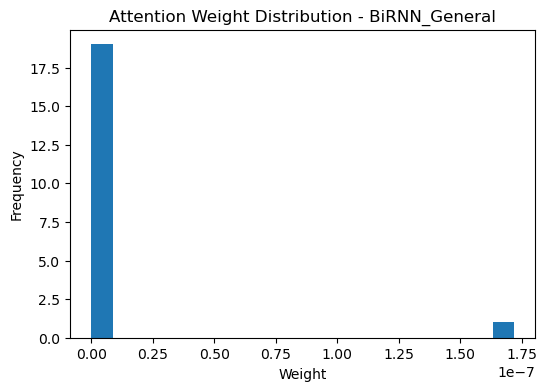


Sample Predictions for BiRNN_General:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 1.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 1.0

Training BiRNN_Concat...


Epoch 1:   2%|▊                                                   | 13/782 [00:00<00:05, 129.33it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:   5%|██▌                                                 | 39/782 [00:00<00:05, 123.96it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:   8%|████▎                                               | 65/782 [00:00<00:05, 123.12it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  12%|██████                                              | 91/782 [00:00<00:05, 122.89it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  15%|███████▋                                           | 117/782 [00:00<00:05, 121.04it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  18%|█████████▎                                         | 143/782 [00:01<00:05, 119.52it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  21%|██████████▉                                        | 168/782 [00:01<00:05, 120.09it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  25%|████████████▋                                      | 194/782 [00:01<00:04, 121.30it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  28%|██████████████▎                                    | 220/782 [00:01<00:04, 121.67it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  30%|███████████████▏                                   | 233/782 [00:01<00:04, 120.88it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  31%|████████████████                                   | 246/782 [00:02<00:04, 119.77it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  33%|████████████████▊                                  | 258/782 [00:02<00:04, 119.51it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  35%|█████████████████▌                                 | 270/782 [00:02<00:04, 119.46it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  36%|██████████████████▍                                | 283/782 [00:02<00:04, 119.87it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  38%|███████████████████▎                               | 296/782 [00:02<00:04, 120.35it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  40%|████████████████████▏                              | 309/782 [00:02<00:03, 120.77it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  43%|█████████████████████▊                             | 335/782 [00:02<00:03, 120.77it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  46%|███████████████████████▍                           | 360/782 [00:02<00:03, 118.68it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 117.79it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 118.27it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  55%|████████████████████████████▏                      | 433/782 [00:03<00:02, 119.21it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  59%|█████████████████████████████▊                     | 458/782 [00:03<00:02, 119.17it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  62%|███████████████████████████████▍                   | 482/782 [00:04<00:02, 117.95it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  65%|█████████████████████████████████                  | 506/782 [00:04<00:02, 117.70it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  68%|██████████████████████████████████▌                | 530/782 [00:04<00:02, 118.42it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  71%|████████████████████████████████████▏              | 554/782 [00:04<00:01, 119.07it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  72%|████████████████████████████████████▉              | 566/782 [00:04<00:01, 118.98it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  74%|█████████████████████████████████████▋             | 578/782 [00:04<00:01, 118.66it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  77%|███████████████████████████████████████▎           | 602/782 [00:05<00:01, 117.29it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  80%|████████████████████████████████████████▊          | 626/782 [00:05<00:01, 116.87it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  83%|██████████████████████████████████████████▍        | 650/782 [00:05<00:01, 117.13it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  86%|███████████████████████████████████████████▉       | 674/782 [00:05<00:00, 117.44it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  89%|█████████████████████████████████████████████▌     | 698/782 [00:05<00:00, 117.02it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  92%|███████████████████████████████████████████████    | 722/782 [00:06<00:00, 116.89it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  95%|████████████████████████████████████████████████▋  | 746/782 [00:06<00:00, 117.15it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 1:  98%|██████████████████████████████████████████████████▏| 770/782 [00:06<00:00, 117.76it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   2%|▊                                                   | 12/782 [00:00<00:06, 118.64it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   5%|██▍                                                 | 36/782 [00:00<00:06, 116.27it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:   8%|███▉                                                | 60/782 [00:00<00:06, 115.67it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  11%|█████▌                                              | 84/782 [00:00<00:06, 116.33it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  14%|███████                                            | 108/782 [00:00<00:05, 116.55it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.54it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  20%|██████████▏                                        | 156/782 [00:01<00:05, 115.89it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  23%|███████████▋                                       | 180/782 [00:01<00:05, 115.80it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 116.66it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.89it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.83it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  35%|██████████████████                                 | 276/782 [00:02<00:04, 115.76it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 115.82it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.29it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.45it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.25it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 115.51it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 115.68it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.31it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.59it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.40it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 115.90it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 116.13it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.33it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.45it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 115.90it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 115.64it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 116.01it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 115.91it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 116.12it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 115.76it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 115.50it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 2: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.14it/s]


Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   2%|▊                                                   | 12/782 [00:00<00:06, 117.40it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   3%|█▌                                                  | 24/782 [00:00<00:06, 116.94it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   5%|██▍                                                 | 36/782 [00:00<00:06, 116.72it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   6%|███▏                                                | 48/782 [00:00<00:06, 116.25it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   8%|███▉                                                | 60/782 [00:00<00:06, 115.95it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:   9%|████▊                                               | 72/782 [00:00<00:06, 115.84it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  11%|█████▌                                              | 84/782 [00:00<00:06, 115.66it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  12%|██████▍                                             | 96/782 [00:00<00:05, 115.65it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  14%|███████                                            | 108/782 [00:00<00:05, 115.65it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  15%|███████▊                                           | 120/782 [00:01<00:05, 115.95it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.02it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  18%|█████████▍                                         | 144/782 [00:01<00:05, 116.10it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  20%|██████████▏                                        | 156/782 [00:01<00:05, 115.97it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  21%|██████████▉                                        | 168/782 [00:01<00:05, 115.87it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  23%|███████████▋                                       | 180/782 [00:01<00:05, 116.15it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  25%|████████████▌                                      | 192/782 [00:01<00:05, 115.94it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 115.80it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  28%|██████████████                                     | 216/782 [00:01<00:04, 115.88it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 115.90it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.07it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.15it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 116.18it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  35%|██████████████████                                 | 276/782 [00:02<00:04, 115.92it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 116.13it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 115.99it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 115.90it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.04it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 116.16it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.26it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.30it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.31it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 116.05it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 116.17it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.03it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 115.75it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 115.96it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.13it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 116.22it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.37it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.48it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.27it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 116.26it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.30it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 116.00it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 116.03it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 116.09it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.10it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 116.20it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.30it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 116.27it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 116.34it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 116.33it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 116.11it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 115.83it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 115.87it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 116.06it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 116.05it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 115.70it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 116.03it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 116.30it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 116.45it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 116.44it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 116.10it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 116.20it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 3: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.11it/s]


Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   2%|▊                                                   | 12/782 [00:00<00:06, 117.95it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   3%|█▌                                                  | 24/782 [00:00<00:06, 116.23it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   5%|██▍                                                 | 36/782 [00:00<00:06, 116.05it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   6%|███▏                                                | 48/782 [00:00<00:06, 116.48it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   8%|███▉                                                | 60/782 [00:00<00:06, 116.45it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:   9%|████▊                                               | 72/782 [00:00<00:06, 116.44it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  11%|█████▌                                              | 84/782 [00:00<00:06, 116.04it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  12%|██████▍                                             | 96/782 [00:00<00:05, 116.22it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  14%|███████                                            | 108/782 [00:00<00:05, 116.16it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  15%|███████▊                                           | 120/782 [00:01<00:05, 116.39it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.21it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  18%|█████████▍                                         | 144/782 [00:01<00:05, 115.83it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  20%|██████████▏                                        | 156/782 [00:01<00:05, 116.02it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  21%|██████████▉                                        | 168/782 [00:01<00:05, 116.22it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  23%|███████████▋                                       | 180/782 [00:01<00:05, 116.06it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  25%|████████████▌                                      | 192/782 [00:01<00:05, 115.87it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 115.92it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  28%|██████████████                                     | 216/782 [00:01<00:04, 116.02it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.26it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.28it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 115.96it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 115.85it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  35%|██████████████████                                 | 276/782 [00:02<00:04, 116.27it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 116.34it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 116.27it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 116.21it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.25it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 116.21it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.24it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.08it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 115.87it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 115.73it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 115.97it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.26it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.31it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 116.18it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.18it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 116.15it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.14it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.02it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 115.93it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 115.80it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.11it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 116.18it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 116.19it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 116.36it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.35it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 116.29it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.03it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 115.70it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 115.64it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 115.84it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 116.00it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 116.23it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 116.39it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 116.52it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 116.50it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 116.44it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 116.11it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 115.86it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 116.02it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 116.16it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 116.35it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 116.46it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 4: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.18it/s]


Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   2%|▊                                                   | 12/782 [00:00<00:06, 116.39it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   3%|█▌                                                  | 24/782 [00:00<00:06, 116.67it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   5%|██▍                                                 | 36/782 [00:00<00:06, 116.19it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   6%|███▏                                                | 48/782 [00:00<00:06, 115.55it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   8%|███▉                                                | 60/782 [00:00<00:06, 115.52it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:   9%|████▊                                               | 72/782 [00:00<00:06, 115.84it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  11%|█████▌                                              | 84/782 [00:00<00:06, 116.02it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  12%|██████▍                                             | 96/782 [00:00<00:05, 116.33it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  14%|███████                                            | 108/782 [00:00<00:05, 116.14it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  15%|███████▊                                           | 120/782 [00:01<00:05, 116.42it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  17%|████████▌                                          | 132/782 [00:01<00:05, 116.67it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  18%|█████████▍                                         | 144/782 [00:01<00:05, 116.59it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  20%|██████████▏                                        | 156/782 [00:01<00:05, 116.37it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  21%|██████████▉                                        | 168/782 [00:01<00:05, 116.16it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  23%|███████████▋                                       | 180/782 [00:01<00:05, 115.88it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  25%|████████████▌                                      | 192/782 [00:01<00:05, 116.12it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  26%|█████████████▎                                     | 204/782 [00:01<00:04, 116.28it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  28%|██████████████                                     | 216/782 [00:01<00:04, 116.10it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  29%|██████████████▊                                    | 228/782 [00:01<00:04, 116.01it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  31%|███████████████▋                                   | 240/782 [00:02<00:04, 116.28it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  32%|████████████████▍                                  | 252/782 [00:02<00:04, 116.31it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  34%|█████████████████▏                                 | 264/782 [00:02<00:04, 116.09it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  35%|██████████████████                                 | 276/782 [00:02<00:04, 115.87it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  37%|██████████████████▊                                | 288/782 [00:02<00:04, 115.78it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  38%|███████████████████▌                               | 300/782 [00:02<00:04, 115.82it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  40%|████████████████████▎                              | 312/782 [00:02<00:04, 116.22it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  41%|█████████████████████▏                             | 324/782 [00:02<00:03, 116.36it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  43%|█████████████████████▉                             | 336/782 [00:02<00:03, 116.28it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  45%|██████████████████████▋                            | 348/782 [00:02<00:03, 116.47it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  46%|███████████████████████▍                           | 360/782 [00:03<00:03, 116.57it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  48%|████████████████████████▎                          | 372/782 [00:03<00:03, 116.46it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  49%|█████████████████████████                          | 384/782 [00:03<00:03, 116.00it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  51%|█████████████████████████▊                         | 396/782 [00:03<00:03, 115.89it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  52%|██████████████████████████▌                        | 408/782 [00:03<00:03, 116.00it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  54%|███████████████████████████▍                       | 420/782 [00:03<00:03, 116.24it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  55%|████████████████████████████▏                      | 432/782 [00:03<00:03, 116.32it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  57%|████████████████████████████▉                      | 444/782 [00:03<00:02, 116.28it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  58%|█████████████████████████████▋                     | 456/782 [00:03<00:02, 116.55it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  60%|██████████████████████████████▌                    | 468/782 [00:04<00:02, 116.69it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  61%|███████████████████████████████▎                   | 480/782 [00:04<00:02, 116.64it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  63%|████████████████████████████████                   | 492/782 [00:04<00:02, 116.30it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  64%|████████████████████████████████▊                  | 504/782 [00:04<00:02, 116.07it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  66%|█████████████████████████████████▋                 | 516/782 [00:04<00:02, 116.06it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  68%|██████████████████████████████████▍                | 528/782 [00:04<00:02, 115.92it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  69%|███████████████████████████████████▏               | 540/782 [00:04<00:02, 116.05it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  71%|████████████████████████████████████               | 552/782 [00:04<00:01, 116.32it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  72%|████████████████████████████████████▊              | 564/782 [00:04<00:01, 116.33it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  74%|█████████████████████████████████████▌             | 576/782 [00:04<00:01, 116.40it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  75%|██████████████████████████████████████▎            | 588/782 [00:05<00:01, 116.52it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  77%|███████████████████████████████████████▏           | 600/782 [00:05<00:01, 116.41it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  78%|███████████████████████████████████████▉           | 612/782 [00:05<00:01, 115.83it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  80%|████████████████████████████████████████▋          | 624/782 [00:05<00:01, 115.88it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  81%|█████████████████████████████████████████▍         | 636/782 [00:05<00:01, 115.83it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  83%|██████████████████████████████████████████▎        | 648/782 [00:05<00:01, 115.44it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  84%|███████████████████████████████████████████        | 660/782 [00:05<00:01, 115.65it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  86%|███████████████████████████████████████████▊       | 672/782 [00:05<00:00, 115.91it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  87%|████████████████████████████████████████████▌      | 684/782 [00:05<00:00, 116.13it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  89%|█████████████████████████████████████████████▍     | 696/782 [00:05<00:00, 116.10it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  91%|██████████████████████████████████████████████▏    | 708/782 [00:06<00:00, 115.84it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  92%|██████████████████████████████████████████████▉    | 720/782 [00:06<00:00, 115.82it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  94%|███████████████████████████████████████████████▋   | 732/782 [00:06<00:00, 116.02it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  95%|████████████████████████████████████████████████▌  | 744/782 [00:06<00:00, 116.04it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  97%|█████████████████████████████████████████████████▎ | 756/782 [00:06<00:00, 115.53it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5:  98%|██████████████████████████████████████████████████ | 768/782 [00:06<00:00, 115.74it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape

Epoch 5: 100%|███████████████████████████████████████████████████| 782/782 [00:06<00:00, 116.13it/s]

Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiRNN_Concat, Raw output type: <class 'tuple'>
Model: BiRNN_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


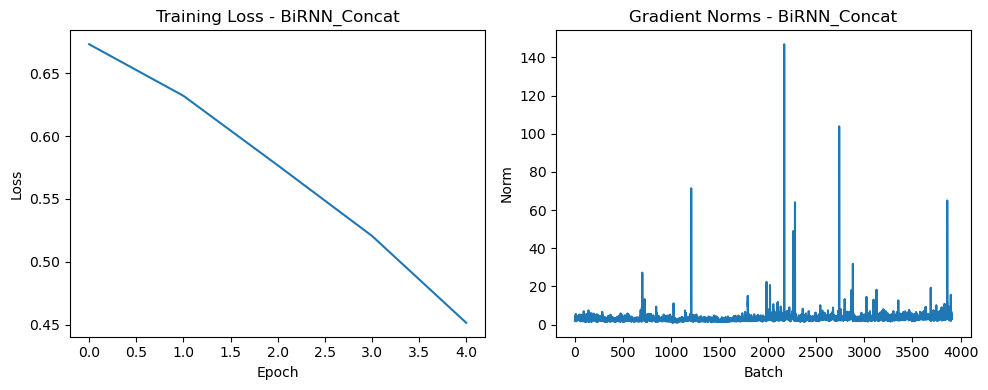

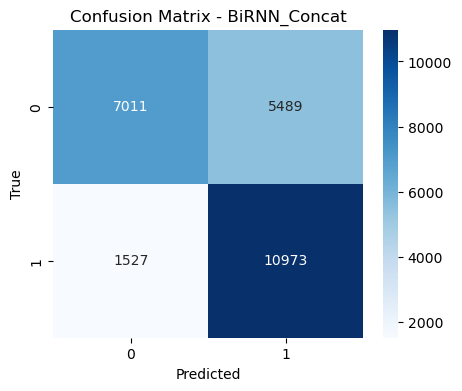

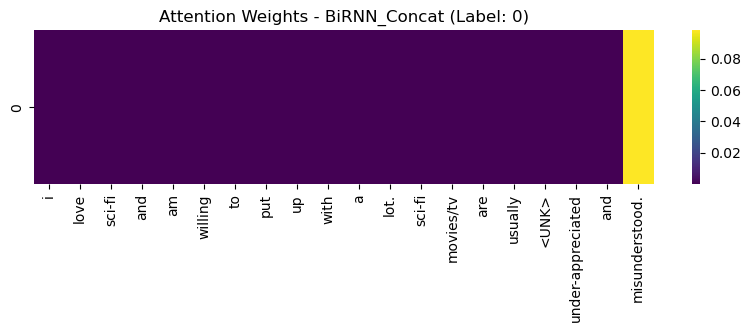

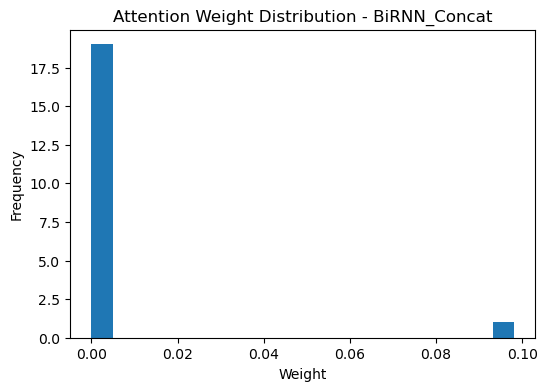


Sample Predictions for BiRNN_Concat:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training BiLSTM...


Epoch 1:   1%|▋                                                    | 10/782 [00:00<00:08, 92.71it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:   4%|██                                                   | 30/782 [00:00<00:08, 89.25it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:   6%|███▎                                                 | 48/782 [00:00<00:08, 88.49it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:   8%|████▍                                                | 66/782 [00:00<00:08, 88.26it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  11%|█████▋                                               | 84/782 [00:00<00:08, 87.16it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  13%|██████▊                                             | 102/782 [00:01<00:07, 86.12it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  15%|███████▉                                            | 120/782 [00:01<00:07, 86.62it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  18%|█████████▏                                          | 138/782 [00:01<00:07, 86.94it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  20%|██████████▎                                         | 156/782 [00:01<00:07, 87.12it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  22%|███████████▌                                        | 174/782 [00:01<00:07, 86.09it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  25%|████████████▊                                       | 192/782 [00:02<00:06, 85.58it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  27%|█████████████▉                                      | 210/782 [00:02<00:06, 86.06it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  29%|███████████████▏                                    | 228/782 [00:02<00:06, 86.57it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  31%|████████████████▎                                   | 246/782 [00:02<00:06, 86.51it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  34%|█████████████████▌                                  | 264/782 [00:03<00:06, 85.70it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  36%|██████████████████▊                                 | 282/782 [00:03<00:05, 85.47it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  38%|███████████████████▉                                | 300/782 [00:03<00:05, 86.06it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  41%|█████████████████████▏                              | 318/782 [00:03<00:05, 86.26it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  43%|██████████████████████▎                             | 336/782 [00:03<00:05, 86.00it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  45%|███████████████████████▌                            | 354/782 [00:04<00:05, 85.21it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  48%|████████████████████████▋                           | 372/782 [00:04<00:04, 85.34it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  50%|█████████████████████████▉                          | 390/782 [00:04<00:04, 85.77it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  52%|███████████████████████████▏                        | 408/782 [00:04<00:04, 86.01it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  54%|████████████████████████████▎                       | 426/782 [00:04<00:04, 85.55it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  57%|█████████████████████████████▌                      | 444/782 [00:05<00:03, 85.03it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  59%|██████████████████████████████▋                     | 462/782 [00:05<00:03, 85.29it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  61%|███████████████████████████████▉                    | 480/782 [00:05<00:03, 85.55it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  64%|█████████████████████████████████                   | 498/782 [00:05<00:03, 85.46it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  66%|██████████████████████████████████▎                 | 516/782 [00:05<00:03, 85.18it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  68%|███████████████████████████████████▌                | 534/782 [00:06<00:02, 85.21it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  71%|████████████████████████████████████▋               | 552/782 [00:06<00:02, 85.25it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  73%|█████████████████████████████████████▉              | 570/782 [00:06<00:02, 85.60it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  75%|███████████████████████████████████████             | 588/782 [00:06<00:02, 85.32it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  77%|████████████████████████████████████████▎           | 606/782 [00:07<00:02, 84.99it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  80%|█████████████████████████████████████████▍          | 624/782 [00:07<00:01, 84.92it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  82%|██████████████████████████████████████████▋         | 642/782 [00:07<00:01, 85.06it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  84%|███████████████████████████████████████████▉        | 660/782 [00:07<00:01, 85.26it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  87%|█████████████████████████████████████████████       | 678/782 [00:07<00:01, 85.00it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  89%|██████████████████████████████████████████████▎     | 696/782 [00:08<00:01, 84.79it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  91%|███████████████████████████████████████████████▍    | 714/782 [00:08<00:00, 84.78it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  94%|████████████████████████████████████████████████▋   | 732/782 [00:08<00:00, 84.94it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  96%|█████████████████████████████████████████████████▊  | 750/782 [00:08<00:00, 84.93it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1:  98%|███████████████████████████████████████████████████ | 768/782 [00:08<00:00, 84.73it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 1: 100%|████████████████████████████████████████████████████| 782/782 [00:09<00:00, 85.79it/s]


Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   1%|▌                                                     | 9/782 [00:00<00:08, 86.82it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:   2%|█▏                                                   | 18/782 [00:00<00:08, 85.34it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   3%|█▊                                                   | 27/782 [00:00<00:08, 85.34it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:   5%|██▍                                                  | 36/782 [00:00<00:08, 85.19it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   6%|███                                                  | 45/782 [00:00<00:08, 85.06it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:   7%|███▋                                                 | 54/782 [00:00<00:08, 84.90it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   8%|████▎                                                | 63/782 [00:00<00:08, 84.95it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:   9%|████▉                                                | 72/782 [00:00<00:08, 84.76it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  10%|█████▍                                               | 81/782 [00:00<00:08, 84.80it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  12%|██████                                               | 90/782 [00:01<00:08, 84.88it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  13%|██████▋                                              | 99/782 [00:01<00:08, 84.86it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  14%|███████▏                                            | 108/782 [00:01<00:07, 84.90it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  15%|███████▊                                            | 117/782 [00:01<00:07, 84.81it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  16%|████████▍                                           | 126/782 [00:01<00:07, 84.98it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  17%|████████▉                                           | 135/782 [00:01<00:07, 84.81it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  18%|█████████▌                                          | 144/782 [00:01<00:07, 84.84it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  20%|██████████▏                                         | 153/782 [00:01<00:07, 84.67it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  21%|██████████▊                                         | 162/782 [00:01<00:07, 84.60it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  22%|███████████▎                                        | 171/782 [00:02<00:07, 84.60it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  23%|███████████▉                                        | 180/782 [00:02<00:07, 84.71it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  24%|████████████▌                                       | 189/782 [00:02<00:07, 84.70it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  25%|█████████████▏                                      | 198/782 [00:02<00:06, 84.75it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  26%|█████████████▊                                      | 207/782 [00:02<00:06, 84.88it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  28%|██████████████▎                                     | 216/782 [00:02<00:06, 84.74it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  29%|██████████████▉                                     | 225/782 [00:02<00:06, 84.86it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  30%|███████████████▌                                    | 234/782 [00:02<00:06, 84.72it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  31%|████████████████▏                                   | 243/782 [00:02<00:06, 84.69it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  32%|████████████████▊                                   | 252/782 [00:02<00:06, 84.72it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  33%|█████████████████▎                                  | 261/782 [00:03<00:06, 84.74it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  35%|█████████████████▉                                  | 270/782 [00:03<00:06, 84.86it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  36%|██████████████████▌                                 | 279/782 [00:03<00:05, 84.84it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  37%|███████████████████▏                                | 288/782 [00:03<00:05, 84.77it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  38%|███████████████████▋                                | 297/782 [00:03<00:05, 84.71it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  40%|████████████████████▉                               | 315/782 [00:03<00:05, 84.72it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  43%|██████████████████████▏                             | 333/782 [00:03<00:05, 84.69it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  45%|███████████████████████▎                            | 351/782 [00:04<00:05, 84.91it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  47%|████████████████████████▌                           | 369/782 [00:04<00:04, 84.96it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  49%|█████████████████████████▋                          | 387/782 [00:04<00:04, 84.68it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  52%|██████████████████████████▉                         | 405/782 [00:04<00:04, 84.61it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  54%|████████████████████████████▏                       | 423/782 [00:04<00:04, 84.63it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  56%|█████████████████████████████▎                      | 441/782 [00:05<00:04, 85.00it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  59%|██████████████████████████████▌                     | 459/782 [00:05<00:03, 84.97it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  61%|███████████████████████████████▋                    | 477/782 [00:05<00:03, 84.80it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  63%|████████████████████████████████▉                   | 495/782 [00:05<00:03, 84.75it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  66%|██████████████████████████████████                  | 513/782 [00:06<00:03, 84.74it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  68%|███████████████████████████████████▎                | 531/782 [00:06<00:02, 84.90it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  70%|████████████████████████████████████▌               | 549/782 [00:06<00:02, 84.87it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  73%|█████████████████████████████████████▋              | 567/782 [00:06<00:02, 84.79it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  75%|██████████████████████████████████████▉             | 585/782 [00:06<00:02, 84.70it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  77%|████████████████████████████████████████            | 603/782 [00:07<00:02, 84.66it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  79%|█████████████████████████████████████████▎          | 621/782 [00:07<00:01, 84.67it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  82%|██████████████████████████████████████████▍         | 639/782 [00:07<00:01, 84.62it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  84%|███████████████████████████████████████████▋        | 657/782 [00:07<00:01, 84.66it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  86%|████████████████████████████████████████████▉       | 675/782 [00:07<00:01, 84.61it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  89%|██████████████████████████████████████████████      | 693/782 [00:08<00:01, 84.61it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  91%|███████████████████████████████████████████████▎    | 711/782 [00:08<00:00, 84.75it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  93%|████████████████████████████████████████████████▍   | 729/782 [00:08<00:00, 84.68it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  96%|█████████████████████████████████████████████████▋  | 747/782 [00:08<00:00, 84.60it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2:  98%|██████████████████████████████████████████████████▊ | 765/782 [00:09<00:00, 84.57it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 2: 100%|████████████████████████████████████████████████████| 782/782 [00:09<00:00, 84.77it/s]


Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   1%|▌                                                     | 9/782 [00:00<00:09, 85.59it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:   2%|█▏                                                   | 18/782 [00:00<00:09, 84.71it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   3%|█▊                                                   | 27/782 [00:00<00:08, 84.37it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:   5%|██▍                                                  | 36/782 [00:00<00:08, 84.39it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   6%|███                                                  | 45/782 [00:00<00:08, 84.31it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:   7%|███▋                                                 | 54/782 [00:00<00:08, 84.46it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   8%|████▎                                                | 63/782 [00:00<00:08, 84.54it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:   9%|████▉                                                | 72/782 [00:00<00:08, 84.53it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  10%|█████▍                                               | 81/782 [00:00<00:08, 84.56it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  12%|██████                                               | 90/782 [00:01<00:08, 84.77it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  13%|██████▋                                              | 99/782 [00:01<00:08, 84.76it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  14%|███████▏                                            | 108/782 [00:01<00:07, 84.63it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  15%|███████▊                                            | 117/782 [00:01<00:07, 84.44it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  16%|████████▍                                           | 126/782 [00:01<00:07, 84.49it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  17%|████████▉                                           | 135/782 [00:01<00:07, 84.46it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  18%|█████████▌                                          | 144/782 [00:01<00:07, 84.59it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  20%|██████████▏                                         | 153/782 [00:01<00:07, 84.68it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  22%|███████████▎                                        | 171/782 [00:02<00:07, 84.69it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  24%|████████████▌                                       | 189/782 [00:02<00:07, 84.60it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  26%|█████████████▊                                      | 207/782 [00:02<00:06, 84.47it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  29%|██████████████▉                                     | 225/782 [00:02<00:06, 84.48it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  31%|████████████████▏                                   | 243/782 [00:02<00:06, 84.44it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  33%|█████████████████▎                                  | 261/782 [00:03<00:06, 84.52it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  36%|██████████████████▌                                 | 279/782 [00:03<00:05, 84.80it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  38%|███████████████████▋                                | 297/782 [00:03<00:05, 84.64it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  40%|████████████████████▉                               | 315/782 [00:03<00:05, 84.64it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  43%|██████████████████████▏                             | 333/782 [00:03<00:05, 84.53it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  45%|███████████████████████▎                            | 351/782 [00:04<00:05, 84.59it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  47%|████████████████████████▌                           | 369/782 [00:04<00:04, 84.58it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  49%|█████████████████████████▋                          | 387/782 [00:04<00:04, 84.53it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  52%|██████████████████████████▉                         | 405/782 [00:04<00:04, 84.65it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  54%|████████████████████████████▏                       | 423/782 [00:05<00:04, 84.45it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  56%|█████████████████████████████▎                      | 441/782 [00:05<00:04, 84.59it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  59%|██████████████████████████████▌                     | 459/782 [00:05<00:03, 84.62it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  61%|███████████████████████████████▋                    | 477/782 [00:05<00:03, 84.93it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  63%|████████████████████████████████▉                   | 495/782 [00:05<00:03, 84.98it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  66%|██████████████████████████████████                  | 513/782 [00:06<00:03, 84.84it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  68%|███████████████████████████████████▎                | 531/782 [00:06<00:02, 84.88it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  70%|████████████████████████████████████▌               | 549/782 [00:06<00:02, 84.75it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  73%|█████████████████████████████████████▋              | 567/782 [00:06<00:02, 84.85it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  75%|██████████████████████████████████████▉             | 585/782 [00:06<00:02, 84.78it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  76%|███████████████████████████████████████▍            | 594/782 [00:07<00:02, 84.88it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  78%|████████████████████████████████████████▋           | 612/782 [00:07<00:02, 84.84it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  81%|█████████████████████████████████████████▉          | 630/782 [00:07<00:01, 84.66it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  83%|███████████████████████████████████████████         | 648/782 [00:07<00:01, 84.80it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  85%|████████████████████████████████████████████▎       | 666/782 [00:07<00:01, 84.83it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  87%|█████████████████████████████████████████████▍      | 684/782 [00:08<00:01, 84.85it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  90%|██████████████████████████████████████████████▋     | 702/782 [00:08<00:00, 84.67it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  92%|███████████████████████████████████████████████▉    | 720/782 [00:08<00:00, 84.53it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  94%|█████████████████████████████████████████████████   | 738/782 [00:08<00:00, 84.83it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  97%|██████████████████████████████████████████████████▎ | 756/782 [00:08<00:00, 84.81it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3:  99%|███████████████████████████████████████████████████▍| 774/782 [00:09<00:00, 84.74it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 3: 100%|████████████████████████████████████████████████████| 782/782 [00:09<00:00, 84.66it/s]


Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   1%|▌                                                     | 9/782 [00:00<00:08, 85.90it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:   3%|█▊                                                   | 27/782 [00:00<00:08, 85.01it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:   6%|███                                                  | 45/782 [00:00<00:08, 84.98it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:   8%|████▎                                                | 63/782 [00:00<00:08, 84.71it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  10%|█████▍                                               | 81/782 [00:00<00:08, 84.60it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  13%|██████▋                                              | 99/782 [00:01<00:08, 84.59it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  15%|███████▊                                            | 117/782 [00:01<00:07, 84.73it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  17%|████████▉                                           | 135/782 [00:01<00:07, 84.61it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  20%|██████████▏                                         | 153/782 [00:01<00:07, 84.67it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  22%|███████████▎                                        | 171/782 [00:02<00:07, 84.68it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  24%|████████████▌                                       | 189/782 [00:02<00:07, 84.68it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  26%|█████████████▊                                      | 207/782 [00:02<00:06, 84.71it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  29%|██████████████▉                                     | 225/782 [00:02<00:06, 84.66it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  31%|████████████████▏                                   | 243/782 [00:02<00:06, 84.74it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  33%|█████████████████▎                                  | 261/782 [00:03<00:06, 84.59it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  35%|█████████████████▉                                  | 270/782 [00:03<00:06, 84.49it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  37%|███████████████████▏                                | 288/782 [00:03<00:05, 84.70it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  39%|████████████████████▎                               | 306/782 [00:03<00:05, 84.65it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  41%|█████████████████████▌                              | 324/782 [00:03<00:05, 84.69it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  44%|██████████████████████▋                             | 342/782 [00:04<00:05, 84.52it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  46%|███████████████████████▉                            | 360/782 [00:04<00:04, 84.56it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  48%|█████████████████████████▏                          | 378/782 [00:04<00:04, 84.65it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  51%|██████████████████████████▎                         | 396/782 [00:04<00:04, 84.51it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  53%|███████████████████████████▌                        | 414/782 [00:04<00:04, 84.57it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 84.65it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  58%|█████████████████████████████▉                      | 450/782 [00:05<00:03, 84.73it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  60%|███████████████████████████████                     | 468/782 [00:05<00:03, 84.69it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  62%|████████████████████████████████▎                   | 486/782 [00:05<00:03, 84.74it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  64%|█████████████████████████████████▌                  | 504/782 [00:05<00:03, 84.71it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  67%|██████████████████████████████████▋                 | 522/782 [00:06<00:03, 84.75it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  69%|███████████████████████████████████▉                | 540/782 [00:06<00:02, 84.77it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  71%|█████████████████████████████████████               | 558/782 [00:06<00:02, 84.67it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  74%|██████████████████████████████████████▎             | 576/782 [00:06<00:02, 84.74it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  76%|███████████████████████████████████████▍            | 594/782 [00:07<00:02, 84.61it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  78%|████████████████████████████████████████▋           | 612/782 [00:07<00:02, 84.74it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  79%|█████████████████████████████████████████▎          | 621/782 [00:07<00:01, 84.62it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  82%|██████████████████████████████████████████▍         | 639/782 [00:07<00:01, 84.41it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  84%|███████████████████████████████████████████▋        | 657/782 [00:07<00:01, 84.51it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  86%|████████████████████████████████████████████▉       | 675/782 [00:07<00:01, 84.40it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  89%|██████████████████████████████████████████████      | 693/782 [00:08<00:01, 84.55it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  91%|███████████████████████████████████████████████▎    | 711/782 [00:08<00:00, 84.43it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  93%|████████████████████████████████████████████████▍   | 729/782 [00:08<00:00, 84.47it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  96%|█████████████████████████████████████████████████▋  | 747/782 [00:08<00:00, 84.62it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4:  98%|██████████████████████████████████████████████████▊ | 765/782 [00:09<00:00, 84.70it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 4: 100%|████████████████████████████████████████████████████| 782/782 [00:09<00:00, 84.65it/s]


Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   1%|▌                                                     | 9/782 [00:00<00:09, 85.55it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:   2%|█▏                                                   | 18/782 [00:00<00:09, 84.63it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   3%|█▊                                                   | 27/782 [00:00<00:08, 84.72it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:   5%|██▍                                                  | 36/782 [00:00<00:08, 84.51it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   6%|███                                                  | 45/782 [00:00<00:08, 84.52it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:   7%|███▋                                                 | 54/782 [00:00<00:08, 84.54it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   8%|████▎                                                | 63/782 [00:00<00:08, 84.43it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:   9%|████▉                                                | 72/782 [00:00<00:08, 84.53it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  10%|█████▍                                               | 81/782 [00:00<00:08, 84.46it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  13%|██████▋                                              | 99/782 [00:01<00:08, 84.53it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  15%|███████▊                                            | 117/782 [00:01<00:07, 84.60it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  17%|████████▉                                           | 135/782 [00:01<00:07, 84.76it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  20%|██████████▏                                         | 153/782 [00:01<00:07, 84.58it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  22%|███████████▎                                        | 171/782 [00:02<00:07, 84.46it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  24%|████████████▌                                       | 189/782 [00:02<00:07, 84.33it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  26%|█████████████▊                                      | 207/782 [00:02<00:06, 84.54it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  29%|██████████████▉                                     | 225/782 [00:02<00:06, 84.58it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  30%|███████████████▌                                    | 234/782 [00:02<00:06, 84.63it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  31%|████████████████▏                                   | 243/782 [00:02<00:06, 84.54it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  32%|████████████████▊                                   | 252/782 [00:02<00:06, 84.63it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  35%|█████████████████▉                                  | 270/782 [00:03<00:06, 84.56it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  37%|███████████████████▏                                | 288/782 [00:03<00:05, 84.72it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  39%|████████████████████▎                               | 306/782 [00:03<00:05, 84.80it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  41%|█████████████████████▌                              | 324/782 [00:03<00:05, 84.69it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  44%|██████████████████████▋                             | 342/782 [00:04<00:05, 84.58it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 84.37it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  48%|█████████████████████████▏                          | 378/782 [00:04<00:04, 84.65it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  51%|██████████████████████████▎                         | 396/782 [00:04<00:04, 84.58it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  53%|███████████████████████████▌                        | 414/782 [00:04<00:04, 84.58it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 84.43it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  58%|█████████████████████████████▉                      | 450/782 [00:05<00:03, 84.48it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  60%|███████████████████████████████                     | 468/782 [00:05<00:03, 84.58it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  62%|████████████████████████████████▎                   | 486/782 [00:05<00:03, 84.63it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  64%|█████████████████████████████████▌                  | 504/782 [00:05<00:03, 84.69it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  67%|██████████████████████████████████▋                 | 522/782 [00:06<00:03, 84.39it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  69%|███████████████████████████████████▉                | 540/782 [00:06<00:02, 84.53it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  71%|█████████████████████████████████████               | 558/782 [00:06<00:02, 84.55it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  73%|█████████████████████████████████████▋              | 567/782 [00:06<00:02, 84.49it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  75%|██████████████████████████████████████▉             | 585/782 [00:06<00:02, 84.43it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  77%|████████████████████████████████████████            | 603/782 [00:07<00:02, 84.42it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  79%|█████████████████████████████████████████▎          | 621/782 [00:07<00:01, 84.39it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  82%|██████████████████████████████████████████▍         | 639/782 [00:07<00:01, 84.54it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  84%|███████████████████████████████████████████▋        | 657/782 [00:07<00:01, 84.35it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  86%|████████████████████████████████████████████▉       | 675/782 [00:07<00:01, 84.54it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  89%|██████████████████████████████████████████████      | 693/782 [00:08<00:01, 84.63it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  91%|███████████████████████████████████████████████▎    | 711/782 [00:08<00:00, 84.51it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  93%|████████████████████████████████████████████████▍   | 729/782 [00:08<00:00, 84.43it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  94%|█████████████████████████████████████████████████   | 738/782 [00:08<00:00, 84.50it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5:  97%|██████████████████████████████████████████████████▎ | 756/782 [00:08<00:00, 84.65it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

Epoch 5: 100%|████████████████████████████████████████████████████| 782/782 [00:09<00:00, 84.57it/s]

Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM, Raw output type: <class 'torch.Tensor'>
Model: BiLSTM, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM

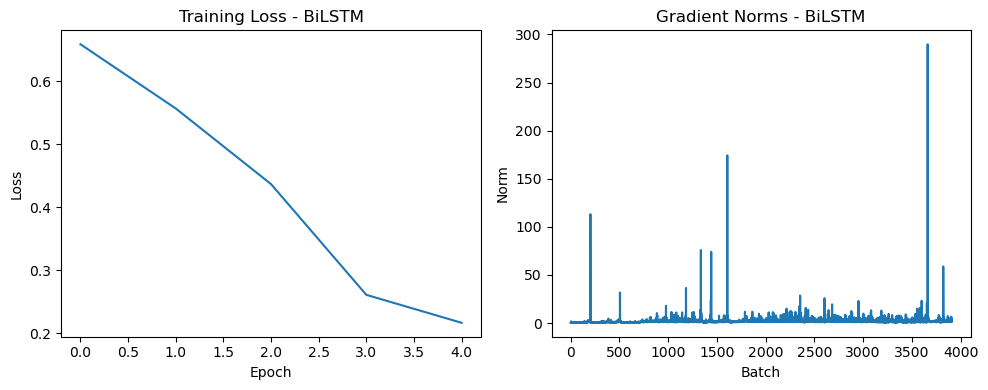

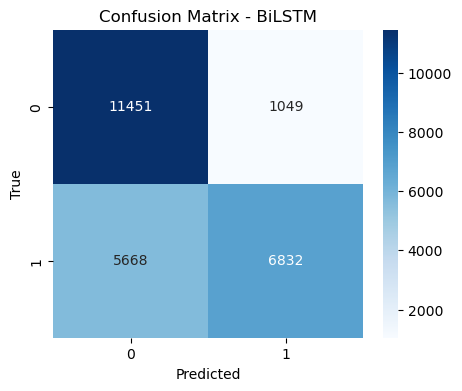


Sample Predictions for BiLSTM:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training BiLSTM_Bahdanau...


Epoch 1:   1%|▌                                                     | 9/782 [00:00<00:09, 81.50it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:   3%|█▊                                                   | 26/782 [00:00<00:09, 77.15it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:   5%|██▊                                                  | 42/782 [00:00<00:09, 76.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:   7%|███▉                                                 | 58/782 [00:00<00:09, 75.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:   9%|█████                                                | 74/782 [00:00<00:09, 74.21it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  12%|██████                                               | 90/782 [00:01<00:09, 74.02it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  14%|███████                                             | 106/782 [00:01<00:09, 74.52it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  16%|████████                                            | 122/782 [00:01<00:08, 74.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  18%|█████████▏                                          | 138/782 [00:01<00:08, 74.64it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  20%|██████████▏                                         | 154/782 [00:02<00:08, 73.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  21%|██████████▊                                         | 162/782 [00:02<00:08, 74.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  22%|███████████▎                                        | 170/782 [00:02<00:08, 74.03it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  23%|███████████▊                                        | 178/782 [00:02<00:08, 74.24it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  24%|████████████▎                                       | 186/782 [00:02<00:08, 74.47it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  25%|████████████▉                                       | 194/782 [00:02<00:07, 74.61it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  26%|█████████████▍                                      | 202/782 [00:02<00:07, 74.82it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  27%|█████████████▉                                      | 210/782 [00:02<00:07, 74.45it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  29%|███████████████                                     | 226/782 [00:03<00:07, 74.05it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  31%|████████████████                                    | 242/782 [00:03<00:07, 74.36it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  33%|█████████████████▏                                  | 258/782 [00:03<00:07, 74.80it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  35%|██████████████████▏                                 | 274/782 [00:03<00:06, 75.29it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  37%|███████████████████▎                                | 290/782 [00:03<00:06, 74.68it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  39%|████████████████████▎                               | 306/782 [00:04<00:06, 74.41it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  41%|█████████████████████▍                              | 322/782 [00:04<00:06, 74.61it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  43%|██████████████████████▍                             | 338/782 [00:04<00:05, 74.84it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  45%|███████████████████████▌                            | 354/782 [00:04<00:05, 74.76it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  47%|████████████████████████▌                           | 370/782 [00:04<00:05, 74.22it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  49%|█████████████████████████▋                          | 386/782 [00:05<00:05, 74.25it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  51%|██████████████████████████▋                         | 402/782 [00:05<00:05, 74.61it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  53%|███████████████████████████▊                        | 418/782 [00:05<00:04, 74.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  55%|████████████████████████████▊                       | 434/782 [00:05<00:04, 74.44it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  57%|█████████████████████████████▍                      | 442/782 [00:05<00:04, 74.26it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  59%|██████████████████████████████▍                     | 458/782 [00:06<00:04, 74.20it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  61%|███████████████████████████████▌                    | 474/782 [00:06<00:04, 74.18it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  63%|████████████████████████████████▌                   | 490/782 [00:06<00:03, 74.21it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  65%|█████████████████████████████████▋                  | 506/782 [00:06<00:03, 74.08it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  67%|██████████████████████████████████▋                 | 522/782 [00:06<00:03, 73.75it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  69%|███████████████████████████████████▊                | 538/782 [00:07<00:03, 73.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  71%|████████████████████████████████████▊               | 554/782 [00:07<00:03, 73.95it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  72%|█████████████████████████████████████▎              | 562/782 [00:07<00:02, 74.11it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  74%|██████████████████████████████████████▍             | 578/782 [00:07<00:02, 74.08it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  76%|███████████████████████████████████████▍            | 594/782 [00:07<00:02, 73.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  78%|████████████████████████████████████████▌           | 610/782 [00:08<00:02, 74.17it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  80%|█████████████████████████████████████████▋          | 626/782 [00:08<00:02, 74.04it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  82%|██████████████████████████████████████████▋         | 642/782 [00:08<00:01, 74.11it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  84%|███████████████████████████████████████████▊        | 658/782 [00:08<00:01, 74.02it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  86%|████████████████████████████████████████████▊       | 674/782 [00:09<00:01, 73.89it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  87%|█████████████████████████████████████████████▎      | 682/782 [00:09<00:01, 73.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  89%|██████████████████████████████████████████████▍     | 698/782 [00:09<00:01, 73.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  91%|███████████████████████████████████████████████▍    | 714/782 [00:09<00:00, 73.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  93%|████████████████████████████████████████████████▌   | 730/782 [00:09<00:00, 73.84it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  95%|█████████████████████████████████████████████████▌  | 746/782 [00:10<00:00, 73.74it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  97%|██████████████████████████████████████████████████▋ | 762/782 [00:10<00:00, 73.70it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1:  99%|███████████████████████████████████████████████████▋| 778/782 [00:10<00:00, 73.57it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 1: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 74.36it/s]


Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 2:   1%|▌                                                     | 8/782 [00:00<00:10, 75.02it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:   3%|█▋                                                   | 24/782 [00:00<00:10, 74.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:   5%|██▋                                                  | 40/782 [00:00<00:10, 73.48it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:   7%|███▊                                                 | 56/782 [00:00<00:09, 73.21it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:   9%|████▉                                                | 72/782 [00:00<00:09, 73.06it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  10%|█████▍                                               | 80/782 [00:01<00:09, 73.33it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  11%|█████▉                                               | 88/782 [00:01<00:09, 73.40it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  12%|██████▌                                              | 96/782 [00:01<00:09, 73.44it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  13%|██████▉                                             | 104/782 [00:01<00:09, 73.45it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  14%|███████▍                                            | 112/782 [00:01<00:09, 73.49it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  16%|████████▌                                           | 128/782 [00:01<00:08, 73.33it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  18%|█████████▌                                          | 144/782 [00:01<00:08, 73.30it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  20%|██████████▋                                         | 160/782 [00:02<00:08, 73.12it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  23%|███████████▋                                        | 176/782 [00:02<00:08, 73.05it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  25%|████████████▊                                       | 192/782 [00:02<00:08, 72.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  26%|█████████████▎                                      | 200/782 [00:02<00:07, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 72.77it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 73.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  29%|██████████████▉                                     | 224/782 [00:03<00:07, 73.19it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 73.09it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 73.06it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  34%|█████████████████▌                                  | 264/782 [00:03<00:07, 73.05it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 72.61it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  38%|███████████████████▋                                | 296/782 [00:04<00:06, 72.78it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 73.20it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 73.12it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  42%|█████████████████████▊                              | 328/782 [00:04<00:06, 73.20it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  43%|██████████████████████▎                             | 336/782 [00:04<00:06, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  44%|██████████████████████▊                             | 344/782 [00:04<00:06, 72.91it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 72.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  47%|████████████████████████▍                           | 368/782 [00:05<00:05, 72.75it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 73.21it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 73.29it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  53%|███████████████████████████▋                        | 416/782 [00:05<00:05, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 72.95it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  56%|█████████████████████████████▎                      | 440/782 [00:06<00:04, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  57%|█████████████████████████████▊                      | 448/782 [00:06<00:04, 73.09it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  58%|██████████████████████████████▎                     | 456/782 [00:06<00:04, 73.17it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 73.11it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:04, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  66%|██████████████████████████████████▌                 | 520/782 [00:07<00:03, 73.14it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 73.08it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:03, 72.84it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 72.67it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 72.76it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  75%|██████████████████████████████████████▊             | 584/782 [00:07<00:02, 72.80it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  76%|███████████████████████████████████████▎            | 592/782 [00:08<00:02, 73.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  78%|████████████████████████████████████████▍           | 608/782 [00:08<00:02, 73.09it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 72.95it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  84%|███████████████████████████████████████████▌        | 656/782 [00:08<00:01, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  86%|████████████████████████████████████████████▋       | 672/782 [00:09<00:01, 73.12it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  87%|█████████████████████████████████████████████▏      | 680/782 [00:09<00:01, 73.03it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 73.19it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 72.85it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 72.72it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  93%|████████████████████████████████████████████████▍   | 728/782 [00:09<00:00, 72.72it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:10<00:00, 73.28it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:10<00:00, 73.22it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 72.91it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 2: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 73.07it/s]


Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 3:   1%|▌                                                     | 8/782 [00:00<00:10, 73.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:   3%|█▋                                                   | 24/782 [00:00<00:10, 73.17it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:   5%|██▋                                                  | 40/782 [00:00<00:10, 73.19it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:   6%|███▎                                                 | 48/782 [00:00<00:10, 73.05it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:   7%|███▊                                                 | 56/782 [00:00<00:09, 72.72it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   8%|████▎                                                | 64/782 [00:00<00:09, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:   9%|████▉                                                | 72/782 [00:00<00:09, 72.66it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  10%|█████▍                                               | 80/782 [00:01<00:09, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  11%|█████▉                                               | 88/782 [00:01<00:09, 72.72it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  12%|██████▌                                              | 96/782 [00:01<00:09, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  13%|██████▉                                             | 104/782 [00:01<00:09, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  14%|███████▍                                            | 112/782 [00:01<00:09, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  16%|████████▌                                           | 128/782 [00:01<00:08, 72.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  18%|█████████▌                                          | 144/782 [00:01<00:08, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  20%|██████████▋                                         | 160/782 [00:02<00:08, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  21%|███████████▏                                        | 168/782 [00:02<00:08, 73.19it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  23%|███████████▋                                        | 176/782 [00:02<00:08, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  24%|████████████▏                                       | 184/782 [00:02<00:08, 73.11it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  25%|████████████▊                                       | 192/782 [00:02<00:08, 72.89it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  26%|█████████████▎                                      | 200/782 [00:02<00:07, 72.86it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 72.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  29%|██████████████▉                                     | 224/782 [00:03<00:07, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 72.82it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 73.10it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  34%|█████████████████▌                                  | 264/782 [00:03<00:07, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 72.78it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  38%|███████████████████▋                                | 296/782 [00:04<00:06, 72.72it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  39%|████████████████████▏                               | 304/782 [00:04<00:06, 72.95it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 73.04it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 73.16it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  42%|█████████████████████▊                              | 328/782 [00:04<00:06, 73.08it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  43%|██████████████████████▎                             | 336/782 [00:04<00:06, 72.84it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  44%|██████████████████████▊                             | 344/782 [00:04<00:06, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 72.95it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  47%|████████████████████████▍                           | 368/782 [00:05<00:05, 72.73it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  52%|███████████████████████████▏                        | 408/782 [00:05<00:05, 72.85it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  53%|███████████████████████████▋                        | 416/782 [00:05<00:05, 72.67it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  56%|█████████████████████████████▎                      | 440/782 [00:06<00:04, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  57%|█████████████████████████████▊                      | 448/782 [00:06<00:04, 73.12it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  58%|██████████████████████████████▎                     | 456/782 [00:06<00:04, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 73.08it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 72.78it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:04, 72.75it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 72.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  66%|██████████████████████████████████▌                 | 520/782 [00:07<00:03, 72.86it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  68%|███████████████████████████████████                 | 528/782 [00:07<00:03, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 72.95it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 72.82it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:03, 72.84it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 73.03it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 72.75it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  75%|██████████████████████████████████████▊             | 584/782 [00:08<00:02, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  76%|███████████████████████████████████████▎            | 592/782 [00:08<00:02, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  78%|████████████████████████████████████████▍           | 608/782 [00:08<00:02, 72.99it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 73.21it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 72.89it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  84%|███████████████████████████████████████████▌        | 656/782 [00:08<00:01, 72.98it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  85%|████████████████████████████████████████████▏       | 664/782 [00:09<00:01, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  86%|████████████████████████████████████████████▋       | 672/782 [00:09<00:01, 73.17it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  87%|█████████████████████████████████████████████▏      | 680/782 [00:09<00:01, 72.96it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 72.96it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 72.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 73.02it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  93%|████████████████████████████████████████████████▍   | 728/782 [00:09<00:00, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:10<00:00, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:10<00:00, 73.04it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 72.86it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 3:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 73.20it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 72.95it/s]


Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   1%|▌                                                     | 8/782 [00:00<00:10, 74.72it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:   2%|█                                                    | 16/782 [00:00<00:10, 73.47it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:   3%|█▋                                                   | 24/782 [00:00<00:10, 73.20it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   4%|██▏                                                  | 32/782 [00:00<00:10, 73.15it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:   5%|██▋                                                  | 40/782 [00:00<00:10, 73.11it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   6%|███▎                                                 | 48/782 [00:00<00:10, 73.03it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:   7%|███▊                                                 | 56/782 [00:00<00:09, 73.02it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   8%|████▎                                                | 64/782 [00:00<00:09, 72.96it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:   9%|████▉                                                | 72/782 [00:00<00:09, 73.01it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  10%|█████▍                                               | 80/782 [00:01<00:09, 73.17it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  11%|█████▉                                               | 88/782 [00:01<00:09, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  12%|██████▌                                              | 96/782 [00:01<00:09, 73.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  13%|██████▉                                             | 104/782 [00:01<00:09, 72.85it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  14%|███████▍                                            | 112/782 [00:01<00:09, 72.99it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  16%|████████▌                                           | 128/782 [00:01<00:08, 72.80it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  17%|█████████                                           | 136/782 [00:01<00:08, 72.67it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  18%|█████████▌                                          | 144/782 [00:01<00:08, 72.68it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  19%|██████████                                          | 152/782 [00:02<00:08, 72.68it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  20%|██████████▋                                         | 160/782 [00:02<00:08, 72.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  21%|███████████▏                                        | 168/782 [00:02<00:08, 72.78it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  23%|███████████▋                                        | 176/782 [00:02<00:08, 72.80it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  24%|████████████▏                                       | 184/782 [00:02<00:08, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  25%|████████████▊                                       | 192/782 [00:02<00:08, 72.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  26%|█████████████▎                                      | 200/782 [00:02<00:08, 72.68it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 72.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  29%|██████████████▉                                     | 224/782 [00:03<00:07, 72.99it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 73.12it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 73.06it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  33%|█████████████████                                   | 256/782 [00:03<00:07, 73.03it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  34%|█████████████████▌                                  | 264/782 [00:03<00:07, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  35%|██████████████████                                  | 272/782 [00:03<00:07, 72.73it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 72.72it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  38%|███████████████████▋                                | 296/782 [00:04<00:06, 72.96it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  39%|████████████████████▏                               | 304/782 [00:04<00:06, 72.85it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 72.98it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 72.99it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  42%|█████████████████████▊                              | 328/782 [00:04<00:06, 73.14it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  43%|██████████████████████▎                             | 336/782 [00:04<00:06, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  44%|██████████████████████▊                             | 344/782 [00:04<00:06, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 72.89it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  47%|████████████████████████▍                           | 368/782 [00:05<00:05, 73.02it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  48%|█████████████████████████                           | 376/782 [00:05<00:05, 72.80it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 72.82it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 73.04it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  52%|███████████████████████████▏                        | 408/782 [00:05<00:05, 72.76it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  53%|███████████████████████████▋                        | 416/782 [00:05<00:05, 73.03it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 72.96it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  56%|█████████████████████████████▎                      | 440/782 [00:06<00:04, 72.77it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  57%|█████████████████████████████▊                      | 448/782 [00:06<00:04, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  58%|██████████████████████████████▎                     | 456/782 [00:06<00:04, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 73.08it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 73.04it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:04, 72.83it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 72.71it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  65%|██████████████████████████████████                  | 512/782 [00:07<00:03, 72.73it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  66%|██████████████████████████████████▌                 | 520/782 [00:07<00:03, 72.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  68%|███████████████████████████████████                 | 528/782 [00:07<00:03, 72.77it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 73.09it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 72.98it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:03, 72.67it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 72.82it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 72.67it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  75%|██████████████████████████████████████▊             | 584/782 [00:08<00:02, 72.91it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  76%|███████████████████████████████████████▎            | 592/782 [00:08<00:02, 72.91it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  78%|████████████████████████████████████████▍           | 608/782 [00:08<00:02, 73.15it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 72.98it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 72.98it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:02, 72.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 72.77it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 72.74it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  84%|███████████████████████████████████████████▌        | 656/782 [00:08<00:01, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  85%|████████████████████████████████████████████▏       | 664/782 [00:09<00:01, 72.91it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  86%|████████████████████████████████████████████▋       | 672/782 [00:09<00:01, 73.24it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  87%|█████████████████████████████████████████████▏      | 680/782 [00:09<00:01, 73.20it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 73.06it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 73.03it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 72.65it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  93%|████████████████████████████████████████████████▍   | 728/782 [00:09<00:00, 72.69it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  94%|████████████████████████████████████████████████▉   | 736/782 [00:10<00:00, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:10<00:00, 73.12it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  96%|██████████████████████████████████████████████████  | 752/782 [00:10<00:00, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:10<00:00, 73.14it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 72.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 4:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 72.82it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 72.91it/s]


Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:   1%|▌                                                     | 8/782 [00:00<00:10, 74.57it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:   2%|█                                                    | 16/782 [00:00<00:10, 73.28it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:   3%|█▋                                                   | 24/782 [00:00<00:10, 73.22it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   4%|██▏                                                  | 32/782 [00:00<00:10, 73.52it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:   5%|██▋                                                  | 40/782 [00:00<00:10, 73.27it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   6%|███▎                                                 | 48/782 [00:00<00:10, 73.31it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:   7%|███▊                                                 | 56/782 [00:00<00:09, 73.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   8%|████▎                                                | 64/782 [00:00<00:09, 72.89it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:   9%|████▉                                                | 72/782 [00:00<00:09, 72.52it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  10%|█████▍                                               | 80/782 [00:01<00:09, 72.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  11%|█████▉                                               | 88/782 [00:01<00:09, 72.58it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  12%|██████▌                                              | 96/782 [00:01<00:09, 72.86it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  13%|██████▉                                             | 104/782 [00:01<00:09, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  14%|███████▍                                            | 112/782 [00:01<00:09, 73.01it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  15%|███████▉                                            | 120/782 [00:01<00:09, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  16%|████████▌                                           | 128/782 [00:01<00:08, 72.82it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  17%|█████████                                           | 136/782 [00:01<00:08, 72.75it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  18%|█████████▌                                          | 144/782 [00:01<00:08, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  19%|██████████                                          | 152/782 [00:02<00:08, 72.85it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  20%|██████████▋                                         | 160/782 [00:02<00:08, 72.71it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  21%|███████████▏                                        | 168/782 [00:02<00:08, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  23%|███████████▋                                        | 176/782 [00:02<00:08, 72.78it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  24%|████████████▏                                       | 184/782 [00:02<00:08, 73.05it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  25%|████████████▊                                       | 192/782 [00:02<00:08, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  26%|█████████████▎                                      | 200/782 [00:02<00:07, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 72.67it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 73.02it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  29%|██████████████▉                                     | 224/782 [00:03<00:07, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 72.96it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 72.96it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  33%|█████████████████                                   | 256/782 [00:03<00:07, 72.99it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  34%|█████████████████▌                                  | 264/782 [00:03<00:07, 72.84it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  35%|██████████████████                                  | 272/782 [00:03<00:07, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  38%|███████████████████▋                                | 296/782 [00:04<00:06, 72.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  39%|████████████████████▏                               | 304/782 [00:04<00:06, 72.96it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 72.80it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 73.04it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  42%|█████████████████████▊                              | 328/782 [00:04<00:06, 72.85it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  43%|██████████████████████▎                             | 336/782 [00:04<00:06, 72.99it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  44%|██████████████████████▊                             | 344/782 [00:04<00:06, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 72.74it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  47%|████████████████████████▍                           | 368/782 [00:05<00:05, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  48%|█████████████████████████                           | 376/782 [00:05<00:05, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  52%|███████████████████████████▏                        | 408/782 [00:05<00:05, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  53%|███████████████████████████▋                        | 416/782 [00:05<00:05, 72.82it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 72.98it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 72.71it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  56%|█████████████████████████████▎                      | 440/782 [00:06<00:04, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  57%|█████████████████████████████▊                      | 448/782 [00:06<00:04, 72.94it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  58%|██████████████████████████████▎                     | 456/782 [00:06<00:04, 73.09it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 72.84it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 73.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:04, 72.99it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:04, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 72.89it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 72.79it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  65%|██████████████████████████████████                  | 512/782 [00:07<00:03, 72.91it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  66%|██████████████████████████████████▌                 | 520/782 [00:07<00:03, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  68%|███████████████████████████████████                 | 528/782 [00:07<00:03, 73.02it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 72.76it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 72.87it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 72.69it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:03, 72.85it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 72.69it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 72.72it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  75%|██████████████████████████████████████▊             | 584/782 [00:08<00:02, 72.67it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  76%|███████████████████████████████████████▎            | 592/782 [00:08<00:02, 72.89it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  77%|███████████████████████████████████████▉            | 600/782 [00:08<00:02, 72.77it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  78%|████████████████████████████████████████▍           | 608/782 [00:08<00:02, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 72.81it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:02, 72.90it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  84%|███████████████████████████████████████████▌        | 656/782 [00:08<00:01, 73.04it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  85%|████████████████████████████████████████████▏       | 664/782 [00:09<00:01, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  86%|████████████████████████████████████████████▋       | 672/782 [00:09<00:01, 72.88it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  87%|█████████████████████████████████████████████▏      | 680/782 [00:09<00:01, 73.00it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 72.97it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 73.16it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 73.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 73.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 73.08it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  93%|████████████████████████████████████████████████▍   | 728/782 [00:09<00:00, 72.99it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  94%|████████████████████████████████████████████████▉   | 736/782 [00:10<00:00, 73.07it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:10<00:00, 72.86it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  96%|██████████████████████████████████████████████████  | 752/782 [00:10<00:00, 72.93it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:10<00:00, 72.73it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 72.92it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output 

Epoch 5:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 72.68it/s]

Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 72.92it/s]


Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Bahdanau, Raw output type: <class 'tuple'>
Model: BiLSTM_Bahdanau, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


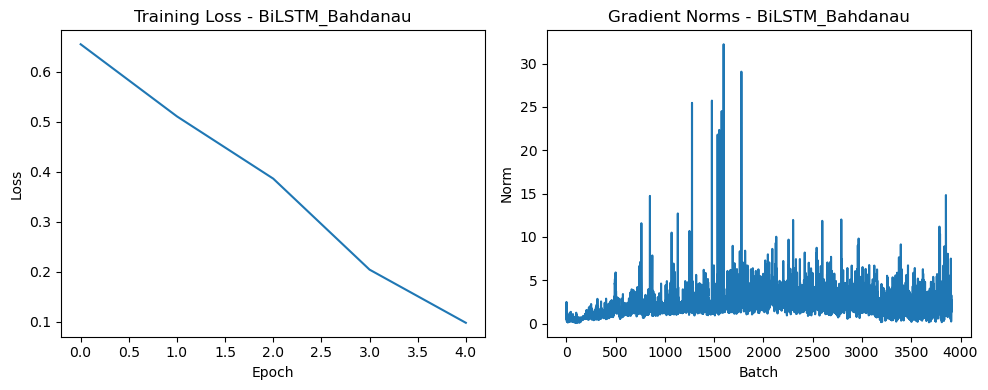

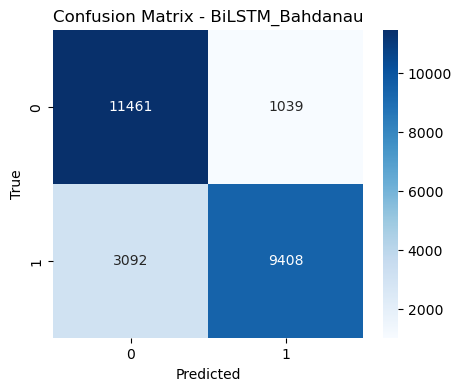

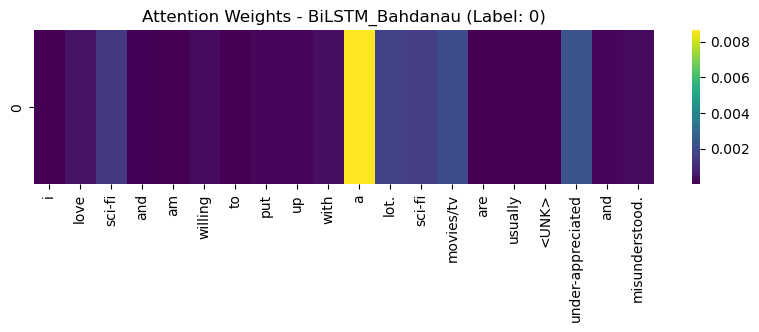

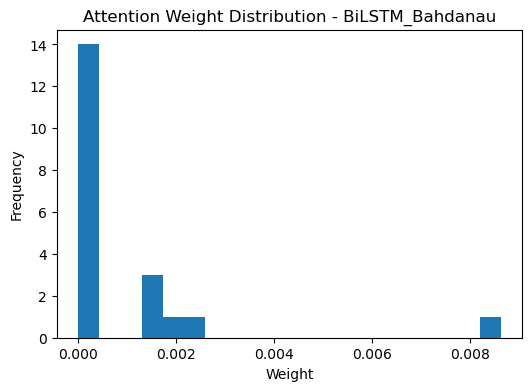


Sample Predictions for BiLSTM_Bahdanau:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training BiLSTM_Dot...


Epoch 1:   1%|▋                                                    | 10/782 [00:00<00:08, 90.11it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:   4%|█▉                                                   | 29/782 [00:00<00:08, 86.51it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:   6%|███▏                                                 | 47/782 [00:00<00:08, 85.78it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:   8%|████▍                                                | 65/782 [00:00<00:08, 85.39it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  11%|█████▋                                               | 83/782 [00:00<00:08, 83.91it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  13%|██████▋                                             | 101/782 [00:01<00:08, 83.27it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  15%|███████▉                                            | 119/782 [00:01<00:07, 84.01it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  18%|█████████                                           | 137/782 [00:01<00:07, 84.39it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  20%|██████████▎                                         | 155/782 [00:01<00:07, 84.24it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  21%|██████████▉                                         | 164/782 [00:01<00:07, 83.51it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  22%|███████████▌                                        | 173/782 [00:02<00:07, 82.99it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  23%|████████████                                        | 182/782 [00:02<00:07, 82.90it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  26%|█████████████▎                                      | 200/782 [00:02<00:06, 83.14it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  28%|██████████████▍                                     | 218/782 [00:02<00:06, 83.74it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  30%|███████████████▋                                    | 236/782 [00:02<00:06, 83.57it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  32%|████████████████▉                                   | 254/782 [00:03<00:06, 82.93it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  35%|██████████████████                                  | 272/782 [00:03<00:06, 82.81it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  37%|███████████████████▎                                | 290/782 [00:03<00:05, 83.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  38%|███████████████████▉                                | 299/782 [00:03<00:05, 83.50it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  39%|████████████████████▍                               | 308/782 [00:03<00:05, 83.54it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  41%|█████████████████████                               | 317/782 [00:03<00:05, 83.33it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  42%|█████████████████████▋                              | 326/782 [00:03<00:05, 82.96it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  43%|██████████████████████▎                             | 335/782 [00:03<00:05, 82.74it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  45%|███████████████████████▍                            | 353/782 [00:04<00:05, 82.55it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  47%|████████████████████████▋                           | 371/782 [00:04<00:04, 83.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  50%|█████████████████████████▊                          | 389/782 [00:04<00:04, 83.53it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  52%|███████████████████████████                         | 407/782 [00:04<00:04, 82.89it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  54%|████████████████████████████▎                       | 425/782 [00:05<00:04, 82.38it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  57%|█████████████████████████████▍                      | 443/782 [00:05<00:04, 82.55it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  58%|██████████████████████████████                      | 452/782 [00:05<00:03, 82.88it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  59%|██████████████████████████████▋                     | 461/782 [00:05<00:03, 83.01it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  60%|███████████████████████████████▎                    | 470/782 [00:05<00:03, 83.16it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  61%|███████████████████████████████▊                    | 479/782 [00:05<00:03, 83.10it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  62%|████████████████████████████████▍                   | 488/782 [00:05<00:03, 82.78it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  65%|█████████████████████████████████▋                  | 506/782 [00:06<00:03, 82.54it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  67%|██████████████████████████████████▊                 | 524/782 [00:06<00:03, 82.58it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  69%|████████████████████████████████████                | 542/782 [00:06<00:02, 82.98it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  72%|█████████████████████████████████████▏              | 560/782 [00:06<00:02, 83.04it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  74%|██████████████████████████████████████▍             | 578/782 [00:06<00:02, 82.49it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  76%|███████████████████████████████████████▋            | 596/782 [00:07<00:02, 82.28it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  77%|████████████████████████████████████████▏           | 605/782 [00:07<00:02, 82.42it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  79%|████████████████████████████████████████▊           | 614/782 [00:07<00:02, 82.66it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  80%|█████████████████████████████████████████▍          | 623/782 [00:07<00:01, 82.81it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  81%|██████████████████████████████████████████          | 632/782 [00:07<00:01, 82.76it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  82%|██████████████████████████████████████████▌         | 641/782 [00:07<00:01, 82.66it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  84%|███████████████████████████████████████████▊        | 659/782 [00:07<00:01, 82.34it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  87%|█████████████████████████████████████████████       | 677/782 [00:08<00:01, 82.28it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  89%|██████████████████████████████████████████████▏     | 695/782 [00:08<00:01, 82.49it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  91%|███████████████████████████████████████████████▍    | 713/782 [00:08<00:00, 82.53it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  93%|████████████████████████████████████████████████▌   | 731/782 [00:08<00:00, 82.42it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  96%|█████████████████████████████████████████████████▊  | 749/782 [00:09<00:00, 82.36it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  97%|██████████████████████████████████████████████████▍ | 758/782 [00:09<00:00, 82.22it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 1:  98%|███████████████████████████████████████████████████ | 767/782 [00:09<00:00, 82.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1: 100%|████████████████████████████████████████████████████| 782/782 [00:09<00:00, 83.14it/s]


Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   1%|▌                                                     | 9/782 [00:00<00:09, 83.99it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   2%|█▏                                                   | 18/782 [00:00<00:09, 83.07it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   3%|█▊                                                   | 27/782 [00:00<00:09, 82.59it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   5%|██▍                                                  | 36/782 [00:00<00:09, 82.26it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   6%|███                                                  | 45/782 [00:00<00:08, 81.93it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:   7%|███▋                                                 | 54/782 [00:00<00:08, 81.91it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   8%|████▎                                                | 63/782 [00:00<00:08, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  10%|█████▍                                               | 81/782 [00:00<00:08, 81.96it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  13%|██████▋                                              | 99/782 [00:01<00:08, 82.22it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  15%|███████▊                                            | 117/782 [00:01<00:08, 82.00it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  17%|████████▉                                           | 135/782 [00:01<00:07, 82.08it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  18%|█████████▌                                          | 144/782 [00:01<00:07, 82.10it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  20%|██████████▏                                         | 153/782 [00:01<00:07, 82.07it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  21%|██████████▊                                         | 162/782 [00:01<00:07, 82.13it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  22%|███████████▎                                        | 171/782 [00:02<00:07, 82.20it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  23%|███████████▉                                        | 180/782 [00:02<00:07, 82.37it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  24%|████████████▌                                       | 189/782 [00:02<00:07, 82.36it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  25%|█████████████▏                                      | 198/782 [00:02<00:07, 82.29it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  26%|█████████████▊                                      | 207/782 [00:02<00:06, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  28%|██████████████▎                                     | 216/782 [00:02<00:06, 81.96it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  30%|███████████████▌                                    | 234/782 [00:02<00:06, 82.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  32%|████████████████▊                                   | 252/782 [00:03<00:06, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  35%|█████████████████▉                                  | 270/782 [00:03<00:06, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 81.84it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  38%|███████████████████▋                                | 297/782 [00:03<00:05, 81.87it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  39%|████████████████████▎                               | 306/782 [00:03<00:05, 81.90it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  40%|████████████████████▉                               | 315/782 [00:03<00:05, 81.88it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  41%|█████████████████████▌                              | 324/782 [00:03<00:05, 81.70it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  43%|██████████████████████▏                             | 333/782 [00:04<00:05, 81.97it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  44%|██████████████████████▋                             | 342/782 [00:04<00:05, 82.06it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  45%|███████████████████████▎                            | 351/782 [00:04<00:05, 82.14it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 82.29it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  47%|████████████████████████▌                           | 369/782 [00:04<00:05, 82.12it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  49%|█████████████████████████▋                          | 387/782 [00:04<00:04, 82.16it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  52%|██████████████████████████▉                         | 405/782 [00:04<00:04, 81.88it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  54%|████████████████████████████▏                       | 423/782 [00:05<00:04, 82.12it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  56%|█████████████████████████████▎                      | 441/782 [00:05<00:04, 82.28it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  58%|█████████████████████████████▉                      | 450/782 [00:05<00:04, 82.20it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  59%|██████████████████████████████▌                     | 459/782 [00:05<00:03, 82.09it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  60%|███████████████████████████████                     | 468/782 [00:05<00:03, 82.27it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  61%|███████████████████████████████▋                    | 477/782 [00:05<00:03, 82.10it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  62%|████████████████████████████████▎                   | 486/782 [00:05<00:03, 81.97it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  63%|████████████████████████████████▉                   | 495/782 [00:06<00:03, 82.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 82.20it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  66%|██████████████████████████████████                  | 513/782 [00:06<00:03, 82.16it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  67%|██████████████████████████████████▋                 | 522/782 [00:06<00:03, 82.02it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  69%|███████████████████████████████████▉                | 540/782 [00:06<00:02, 82.08it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  71%|█████████████████████████████████████               | 558/782 [00:06<00:02, 82.13it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 82.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  76%|███████████████████████████████████████▍            | 594/782 [00:07<00:02, 82.45it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  77%|████████████████████████████████████████            | 603/782 [00:07<00:02, 82.34it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  78%|████████████████████████████████████████▋           | 612/782 [00:07<00:02, 82.29it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  79%|█████████████████████████████████████████▎          | 621/782 [00:07<00:01, 82.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  81%|█████████████████████████████████████████▉          | 630/782 [00:07<00:01, 81.91it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  82%|██████████████████████████████████████████▍         | 639/782 [00:07<00:01, 82.01it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  83%|███████████████████████████████████████████         | 648/782 [00:07<00:01, 81.96it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  84%|███████████████████████████████████████████▋        | 657/782 [00:08<00:01, 82.23it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  85%|████████████████████████████████████████████▎       | 666/782 [00:08<00:01, 82.36it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  86%|████████████████████████████████████████████▉       | 675/782 [00:08<00:01, 82.41it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  89%|██████████████████████████████████████████████      | 693/782 [00:08<00:01, 82.38it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  91%|███████████████████████████████████████████████▎    | 711/782 [00:08<00:00, 81.85it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  93%|████████████████████████████████████████████████▍   | 729/782 [00:08<00:00, 82.01it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  96%|█████████████████████████████████████████████████▋  | 747/782 [00:09<00:00, 82.26it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  97%|██████████████████████████████████████████████████▎ | 756/782 [00:09<00:00, 82.16it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 2:  98%|██████████████████████████████████████████████████▊ | 765/782 [00:09<00:00, 82.43it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  99%|███████████████████████████████████████████████████▍| 774/782 [00:09<00:00, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   1%|▌                                                     | 9/782 [00:00<00:09, 82.63it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   2%|█▏                                                   | 18/782 [00:00<00:09, 81.93it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   3%|█▊                                                   | 27/782 [00:00<00:09, 82.24it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   5%|██▍                                                  | 36/782 [00:00<00:09, 82.25it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   6%|███                                                  | 45/782 [00:00<00:08, 82.33it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:   7%|███▋                                                 | 54/782 [00:00<00:08, 82.36it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   8%|████▎                                                | 63/782 [00:00<00:08, 82.61it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  10%|█████▍                                               | 81/782 [00:00<00:08, 82.02it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  13%|██████▋                                              | 99/782 [00:01<00:08, 81.85it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  15%|███████▊                                            | 117/782 [00:01<00:08, 82.09it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  17%|████████▉                                           | 135/782 [00:01<00:07, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  18%|█████████▌                                          | 144/782 [00:01<00:07, 82.46it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  20%|██████████▏                                         | 153/782 [00:01<00:07, 82.31it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  21%|██████████▊                                         | 162/782 [00:01<00:07, 81.89it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  22%|███████████▎                                        | 171/782 [00:02<00:07, 81.74it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  23%|███████████▉                                        | 180/782 [00:02<00:07, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  24%|████████████▌                                       | 189/782 [00:02<00:07, 82.18it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  25%|█████████████▏                                      | 198/782 [00:02<00:07, 82.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  26%|█████████████▊                                      | 207/782 [00:02<00:07, 81.89it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  28%|██████████████▎                                     | 216/782 [00:02<00:06, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  30%|███████████████▌                                    | 234/782 [00:02<00:06, 82.09it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  32%|████████████████▊                                   | 252/782 [00:03<00:06, 81.52it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  35%|█████████████████▉                                  | 270/782 [00:03<00:06, 81.88it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 82.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  38%|███████████████████▋                                | 297/782 [00:03<00:05, 82.00it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  39%|████████████████████▎                               | 306/782 [00:03<00:05, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  40%|████████████████████▉                               | 315/782 [00:03<00:05, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  41%|█████████████████████▌                              | 324/782 [00:03<00:05, 81.66it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  43%|██████████████████████▏                             | 333/782 [00:04<00:05, 81.72it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  44%|██████████████████████▋                             | 342/782 [00:04<00:05, 81.77it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  45%|███████████████████████▎                            | 351/782 [00:04<00:05, 81.65it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 82.09it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  47%|████████████████████████▌                           | 369/782 [00:04<00:05, 82.22it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  49%|█████████████████████████▋                          | 387/782 [00:04<00:04, 82.30it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  52%|██████████████████████████▉                         | 405/782 [00:04<00:04, 81.85it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  54%|████████████████████████████▏                       | 423/782 [00:05<00:04, 81.63it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  56%|█████████████████████████████▎                      | 441/782 [00:05<00:04, 81.99it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  58%|█████████████████████████████▉                      | 450/782 [00:05<00:04, 82.20it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  59%|██████████████████████████████▌                     | 459/782 [00:05<00:03, 82.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  60%|███████████████████████████████                     | 468/782 [00:05<00:03, 82.35it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  61%|███████████████████████████████▋                    | 477/782 [00:05<00:03, 82.30it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  62%|████████████████████████████████▎                   | 486/782 [00:05<00:03, 82.09it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  63%|████████████████████████████████▉                   | 495/782 [00:06<00:03, 81.94it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 81.76it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  66%|██████████████████████████████████                  | 513/782 [00:06<00:03, 81.81it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  67%|██████████████████████████████████▋                 | 522/782 [00:06<00:03, 82.18it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  69%|███████████████████████████████████▉                | 540/782 [00:06<00:02, 82.08it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  71%|█████████████████████████████████████               | 558/782 [00:06<00:02, 82.40it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 81.92it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  76%|███████████████████████████████████████▍            | 594/782 [00:07<00:02, 81.68it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  77%|████████████████████████████████████████            | 603/782 [00:07<00:02, 82.07it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  78%|████████████████████████████████████████▋           | 612/782 [00:07<00:02, 81.89it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  79%|█████████████████████████████████████████▎          | 621/782 [00:07<00:01, 82.06it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  81%|█████████████████████████████████████████▉          | 630/782 [00:07<00:01, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  82%|██████████████████████████████████████████▍         | 639/782 [00:07<00:01, 82.18it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  83%|███████████████████████████████████████████         | 648/782 [00:07<00:01, 81.96it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  84%|███████████████████████████████████████████▋        | 657/782 [00:08<00:01, 82.04it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  85%|████████████████████████████████████████████▎       | 666/782 [00:08<00:01, 81.75it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  86%|████████████████████████████████████████████▉       | 675/782 [00:08<00:01, 81.77it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  89%|██████████████████████████████████████████████      | 693/782 [00:08<00:01, 82.09it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  91%|███████████████████████████████████████████████▎    | 711/782 [00:08<00:00, 82.33it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  93%|████████████████████████████████████████████████▍   | 729/782 [00:08<00:00, 82.25it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  96%|█████████████████████████████████████████████████▋  | 747/782 [00:09<00:00, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  97%|██████████████████████████████████████████████████▎ | 756/782 [00:09<00:00, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 3:  98%|██████████████████████████████████████████████████▊ | 765/782 [00:09<00:00, 82.11it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  99%|███████████████████████████████████████████████████▍| 774/782 [00:09<00:00, 82.28it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   1%|▌                                                     | 9/782 [00:00<00:09, 82.55it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   2%|█▏                                                   | 18/782 [00:00<00:09, 82.65it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   3%|█▊                                                   | 27/782 [00:00<00:09, 82.41it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   5%|██▍                                                  | 36/782 [00:00<00:09, 82.04it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   6%|███                                                  | 45/782 [00:00<00:08, 82.05it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:   7%|███▋                                                 | 54/782 [00:00<00:08, 82.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   8%|████▎                                                | 63/782 [00:00<00:08, 82.34it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  10%|█████▍                                               | 81/782 [00:00<00:08, 82.21it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  13%|██████▋                                              | 99/782 [00:01<00:08, 82.25it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  15%|███████▊                                            | 117/782 [00:01<00:08, 81.83it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  17%|████████▉                                           | 135/782 [00:01<00:07, 82.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  18%|█████████▌                                          | 144/782 [00:01<00:07, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  20%|██████████▏                                         | 153/782 [00:01<00:07, 82.11it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  21%|██████████▊                                         | 162/782 [00:01<00:07, 82.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  22%|███████████▎                                        | 171/782 [00:02<00:07, 82.22it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  23%|███████████▉                                        | 180/782 [00:02<00:07, 82.28it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  24%|████████████▌                                       | 189/782 [00:02<00:07, 82.00it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  25%|█████████████▏                                      | 198/782 [00:02<00:07, 81.77it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  26%|█████████████▊                                      | 207/782 [00:02<00:07, 81.81it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  28%|██████████████▎                                     | 216/782 [00:02<00:06, 82.20it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  30%|███████████████▌                                    | 234/782 [00:02<00:06, 81.98it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  32%|████████████████▊                                   | 252/782 [00:03<00:06, 82.21it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  35%|█████████████████▉                                  | 270/782 [00:03<00:06, 81.76it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 81.68it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  38%|███████████████████▋                                | 297/782 [00:03<00:05, 81.82it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  39%|████████████████████▎                               | 306/782 [00:03<00:05, 82.00it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  40%|████████████████████▉                               | 315/782 [00:03<00:05, 82.11it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  41%|█████████████████████▌                              | 324/782 [00:03<00:05, 82.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  43%|██████████████████████▏                             | 333/782 [00:04<00:05, 82.40it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  44%|██████████████████████▋                             | 342/782 [00:04<00:05, 82.08it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  45%|███████████████████████▎                            | 351/782 [00:04<00:05, 82.00it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 81.76it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  47%|████████████████████████▌                           | 369/782 [00:04<00:05, 81.66it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  49%|█████████████████████████▋                          | 387/782 [00:04<00:04, 81.91it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  52%|██████████████████████████▉                         | 405/782 [00:04<00:04, 82.32it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  54%|████████████████████████████▏                       | 423/782 [00:05<00:04, 82.34it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  56%|█████████████████████████████▎                      | 441/782 [00:05<00:04, 81.99it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  58%|█████████████████████████████▉                      | 450/782 [00:05<00:04, 81.91it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  59%|██████████████████████████████▌                     | 459/782 [00:05<00:03, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  60%|███████████████████████████████                     | 468/782 [00:05<00:03, 82.03it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  61%|███████████████████████████████▋                    | 477/782 [00:05<00:03, 81.86it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  62%|████████████████████████████████▎                   | 486/782 [00:05<00:03, 82.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  63%|████████████████████████████████▉                   | 495/782 [00:06<00:03, 82.23it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 82.16it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  66%|██████████████████████████████████                  | 513/782 [00:06<00:03, 82.11it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  67%|██████████████████████████████████▋                 | 522/782 [00:06<00:03, 81.98it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  69%|███████████████████████████████████▉                | 540/782 [00:06<00:02, 82.14it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  71%|█████████████████████████████████████               | 558/782 [00:06<00:02, 82.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 82.41it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  76%|███████████████████████████████████████▍            | 594/782 [00:07<00:02, 81.97it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  77%|████████████████████████████████████████            | 603/782 [00:07<00:02, 81.78it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  78%|████████████████████████████████████████▋           | 612/782 [00:07<00:02, 81.66it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  79%|█████████████████████████████████████████▎          | 621/782 [00:07<00:01, 81.82it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  81%|█████████████████████████████████████████▉          | 630/782 [00:07<00:01, 81.90it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  82%|██████████████████████████████████████████▍         | 639/782 [00:07<00:01, 81.81it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  83%|███████████████████████████████████████████         | 648/782 [00:07<00:01, 82.09it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  84%|███████████████████████████████████████████▋        | 657/782 [00:08<00:01, 82.21it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  85%|████████████████████████████████████████████▎       | 666/782 [00:08<00:01, 82.12it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  86%|████████████████████████████████████████████▉       | 675/782 [00:08<00:01, 82.11it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  89%|██████████████████████████████████████████████      | 693/782 [00:08<00:01, 81.83it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  91%|███████████████████████████████████████████████▎    | 711/782 [00:08<00:00, 82.06it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  93%|████████████████████████████████████████████████▍   | 729/782 [00:08<00:00, 82.07it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  96%|█████████████████████████████████████████████████▋  | 747/782 [00:09<00:00, 82.31it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  97%|██████████████████████████████████████████████████▎ | 756/782 [00:09<00:00, 82.10it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 4:  98%|██████████████████████████████████████████████████▊ | 765/782 [00:09<00:00, 82.14it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  99%|███████████████████████████████████████████████████▍| 774/782 [00:09<00:00, 82.02it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   1%|▌                                                     | 9/782 [00:00<00:09, 83.79it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:   2%|█▏                                                   | 18/782 [00:00<00:09, 82.27it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   3%|█▊                                                   | 27/782 [00:00<00:09, 82.11it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:   5%|██▍                                                  | 36/782 [00:00<00:09, 82.17it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   6%|███                                                  | 45/782 [00:00<00:08, 82.31it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:   7%|███▋                                                 | 54/782 [00:00<00:08, 82.28it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   8%|████▎                                                | 63/782 [00:00<00:08, 81.92it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  10%|█████▍                                               | 81/782 [00:00<00:08, 82.26it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  13%|██████▋                                              | 99/782 [00:01<00:08, 82.24it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  15%|███████▊                                            | 117/782 [00:01<00:08, 82.27it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  17%|████████▉                                           | 135/782 [00:01<00:07, 82.23it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  18%|█████████▌                                          | 144/782 [00:01<00:07, 81.77it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  20%|██████████▏                                         | 153/782 [00:01<00:07, 81.83it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  21%|██████████▊                                         | 162/782 [00:01<00:07, 82.04it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  22%|███████████▎                                        | 171/782 [00:02<00:07, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  23%|███████████▉                                        | 180/782 [00:02<00:07, 82.11it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  24%|████████████▌                                       | 189/782 [00:02<00:07, 82.10it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  25%|█████████████▏                                      | 198/782 [00:02<00:07, 82.22it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  26%|█████████████▊                                      | 207/782 [00:02<00:06, 82.20it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  28%|██████████████▎                                     | 216/782 [00:02<00:06, 81.83it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  30%|███████████████▌                                    | 234/782 [00:02<00:06, 81.68it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  32%|████████████████▊                                   | 252/782 [00:03<00:06, 82.03it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  35%|█████████████████▉                                  | 270/782 [00:03<00:06, 82.15it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  37%|███████████████████▏                                | 288/782 [00:03<00:05, 82.40it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  38%|███████████████████▋                                | 297/782 [00:03<00:05, 82.12it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  39%|████████████████████▎                               | 306/782 [00:03<00:05, 81.93it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  40%|████████████████████▉                               | 315/782 [00:03<00:05, 81.99it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  41%|█████████████████████▌                              | 324/782 [00:03<00:05, 82.14it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  43%|██████████████████████▏                             | 333/782 [00:04<00:05, 82.10it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  44%|██████████████████████▋                             | 342/782 [00:04<00:05, 82.19it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  45%|███████████████████████▎                            | 351/782 [00:04<00:05, 82.42it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 82.42it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  47%|████████████████████████▌                           | 369/782 [00:04<00:05, 82.24it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  49%|█████████████████████████▋                          | 387/782 [00:04<00:04, 81.68it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  52%|██████████████████████████▉                         | 405/782 [00:04<00:04, 82.00it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  54%|████████████████████████████▏                       | 423/782 [00:05<00:04, 82.03it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  56%|█████████████████████████████▎                      | 441/782 [00:05<00:04, 82.27it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  58%|█████████████████████████████▉                      | 450/782 [00:05<00:04, 82.04it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  59%|██████████████████████████████▌                     | 459/782 [00:05<00:03, 82.01it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  60%|███████████████████████████████                     | 468/782 [00:05<00:03, 81.78it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  61%|███████████████████████████████▋                    | 477/782 [00:05<00:03, 81.95it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  62%|████████████████████████████████▎                   | 486/782 [00:05<00:03, 82.29it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  63%|████████████████████████████████▉                   | 495/782 [00:06<00:03, 82.20it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 82.05it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  66%|██████████████████████████████████                  | 513/782 [00:06<00:03, 82.22it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  67%|██████████████████████████████████▋                 | 522/782 [00:06<00:03, 82.34it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  69%|███████████████████████████████████▉                | 540/782 [00:06<00:02, 81.91it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  71%|█████████████████████████████████████               | 558/782 [00:06<00:02, 82.04it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 82.24it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  76%|███████████████████████████████████████▍            | 594/782 [00:07<00:02, 82.14it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  77%|████████████████████████████████████████            | 603/782 [00:07<00:02, 82.01it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  78%|████████████████████████████████████████▋           | 612/782 [00:07<00:02, 81.81it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  79%|█████████████████████████████████████████▎          | 621/782 [00:07<00:01, 81.62it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  81%|█████████████████████████████████████████▉          | 630/782 [00:07<00:01, 81.76it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  82%|██████████████████████████████████████████▍         | 639/782 [00:07<00:01, 81.86it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  83%|███████████████████████████████████████████         | 648/782 [00:07<00:01, 82.12it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  84%|███████████████████████████████████████████▋        | 657/782 [00:08<00:01, 82.21it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  85%|████████████████████████████████████████████▎       | 666/782 [00:08<00:01, 82.02it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  86%|████████████████████████████████████████████▉       | 675/782 [00:08<00:01, 82.16it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  89%|██████████████████████████████████████████████      | 693/782 [00:08<00:01, 81.99it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  91%|███████████████████████████████████████████████▎    | 711/782 [00:08<00:00, 81.85it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  93%|████████████████████████████████████████████████▍   | 729/782 [00:08<00:00, 82.13it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  96%|█████████████████████████████████████████████████▋  | 747/782 [00:09<00:00, 82.08it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  97%|██████████████████████████████████████████████████▎ | 756/782 [00:09<00:00, 82.08it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5:  98%|██████████████████████████████████████████████████▊ | 765/782 [00:09<00:00, 82.18it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  99%|███████████████████████████████████████████████████▍| 774/782 [00:09<00:00, 82.06it/s]

Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Dot, Raw output type: <class 'tuple'>
Model: BiLSTM_Dot, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model:

Epoch 5: 100%|████████████████████████████████████████████████████| 782/782 [00:09<00:00, 82.07it/s]


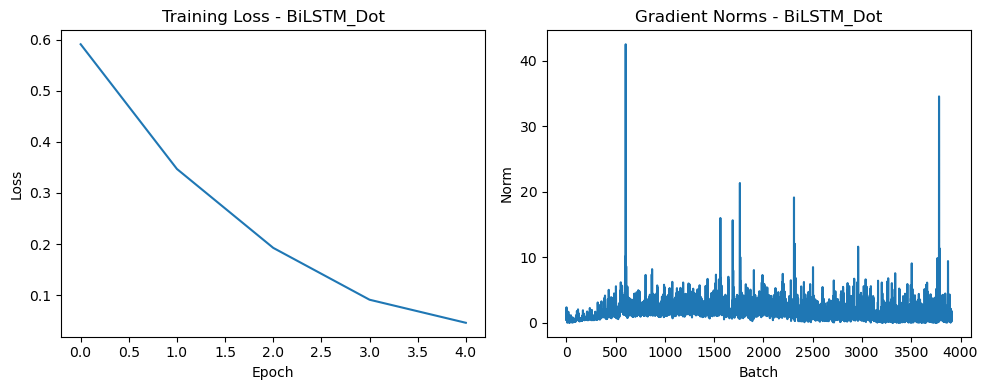

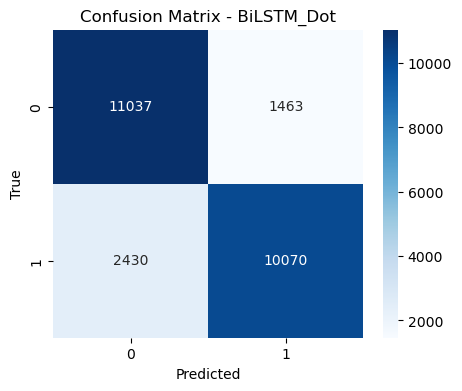

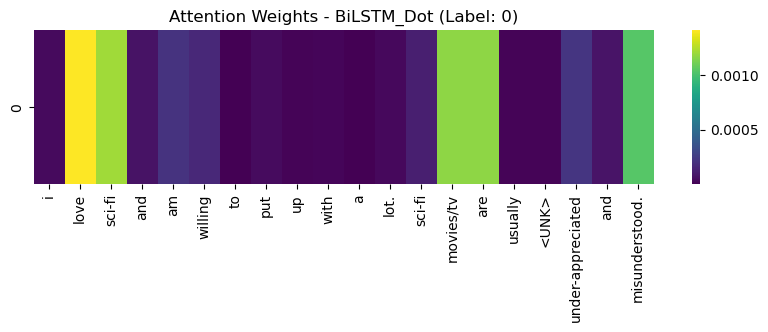

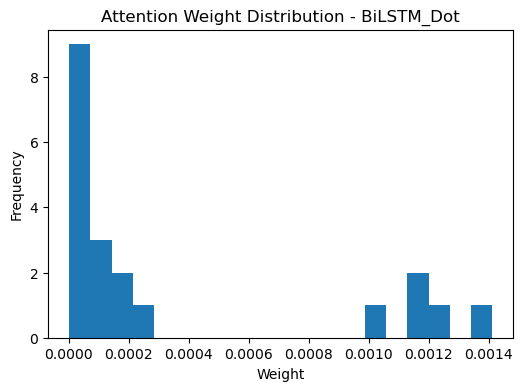


Sample Predictions for BiLSTM_Dot:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training BiLSTM_General...


Epoch 1:   1%|▌                                                     | 9/782 [00:00<00:09, 83.88it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:   3%|█▊                                                   | 27/782 [00:00<00:09, 80.45it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:   6%|██▉                                                  | 44/782 [00:00<00:09, 79.68it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:   8%|████                                                 | 60/782 [00:00<00:09, 79.34it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  10%|█████▏                                               | 76/782 [00:00<00:09, 77.91it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  12%|██████▏                                              | 92/782 [00:01<00:08, 76.90it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  14%|███████▏                                            | 108/782 [00:01<00:08, 77.57it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  16%|████████▏                                           | 124/782 [00:01<00:08, 78.13it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  18%|█████████▎                                          | 140/782 [00:01<00:08, 78.28it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  20%|██████████▎                                         | 156/782 [00:01<00:08, 77.31it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  22%|███████████▍                                        | 172/782 [00:02<00:07, 76.81it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  24%|████████████▌                                       | 188/782 [00:02<00:07, 77.43it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  26%|█████████████▌                                      | 204/782 [00:02<00:07, 77.90it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  28%|██████████████▋                                     | 220/782 [00:02<00:07, 77.77it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  30%|███████████████▋                                    | 236/782 [00:03<00:07, 76.87it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  32%|████████████████▊                                   | 252/782 [00:03<00:06, 76.69it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  34%|█████████████████▊                                  | 268/782 [00:03<00:06, 77.01it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  36%|██████████████████▉                                 | 284/782 [00:03<00:06, 77.61it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  38%|███████████████████▉                                | 300/782 [00:03<00:06, 77.26it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  40%|█████████████████████                               | 316/782 [00:04<00:06, 76.81it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  42%|██████████████████████                              | 332/782 [00:04<00:05, 76.92it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  45%|███████████████████████▏                            | 348/782 [00:04<00:05, 77.11it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  47%|████████████████████████▏                           | 364/782 [00:04<00:05, 77.33it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  49%|█████████████████████████▎                          | 380/782 [00:04<00:05, 76.84it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  51%|██████████████████████████▎                         | 396/782 [00:05<00:05, 76.50it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  53%|███████████████████████████▍                        | 412/782 [00:05<00:04, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  55%|████████████████████████████▍                       | 428/782 [00:05<00:04, 77.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  57%|█████████████████████████████▌                      | 444/782 [00:05<00:04, 76.95it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  59%|██████████████████████████████▌                     | 460/782 [00:05<00:04, 76.83it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  61%|███████████████████████████████▋                    | 476/782 [00:06<00:03, 76.58it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  63%|████████████████████████████████▋                   | 492/782 [00:06<00:03, 76.92it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  65%|█████████████████████████████████▊                  | 508/782 [00:06<00:03, 76.82it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  67%|██████████████████████████████████▊                 | 524/782 [00:06<00:03, 76.75it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  69%|███████████████████████████████████▉                | 540/782 [00:06<00:03, 76.57it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  71%|████████████████████████████████████▉               | 556/782 [00:07<00:02, 76.67it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  73%|██████████████████████████████████████              | 572/782 [00:07<00:02, 76.89it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  75%|███████████████████████████████████████             | 588/782 [00:07<00:02, 76.70it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  77%|████████████████████████████████████████▏           | 604/782 [00:07<00:02, 76.63it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  79%|█████████████████████████████████████████▏          | 620/782 [00:08<00:02, 76.62it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  81%|██████████████████████████████████████████▎         | 636/782 [00:08<00:01, 76.89it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  83%|███████████████████████████████████████████▎        | 652/782 [00:08<00:01, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  85%|████████████████████████████████████████████▍       | 668/782 [00:08<00:01, 76.54it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  87%|█████████████████████████████████████████████▍      | 684/782 [00:08<00:01, 76.22it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  90%|██████████████████████████████████████████████▌     | 700/782 [00:09<00:01, 76.48it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  92%|███████████████████████████████████████████████▌    | 716/782 [00:09<00:00, 76.48it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  94%|████████████████████████████████████████████████▋   | 732/782 [00:09<00:00, 76.29it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  96%|█████████████████████████████████████████████████▋  | 748/782 [00:09<00:00, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1:  98%|██████████████████████████████████████████████████▊ | 764/782 [00:09<00:00, 76.29it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 1: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 77.08it/s]


Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   1%|▌                                                     | 8/782 [00:00<00:09, 78.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:   2%|█                                                    | 16/782 [00:00<00:09, 77.11it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   3%|█▋                                                   | 24/782 [00:00<00:09, 76.68it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:   4%|██▏                                                  | 32/782 [00:00<00:09, 76.40it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   5%|██▋                                                  | 40/782 [00:00<00:09, 76.14it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:   6%|███▎                                                 | 48/782 [00:00<00:09, 75.95it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   7%|███▊                                                 | 56/782 [00:00<00:09, 76.00it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:   8%|████▎                                                | 64/782 [00:00<00:09, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   9%|████▉                                                | 72/782 [00:00<00:09, 76.29it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  10%|█████▍                                               | 80/782 [00:01<00:09, 76.39it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  11%|█████▉                                               | 88/782 [00:01<00:09, 76.22it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  12%|██████▌                                              | 96/782 [00:01<00:08, 76.27it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  13%|██████▉                                             | 104/782 [00:01<00:08, 76.27it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  14%|███████▍                                            | 112/782 [00:01<00:08, 75.95it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  15%|███████▉                                            | 120/782 [00:01<00:08, 75.62it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  16%|████████▌                                           | 128/782 [00:01<00:08, 75.72it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  17%|█████████                                           | 136/782 [00:01<00:08, 76.02it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  18%|█████████▌                                          | 144/782 [00:01<00:08, 76.32it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  19%|██████████                                          | 152/782 [00:01<00:08, 76.05it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  20%|██████████▋                                         | 160/782 [00:02<00:08, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  21%|███████████▏                                        | 168/782 [00:02<00:08, 76.47it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  23%|███████████▋                                        | 176/782 [00:02<00:07, 76.65it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  24%|████████████▏                                       | 184/782 [00:02<00:07, 76.34it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  25%|████████████▊                                       | 192/782 [00:02<00:07, 76.03it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  26%|█████████████▎                                      | 200/782 [00:02<00:07, 75.99it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 76.12it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 76.14it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  29%|██████████████▉                                     | 224/782 [00:02<00:07, 76.12it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 76.28it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 76.46it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  32%|████████████████▍                                   | 248/782 [00:03<00:06, 76.53it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  33%|█████████████████                                   | 256/782 [00:03<00:06, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  34%|█████████████████▌                                  | 264/782 [00:03<00:06, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  35%|██████████████████                                  | 272/782 [00:03<00:06, 75.93it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 75.91it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 75.82it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  38%|███████████████████▋                                | 296/782 [00:03<00:06, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  39%|████████████████████▏                               | 304/782 [00:03<00:06, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 76.28it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 76.56it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  42%|█████████████████████▊                              | 328/782 [00:04<00:05, 76.64it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  43%|██████████████████████▎                             | 336/782 [00:04<00:05, 76.45it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  44%|██████████████████████▊                             | 344/782 [00:04<00:05, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 75.96it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 75.96it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  47%|████████████████████████▍                           | 368/782 [00:04<00:05, 75.97it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  48%|█████████████████████████                           | 376/782 [00:04<00:05, 76.12it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 76.26it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 76.54it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  51%|██████████████████████████▌                         | 400/782 [00:05<00:04, 76.62it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  52%|███████████████████████████▏                        | 408/782 [00:05<00:04, 76.41it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  53%|███████████████████████████▋                        | 416/782 [00:05<00:04, 76.26it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 76.13it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 75.97it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  56%|█████████████████████████████▎                      | 440/782 [00:05<00:04, 75.93it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  57%|█████████████████████████████▊                      | 448/782 [00:05<00:04, 75.99it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  58%|██████████████████████████████▎                     | 456/782 [00:05<00:04, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 76.44it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 76.35it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:03, 76.44it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:03, 76.33it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 76.00it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  65%|██████████████████████████████████                  | 512/782 [00:06<00:03, 75.74it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  66%|██████████████████████████████████▌                 | 520/782 [00:06<00:03, 75.94it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  68%|███████████████████████████████████                 | 528/782 [00:06<00:03, 76.10it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 76.35it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 76.54it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:02, 76.64it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 76.53it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 76.34it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  75%|██████████████████████████████████████▊             | 584/782 [00:07<00:02, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  76%|███████████████████████████████████████▎            | 592/782 [00:07<00:02, 76.02it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  77%|███████████████████████████████████████▉            | 600/782 [00:07<00:02, 75.99it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  78%|████████████████████████████████████████▍           | 608/782 [00:07<00:02, 76.02it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 76.56it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:01, 76.48it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 76.54it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 76.42it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  84%|███████████████████████████████████████████▌        | 656/782 [00:08<00:01, 76.28it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  85%|████████████████████████████████████████████▏       | 664/782 [00:08<00:01, 76.14it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  86%|████████████████████████████████████████████▋       | 672/782 [00:08<00:01, 76.18it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  87%|█████████████████████████████████████████████▏      | 680/782 [00:08<00:01, 76.29it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 76.35it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 76.51it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 76.54it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 76.42it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 76.28it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  93%|████████████████████████████████████████████████▍   | 728/782 [00:09<00:00, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  94%|████████████████████████████████████████████████▉   | 736/782 [00:09<00:00, 75.96it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:09<00:00, 75.99it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  96%|██████████████████████████████████████████████████  | 752/782 [00:09<00:00, 75.94it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:09<00:00, 76.10it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 2:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 76.44it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 76.25it/s]


Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   1%|▌                                                     | 8/782 [00:00<00:09, 77.89it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:   2%|█                                                    | 16/782 [00:00<00:09, 76.88it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   3%|█▋                                                   | 24/782 [00:00<00:09, 76.73it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:   4%|██▏                                                  | 32/782 [00:00<00:09, 76.58it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   5%|██▋                                                  | 40/782 [00:00<00:09, 76.18it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:   6%|███▎                                                 | 48/782 [00:00<00:09, 76.16it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   7%|███▊                                                 | 56/782 [00:00<00:09, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:   8%|████▎                                                | 64/782 [00:00<00:09, 76.46it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:   9%|████▉                                                | 72/782 [00:00<00:09, 76.34it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  10%|█████▍                                               | 80/782 [00:01<00:09, 76.39it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  11%|█████▉                                               | 88/782 [00:01<00:09, 76.45it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  12%|██████▌                                              | 96/782 [00:01<00:08, 76.31it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  13%|██████▉                                             | 104/782 [00:01<00:08, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  14%|███████▍                                            | 112/782 [00:01<00:08, 76.22it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  15%|███████▉                                            | 120/782 [00:01<00:08, 76.10it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  16%|████████▌                                           | 128/782 [00:01<00:08, 76.16it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  17%|█████████                                           | 136/782 [00:01<00:08, 75.94it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  18%|█████████▌                                          | 144/782 [00:01<00:08, 75.98it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  19%|██████████                                          | 152/782 [00:01<00:08, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  20%|██████████▋                                         | 160/782 [00:02<00:08, 76.43it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  21%|███████████▏                                        | 168/782 [00:02<00:08, 76.43it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  23%|███████████▋                                        | 176/782 [00:02<00:07, 76.27it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  24%|████████████▏                                       | 184/782 [00:02<00:07, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  25%|████████████▊                                       | 192/782 [00:02<00:07, 76.08it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  26%|█████████████▎                                      | 200/782 [00:02<00:07, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 76.03it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 76.08it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  29%|██████████████▉                                     | 224/782 [00:02<00:07, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 76.36it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 76.47it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  32%|████████████████▍                                   | 248/782 [00:03<00:06, 76.51it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  33%|█████████████████                                   | 256/782 [00:03<00:06, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  34%|█████████████████▌                                  | 264/782 [00:03<00:06, 76.14it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  35%|██████████████████                                  | 272/782 [00:03<00:06, 76.14it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 76.19it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  38%|███████████████████▋                                | 296/782 [00:03<00:06, 76.10it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  39%|████████████████████▏                               | 304/782 [00:03<00:06, 76.12it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 76.22it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 76.28it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  42%|█████████████████████▊                              | 328/782 [00:04<00:05, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  43%|██████████████████████▎                             | 336/782 [00:04<00:05, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  44%|██████████████████████▊                             | 344/782 [00:04<00:05, 76.05it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 76.03it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  47%|████████████████████████▍                           | 368/782 [00:04<00:05, 76.08it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  48%|█████████████████████████                           | 376/782 [00:04<00:05, 75.98it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 76.02it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  52%|███████████████████████████▏                        | 408/782 [00:05<00:04, 76.11it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  53%|███████████████████████████▋                        | 416/782 [00:05<00:04, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 76.31it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  56%|█████████████████████████████▎                      | 440/782 [00:05<00:04, 75.90it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  57%|█████████████████████████████▊                      | 448/782 [00:05<00:04, 76.04it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  58%|██████████████████████████████▎                     | 456/782 [00:05<00:04, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 76.26it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:03, 76.35it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:03, 76.33it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 76.13it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  65%|██████████████████████████████████                  | 512/782 [00:06<00:03, 76.19it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  66%|██████████████████████████████████▌                 | 520/782 [00:06<00:03, 76.22it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  68%|███████████████████████████████████                 | 528/782 [00:06<00:03, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 76.48it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 76.53it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 76.26it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:02, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 76.16it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 76.16it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  75%|██████████████████████████████████████▊             | 584/782 [00:07<00:02, 76.12it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  76%|███████████████████████████████████████▎            | 592/782 [00:07<00:02, 76.19it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  77%|███████████████████████████████████████▉            | 600/782 [00:07<00:02, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  78%|████████████████████████████████████████▍           | 608/782 [00:07<00:02, 76.49it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 76.35it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:01, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  84%|███████████████████████████████████████████▌        | 656/782 [00:08<00:01, 76.26it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  85%|████████████████████████████████████████████▏       | 664/782 [00:08<00:01, 76.33it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  86%|████████████████████████████████████████████▋       | 672/782 [00:08<00:01, 76.35it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  87%|█████████████████████████████████████████████▏      | 680/782 [00:08<00:01, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 76.44it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 76.45it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 76.22it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 76.28it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  93%|████████████████████████████████████████████████▍   | 728/782 [00:09<00:00, 76.34it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  94%|████████████████████████████████████████████████▉   | 736/782 [00:09<00:00, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:09<00:00, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  96%|██████████████████████████████████████████████████  | 752/782 [00:09<00:00, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:09<00:00, 76.35it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 3:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 76.27it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 3: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 76.26it/s]


Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   1%|▌                                                     | 8/782 [00:00<00:09, 77.53it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   2%|█                                                    | 16/782 [00:00<00:09, 76.90it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   3%|█▋                                                   | 24/782 [00:00<00:09, 76.60it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   4%|██▏                                                  | 32/782 [00:00<00:09, 76.45it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   5%|██▋                                                  | 40/782 [00:00<00:09, 76.29it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   6%|███▎                                                 | 48/782 [00:00<00:09, 76.46it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   7%|███▊                                                 | 56/782 [00:00<00:09, 76.54it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   8%|████▎                                                | 64/782 [00:00<00:09, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:   9%|████▉                                                | 72/782 [00:00<00:09, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  10%|█████▍                                               | 80/782 [00:01<00:09, 76.48it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  11%|█████▉                                               | 88/782 [00:01<00:09, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  12%|██████▌                                              | 96/782 [00:01<00:09, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  13%|██████▉                                             | 104/782 [00:01<00:08, 76.06it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  14%|███████▍                                            | 112/782 [00:01<00:08, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  15%|███████▉                                            | 120/782 [00:01<00:08, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  16%|████████▌                                           | 128/782 [00:01<00:08, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  17%|█████████                                           | 136/782 [00:01<00:08, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  18%|█████████▌                                          | 144/782 [00:01<00:08, 76.26it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  19%|██████████                                          | 152/782 [00:01<00:08, 76.33it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  20%|██████████▋                                         | 160/782 [00:02<00:08, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  21%|███████████▏                                        | 168/782 [00:02<00:08, 76.10it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  23%|███████████▋                                        | 176/782 [00:02<00:07, 76.19it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  24%|████████████▏                                       | 184/782 [00:02<00:07, 76.08it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  25%|████████████▊                                       | 192/782 [00:02<00:07, 76.06it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  26%|█████████████▎                                      | 200/782 [00:02<00:07, 75.85it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 76.01it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 76.40it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  29%|██████████████▉                                     | 224/782 [00:02<00:07, 76.27it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 76.35it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 76.43it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  32%|████████████████▍                                   | 248/782 [00:03<00:06, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  33%|█████████████████                                   | 256/782 [00:03<00:06, 76.32it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  34%|█████████████████▌                                  | 264/782 [00:03<00:06, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  35%|██████████████████                                  | 272/782 [00:03<00:06, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 76.18it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  38%|███████████████████▋                                | 296/782 [00:03<00:06, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  39%|████████████████████▏                               | 304/782 [00:03<00:06, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 76.53it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  42%|█████████████████████▊                              | 328/782 [00:04<00:05, 76.32it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  43%|██████████████████████▎                             | 336/782 [00:04<00:05, 76.32it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  44%|██████████████████████▊                             | 344/782 [00:04<00:05, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 76.13it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  47%|████████████████████████▍                           | 368/782 [00:04<00:05, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  48%|█████████████████████████                           | 376/782 [00:04<00:05, 76.32it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 76.29it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  52%|███████████████████████████▏                        | 408/782 [00:05<00:04, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  53%|███████████████████████████▋                        | 416/782 [00:05<00:04, 76.02it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 76.10it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 76.18it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  56%|█████████████████████████████▎                      | 440/782 [00:05<00:04, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  57%|█████████████████████████████▊                      | 448/782 [00:05<00:04, 75.99it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  58%|██████████████████████████████▎                     | 456/782 [00:05<00:04, 75.90it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:03, 76.02it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:03, 75.95it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  65%|██████████████████████████████████                  | 512/782 [00:06<00:03, 76.29it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  66%|██████████████████████████████████▌                 | 520/782 [00:06<00:03, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  68%|███████████████████████████████████                 | 528/782 [00:06<00:03, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 76.32it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:02, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  75%|██████████████████████████████████████▊             | 584/782 [00:07<00:02, 75.96it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  76%|███████████████████████████████████████▎            | 592/782 [00:07<00:02, 76.07it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  77%|███████████████████████████████████████▉            | 600/782 [00:07<00:02, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  78%|████████████████████████████████████████▍           | 608/782 [00:07<00:02, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 76.32it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 76.34it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:01, 76.40it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  84%|███████████████████████████████████████████▌        | 656/782 [00:08<00:01, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  85%|████████████████████████████████████████████▏       | 664/782 [00:08<00:01, 76.29it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  86%|████████████████████████████████████████████▋       | 672/782 [00:08<00:01, 76.11it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  87%|█████████████████████████████████████████████▏      | 680/782 [00:08<00:01, 76.31it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 76.04it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 76.00it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  93%|████████████████████████████████████████████████▍   | 728/782 [00:09<00:00, 76.31it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  94%|████████████████████████████████████████████████▉   | 736/782 [00:09<00:00, 76.31it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:09<00:00, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  96%|██████████████████████████████████████████████████  | 752/782 [00:09<00:00, 76.50it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:09<00:00, 76.42it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 76.34it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 4: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 76.26it/s]


Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   1%|▌                                                     | 8/782 [00:00<00:10, 77.19it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   2%|█                                                    | 16/782 [00:00<00:09, 76.93it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   3%|█▋                                                   | 24/782 [00:00<00:09, 76.61it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   4%|██▏                                                  | 32/782 [00:00<00:09, 76.39it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   5%|██▋                                                  | 40/782 [00:00<00:09, 76.47it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   6%|███▎                                                 | 48/782 [00:00<00:09, 76.61it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   7%|███▊                                                 | 56/782 [00:00<00:09, 76.48it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   8%|████▎                                                | 64/782 [00:00<00:09, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:   9%|████▉                                                | 72/782 [00:00<00:09, 76.39it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  10%|█████▍                                               | 80/782 [00:01<00:09, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  11%|█████▉                                               | 88/782 [00:01<00:09, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  12%|██████▌                                              | 96/782 [00:01<00:09, 76.07it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  13%|██████▉                                             | 104/782 [00:01<00:08, 76.26it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  14%|███████▍                                            | 112/782 [00:01<00:08, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  15%|███████▉                                            | 120/782 [00:01<00:08, 76.44it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  16%|████████▌                                           | 128/782 [00:01<00:08, 76.39it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  17%|█████████                                           | 136/782 [00:01<00:08, 76.32it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  18%|█████████▌                                          | 144/782 [00:01<00:08, 76.27it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  19%|██████████                                          | 152/782 [00:01<00:08, 76.04it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  20%|██████████▋                                         | 160/782 [00:02<00:08, 75.86it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  21%|███████████▏                                        | 168/782 [00:02<00:08, 75.81it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  23%|███████████▋                                        | 176/782 [00:02<00:07, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  24%|████████████▏                                       | 184/782 [00:02<00:07, 76.33it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  25%|████████████▊                                       | 192/782 [00:02<00:07, 76.28it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  26%|█████████████▎                                      | 200/782 [00:02<00:07, 76.48it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 76.38it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 76.39it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  29%|██████████████▉                                     | 224/782 [00:02<00:07, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 76.13it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 76.05it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  33%|█████████████████                                   | 256/782 [00:03<00:06, 76.08it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  34%|█████████████████▌                                  | 264/782 [00:03<00:06, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  35%|██████████████████                                  | 272/782 [00:03<00:06, 76.39it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 76.27it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  38%|███████████████████▋                                | 296/782 [00:03<00:06, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  39%|████████████████████▏                               | 304/782 [00:03<00:06, 76.12it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 75.96it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 75.80it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  42%|█████████████████████▊                              | 328/782 [00:04<00:05, 75.77it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  43%|██████████████████████▎                             | 336/782 [00:04<00:05, 75.97it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  44%|██████████████████████▊                             | 344/782 [00:04<00:05, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 76.12it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  47%|████████████████████████▍                           | 368/782 [00:04<00:05, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  48%|█████████████████████████                           | 376/782 [00:04<00:05, 76.36it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 75.95it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 75.72it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 75.72it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  52%|███████████████████████████▏                        | 408/782 [00:05<00:04, 75.84it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  53%|███████████████████████████▋                        | 416/782 [00:05<00:04, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  56%|█████████████████████████████▎                      | 440/782 [00:05<00:04, 76.30it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  57%|█████████████████████████████▊                      | 448/782 [00:05<00:04, 76.36it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  58%|██████████████████████████████▎                     | 456/782 [00:05<00:04, 76.18it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 75.96it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 75.76it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:03, 76.13it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:03, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 76.23it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  65%|██████████████████████████████████                  | 512/782 [00:06<00:03, 76.47it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  66%|██████████████████████████████████▌                 | 520/782 [00:06<00:03, 76.60it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  68%|███████████████████████████████████                 | 528/782 [00:06<00:03, 76.57it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 76.33it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 76.05it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 75.96it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:02, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 76.24it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  75%|██████████████████████████████████████▊             | 584/782 [00:07<00:02, 76.25it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  76%|███████████████████████████████████████▎            | 592/782 [00:07<00:02, 76.39it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  77%|███████████████████████████████████████▉            | 600/782 [00:07<00:02, 76.36it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  78%|████████████████████████████████████████▍           | 608/782 [00:07<00:02, 76.17it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 75.91it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 75.69it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:01, 75.90it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 76.09it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 76.15it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  84%|███████████████████████████████████████████▌        | 656/782 [00:08<00:01, 76.10it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  85%|████████████████████████████████████████████▏       | 664/782 [00:08<00:01, 76.19it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  86%|████████████████████████████████████████████▋       | 672/782 [00:08<00:01, 76.40it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  87%|█████████████████████████████████████████████▏      | 680/782 [00:08<00:01, 76.20it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 75.98it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 75.64it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 75.84it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 76.12it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 76.37it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  93%|████████████████████████████████████████████████▍   | 728/782 [00:09<00:00, 76.21it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  94%|████████████████████████████████████████████████▉   | 736/782 [00:09<00:00, 76.51it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:09<00:00, 76.61it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  96%|██████████████████████████████████████████████████  | 752/782 [00:09<00:00, 76.45it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:09<00:00, 76.01it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 75.80it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <

Epoch 5:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 75.75it/s]

Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 76.19it/s]


Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_General, Raw output type: <class 'tuple'>
Model: BiLSTM_General, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


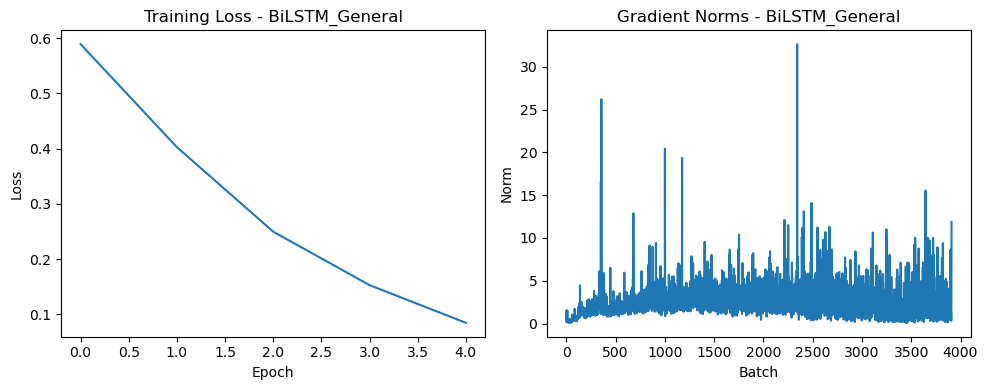

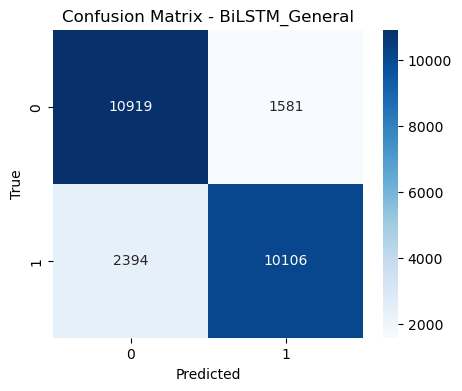

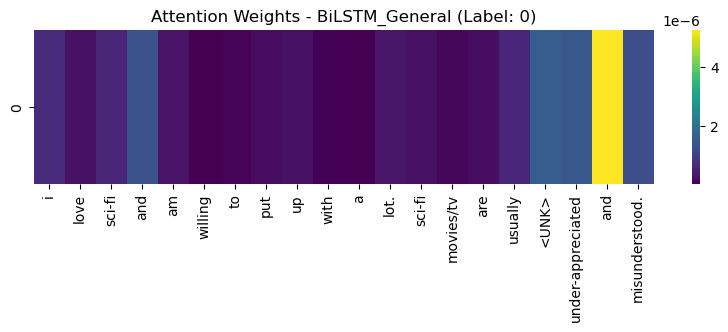

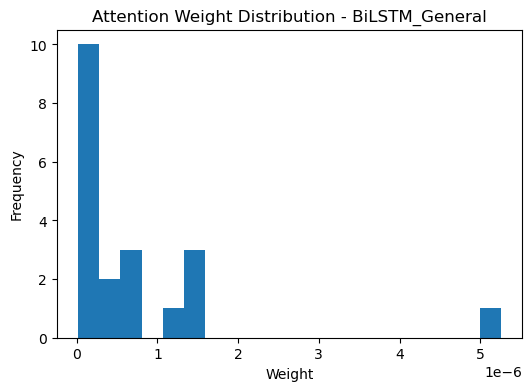


Sample Predictions for BiLSTM_General:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

Training BiLSTM_Concat...


Epoch 1:   1%|▌                                                     | 9/782 [00:00<00:09, 82.15it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:   3%|█▊                                                   | 26/782 [00:00<00:09, 77.00it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:   5%|██▊                                                  | 42/782 [00:00<00:09, 76.02it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:   7%|███▉                                                 | 58/782 [00:00<00:09, 75.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:   9%|█████                                                | 74/782 [00:00<00:09, 74.17it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  12%|██████                                               | 90/782 [00:01<00:09, 73.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  14%|███████                                             | 106/782 [00:01<00:09, 74.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  16%|████████                                            | 122/782 [00:01<00:08, 74.90it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  18%|█████████▏                                          | 138/782 [00:01<00:08, 74.44it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  20%|██████████▏                                         | 154/782 [00:02<00:08, 73.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  21%|██████████▊                                         | 162/782 [00:02<00:08, 73.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  22%|███████████▎                                        | 170/782 [00:02<00:08, 73.84it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  23%|███████████▊                                        | 178/782 [00:02<00:08, 74.01it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  24%|████████████▎                                       | 186/782 [00:02<00:08, 74.20it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  25%|████████████▉                                       | 194/782 [00:02<00:07, 74.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  27%|█████████████▉                                      | 210/782 [00:02<00:07, 74.36it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  29%|███████████████                                     | 226/782 [00:03<00:07, 73.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  31%|████████████████                                    | 242/782 [00:03<00:07, 73.83it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  33%|█████████████████▏                                  | 258/782 [00:03<00:07, 74.46it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  35%|██████████████████▏                                 | 274/782 [00:03<00:06, 74.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  37%|███████████████████▎                                | 290/782 [00:03<00:06, 73.87it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  39%|████████████████████▎                               | 306/782 [00:04<00:06, 73.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  40%|████████████████████▉                               | 314/782 [00:04<00:06, 73.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  41%|█████████████████████▍                              | 322/782 [00:04<00:06, 73.97it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  42%|█████████████████████▉                              | 330/782 [00:04<00:06, 74.26it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  43%|██████████████████████▍                             | 338/782 [00:04<00:05, 74.57it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  44%|███████████████████████                             | 346/782 [00:04<00:05, 74.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  45%|███████████████████████▌                            | 354/782 [00:04<00:05, 74.45it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  46%|████████████████████████                            | 362/782 [00:04<00:05, 74.07it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  47%|████████████████████████▌                           | 370/782 [00:04<00:05, 73.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  48%|█████████████████████████▏                          | 378/782 [00:05<00:05, 73.73it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  50%|██████████████████████████▏                         | 394/782 [00:05<00:05, 73.93it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  52%|███████████████████████████▎                        | 410/782 [00:05<00:05, 74.35it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  54%|████████████████████████████▎                       | 426/782 [00:05<00:04, 74.25it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  57%|█████████████████████████████▍                      | 442/782 [00:05<00:04, 73.41it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  58%|█████████████████████████████▉                      | 450/782 [00:06<00:04, 73.20it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  59%|██████████████████████████████▍                     | 458/782 [00:06<00:04, 73.12it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  60%|██████████████████████████████▉                     | 466/782 [00:06<00:04, 73.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  61%|███████████████████████████████▌                    | 474/782 [00:06<00:04, 73.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  62%|████████████████████████████████                    | 482/782 [00:06<00:04, 73.95it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  63%|████████████████████████████████▌                   | 490/782 [00:06<00:03, 74.09it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  64%|█████████████████████████████████                   | 498/782 [00:06<00:03, 74.17it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  65%|█████████████████████████████████▋                  | 506/782 [00:06<00:03, 73.98it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  66%|██████████████████████████████████▏                 | 514/782 [00:06<00:03, 73.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  68%|███████████████████████████████████▏                | 530/782 [00:07<00:03, 73.54it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  70%|████████████████████████████████████▎               | 546/782 [00:07<00:03, 73.83it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  72%|█████████████████████████████████████▎              | 562/782 [00:07<00:02, 74.14it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  74%|██████████████████████████████████████▍             | 578/782 [00:07<00:02, 73.81it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  76%|███████████████████████████████████████▍            | 594/782 [00:08<00:02, 73.55it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  77%|████████████████████████████████████████            | 602/782 [00:08<00:02, 73.26it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  78%|████████████████████████████████████████▌           | 610/782 [00:08<00:02, 73.31it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  79%|█████████████████████████████████████████           | 618/782 [00:08<00:02, 73.39it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  80%|█████████████████████████████████████████▋          | 626/782 [00:08<00:02, 73.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  81%|██████████████████████████████████████████▏         | 634/782 [00:08<00:02, 73.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  83%|███████████████████████████████████████████▏        | 650/782 [00:08<00:01, 73.16it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  85%|████████████████████████████████████████████▎       | 666/782 [00:08<00:01, 72.90it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  87%|█████████████████████████████████████████████▎      | 682/782 [00:09<00:01, 72.88it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  89%|██████████████████████████████████████████████▍     | 698/782 [00:09<00:01, 73.02it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  91%|███████████████████████████████████████████████▍    | 714/782 [00:09<00:00, 73.23it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  92%|████████████████████████████████████████████████    | 722/782 [00:09<00:00, 73.01it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  93%|████████████████████████████████████████████████▌   | 730/782 [00:09<00:00, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  94%|█████████████████████████████████████████████████   | 738/782 [00:09<00:00, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  95%|█████████████████████████████████████████████████▌  | 746/782 [00:10<00:00, 72.48it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 1:  96%|██████████████████████████████████████████████████▏ | 754/782 [00:10<00:00, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1:  98%|███████████████████████████████████████████████████▏| 770/782 [00:10<00:00, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 1: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 73.88it/s]


Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 2:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:   1%|▌                                                     | 8/782 [00:00<00:10, 74.50it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:   2%|█                                                    | 16/782 [00:00<00:10, 73.18it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:   3%|█▋                                                   | 24/782 [00:00<00:10, 72.87it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:   4%|██▏                                                  | 32/782 [00:00<00:10, 72.61it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:   5%|██▋                                                  | 40/782 [00:00<00:10, 72.59it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   6%|███▎                                                 | 48/782 [00:00<00:10, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:   7%|███▊                                                 | 56/782 [00:00<00:10, 72.39it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:   8%|████▎                                                | 64/782 [00:00<00:09, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:   9%|████▉                                                | 72/782 [00:00<00:09, 72.63it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  10%|█████▍                                               | 80/782 [00:01<00:09, 72.80it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  11%|█████▉                                               | 88/782 [00:01<00:09, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  12%|██████▌                                              | 96/782 [00:01<00:09, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  13%|██████▉                                             | 104/782 [00:01<00:09, 72.55it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  14%|███████▍                                            | 112/782 [00:01<00:09, 72.59it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  15%|███████▉                                            | 120/782 [00:01<00:09, 72.46it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  16%|████████▌                                           | 128/782 [00:01<00:09, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  17%|█████████                                           | 136/782 [00:01<00:08, 72.55it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  18%|█████████▌                                          | 144/782 [00:01<00:08, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  19%|██████████                                          | 152/782 [00:02<00:08, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  20%|██████████▋                                         | 160/782 [00:02<00:08, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  21%|███████████▏                                        | 168/782 [00:02<00:08, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  23%|███████████▋                                        | 176/782 [00:02<00:08, 72.77it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  24%|████████████▏                                       | 184/782 [00:02<00:08, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  25%|████████████▊                                       | 192/782 [00:02<00:08, 72.72it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  26%|█████████████▎                                      | 200/782 [00:02<00:08, 72.72it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 72.87it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  29%|██████████████▉                                     | 224/782 [00:03<00:07, 72.91it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 72.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 72.57it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  33%|█████████████████                                   | 256/782 [00:03<00:07, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  34%|█████████████████▌                                  | 264/782 [00:03<00:07, 72.63it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  35%|██████████████████                                  | 272/782 [00:03<00:07, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 72.63it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  38%|███████████████████▋                                | 296/782 [00:04<00:06, 72.81it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  39%|████████████████████▏                               | 304/782 [00:04<00:06, 72.88it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 72.46it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  42%|█████████████████████▊                              | 328/782 [00:04<00:06, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  43%|██████████████████████▎                             | 336/782 [00:04<00:06, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  44%|██████████████████████▊                             | 344/782 [00:04<00:06, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  47%|████████████████████████▍                           | 368/782 [00:05<00:05, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  48%|█████████████████████████                           | 376/782 [00:05<00:05, 72.96it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 72.94it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 72.73it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 72.90it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  52%|███████████████████████████▏                        | 408/782 [00:05<00:05, 72.85it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  53%|███████████████████████████▋                        | 416/782 [00:05<00:05, 72.85it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 72.86it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  56%|█████████████████████████████▎                      | 440/782 [00:06<00:04, 72.79it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  57%|█████████████████████████████▊                      | 448/782 [00:06<00:04, 72.89it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  58%|██████████████████████████████▎                     | 456/782 [00:06<00:04, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 72.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:04, 72.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:04, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  65%|██████████████████████████████████                  | 512/782 [00:07<00:03, 72.94it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  66%|██████████████████████████████████▌                 | 520/782 [00:07<00:03, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  68%|███████████████████████████████████                 | 528/782 [00:07<00:03, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 72.73it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 72.86it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:03, 72.89it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 72.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  75%|██████████████████████████████████████▊             | 584/782 [00:08<00:02, 72.80it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  76%|███████████████████████████████████████▎            | 592/782 [00:08<00:02, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  77%|███████████████████████████████████████▉            | 600/782 [00:08<00:02, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  78%|████████████████████████████████████████▍           | 608/782 [00:08<00:02, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 72.57it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 72.65it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:02, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 72.81it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 72.83it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  84%|███████████████████████████████████████████▌        | 656/782 [00:09<00:01, 72.94it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  85%|████████████████████████████████████████████▏       | 664/782 [00:09<00:01, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  86%|████████████████████████████████████████████▋       | 672/782 [00:09<00:01, 72.98it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  87%|█████████████████████████████████████████████▏      | 680/782 [00:09<00:01, 72.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 72.88it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 72.70it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 72.87it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 72.82it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  93%|████████████████████████████████████████████████▍   | 728/782 [00:10<00:00, 72.61it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  94%|████████████████████████████████████████████████▉   | 736/782 [00:10<00:00, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:10<00:00, 72.82it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  96%|██████████████████████████████████████████████████  | 752/782 [00:10<00:00, 72.83it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:10<00:00, 72.62it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 72.79it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 2:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 72.73it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 2: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 72.75it/s]


Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 3:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   1%|▌                                                     | 8/782 [00:00<00:10, 74.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   2%|█                                                    | 16/782 [00:00<00:10, 73.19it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   3%|█▋                                                   | 24/782 [00:00<00:10, 73.13it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   4%|██▏                                                  | 32/782 [00:00<00:10, 72.87it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   5%|██▋                                                  | 40/782 [00:00<00:10, 72.98it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   6%|███▎                                                 | 48/782 [00:00<00:10, 72.57it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   7%|███▊                                                 | 56/782 [00:00<00:10, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   8%|████▎                                                | 64/782 [00:00<00:09, 72.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:   9%|████▉                                                | 72/782 [00:00<00:09, 72.88it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  10%|█████▍                                               | 80/782 [00:01<00:09, 72.90it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  11%|█████▉                                               | 88/782 [00:01<00:09, 72.79it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  12%|██████▌                                              | 96/782 [00:01<00:09, 72.85it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  13%|██████▉                                             | 104/782 [00:01<00:09, 72.95it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  14%|███████▍                                            | 112/782 [00:01<00:09, 72.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  15%|███████▉                                            | 120/782 [00:01<00:09, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  16%|████████▌                                           | 128/782 [00:01<00:09, 72.33it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  17%|█████████                                           | 136/782 [00:01<00:08, 72.24it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  18%|█████████▌                                          | 144/782 [00:01<00:08, 72.45it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  19%|██████████                                          | 152/782 [00:02<00:08, 72.57it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  20%|██████████▋                                         | 160/782 [00:02<00:08, 72.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  21%|███████████▏                                        | 168/782 [00:02<00:08, 72.77it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  23%|███████████▋                                        | 176/782 [00:02<00:08, 72.92it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  24%|████████████▏                                       | 184/782 [00:02<00:08, 72.84it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  25%|████████████▊                                       | 192/782 [00:02<00:08, 72.59it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  26%|█████████████▎                                      | 200/782 [00:02<00:08, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 72.50it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  29%|██████████████▉                                     | 224/782 [00:03<00:07, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 72.62it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  33%|█████████████████                                   | 256/782 [00:03<00:07, 72.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  34%|█████████████████▌                                  | 264/782 [00:03<00:07, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  35%|██████████████████                                  | 272/782 [00:03<00:07, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  38%|███████████████████▋                                | 296/782 [00:04<00:06, 72.54it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  39%|████████████████████▏                               | 304/782 [00:04<00:06, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 72.63it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  42%|█████████████████████▊                              | 328/782 [00:04<00:06, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  43%|██████████████████████▎                             | 336/782 [00:04<00:06, 72.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  44%|██████████████████████▊                             | 344/782 [00:04<00:06, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 72.65it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 72.77it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  47%|████████████████████████▍                           | 368/782 [00:05<00:05, 72.63it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  48%|█████████████████████████                           | 376/782 [00:05<00:05, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 72.72it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 72.73it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  52%|███████████████████████████▏                        | 408/782 [00:05<00:05, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  53%|███████████████████████████▋                        | 416/782 [00:05<00:05, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 72.53it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 72.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  56%|█████████████████████████████▎                      | 440/782 [00:06<00:04, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  57%|█████████████████████████████▊                      | 448/782 [00:06<00:04, 72.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  58%|██████████████████████████████▎                     | 456/782 [00:06<00:04, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:04, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:04, 72.43it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  65%|██████████████████████████████████                  | 512/782 [00:07<00:03, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  66%|██████████████████████████████████▌                 | 520/782 [00:07<00:03, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  68%|███████████████████████████████████                 | 528/782 [00:07<00:03, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 72.62it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 72.73it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 72.77it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:03, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  75%|██████████████████████████████████████▊             | 584/782 [00:08<00:02, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  76%|███████████████████████████████████████▎            | 592/782 [00:08<00:02, 72.50it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  77%|███████████████████████████████████████▉            | 600/782 [00:08<00:02, 72.19it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  78%|████████████████████████████████████████▍           | 608/782 [00:08<00:02, 72.13it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 72.22it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 72.31it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:02, 72.32it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 72.42it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  84%|███████████████████████████████████████████▌        | 656/782 [00:09<00:01, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  85%|████████████████████████████████████████████▏       | 664/782 [00:09<00:01, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  86%|████████████████████████████████████████████▋       | 672/782 [00:09<00:01, 72.50it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  87%|█████████████████████████████████████████████▏      | 680/782 [00:09<00:01, 72.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 72.54it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  93%|████████████████████████████████████████████████▍   | 728/782 [00:10<00:00, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  94%|████████████████████████████████████████████████▉   | 736/782 [00:10<00:00, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:10<00:00, 72.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  96%|██████████████████████████████████████████████████  | 752/782 [00:10<00:00, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:10<00:00, 72.80it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 72.80it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 3: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 72.63it/s]


Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 4:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   1%|▌                                                     | 8/782 [00:00<00:10, 74.33it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:   2%|█                                                    | 16/782 [00:00<00:10, 73.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   3%|█▋                                                   | 24/782 [00:00<00:10, 73.08it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:   4%|██▏                                                  | 32/782 [00:00<00:10, 73.05it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:   5%|██▋                                                  | 40/782 [00:00<00:10, 72.92it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:   6%|███▎                                                 | 48/782 [00:00<00:10, 73.01it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:   7%|███▊                                                 | 56/782 [00:00<00:09, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:   8%|████▎                                                | 64/782 [00:00<00:09, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:   9%|████▉                                                | 72/782 [00:00<00:09, 72.31it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  10%|█████▍                                               | 80/782 [00:01<00:09, 72.57it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  11%|█████▉                                               | 88/782 [00:01<00:09, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  12%|██████▌                                              | 96/782 [00:01<00:09, 72.82it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  13%|██████▉                                             | 104/782 [00:01<00:09, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  14%|███████▍                                            | 112/782 [00:01<00:09, 72.81it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  15%|███████▉                                            | 120/782 [00:01<00:09, 72.87it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  16%|████████▌                                           | 128/782 [00:01<00:08, 72.98it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  17%|█████████                                           | 136/782 [00:01<00:08, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  18%|█████████▌                                          | 144/782 [00:01<00:08, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  19%|██████████                                          | 152/782 [00:02<00:08, 72.57it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  20%|██████████▋                                         | 160/782 [00:02<00:08, 72.46it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  21%|███████████▏                                        | 168/782 [00:02<00:08, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  23%|███████████▋                                        | 176/782 [00:02<00:08, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  24%|████████████▏                                       | 184/782 [00:02<00:08, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  25%|████████████▊                                       | 192/782 [00:02<00:08, 72.50it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  26%|█████████████▎                                      | 200/782 [00:02<00:08, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 72.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  29%|██████████████▉                                     | 224/782 [00:03<00:07, 72.62it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 72.77it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  33%|█████████████████                                   | 256/782 [00:03<00:07, 72.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  34%|█████████████████▌                                  | 264/782 [00:03<00:07, 72.81it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  35%|██████████████████                                  | 272/782 [00:03<00:07, 72.82it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 72.82it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 72.48it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  38%|███████████████████▋                                | 296/782 [00:04<00:06, 72.54it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  39%|████████████████████▏                               | 304/782 [00:04<00:06, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 72.65it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  42%|█████████████████████▊                              | 328/782 [00:04<00:06, 72.54it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  43%|██████████████████████▎                             | 336/782 [00:04<00:06, 72.70it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  44%|██████████████████████▊                             | 344/782 [00:04<00:06, 72.86it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  47%|████████████████████████▍                           | 368/782 [00:05<00:05, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  48%|█████████████████████████                           | 376/782 [00:05<00:05, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 72.70it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 72.63it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 72.72it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  52%|███████████████████████████▏                        | 408/782 [00:05<00:05, 72.82it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  53%|███████████████████████████▋                        | 416/782 [00:05<00:05, 72.99it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 72.61it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  56%|█████████████████████████████▎                      | 440/782 [00:06<00:04, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  57%|█████████████████████████████▊                      | 448/782 [00:06<00:04, 72.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  58%|██████████████████████████████▎                     | 456/782 [00:06<00:04, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 72.44it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 72.44it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:04, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:04, 72.69it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 72.48it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  65%|██████████████████████████████████                  | 512/782 [00:07<00:03, 72.55it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  66%|██████████████████████████████████▌                 | 520/782 [00:07<00:03, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  68%|███████████████████████████████████                 | 528/782 [00:07<00:03, 72.54it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 72.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:03, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 72.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  75%|██████████████████████████████████████▊             | 584/782 [00:08<00:02, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  76%|███████████████████████████████████████▎            | 592/782 [00:08<00:02, 72.33it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  77%|███████████████████████████████████████▉            | 600/782 [00:08<00:02, 72.45it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  78%|████████████████████████████████████████▍           | 608/782 [00:08<00:02, 72.61it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 72.63it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 72.88it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:02, 73.00it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 72.73it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 72.91it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  84%|███████████████████████████████████████████▌        | 656/782 [00:09<00:01, 72.59it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  85%|████████████████████████████████████████████▏       | 664/782 [00:09<00:01, 72.31it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  86%|████████████████████████████████████████████▋       | 672/782 [00:09<00:01, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  87%|█████████████████████████████████████████████▏      | 680/782 [00:09<00:01, 72.53it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 72.62it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 72.84it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 72.95it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 72.82it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 72.75it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  93%|████████████████████████████████████████████████▍   | 728/782 [00:10<00:00, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  94%|████████████████████████████████████████████████▉   | 736/782 [00:10<00:00, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:10<00:00, 72.44it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  96%|██████████████████████████████████████████████████  | 752/782 [00:10<00:00, 72.39it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:10<00:00, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 4:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 4: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 72.68it/s]


Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5:   0%|                                                              | 0/782 [00:00<?, ?it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:   1%|▌                                                     | 8/782 [00:00<00:10, 74.24it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:   2%|█                                                    | 16/782 [00:00<00:10, 73.17it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:   3%|█▋                                                   | 24/782 [00:00<00:10, 72.91it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:   4%|██▏                                                  | 32/782 [00:00<00:10, 72.83it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:   5%|██▋                                                  | 40/782 [00:00<00:10, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:   6%|███▎                                                 | 48/782 [00:00<00:10, 72.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:   7%|███▊                                                 | 56/782 [00:00<00:09, 72.71it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:   8%|████▎                                                | 64/782 [00:00<00:09, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:   9%|████▉                                                | 72/782 [00:00<00:09, 72.43it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  10%|█████▍                                               | 80/782 [00:01<00:09, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  11%|█████▉                                               | 88/782 [00:01<00:09, 72.46it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  12%|██████▌                                              | 96/782 [00:01<00:09, 72.42it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  13%|██████▉                                             | 104/782 [00:01<00:09, 72.32it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  14%|███████▍                                            | 112/782 [00:01<00:09, 72.26it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  15%|███████▉                                            | 120/782 [00:01<00:09, 72.48it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  16%|████████▌                                           | 128/782 [00:01<00:09, 72.37it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  17%|█████████                                           | 136/782 [00:01<00:08, 72.50it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  18%|█████████▌                                          | 144/782 [00:01<00:08, 72.40it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  19%|██████████                                          | 152/782 [00:02<00:08, 72.50it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  20%|██████████▋                                         | 160/782 [00:02<00:08, 72.59it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  21%|███████████▏                                        | 168/782 [00:02<00:08, 72.41it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  23%|███████████▋                                        | 176/782 [00:02<00:08, 72.66it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  24%|████████████▏                                       | 184/782 [00:02<00:08, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  25%|████████████▊                                       | 192/782 [00:02<00:08, 72.73it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  26%|█████████████▎                                      | 200/782 [00:02<00:07, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  27%|█████████████▊                                      | 208/782 [00:02<00:07, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  28%|██████████████▎                                     | 216/782 [00:02<00:07, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  29%|██████████████▉                                     | 224/782 [00:03<00:07, 72.65it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  30%|███████████████▍                                    | 232/782 [00:03<00:07, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  31%|███████████████▉                                    | 240/782 [00:03<00:07, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  32%|████████████████▍                                   | 248/782 [00:03<00:07, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  33%|█████████████████                                   | 256/782 [00:03<00:07, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  34%|█████████████████▌                                  | 264/782 [00:03<00:07, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  35%|██████████████████                                  | 272/782 [00:03<00:07, 72.72it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  36%|██████████████████▌                                 | 280/782 [00:03<00:06, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  37%|███████████████████▏                                | 288/782 [00:03<00:06, 72.89it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  38%|███████████████████▋                                | 296/782 [00:04<00:06, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  39%|████████████████████▏                               | 304/782 [00:04<00:06, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  40%|████████████████████▋                               | 312/782 [00:04<00:06, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  41%|█████████████████████▎                              | 320/782 [00:04<00:06, 72.45it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  42%|█████████████████████▊                              | 328/782 [00:04<00:06, 72.48it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  43%|██████████████████████▎                             | 336/782 [00:04<00:06, 72.42it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  44%|██████████████████████▊                             | 344/782 [00:04<00:06, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  45%|███████████████████████▍                            | 352/782 [00:04<00:05, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  46%|███████████████████████▉                            | 360/782 [00:04<00:05, 72.48it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  47%|████████████████████████▍                           | 368/782 [00:05<00:05, 72.54it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  48%|█████████████████████████                           | 376/782 [00:05<00:05, 72.38it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  49%|█████████████████████████▌                          | 384/782 [00:05<00:05, 72.53it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  50%|██████████████████████████                          | 392/782 [00:05<00:05, 72.38it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  51%|██████████████████████████▌                         | 400/782 [00:05<00:05, 72.55it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  52%|███████████████████████████▏                        | 408/782 [00:05<00:05, 72.46it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  53%|███████████████████████████▋                        | 416/782 [00:05<00:05, 72.62it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  54%|████████████████████████████▏                       | 424/782 [00:05<00:04, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  55%|████████████████████████████▋                       | 432/782 [00:05<00:04, 72.57it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  56%|█████████████████████████████▎                      | 440/782 [00:06<00:04, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  57%|█████████████████████████████▊                      | 448/782 [00:06<00:04, 72.45it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  58%|██████████████████████████████▎                     | 456/782 [00:06<00:04, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  59%|██████████████████████████████▊                     | 464/782 [00:06<00:04, 72.61it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  60%|███████████████████████████████▍                    | 472/782 [00:06<00:04, 72.61it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  61%|███████████████████████████████▉                    | 480/782 [00:06<00:04, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  62%|████████████████████████████████▍                   | 488/782 [00:06<00:04, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  63%|████████████████████████████████▉                   | 496/782 [00:06<00:03, 72.40it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  64%|█████████████████████████████████▌                  | 504/782 [00:06<00:03, 72.45it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  65%|██████████████████████████████████                  | 512/782 [00:07<00:03, 72.51it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  66%|██████████████████████████████████▌                 | 520/782 [00:07<00:03, 72.41it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  68%|███████████████████████████████████                 | 528/782 [00:07<00:03, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  69%|███████████████████████████████████▋                | 536/782 [00:07<00:03, 72.53it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  70%|████████████████████████████████████▏               | 544/782 [00:07<00:03, 72.50it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  71%|████████████████████████████████████▋               | 552/782 [00:07<00:03, 72.49it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  72%|█████████████████████████████████████▏              | 560/782 [00:07<00:03, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  73%|█████████████████████████████████████▊              | 568/782 [00:07<00:02, 72.39it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  74%|██████████████████████████████████████▎             | 576/782 [00:07<00:02, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  75%|██████████████████████████████████████▊             | 584/782 [00:08<00:02, 72.58it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  76%|███████████████████████████████████████▎            | 592/782 [00:08<00:02, 72.31it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  77%|███████████████████████████████████████▉            | 600/782 [00:08<00:02, 72.52it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  78%|████████████████████████████████████████▍           | 608/782 [00:08<00:02, 72.36it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  79%|████████████████████████████████████████▉           | 616/782 [00:08<00:02, 72.60it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  80%|█████████████████████████████████████████▍          | 624/782 [00:08<00:02, 72.68it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  81%|██████████████████████████████████████████          | 632/782 [00:08<00:02, 72.86it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  82%|██████████████████████████████████████████▌         | 640/782 [00:08<00:01, 72.59it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  83%|███████████████████████████████████████████         | 648/782 [00:08<00:01, 72.74it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  84%|███████████████████████████████████████████▌        | 656/782 [00:09<00:01, 72.79it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  85%|████████████████████████████████████████████▏       | 664/782 [00:09<00:01, 72.76it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  86%|████████████████████████████████████████████▋       | 672/782 [00:09<00:01, 72.47it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  87%|█████████████████████████████████████████████▏      | 680/782 [00:09<00:01, 72.40it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  88%|█████████████████████████████████████████████▋      | 688/782 [00:09<00:01, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  89%|██████████████████████████████████████████████▎     | 696/782 [00:09<00:01, 72.70it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  90%|██████████████████████████████████████████████▊     | 704/782 [00:09<00:01, 72.56it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  91%|███████████████████████████████████████████████▎    | 712/782 [00:09<00:00, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  92%|███████████████████████████████████████████████▉    | 720/782 [00:09<00:00, 72.63it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])


Epoch 5:  93%|████████████████████████████████████████████████▍   | 728/782 [00:10<00:00, 72.85it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  94%|████████████████████████████████████████████████▉   | 736/782 [00:10<00:00, 72.70it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  95%|█████████████████████████████████████████████████▍  | 744/782 [00:10<00:00, 72.62it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  96%|██████████████████████████████████████████████████  | 752/782 [00:10<00:00, 72.64it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  97%|██████████████████████████████████████████████████▌ | 760/782 [00:10<00:00, 72.78it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  98%|███████████████████████████████████████████████████ | 768/782 [00:10<00:00, 72.67it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.T

Epoch 5:  99%|███████████████████████████████████████████████████▌| 776/782 [00:10<00:00, 72.54it/s]

Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([32, 1])
Model: BiLSTM_Concat, Raw output type: <class 'tuple'>
Model: BiLSTM_Concat, Output tensor type: <class 'torch.Tensor'>, shape: torch.Size([8, 1])


Epoch 5: 100%|████████████████████████████████████████████████████| 782/782 [00:10<00:00, 72.58it/s]


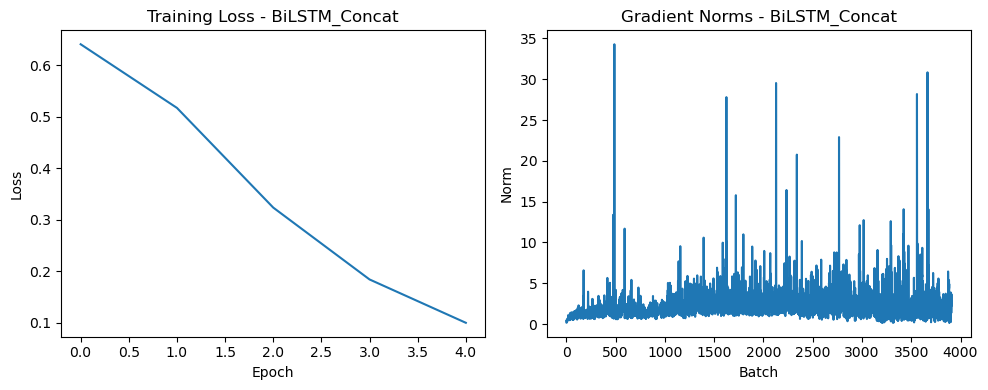

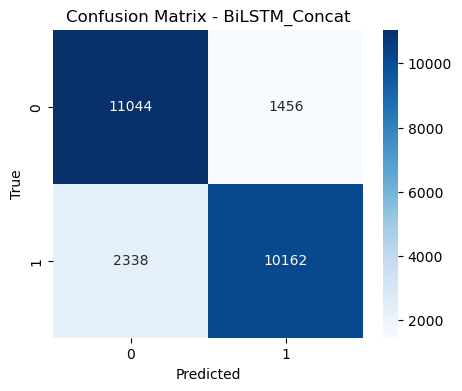

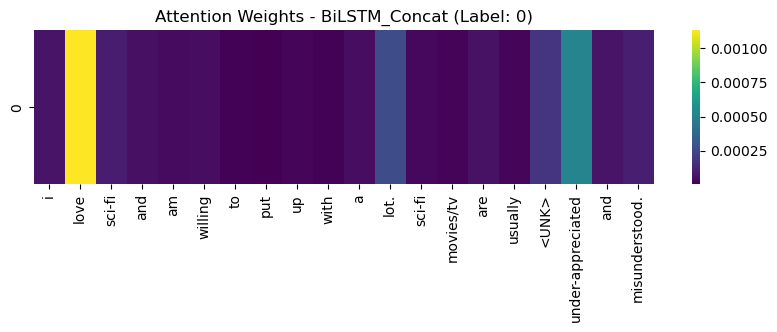

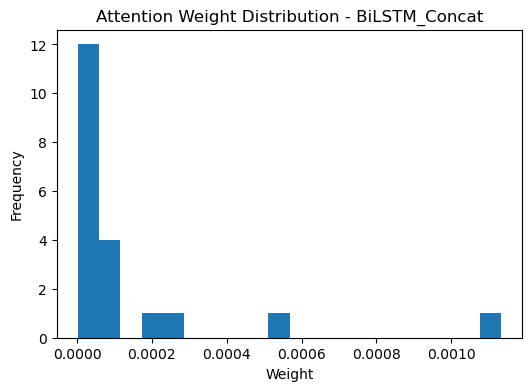


Sample Predictions for BiLSTM_Concat:
Sample 1: i love sci-fi and am willing to put up with a lot. sci-fi movies/tv are usually <UNK> under-apprecia...
True: 0, Pred: 0.0
Sample 2: worth the entertainment value of a rental, especially if you like action movies. this one features t...
True: 0, Pred: 0.0
Sample 3: its a totally average film with a few <UNK> action sequences that make the plot seem a little better...
True: 0, Pred: 0.0

| Model            | Accuracy | F1-Macro | F1-Micro |
|------------------|----------|----------|----------|
| RNN              | 0.4973 | 0.3543 | 0.4973 |
| RNN_Bahdanau     | 0.8074 | 0.8071 | 0.8074 |
| RNN_Dot          | 0.5356 | 0.5158 | 0.5356 |
| RNN_General      | 0.5658 | 0.5613 | 0.5658 |
| RNN_Concat       | 0.8050 | 0.8026 | 0.8050 |
| LSTM             | 0.6681 | 0.6651 | 0.6681 |
| LSTM_Bahdanau    | 0.8404 | 0.8395 | 0.8404 |
| LSTM_Dot         | 0.8452 | 0.8448 | 0.8452 |
| LSTM_General     | 0.8426 | 0.8424 | 0.8426 |
| LSTM_Concat      | 

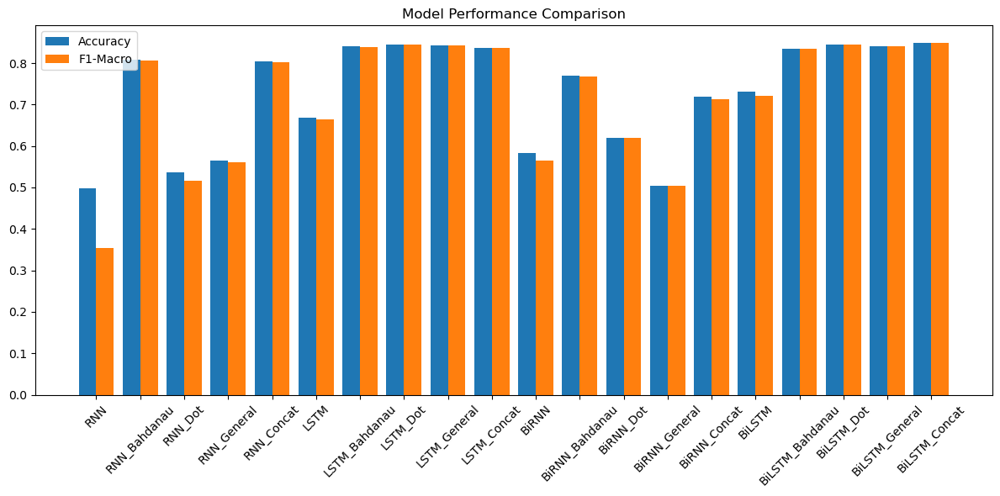

In [27]:
# Hyperparameters
embedding_dim = 100
hidden_dim = 128
output_dim = 1
epochs = 5
lr = 0.001

models = [
    ("RNN", RNNModel(vocab_size, embedding_dim, hidden_dim, output_dim)),
    ("RNN_Bahdanau", RNNWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "bahdanau")),
    ("RNN_Dot", RNNWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_dot")),
    ("RNN_General", RNNWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_general")),
    ("RNN_Concat", RNNWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_concat")),
    ("LSTM", LSTMModel(vocab_size, embedding_dim, hidden_dim, output_dim)),
    ("LSTM_Bahdanau", LSTMWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "bahdanau")),
    ("LSTM_Dot", LSTMWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_dot")),
    ("LSTM_General", LSTMWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_general")),
    ("LSTM_Concat", LSTMWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_concat")),
    ("BiRNN", BidirectionalRNNModel(vocab_size, embedding_dim, hidden_dim, output_dim)),
    ("BiRNN_Bahdanau", BidirectionalRNNWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "bahdanau")),
    ("BiRNN_Dot", BidirectionalRNNWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_dot")),
    ("BiRNN_General", BidirectionalRNNWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_general")),
    ("BiRNN_Concat", BidirectionalRNNWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_concat")),
    ("BiLSTM", BidirectionalLSTMModel(vocab_size, embedding_dim, hidden_dim, output_dim)),
    ("BiLSTM_Bahdanau", BidirectionalLSTMWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "bahdanau")),
    ("BiLSTM_Dot", BidirectionalLSTMWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_dot")),
    ("BiLSTM_General", BidirectionalLSTMWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_general")),
    ("BiLSTM_Concat", BidirectionalLSTMWithAttention(vocab_size, embedding_dim, hidden_dim, output_dim, "luong_concat"))
]

# Debug: Test model outputs
print("\nDebugging model outputs:")
for name, model in models:
    model = model.to(device)
    test_input = torch.randint(0, vocab_size, (32, 500)).to(device)
    output = model(test_input)
    print(f"Model: {name}, Output type: {type(output)}")

all_results = []
for name, model in models:
    print(f"\nTraining {name}...")
    result = train_evaluate(model, name, epochs, lr)
    all_results.append(result)

# Results table
print("\n| Model            | Accuracy | F1-Macro | F1-Micro |")
print("|------------------|----------|----------|----------|")
for r in all_results:
    print(f"| {r['name']:<16} | {r['accuracy']:.4f} | {r['f1_macro']:.4f} | {r['f1_micro']:.4f} |")

# Visualization: Performance comparison
names = [r["name"] for r in all_results]
accs = [r["accuracy"] for r in all_results]
f1_macros = [r["f1_macro"] for r in all_results]
x = np.arange(len(names))
plt.figure(figsize=(12, 6))
plt.bar(x - 0.2, accs, 0.4, label="Accuracy")
plt.bar(x + 0.2, f1_macros, 0.4, label="F1-Macro")
plt.xticks(x, names, rotation=45)
plt.title("Model Performance Comparison")
plt.legend()
plt.tight_layout()
plt.show()

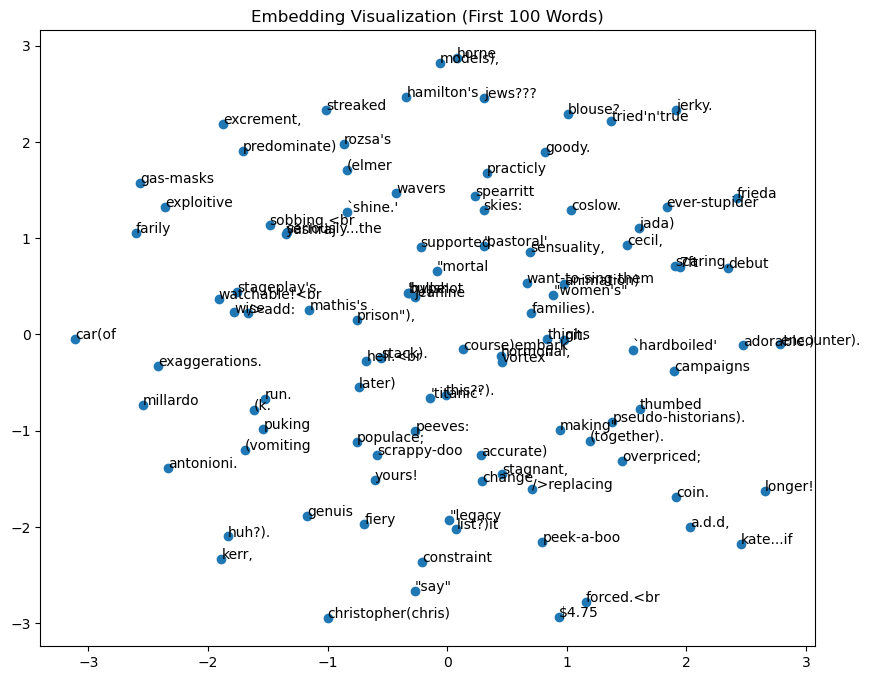

In [28]:
from sklearn.manifold import TSNE

# Visualize embeddings from one model
model = RNNModel(vocab_size, embedding_dim, hidden_dim, output_dim).to(device)
embeddings = model.embedding.weight.data.cpu().numpy()
tsne = TSNE(n_components=2, random_state=42)
embed_2d = tsne.fit_transform(embeddings[:100])
plt.figure(figsize=(10, 8))
plt.scatter(embed_2d[:, 0], embed_2d[:, 1])
for i, word in enumerate(list(word_to_index.keys())[:100]):
    plt.annotate(word, (embed_2d[i, 0], embed_2d[i, 1]))
plt.title("Embedding Visualization (First 100 Words)")
plt.show()